In [ ]:
#different from explore_v0114 by : here canonical are UniProt + TreMBL + ENSP, non-canonical are II_ + IP_
#there canon - UniProt, non-canon IP_

In [2]:
import pandas as pd
import numpy as np
import zipfile
import gzip
import shutil
from Bio import SeqIO
from itertools import chain
import matplotlib.pyplot as plt
import re
from matplotlib_venn import venn2, venn3
import os
import copy
#from Bio.Align import substitution_matrices
#from Bio import Align
#aligner = Align.PairwiseAligner()
#aligner.substitution_matrix = substitution_matrices.load("BLOSUM62")
import glob
from pyteomics import mgf
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pickle
from collections import Counter
import matplotlib.patches as mpatches
import plotly.graph_objects as go
import textwrap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import stats
import regex
from pyteomics import mass
import matplotlib
from matplotlib.collections import PolyCollection
from matplotlib.legend_handler import HandlerTuple

In [66]:
from sklearn.neighbors import KernelDensity
import matplotlib as mpl
import matplotlib.gridspec as grid_spec

In [3]:
project_palette={"canon":"orangered","trembl":"yellowgreen","openprot":"cornflowerblue"}
proteins_palette={"Canonical":"orangered","Non-canonical":"cornflowerblue","Reference isoforms":"yellowgreen","Novel isoforms":"gold"}
project_palette2={"canon":"orangered","trembl":"yellowgreen","openprot":"cornflowerblue",
                "Canon_unique":"salmon", "NonCanon_unique":"skyblue", "Shared":"darkkhaki",
                "Canon":"firebrick","Noncanon":"steelblue","TPP_canon":"lightcoral","TPP_trembl":"greenyellow","TPP_openprot":"paleturquoise",
                  "ionbot_canon":"orangered","ionbot_trembl":"yellowgreen","ionbot_openprot":"cornflowerblue",
                 "TPP_canon_unique":"chocolate",
                  "TPP_noncanon_unique":"plum",
                  "TPP_shared":"tan",
                  "ionbot_canon_unique":"salmon",
                  "ionbot_noncanon_unique":"skyblue",
                  "ionbot_shared":"darkkhaki",
                 "ionbot_canon_unique_OnlyMod":"firebrick",
                 "ionbot_canon_unique_OnlyUnmod":"indianred",
                 "ionbot_canon_unique_Both":"lightcoral",
                 "ionbot_noncanon_unique_OnlyMod":"royalblue",
                 "ionbot_noncanon_unique_OnlyUnmod":"dodgerblue",
                 "ionbot_noncanon_unique_Both":"lightblue",
                 "ionbot_shared_OnlyMod":"olivedrab",
                 "ionbot_shared_OnlyUnmod":"olive",
                 "ionbot_shared_Both":"darkseagreen",}


In [4]:
working_folder = "./fromUGhent_v0114_2/"
#dataset_name = "PXD002057.v0.11.4"

In [8]:
#list my directory tree
import os

def list_files(startpath):
    for root, dirs, files in os.walk(startpath):
        level = root.replace(startpath, '').count(os.sep)
        indent = ' ' * 4 * (level)
        print('{}{}/'.format(indent, os.path.basename(root)))
        subindent = ' ' * 4 * (level + 1)
        for f in files:
            print('{}{}'.format(subindent, f))
list_files(working_folder)

/
    transfer_391125_files_bf98353d.zip
    PXD014258-20241105.tar.gz
    PXD002057-20241105.tar.gz
    PXD003594-20241104.tar.gz
PXD014258.v0.11.4/
    openprot-x-canonical.csv
    ID-rate-plot.png
    Comparison-3-ionbot-features.html
    Comparison-2-merge-ionbot-results.html
    PXD014258.v0.11.4-canon/
        target-decoy-plot.png
        PXD014258.v0.11.4-canon-combined-features.csv
        PXD014258.v0.11.4-canon-combined-filtered-results.csv
        SampleHela/
            ionbot.modifications.csv
            ionbot.meta.csv
            ionbot.stats.csv
            ionbot.first.peptides.csv
            ionbot.features.csv
            flashlfq.tsv
            ionbot.first.csv
            ionbot.first.proteins.csv
        Sample-BT474/
            ionbot.features.csv
            ionbot.modifications.csv
            ionbot.stats.csv
            ionbot.first.proteins.csv
            ionbot.meta.csv
            ionbot.first.csv
            flashlfq.tsv
            ionbot.first.pep

In [5]:
def combine_ionbot(working_folder, dataset_name, db_sufix,file_name):
    #several folders, representing samples, containe ionbot results
    dir=os.path.join(working_folder, dataset_name, f'{dataset_name}{db_sufix}')
    toread=[os.path.join(lvl1[0],file_name) for lvl1 in os.walk(os.path.join(working_folder, dataset_name, f'{dataset_name}{db_sufix}')) if len(lvl1[0].split("/"))==5 and file_name in lvl1[2]]   
    combined=pd.DataFrame()
    print(dir)
    print(toread)
    for file in toread:
        print(file)
        print(file.lstrip(dir).rstrip(file_name))
        a=pd.read_csv(file)
        a['spectrum_file']=file.lstrip(dir).rstrip(file_name)
        combined=pd.concat([combined,a])
    return combined

In [6]:
def load_combined_first(working_folder,dataset_name):
    
    combined_first={"canon":0,"trembl":0,"openprot":0}
    #set path
    canonical_path = os.path.join(working_folder, dataset_name, f'{dataset_name}-canon', 
                              f'{dataset_name}-canon-combined-filtered-results.csv')
    trembl_path    = os.path.join(working_folder, dataset_name, f'{dataset_name}-trembl', 
                                  f'{dataset_name}-trembl-combined-filtered-results.csv')
    openprot_path  = os.path.join(working_folder, dataset_name, f'{dataset_name}-openprot', 
                                  f'{dataset_name}-openprot-combined-filtered-results.csv')
    #load
    patt = re.compile(r'\(.+?\)') #for removing retention time in parentasies
    for path,db in zip([canonical_path,trembl_path,openprot_path],combined_first.keys()):
        df=pd.read_csv(path)
        df['spectrum_file'] = df.spectrum_file.str.replace('.RAW.mgf', '.mgf')
        df['modified_peptide'] = df.matched_peptide + '|' + df.modifications
        df['modifications_noRT'] = df.modifications.str.replace(patt, '', regex=True)
        combined_first[db]=df
    return combined_first

In [ ]:
combined_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
combined_first_datasets["PXD002057.v0.11.4"]=load_combined_first(working_folder,"PXD002057.v0.11.4")
combined_first_datasets["PXD003594.v0.11.4"]=load_combined_first(working_folder,"PXD003594.v0.11.4")
combined_first_datasets["PXD014258.v0.11.4"]=load_combined_first(working_folder,"PXD014258.v0.11.4")

In [9]:
#is it filtered? -no
a=combined_first_datasets["PXD002057.v0.11.4"]["canon"]
len(a.loc[a["q-value"]<0.01,:])/len(a)

0.3854719843936274

In [ ]:
#FDR=d/t
combined_fdr_datasets={"PXD002057.v0.11.4":{},"PXD003594.v0.11.4":{},"PXD014258.v0.11.4":{}}
for dataset_name in combined_first_datasets:
    fdr={"canon":0,"trembl":0,"openprot":0}
    for database in combined_first_datasets[dataset_name]:
        df=combined_first_datasets[dataset_name][database]
        fdr[database]=len(df.loc[df["database"]=="D","psm_score"])/len(df.loc[df["database"]=="T","psm_score"])
    combined_fdr_datasets[dataset_name][database]=fdr

In [11]:
combined_fdr_datasets

{'PXD002057.v0.11.4': {'openprot': {'canon': 0.37736975668010153,
   'trembl': 0.3366465408204663,
   'openprot': 0.3527473547428996}},
 'PXD003594.v0.11.4': {'openprot': {'canon': 0.3019512538743308,
   'trembl': 0.327525500957904,
   'openprot': 0.3710355854072187}},
 'PXD014258.v0.11.4': {'openprot': {'canon': 0.17644908925678612,
   'trembl': 0.18249648399911175,
   'openprot': 0.19819656465168706}}}

In [ ]:
#filtered data by q-value, filter contominants by leadprot
for dataset_name in combined_first_datasets:
    for database in combined_first_datasets[dataset_name]:
        df=combined_first_datasets[dataset_name][database]
        df1=df.loc[df["q-value"]<0.01,:]
        df1=df1.loc[~((df1["proteins"].str.contains("CONTAMINANT")) | (df1["proteins"].str.contains("contaminant")))]
        combined_first_datasets[dataset_name][database]=df1

In [14]:
#is it filtered? -yes
a=combined_first_datasets["PXD002057.v0.11.4"]["canon"]
len(a.loc[a["q-value"]<0.01,:])/len(a)

1.0

In [15]:
#no contominants
a.loc[((a["proteins"].str.contains("CONTAMINANT")) | (a["proteins"].str.contains("contaminant")))]

,ionbot_match_id,spectrum_title,scan,spectrum_file,precursor_mass,peptide_mass,observed_retention_time,charge,database_peptide,matched_peptide,...,unexpected_modification,database,psm_score,q-value,PEP,proteins,experiment,leadprot,modified_peptide,modifications_noRT


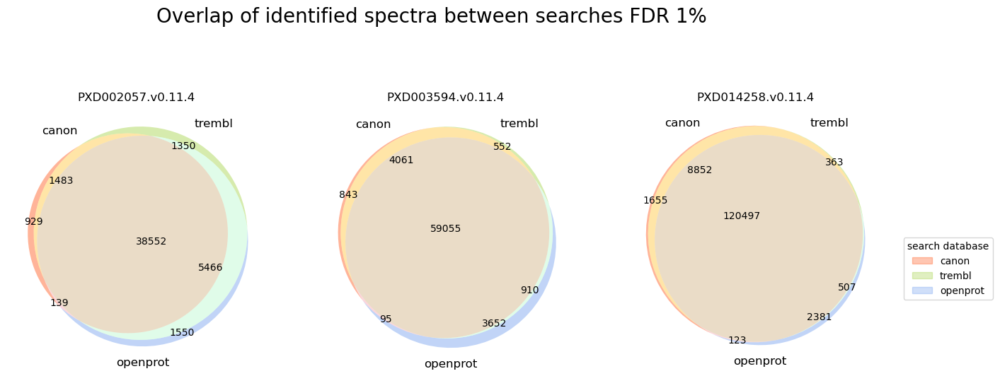

In [16]:
fig, axes = plt.subplots(1, 3, sharey=True,sharex=True, figsize=(16,8))
fig.suptitle('Overlap of identified spectra between searches FDR 1%',size=20, y=0.9);
for i, dataset_name in enumerate(combined_first_datasets):
    dfs=list(combined_first_datasets[dataset_name].values())
    databases=list(combined_first_datasets[dataset_name].keys())
    venn3([set(dfs[0].spectrum_title),set(dfs[1].spectrum_title),set(dfs[2].spectrum_title)], ax=axes[i],
      set_labels=[databases[0],databases[1],databases[2]], set_colors=(project_palette[databases[0]],project_palette[databases[1]],project_palette[databases[2]]))
    axes[i].set_title(f"{dataset_name}")
p=[]
for l,c in project_palette.items():
    p.append(mpatches.Patch(color=c, label=l,alpha=0.3))  
fig.legend(handles=p, title="search database",loc='upper right',bbox_to_anchor=(1, 0.5));
plt.savefig("spectra_venn.svg")

In [51]:
#ID rate - take avarage between samples
def get_total_nspectra(mgf_path):
    mgfFiles={file.split("/")[-1]:np.nan for file in glob.glob(f"{mgf_path}*.mgf")}
    for mgf_file in mgfFiles.keys():
        n_spectrum=0
        with mgf.read(f"{mgf_path}{mgf_file}") as reader:
            for spectrum in reader:
                n_spectrum+=1
        mgfFiles[mgf_file]=n_spectrum
    return mgfFiles
def get_idrate(mgfFiles, df):    
    IDrate={}
    for file in mgfFiles:
        print(file,len(df[df["spectrum_file"]==file.replace('.RAW.mgf', '.mgf')]))
        #file=file.replace('.RAW.mgf', '.mgf')
        IDrate[file]=len(df[df["spectrum_file"]==file.replace('.RAW.mgf', '.mgf')])/mgfFiles[file]
    return IDrate

In [52]:
#mgfspectraN_20=get_total_nspectra('/home/xroucou_group/echange_de_fichiers/pride_reanalysis/PXD002057_data/')
mgfspectraN_datasets=pickle.load(open('mgfspectraN_datasets.pickle', 'rb'))

In [28]:
mgfspectraN_20

{'130327_o2_03_hu_C2_2hr.mgf': 24764,
 '130327_o2_04_hu_P2_2hr.mgf': 26307,
 '130327_o2_06_hu_P3_2hr.mgf': 26558,
 '130327_o2_01_hu_C1_2hr.mgf': 25783,
 '130327_o2_05_hu_C3_2hr.mgf': 25052,
 '130327_o2_02_hu_P1_2hr.mgf': 26717}

In [27]:
mgfspectraN_14=get_total_nspectra('/home/xroucou_group/echange_de_fichiers/ionbot_PXD014258/')

In [29]:
mgfspectraN_14

{'ESC-HF-Sample-BT474_4.RAW.mgf': 24099,
 'ESC-HF-Sample-MCF4.RAW.mgf': 23162,
 'ESC-HF-SampleHela5.RAW.mgf': 19891,
 'ESC-HF-SampleHela1.RAW.mgf': 22055,
 'ESC-HF-SampleHela4.RAW.mgf': 18013,
 'ESC-HF-Sample-BT474_1.RAW.mgf': 21602,
 'ESC-HF-Sample-BT474_5.RAW.mgf': 22577,
 'ESC-HF-Sample-MCF1.RAW.mgf': 22183,
 'ESC-HF-Sample-MCF5.RAW.mgf': 22053,
 'ESC-HF-SampleHela2.RAW.mgf': 21707,
 'ESC-HF-Sample-BT474_3.RAW.mgf': 19995,
 'ESC-HF-Sample-MCF3.RAW.mgf': 19073,
 'ESC-HF-Sample-BT474_2.RAW.mgf': 21504,
 'ESC-HF-Sample-MCF2.RAW.mgf': 24446,
 'ESC-HF-SampleHela3.RAW.mgf': 18386}

In [30]:
mgfspectraN_35=get_total_nspectra('/home/xroucou_group/echange_de_fichiers/pride_reanalysis/tpp_pride_reanalysis/PXD003594/')

In [32]:
mgfspectraN_35_f={k:v for k,v in mgfspectraN_35.items() if "merged" not in k} #take away *merged.mgf
mgfspectraN_35_f

{'b1369p080_sample_03_a.mgf': 8389,
 'b1369p080_sample_08_b.mgf': 24250,
 'b1369p080_sample_04_b.mgf': 12180,
 'b1369p080_sample_12_b.mgf': 20880,
 'b1369p080_sample_02_a.mgf': 21319,
 'b1369p080_sample_09_b.mgf': 16142,
 'b1369p080_sample_05_b.mgf': 27211,
 'b1369p080_sample_14_a.mgf': 20681,
 'b1369p080_sample_13_b.mgf': 18213,
 'b1369p080_sample_01_a.mgf': 18507,
 'b1369p080_sample_06_b.mgf': 27110,
 'b1369p080_sample_10_b.mgf': 24616,
 'b1369p080_sample_07_b.mgf': 26256,
 'b1369p080_sample_11_b.mgf': 24609,
 'b1369p080_sample_07_a.mgf': 26043,
 'b1369p080_sample_11_a.mgf': 24902,
 'b1369p080_sample_01_b.mgf': 19975,
 'b1369p080_sample_06_a.mgf': 27689,
 'b1369p080_sample_10_a.mgf': 24797,
 'b1369p080_sample_09_a.mgf': 15462,
 'b1369p080_sample_02_b.mgf': 21502,
 'b1369p080_sample_05_a.mgf': 26364,
 'b1369p080_sample_14_b.mgf': 20848,
 'b1369p080_sample_13_a.mgf': 20457,
 'b1369p080_sample_08_a.mgf': 23902,
 'b1369p080_sample_03_b.mgf': 5280,
 'b1369p080_sample_04_a.mgf': 9467,
 'b1

In [56]:
mgfspectraN_datasets={'PXD002057.v0.11.4':mgfspectraN_20,'PXD003594.v0.11.4':mgfspectraN_35_f,'PXD014258.v0.11.4':mgfspectraN_14}

In [1171]:
#with open('mgfspectraN_datasets.pickle', 'wb') as handle:
#    pickle.dump(mgfspectraN_datasets, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [586]:
idrate_datasets={'PXD002057.v0.11.4':0,'PXD003594.v0.11.4':0,'PXD014258.v0.11.4':0}
for dataset_name in combined_first_datasets:
    mgfspectraN=mgfspectraN_datasets[dataset_name]
    idrate={"canon":0,"trembl":0,"openprot":0}
    for database in combined_first_datasets[dataset_name]:        
        df=combined_first_datasets[dataset_name][database]
        idrate[database]=get_idrate(mgfspectraN, df)
    idrate_datasets[dataset_name]=idrate

130327_o2_03_hu_C2_2hr.mgf 4152
130327_o2_04_hu_P2_2hr.mgf 8515
130327_o2_06_hu_P3_2hr.mgf 8569
130327_o2_01_hu_C1_2hr.mgf 5742
130327_o2_05_hu_C3_2hr.mgf 4414
130327_o2_02_hu_P1_2hr.mgf 9711
130327_o2_03_hu_C2_2hr.mgf 4816
130327_o2_04_hu_P2_2hr.mgf 9591
130327_o2_06_hu_P3_2hr.mgf 9916
130327_o2_01_hu_C1_2hr.mgf 6482
130327_o2_05_hu_C3_2hr.mgf 5075
130327_o2_02_hu_P1_2hr.mgf 10971
130327_o2_03_hu_C2_2hr.mgf 4626
130327_o2_04_hu_P2_2hr.mgf 9329
130327_o2_06_hu_P3_2hr.mgf 9678
130327_o2_01_hu_C1_2hr.mgf 6340
130327_o2_05_hu_C3_2hr.mgf 5006
130327_o2_02_hu_P1_2hr.mgf 10728
b1369p080_sample_03_a.mgf 569
b1369p080_sample_08_b.mgf 2946
b1369p080_sample_04_b.mgf 871
b1369p080_sample_12_b.mgf 1986
b1369p080_sample_02_a.mgf 2556
b1369p080_sample_09_b.mgf 1470
b1369p080_sample_05_b.mgf 3592
b1369p080_sample_14_a.mgf 2204
b1369p080_sample_13_b.mgf 1302
b1369p080_sample_01_a.mgf 1673
b1369p080_sample_06_b.mgf 3774
b1369p080_sample_10_b.mgf 3031
b1369p080_sample_07_b.mgf 3788
b1369p080_sample_11_b

In [587]:
idrate_med_error={"canon":0,"trembl":0,"openprot":0}
idrate_med_avarage={"canon":0,"trembl":0,"openprot":0}
idrate_med_swarmplot={"canon":0,"trembl":0,"openprot":0}
for database in combined_first_datasets['PXD003594.v0.11.4']:
    medians=[]
    for dataset_name in ['PXD003594.v0.11.4','PXD002057.v0.11.4','PXD014258.v0.11.4']:
        a=round(np.median(list(idrate_datasets[dataset_name][database].values())),3)
        medians.append(a)
    idrate_med_error[database]=stats.sem(medians, axis=None, ddof=0)
    idrate_med_avarage[database]=np.mean(medians)
    idrate_med_swarmplot[database]=medians

In [588]:
idrate_med_avarage

{'canon': 0.259, 'trembl': 0.26966666666666667, 'openprot': 0.2583333333333333}

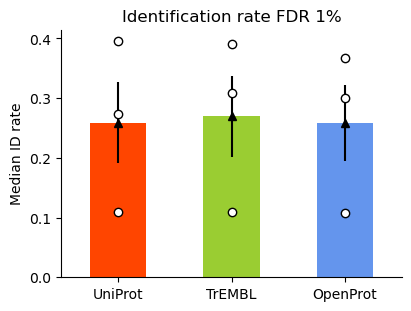

In [589]:
dbs = ("UniProt", "TrEMBL", "OpenProt")
x=np.array(range(len(dbs)))
y=idrate_med_avarage.values()
fig, ax = plt.subplots(layout='constrained', figsize=(4, 3))
width=0.5
ax.bar(x, y, width=width, color=project_palette.values())
ax.errorbar(x, y, yerr=list(idrate_med_error.values()), fmt="^",color="black")
sns.swarmplot(ax=ax,x=[0]*3+[1]*3+[2]*3, y=np.array(list(idrate_med_swarmplot.values())).flatten(),color="white",size=6, edgecolor='black',linewidth=1)
ax.set_ylabel('Median ID rate')
ax.set_title('Identification rate FDR 1%')
ax.set_xticks(x, dbs)
for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
plt.savefig("idrate_errorbar.svg")

In [ ]:
#by sample

In [590]:
#as tpp does not save spectra by separate file (but merged, input), then add corresponding files n spectra
mgfspectraN_datasets_tpp=mgfspectraN_datasets.copy()
mgfspectraN_datasets_tpp['PXD003594.v0.11.4']={f'sample_{i}_merged.mgf':mgfspectraN_datasets['PXD003594.v0.11.4'][f'b1369p080_sample_{i}_a.mgf']+mgfspectraN_datasets['PXD003594.v0.11.4'][f'b1369p080_sample_{i}_b.mgf'] for i in ["01","02","03","04","05","06","07","08","09","10","11","12","13","14"]}
tmp={}
for i in ["ESC-HF-Sample-BT474","ESC-HF-SampleHela","ESC-HF-Sample-MCF"]:
    if "BT474" not in i:
        tmp[f"{i}_merged.mgf"]=np.sum([mgfspectraN_datasets['PXD014258.v0.11.4'][f"{i}{j}.RAW.mgf"] for j in range(1,6)])
    else:
        tmp[f"{i}_merged.mgf"]=np.sum([mgfspectraN_datasets['PXD014258.v0.11.4'][f"{i}_{j}.RAW.mgf"] for j in range(1,6)])
mgfspectraN_datasets_tpp['PXD014258.v0.11.4']=tmp
mgfspectraN_datasets_tpp

{'PXD002057.v0.11.4': {'130327_o2_03_hu_C2_2hr.mgf': 24764,
  '130327_o2_04_hu_P2_2hr.mgf': 26307,
  '130327_o2_06_hu_P3_2hr.mgf': 26558,
  '130327_o2_01_hu_C1_2hr.mgf': 25783,
  '130327_o2_05_hu_C3_2hr.mgf': 25052,
  '130327_o2_02_hu_P1_2hr.mgf': 26717},
 'PXD003594.v0.11.4': {'sample_01_merged.mgf': 38482,
  'sample_02_merged.mgf': 42821,
  'sample_03_merged.mgf': 13669,
  'sample_04_merged.mgf': 21647,
  'sample_05_merged.mgf': 53575,
  'sample_06_merged.mgf': 54799,
  'sample_07_merged.mgf': 52299,
  'sample_08_merged.mgf': 48152,
  'sample_09_merged.mgf': 31604,
  'sample_10_merged.mgf': 49413,
  'sample_11_merged.mgf': 49511,
  'sample_12_merged.mgf': 41357,
  'sample_13_merged.mgf': 38670,
  'sample_14_merged.mgf': 41529},
 'PXD014258.v0.11.4': {'ESC-HF-Sample-BT474_merged.mgf': 109777,
  'ESC-HF-SampleHela_merged.mgf': 100052,
  'ESC-HF-Sample-MCF_merged.mgf': 110917}}

In [53]:
idrate_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_first_datasets:
    idrate_med={"canon":0,"trembl":0,"openprot":0}
    key=[ds for ds in mgfspectraN_datasets if dataset_name in ds][0]
    mgfspectraN=mgfspectraN_datasets[key]
    #print(mgfspectraN)
    for database in idrate_med:
        df=combined_first_datasets[dataset_name][database]
        dff=df[df["database"]=="T"]
        #print(dataset_name,database)
        if dataset_name=="PXD002057.v0.11.4":
            idrate_med[database]=list(get_idrate(mgfspectraN, dff).values()) #np.median(
        else:
            n= 2 if dataset_name=="PXD003594.v0.11.4" else 5
            #mean neighboring values - fractions
            r=list(get_idrate(mgfspectraN, dff).values())
            idrate_med[database]=[np.mean(r[x:x+n]) for x in range(0, len(r), n)]  
    idrate_datasets[dataset_name]=idrate_med

130327_o2_03_hu_C2_2hr.mgf 4111
130327_o2_04_hu_P2_2hr.mgf 8430
130327_o2_06_hu_P3_2hr.mgf 8484
130327_o2_01_hu_C1_2hr.mgf 5685
130327_o2_05_hu_C3_2hr.mgf 4370
130327_o2_02_hu_P1_2hr.mgf 9612
130327_o2_03_hu_C2_2hr.mgf 4768
130327_o2_04_hu_P2_2hr.mgf 9493
130327_o2_06_hu_P3_2hr.mgf 9818
130327_o2_01_hu_C1_2hr.mgf 6419
130327_o2_05_hu_C3_2hr.mgf 5024
130327_o2_02_hu_P1_2hr.mgf 10859
130327_o2_03_hu_C2_2hr.mgf 4580
130327_o2_04_hu_P2_2hr.mgf 9235
130327_o2_06_hu_P3_2hr.mgf 9580
130327_o2_01_hu_C1_2hr.mgf 6278
130327_o2_05_hu_C3_2hr.mgf 4956
130327_o2_02_hu_P1_2hr.mgf 10619
b1369p080_sample_03_a.mgf 563
b1369p080_sample_08_b.mgf 2919
b1369p080_sample_04_b.mgf 860
b1369p080_sample_12_b.mgf 1970
b1369p080_sample_02_a.mgf 2526
b1369p080_sample_09_b.mgf 1456
b1369p080_sample_05_b.mgf 3558
b1369p080_sample_14_a.mgf 2183
b1369p080_sample_13_b.mgf 1292
b1369p080_sample_01_a.mgf 1655
b1369p080_sample_06_b.mgf 3732
b1369p080_sample_10_b.mgf 2995
b1369p080_sample_07_b.mgf 3742
b1369p080_sample_11_b

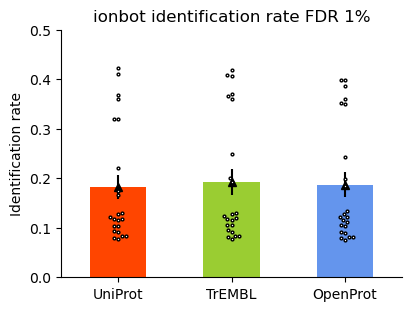

In [54]:
idrate_med_error={"canon":0,"trembl":0,"openprot":0}
idrate_med_avarage={"canon":0,"trembl":0,"openprot":0}
idrate_med_swarmplot={"canon":0,"trembl":0,"openprot":0}
for database in idrate_med_error:
    medians=[]
    for dataset_name in ['PXD003594.v0.11.4','PXD002057.v0.11.4','PXD014258.v0.11.4']:
        medians=medians+idrate_datasets[dataset_name][database] #not median
    idrate_med_error[database]=stats.sem(medians, axis=None, ddof=0)
    idrate_med_avarage[database]=np.mean(medians)
    idrate_med_swarmplot[database]=medians
dbs = ("UniProt", "TrEMBL", "OpenProt")
x=np.array(range(len(dbs)))
y=idrate_med_avarage.values()
fig, ax = plt.subplots(layout='constrained', figsize=(4, 3))
width=0.5
ax.bar(x, y, width=width, color=project_palette.values())
ax.errorbar(x, y, yerr=list(idrate_med_error.values()), fmt="^",color="black")
sns.swarmplot(ax=ax,x=[0]*23+[1]*23+[2]*23, y=np.array(list(idrate_med_swarmplot.values())).flatten(),color="white",size=2, edgecolor='black',linewidth=1)
ax.set_ylabel('Identification rate')
ax.set_title('ionbot identification rate FDR 1%')
ax.set_xticks(x, dbs)
plt.ylim(0,0.5) #as in ionbot
for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
plt.savefig("ionbot_idrate_errorbar_bysample.svg")

In [55]:
idrate_datasets_df=pd.DataFrame(columns=["pipline","sample","database","value"])
for dataset in idrate_datasets:
    for database in idrate_datasets[dataset]:
        for i,val in enumerate(idrate_datasets[dataset][database]):
            idrate_datasets_df.loc[len(idrate_datasets_df)]=["ionbot",f"{dataset}_{i}",database,val]

In [56]:
peprideprophet_idrate_datasets_df=pd.read_pickle("peprideprophet_idrate_datasets_df.pkl")

In [57]:
from matplotlib.collections import PolyCollection
from matplotlib.legend_handler import HandlerTuple

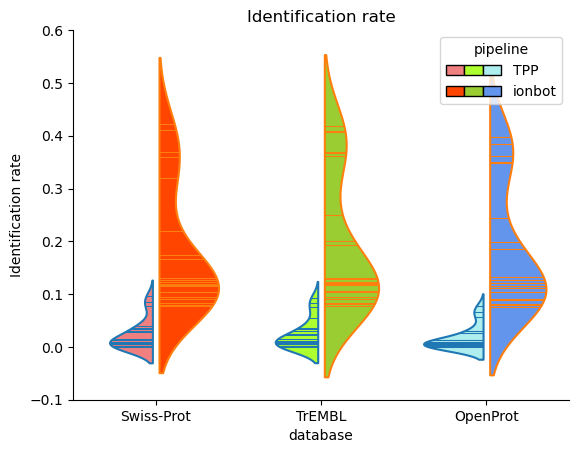

In [58]:
a=pd.concat([peprideprophet_idrate_datasets_df,idrate_datasets_df])
a=a[a.value!=0]
v=sns.violinplot(data=a, x="database", y="value", hue="pipline",
               split=True, inner="stick", fill=False,gap=.1)
#v.set_yscale("log")
colors=[project_palette2["TPP_canon"],project_palette2["ionbot_canon"],project_palette2["TPP_trembl"],
       project_palette2["ionbot_trembl"],project_palette2["TPP_openprot"],project_palette2["ionbot_openprot"],]
handles=[]
for ind, violin in enumerate(v.findobj(PolyCollection)):
    violin.set_facecolor(colors[ind])
    handles.append(plt.Rectangle((0, 0), 0, 0, facecolor=colors[ind], edgecolor='black'))
v.legend(handles=[tuple(handles[::2]), tuple(handles[1::2])], labels=["TPP","ionbot"],
          title="pipeline", handlelength=4, handler_map={tuple: HandlerTuple(ndivide=None, pad=0)})
v.set_ylabel('Identification rate')
v.set_title('Identification rate')
xticks=["Swiss-Prot","TrEMBL","OpenProt"]
v.set_xticks(np.array(range(len(xticks))), xticks)
plt.ylim(-0.1,0.6)
for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
plt.savefig("idrate_violin_bysample.svg")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


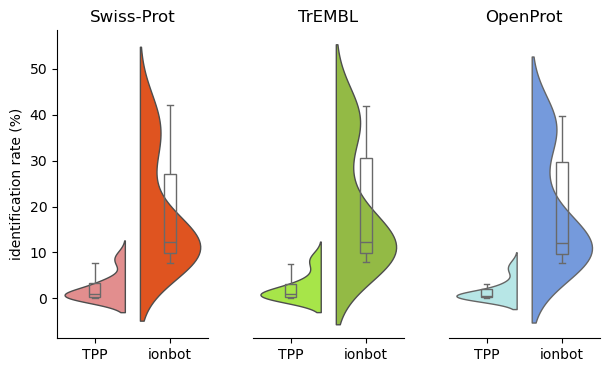

In [59]:
data=pd.concat([peprideprophet_idrate_datasets_df,idrate_datasets_df])
data['value']=data['value']*100
fig, axes = plt.subplots(1, 3, figsize=(7, 4), sharey=True)
#Left plot
for i,database in enumerate(["canon","trembl","openprot"]):
    #attribute= "canon_unique" if peptide_class=="canon" else "noncanon_unique" if peptide_class=="NonCanon_unique" else "shared"
    v=sns.violinplot(data=data[data['database'] == database], 
                   x='pipline', y='value', 
                   split=True, hue='pipline', ax=axes[i],
                   inner=None,dodge=False,
                   palette={"TPP": project_palette2[f"TPP_{database}"], "ionbot": project_palette2[f"ionbot_{database}"]},
                   linewidth=1,  #markeredgecolor='white'
                  )
    
    sns.boxplot(data=data[data['database'] == database],
                x='pipline', y='value', 
                width=0.15,  # Keeps boxplot thin
                dodge=False,
                boxprops={"facecolor": "none", "edgecolor": "dimgrey", "linewidth": 1},  # Thinner box edges
                whiskerprops={"color": "dimgrey", "linewidth": 1},  # Thinner whiskers
                capprops={"color": "dimgrey", "linewidth": 1},  # Thinner caps
                medianprops={"color": "dimgrey", "linewidth": 1},  # Thinner dashed median line
                showfliers=False,  # Hide outliers
                ax=axes[i]
    )
   # axes[i].legend(loc='lower left', bbox_to_anchor=(1, 1), ncol=1, bbox_transform=fig.transFigure)
    #sns.move_legend(v, "upper left", bbox_to_anchor=(1, 0))
    attribute_txt= "Swiss-Prot" if database=="canon" else "TrEMBL" if database=="trembl" else "OpenProt"
    axes[i].set_title(attribute_txt)
#Customize
for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False) 
    ax.spines['left'].set_visible(False)
    ax.set_ylabel('') 
    ax.set_xlabel('')
    ax.tick_params(left=False) 
    l=ax.legend().get_frame()
    l.set_edgecolor("white")

#Keep only the y-axis on the first plot
axes[0].spines['left'].set_visible(True)
axes[0].set_ylabel("identification rate (%)") 
axes[0].tick_params(left=True)

fig.subplots_adjust(wspace=.3)
#plt.tight_layout()
plt.savefig("F1A_IDrate_db_pipeline.svg", format='svg')
plt.show() 


#by dataset
dbs = ("UniProt", "TrEMBL", "OpenProt")
idrate_med={}
for dataset_name in ['PXD003594.v0.11.4','PXD002057.v0.11.4','PXD014258.v0.11.4']:
    aa=[]
    for database in combined_first_datasets[dataset_name]:
        a=round(np.median(list(idrate_datasets[dataset_name][database].values())),3)
        aa.append(a)
    idrate_med[dataset_name]=tuple(aa)

x = np.arange(len(dbs))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout='constrained')
for dataset_name, id in idrate_med.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, id, width, label=dataset_name)
    ax.bar_label(rects, padding=3)
    multiplier += 1

ax.set_ylabel('ID rate')
ax.set_title('Identification rate FDR 1%')
ax.set_xlabel("median across samples")
ax.set_xticks(x + width, dbs)
ax.legend(loc='upper right', ncols=1)

for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
plt.show()
#ADD ERROR BAR

In [10]:
#load peptides files, filter  by qvalue and contaminants by proteins
combined_peptides_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_peptides_datasets:
    combined_peptides={"canon":0,"trembl":0,"openprot":0}
    for database in combined_peptides:
        df=combine_ionbot(working_folder, dataset_name, f"-{database}","ionbot.first.peptides.csv")
        df.reset_index(inplace=True,drop=True)
        df_f=df.loc[df["q-value"]<0.01,:]
        #if database=="openprot":
        #    a=combined_first_datasets[dataset_name][database]
        #    print("with contaminants, altprots",len(df_f[df_f.database_peptide.isin(a[((a["only altprots"]==True)|(a["only novelisoprots"]==True))].database_peptide.tolist())]))
        df_f=df_f.loc[~((df_f["proteins"].str.contains("CONTAMINANT")) | (df_f["proteins"].str.contains("contaminant")))]
       ## if database=="openprot":
       ##     print("without contaminants",len(df_f[df_f.database_peptide.isin(a[((a["only altprots"]==True)|(a["only novelisoprots"]==True))].database_peptide.tolist())]))
        combined_peptides[database]=df_f
    combined_peptides_datasets[dataset_name]=combined_peptides

./fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon
['./fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_05_hu_C3_2hr.mgf.gzip/ionbot.first.peptides.csv', './fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_02_hu_P1_2hr.mgf.gzip/ionbot.first.peptides.csv', './fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_04_hu_P2_2hr.mgf.gzip/ionbot.first.peptides.csv', './fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_03_hu_C2_2hr.mgf.gzip/ionbot.first.peptides.csv', './fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_01_hu_C1_2hr.mgf.gzip/ionbot.first.peptides.csv', './fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_06_hu_P3_2hr.mgf.gzip/ionbot.first.peptides.csv']
./fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_05_hu_C3_2hr.mgf.gzip/ionbot.first.peptides.csv
30327_o2_05_hu_C3_2hr.mgf.gzip/
./fromUGhent_v0114_2/PXD002057.v0.11.4/

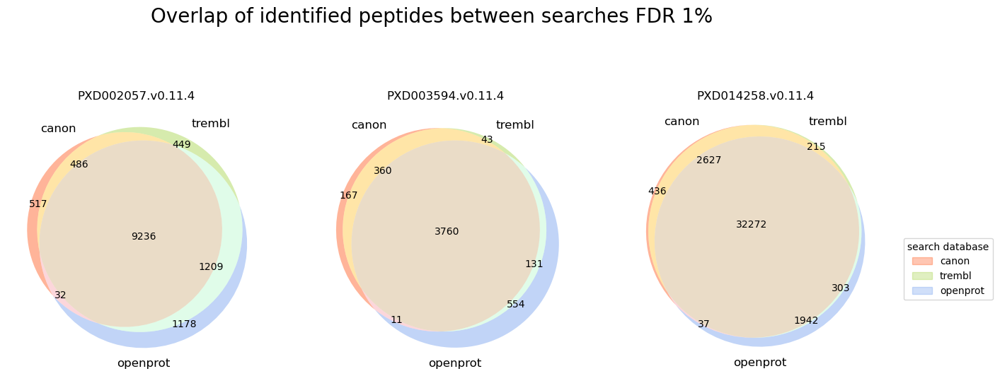

In [215]:
fig, axes = plt.subplots(1, 3, sharey=True,sharex=True, figsize=(16,8))
fig.suptitle('Overlap of identified peptides between searches FDR 1%',size=20, y=0.9);
for i, dataset_name in enumerate(combined_peptides_datasets):
    dfs=list(combined_peptides_datasets[dataset_name].values())
    databases=list(combined_peptides_datasets[dataset_name].keys())
    venn3([set(dfs[0].database_peptide),set(dfs[1].database_peptide),set(dfs[2].database_peptide)], ax=axes[i],
      set_labels=[databases[0],databases[1],databases[2]], set_colors=(project_palette[databases[0]],project_palette[databases[1]],project_palette[databases[2]]))
    axes[i].set_title(f"{dataset_name}")
p=[]
for l,c in project_palette.items():
    p.append(mpatches.Patch(color=c, label=l,alpha=0.3))  
fig.legend(handles=p, title="search database",loc='upper right',bbox_to_anchor=(1, 0.5));

In [1238]:
#load proteins files, filter by group qvalue and contominants by protein
combined_proteins_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_proteins_datasets:
    combined_proteins={"canon":0,"trembl":0,"openprot":0}
    for database in combined_proteins:
        df=combine_ionbot(working_folder, dataset_name, f"-{database}","ionbot.first.proteins.csv")
        df_f=df.loc[df["protein_group_q-value"]<0.01,:]
        df_f=df_f.loc[~((df_f["protein_group"].str.contains("CONTAMINANT")) | (df_f["protein_group"].str.contains("contaminant")))]
        combined_proteins[database]=df_f
    combined_proteins_datasets[dataset_name]=combined_proteins

./fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon
['./fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_05_hu_C3_2hr.mgf.gzip/ionbot.first.proteins.csv', './fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_02_hu_P1_2hr.mgf.gzip/ionbot.first.proteins.csv', './fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_04_hu_P2_2hr.mgf.gzip/ionbot.first.proteins.csv', './fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_03_hu_C2_2hr.mgf.gzip/ionbot.first.proteins.csv', './fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_01_hu_C1_2hr.mgf.gzip/ionbot.first.proteins.csv', './fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_06_hu_P3_2hr.mgf.gzip/ionbot.first.proteins.csv']
./fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_05_hu_C3_2hr.mgf.gzip/ionbot.first.proteins.csv
30327_o2_05_hu_C3_2hr.mgf.gzip/
./fromUGhent_v0114_2/PXD002057.v0.11.4/

canon 5181
trembl 3253


In [ ]:
#why so few filtered prots in OpenProt?

In [ ]:
#may be the psms matches a lot of proteins?

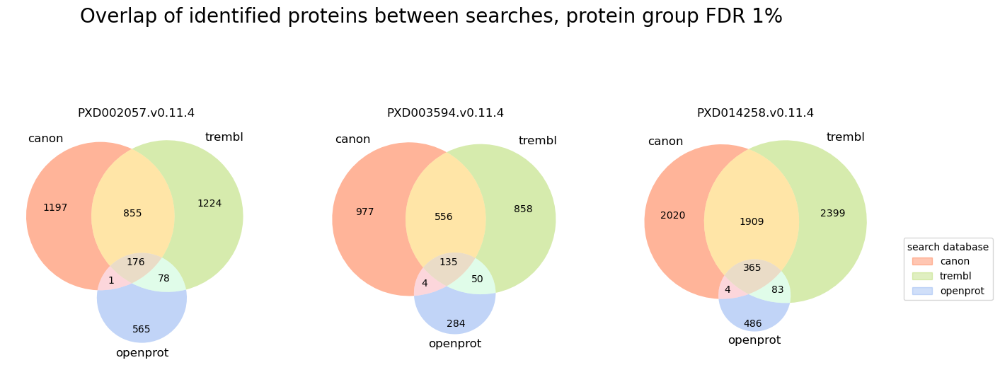

In [30]:
fig, axes = plt.subplots(1, 3, sharey=True,sharex=True, figsize=(16,8))
fig.suptitle('Overlap of identified proteins between searches, protein group FDR 1%',size=20, y=0.9);
for i, dataset_name in enumerate(combined_proteins_datasets):
    dfs=list(combined_proteins_datasets[dataset_name].values())
    databases=list(combined_proteins_datasets[dataset_name].keys())
    venn3([set(dfs[0].uniprot_id),set(dfs[1].uniprot_id),set(dfs[2].uniprot_id)], ax=axes[i],
      set_labels=[databases[0],databases[1],databases[2]], set_colors=(project_palette[databases[0]],project_palette[databases[1]],project_palette[databases[2]]))
    axes[i].set_title(f"{dataset_name}")
p=[]
for l,c in project_palette.items():
    p.append(mpatches.Patch(color=c, label=l,alpha=0.3))  
fig.legend(handles=p, title="search database",loc='upper right',bbox_to_anchor=(1, 0.5));

### Indicate types of proteins in OpenProt (canonical, reference isoform, novel isoform, non-canonical)

In [48]:
TRfasta_search='./ionbot_openprot/Human_2023_01_trembl.fasta'
input_file = open(TRfasta_search)
TRfasta = SeqIO.to_dict(SeqIO.parse(TRfasta_search, "fasta"))

In [49]:
UPfasta_search='./ionbot_openprot/Human_2023_01_canonical.fasta'
input_file = open(UPfasta_search)
UPfasta = SeqIO.to_dict(SeqIO.parse(UPfasta_search, "fasta"))

In [50]:
#get list of TrEMBL isoforms
trembl_prot=[k.split("|")[1] for k in TRfasta.keys()]
up_prot=[k.split("|")[1] for k in UPfasta.keys()]
trmbl_refisoforms=set(trembl_prot)-set(up_prot)

In [125]:
OPfasta_file='./ionbot_openprot/openprot_2_0_0-human-ensembl106+refseq+uniprot2022_06_01.fasta'
input_file = open(OPfasta_file)
OPfasta = SeqIO.to_dict(SeqIO.parse(OPfasta_file, "fasta"))

In [163]:
list(OPfasta.keys())[0]

'op|Q8NH21|TX=9606'

In [ ]:
#create pickle with canonical and non-canonical entries.
#as we may have new canonical prots accessions due to version difference, I will merge in canonical prots both accessions from 
#OpenProt fasta, TrEMBL and UniProt (Swiss-Prot)
#do function of it
proteins_types={"canonical (Swiss-Prot + OpenProt SwissProt & ENSP)":[],"all canonical (Swiss-Prot + TrEMBL + OpenProt canonical (Swiss-Prot & TrEMBL & ENSP))":[],"non-canonical (OpenProt IP_ & II_)":[]}
#what=[]
for k,v in OPfasta.items():
    k=k.split("|")[1]
    if k not in trmbl_refisoforms and not k.startswith("IP_") and not k.startswith("II_"): # and not k.startswith("ENSP")
        proteins_types["canonical (Swiss-Prot + OpenProt SwissProt & ENSP)"]=proteins_types["canonical (Swiss-Prot + OpenProt SwissProt & ENSP)"]+[k]
    if not k.startswith("IP_") and not k.startswith("II_"):
        proteins_types["all canonical (Swiss-Prot + TrEMBL + OpenProt canonical (Swiss-Prot & TrEMBL & ENSP))"]=proteins_types["all canonical (Swiss-Prot + TrEMBL + OpenProt canonical (Swiss-Prot & TrEMBL & ENSP))"]+[k]
    if k.startswith("IP_") or k.startswith("II_"):
        proteins_types["non-canonical (OpenProt IP_ & II_)"]=proteins_types["non-canonical (OpenProt IP_ & II_)"]+[k]
    #if :
        #what.append(k)

In [703]:
#add acc in Swiss Prot and TrEMBL which are not in OP
for k,v in UPfasta.items():
    k=k.split("|")[1]
    if k not in proteins_types["canonical (Swiss-Prot + OpenProt SwissProt & ENSP)"]:
        proteins_types["canonical (Swiss-Prot + OpenProt SwissProt & ENSP)"]=proteins_types["canonical (Swiss-Prot + OpenProt SwissProt & ENSP)"]+[k]
        proteins_types["all canonical (Swiss-Prot + TrEMBL + OpenProt canonical (Swiss-Prot & TrEMBL & ENSP))"]=proteins_types["all canonical (Swiss-Prot + TrEMBL + OpenProt canonical (Swiss-Prot & TrEMBL & ENSP))"]+[k]

In [704]:
for k,v in TRfasta.items():
    k=k.split("|")[1]
    if k not in proteins_types["all canonical (Swiss-Prot + TrEMBL + OpenProt canonical (Swiss-Prot & TrEMBL & ENSP))"]:
        proteins_types["all canonical (Swiss-Prot + TrEMBL + OpenProt canonical (Swiss-Prot & TrEMBL & ENSP))"]=proteins_types["all canonical (Swiss-Prot + TrEMBL + OpenProt canonical (Swiss-Prot & TrEMBL & ENSP))"]+[k]

In [705]:
#duplactes? 
len(proteins_types["canonical (Swiss-Prot + OpenProt SwissProt & ENSP)"]),len(set(proteins_types["canonical (Swiss-Prot + OpenProt SwissProt & ENSP)"]))

(126796, 126796)

In [706]:
#duplactes? 
len(proteins_types["all canonical (Swiss-Prot + TrEMBL + OpenProt canonical (Swiss-Prot & TrEMBL & ENSP))"]),len(set(proteins_types["all canonical (Swiss-Prot + TrEMBL + OpenProt canonical (Swiss-Prot & TrEMBL & ENSP))"]))

(210178, 210178)

In [707]:
#duplactes? 
len(proteins_types["non-canonical (OpenProt IP_ & II_)"]),len(set(proteins_types["non-canonical (OpenProt IP_ & II_)"]))

(481696, 481696)

In [711]:
#with open('proteins_types.pickle', 'wb') as handle:
#    pickle.dump(proteins_types, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
#venn diagramm of same sequences

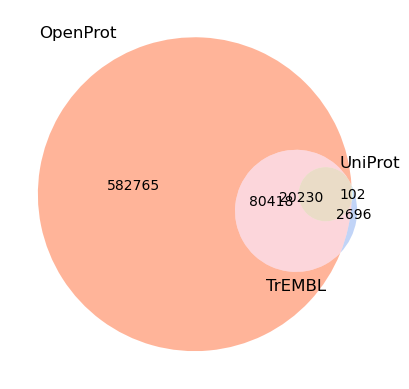

In [37]:
venn3([set([str(s.seq) for s in OPfasta.values()]),set([str(s.seq) for s in UPfasta.values()]),set([str(s.seq) for s in TRfasta.values()])],
      set_labels=["OpenProt","UniProt","TrEMBL"], set_colors=(project_palette[databases[0]],project_palette[databases[1]],project_palette[databases[2]]))
#plt.savefig("dbseq_venn.svg");

In [52]:
#indicate non-canonical proteins, novel isoforms and reference isoforms in OP first
for dataset_name in combined_first_datasets:
    df=combined_first_datasets[dataset_name]["openprot"]
    df["only altprots"]=False
    df["only novelisoprots"]=False
    df["only refisoprots"]=False
    for i,row in df.iterrows():
        pg=row.proteins.split("||")
        psa=[p for p in pg if "IP_" in p.split("((")[-1].rstrip("))")]
        psni=[p for p in pg if "II_" in p.split("((")[-1].rstrip("))")]
        psri=[p for p in pg if p.split("((")[-1].rstrip("))") in list(trmbl_refisoforms)]
        if len(pg)==len(psa):
            df.loc[i,"only altprots"]=True
        if len(pg)==len(psni):
            df.loc[i,"only novelisoprots"]=True
        if len(pg)==len(psri):
            df.loc[i,"only refisoprots"]=True
    combined_first_datasets[dataset_name]["openprot"]=df

In [53]:
#with open('combined_first_datasets.pickle', 'wb') as handle:
#    pickle.dump(combined_first_datasets, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [8]:
combined_first_datasets=pickle.load(open('combined_first_datasets.pickle', 'rb'))

In [61]:
#create a dictionary with peptide class annotation
combined_datasets_peptideclass={}
for source in combined_first_datasets:
    df=combined_first_datasets[source]['openprot']
    for ii,(i,row) in enumerate(df.iterrows()):
        pep=row.database_peptide
        if pep not in combined_datasets_peptideclass.keys():
            if row['database']=='D': 
                v=['decoy']
            else:
                s=row[['only altprots', 'only novelisoprots','only refisoprots']]
                t=list(zip(s,s.index))
                v=[cl for bool,cl in t if bool]
                if len(v)==0: #for filtered. if not filtered, take into account contaminants
                    v=['mix/refprot']
            combined_datasets_peptideclass[pep]=v

In [62]:
#with open('combined_datasets_peptideclass.pickle', 'wb') as handle:
#    pickle.dump(combined_datasets_peptideclass, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [9]:
combined_datasets_peptideclass=pickle.load(open('combined_datasets_peptideclass.pickle', 'rb'))

#### OpenProt by dataset - N of spectra and peptides and unique peptides per subdatabase

In [138]:
OP_subdb_spectra_datasets={"PXD002057.v0.11.4":{"canonical":0,"non-canonical":0},"PXD003594.v0.11.4":{"canonical":0,"non-canonical":0},"PXD014258.v0.11.4":{"canonical":0,"non-canonical":0}}
for dataset_name in combined_first_datasets:
    df=combined_first_datasets[dataset_name]["openprot"]
    tot=len(df[(df["database"]=="T")])
    nonc_spec_n=len(df[(df["database"]=="T")&((df["only altprots"]==True)|(df["only novelisoprots"]==True))])
    can_spec_n=tot-nonc_spec_n
    OP_subdb_spectra_datasets[dataset_name]["canonical"]=round((can_spec_n/tot)*100,3)
    OP_subdb_spectra_datasets[dataset_name]["non-canonical"]=round((nonc_spec_n/tot)*100,3)

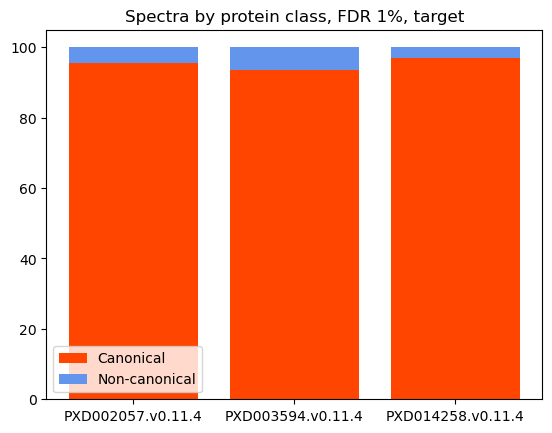

In [145]:
x = list(OP_subdb_spectra_datasets.keys())
y1 = [OP_subdb_spectra_datasets[i]["canonical"] for i in x]
y2 = [OP_subdb_spectra_datasets[i]["non-canonical"] for i in x]
 
# plot bars in stack manner
plt.bar(x, y1, color=proteins_palette["Canonical"],label="Canonical")
plt.bar(x, y2, bottom=y1, color=proteins_palette["Non-canonical"], label="Non-canonical")
plt.title("Spectra by protein class, FDR 1%, target");
plt.legend();

In [146]:
OP_subdb_peptides_datasets={"PXD002057.v0.11.4":{"canonical":0,"non-canonical":0},"PXD003594.v0.11.4":{"canonical":0,"non-canonical":0},"PXD014258.v0.11.4":{"canonical":0,"non-canonical":0}}
for dataset_name in combined_first_datasets:
    df=combined_first_datasets[dataset_name]["openprot"]
    tot=len(set(df[(df["database"]=="T")].matched_peptide.values.tolist()))
    nonc_pep_n=len(set(df[(df["database"]=="T")&((df["only altprots"]==True)|(df["only novelisoprots"]==True))].matched_peptide.values.tolist()))
    can_pep_n=tot-nonc_pep_n
    OP_subdb_peptides_datasets[dataset_name]["canonical"]=round((can_pep_n/tot)*100,3)
    OP_subdb_peptides_datasets[dataset_name]["non-canonical"]=round((nonc_pep_n/tot)*100,3)

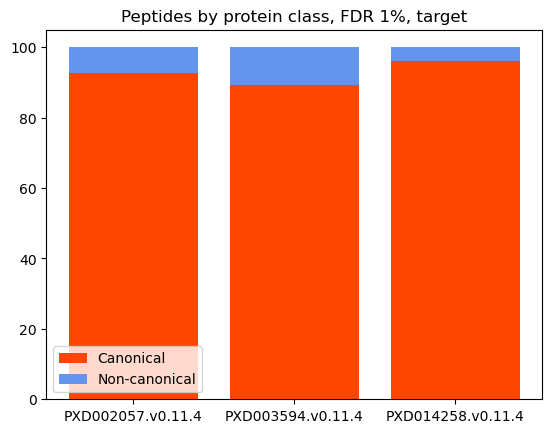

In [147]:
x = list(OP_subdb_peptides_datasets.keys())
y1 = [OP_subdb_peptides_datasets[i]["canonical"] for i in x]
y2 = [OP_subdb_peptides_datasets[i]["non-canonical"] for i in x]
 
# plot bars in stack manner
plt.bar(x, y1, color=proteins_palette["Canonical"],label="Canonical")
plt.bar(x, y2, bottom=y1, color=proteins_palette["Non-canonical"], label="Non-canonical")
plt.title("Peptides by protein class, FDR 1%, target");
plt.legend();

In [ ]:
#count peptides from the peptide file. Is it different?

In [69]:
#flag class of peptide in peptide files
for source in combined_peptides_datasets:
    df=combined_peptides_datasets[source]['openprot']
    df[['only altprots', 'only novelisoprots','only refisoprots','mix/refprot','decoy']]=np.nan #there should be no decoy, right?
    for i,row in df.iterrows():
        cols=combined_datasets_peptideclass[row.database_peptide]
        df.loc[i,cols]=True
    combined_peptides_datasets[source]['openprot']=df

TypeError: 'int' object is not subscriptable

In [1161]:
def classify_peptides(row):
    if any('decoy_' in i for i in row):
        return 'Decoy'
    #print(row)
    row=[p for p in row.split("||")]
    if any('CONTAMINANT' in x or 'contaminant' in x for x in row):
        return 'Contam'
    elif all(x.startswith('II_') or x.startswith('IP_') for x in row):
        return 'NonCanon_unique'
        # Ensembl is canonical
    elif all(not x.startswith('II_') and not x.startswith('IP_') and not 'CONTAMINANT' in x and not 'contaminant' in x for x in row):
        return 'Canon_unique'
    else:
        return 'Shared'

In [ ]:
for source in combined_peptides_datasets:
    df=combined_peptides_datasets[source]['openprot']
    df["peptide_class"]=np.nan #there should be no decoy, right?
    for i,row in df.iterrows():
        df["peptide_class"]=df["proteins"].apply(classify_peptides)
    combined_peptides_datasets[source]['openprot']=df

In [ ]:
proteins_peptide_class_ionbot={}
for source in combined_peptides_datasets:
     proteins_peptide_class_ionbot[source]=combined_peptides_datasets[source]['openprot'][["proteins","peptide_class"]].to_dict()

In [ ]:
#with open('proteins_peptide_class_ionbot.pkl', 'wb') as f:
#    pickle.dump(proteins_peptide_class_ionbot, f)

In [11]:
proteins_peptide_class_ionbot=pickle.load(open('proteins_peptide_class_ionbot.pkl', 'rb'))

In [12]:
#pep ann
for source in combined_peptides_datasets:
    df=combined_peptides_datasets[source]["openprot"]
    a=pd.DataFrame(proteins_peptide_class_ionbot[source])
    df=df.merge(a, left_index=True, right_index=True)
    combined_peptides_datasets[source]["openprot"]=df

In [218]:
OP_subdb_peptides_datasets_onpep={"PXD002057.v0.11.4":{"canonical":0,"non-canonical":0},"PXD003594.v0.11.4":{"canonical":0,"non-canonical":0},"PXD014258.v0.11.4":{"canonical":0,"non-canonical":0}}
for dataset_name in combined_peptides_datasets:
    df=combined_peptides_datasets[dataset_name]["openprot"]
    tot=len(df)
    nonc_pep_n=len(df[((df["only altprots"]==True)|(df["only novelisoprots"]==True))])
    n_decoy=len(df[(df["decoy"]==True)])
    can_pep_n=tot-nonc_pep_n-n_decoy
    OP_subdb_peptides_datasets_onpep[dataset_name]["canonical"]=round((can_pep_n/tot)*100,3)
    OP_subdb_peptides_datasets_onpep[dataset_name]["non-canonical"]=round((nonc_pep_n/tot)*100,3)

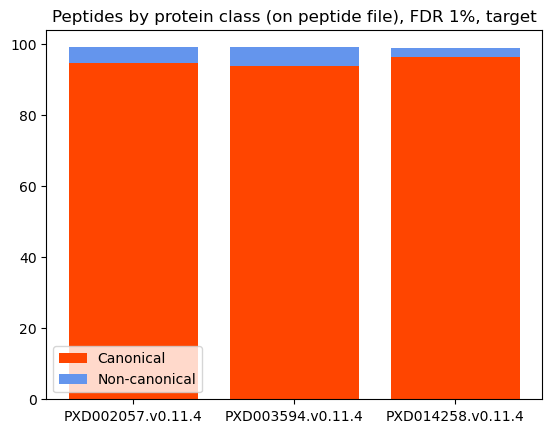

In [219]:
x = list(OP_subdb_peptides_datasets_onpep.keys())
y1 = [OP_subdb_peptides_datasets_onpep[i]["canonical"] for i in x]
y2 = [OP_subdb_peptides_datasets_onpep[i]["non-canonical"] for i in x]
 
# plot bars in stack manner
plt.bar(x, y1, color=proteins_palette["Canonical"],label="Canonical")
plt.bar(x, y2, bottom=y1, color=proteins_palette["Non-canonical"], label="Non-canonical")
plt.title("Peptides by protein class (on peptide file), FDR 1%, target");
plt.legend(loc='lower left');

In [13]:
fix_spectrum_file={"PXD002057.v0.11.4":{
                    "canon":{'30327_o2_06_hu_P3_2hr.mgf.gzip/':'130327_o2_06_hu_P3_2hr.mgf',
                            '30327_o2_02_hu_P1_2hr.mgf.gzip/':'130327_o2_02_hu_P1_2hr.mgf',
                              '30327_o2_03_hu_C2_2hr.mgf.gzip/':'130327_o2_03_hu_C2_2hr.mgf',
                               '30327_o2_05_hu_C3_2hr.mgf.gzip/':'130327_o2_05_hu_C3_2hr.mgf',
                              '30327_o2_01_hu_C1_2hr.mgf.gzip/':'130327_o2_01_hu_C1_2hr.mgf',
                              '30327_o2_04_hu_P2_2hr.mgf.gzip/':'130327_o2_04_hu_P2_2hr.mgf'},
                   "trembl":{'30327_o2_06_trembl/':'130327_o2_06_hu_P3_2hr.mgf', 
                            '30327_o2_05_trembl/':'130327_o2_05_hu_C3_2hr.mgf', 
                            '30327_o2_03_trembl/':'130327_o2_03_hu_C2_2hr.mgf', 
                            '30327_o2_01_trembl/':'130327_o2_01_hu_C1_2hr.mgf', 
                            '30327_o2_02_trembl/':'130327_o2_02_hu_P1_2hr.mgf', 
                            '30327_o2_04_trembl/':'130327_o2_04_hu_P2_2hr.mgf'},
                   "openprot":{'30327_o2_03_hu_C2_2hr-openprot/':'130327_o2_03_hu_C2_2hr.mgf', 
                               '30327_o2_01_hu_C1_2hr-openprot/':'130327_o2_01_hu_C1_2hr.mgf', 
                               '30327_o2_05_hu_C3_2hr-openprot/':'130327_o2_05_hu_C3_2hr.mgf', 
                               '30327_o2_06_hu_P3_2hr-openprot/':'130327_o2_06_hu_P3_2hr.mgf', 
                               '30327_o2_02_hu_P1_2hr-openprot/':'130327_o2_02_hu_P1_2hr.mgf', 
                               '30327_o2_04_hu_P2_2hr-openprot/':'130327_o2_04_hu_P2_2hr.mgf'}},
                    "PXD003594.v0.11.4":{
                        "canon":{'sample_14/':'sample_14_merged.mgf', 
                                 'sample_05/':'sample_05_merged.mgf', 
                                 'sample_09/':'sample_09_merged.mgf', 
                                 'sample_12/':'sample_12_merged.mgf', 
                                 'sample_06/':'sample_06_merged.mgf', 
                                 'sample_02/':'sample_02_merged.mgf', 
                                 'sample_11/':'sample_11_merged.mgf', 
                                 'sample_08/':'sample_08_merged.mgf', 
                                 'sample_07/':'sample_07_merged.mgf', 
                                 'sample_10/':'sample_10_merged.mgf', 
                                 'sample_13/':'sample_13_merged.mgf', 
                                 'sample_03/':'sample_03_merged.mgf', 
                                 'sample_04/':'sample_04_merged.mgf', 
                                 'sample_01/':'sample_01_merged.mgf'},
                        "trembl":{'sample_01_trembl/':'sample_01_merged.mgf', 
                                  'sample_06_trembl/':'sample_06_merged.mgf', 
                                  'sample_11_trembl/':'sample_11_merged.mgf', 
                                  'sample_13_trembl/':'sample_13_merged.mgf', 
                                  'sample_07_trembl/':'sample_07_merged.mgf', 
                                  'sample_02_trembl/':'sample_02_merged.mgf', 
                                  'sample_09_trembl/':'sample_09_merged.mgf', 
                                  'sample_12_trembl/':'sample_12_merged.mgf', 
                                  'sample_10_trembl/':'sample_10_merged.mgf', 
                                  'sample_14_trembl/':'sample_14_merged.mgf', 
                                  'sample_05_trembl/':'sample_05_merged.mgf', 
                                  'sample_03_trembl/':'sample_03_merged.mgf', 
                                  'sample_04_trembl/':'sample_04_merged.mgf', 
                                  'sample_08_trembl/':'sample_08_merged.mgf'},
                        "openprot":{'sample_13_openprot/':'sample_13_merged.mgf', 
                                    'sample_09_openprot/':'sample_09_merged.mgf', 
                                    'sample_04_openprot/':'sample_04_merged.mgf', 
                                    'sample_10_openprot/':'sample_10_merged.mgf', 
                                    'sample_11_openprot/':'sample_11_merged.mgf', 
                                    'sample_01_openprot/':'sample_01_merged.mgf', 
                                    'sample_07_openprot/':'sample_07_merged.mgf', 
                                    'sample_02_openprot/':'sample_02_merged.mgf', 
                                    'sample_08_openprot/':'sample_08_merged.mgf', 
                                    'sample_03_openprot/':'sample_03_merged.mgf', 
                                    'sample_06_openprot/':'sample_06_merged.mgf', 
                                    'sample_12_openprot/':'sample_12_merged.mgf', 
                                    'sample_14_openprot/':'sample_14_merged.mgf', 
                                    'sample_05_openprot/':'sample_05_merged.mgf'}
                    },
                    "PXD014258.v0.11.4":{
                                            "canon":{'Sample-BT474/':'ESC-HF-Sample-BT474_merged.mgf', 
                                                     'SampleHela/':'ESC-HF-Sample-MCF_merged.mgf', 
                                                     'Sample-MCF/':'ESC-HF-SampleHela_merged.mgf'},
                                            "trembl":{'ESC-HF-Sample-BT474-trEMBL/':'ESC-HF-Sample-BT474_merged.mgf', 
                                                      'ESC-HF-SampleHela-trEMBL/':'ESC-HF-Sample-MCF_merged.mgf', 
                                                      'ESC-HF-Sample-MCF-trEMBL/':'ESC-HF-SampleHela_merged.mgf'},
                                            "openprot":{'ESC-HF-Sample-BT474-openprot/':'ESC-HF-Sample-BT474_merged.mgf', 
                                                        'ESC-HF-Sample-MCF-openprot/':'ESC-HF-Sample-MCF_merged.mgf', 
                                                        'ESC-HF-SampleHela-openprot/':'ESC-HF-SampleHela_merged.mgf'}}}

In [14]:
#fix spectrum file
for dataset_name in combined_peptides_datasets:
    key=[ds for ds in mgfspectraN_datasets if dataset_name in ds][0]
    mgfspectraN=mgfspectraN_datasets[key]
    for database in combined_peptides_datasets[dataset_name]:
        df=combined_peptides_datasets[dataset_name][database]
        for spf_now,spf_right in fix_spectrum_file[dataset_name][database].items():
            df.loc[df.spectrum_file==spf_now,"spectrum_file"]=spf_right
        combined_peptides_datasets[dataset_name][database]=df

In [1213]:
mgfspectraN_datasets_tpp=mgfspectraN_datasets.copy()
mgfspectraN_datasets_tpp['PXD003594.v0.11.4']={f'sample_{i}_merged.mgf':mgfspectraN_datasets_tpp['PXD003594.v0.11.4'][f'b1369p080_sample_{i}_a.mgf']+mgfspectraN_datasets_tpp['PXD003594.v0.11.4'][f'b1369p080_sample_{i}_b.mgf'] for i in ["01","02","03","04","05","06","07","08","09","10","11","12","13","14"]}
tmp={}
for i in ["ESC-HF-Sample-BT474","ESC-HF-SampleHela","ESC-HF-Sample-MCF"]:
    if "BT474" not in i:
        tmp[f"{i}_merged.mgf"]=np.sum([mgfspectraN_datasets_tpp['PXD014258.v0.11.4'][f"{i}{j}.RAW.mgf"] for j in range(1,6)])
    else:
        tmp[f"{i}_merged.mgf"]=np.sum([mgfspectraN_datasets_tpp['PXD014258.v0.11.4'][f"{i}_{j}.RAW.mgf"] for j in range(1,6)])
mgfspectraN_datasets_tpp['PXD014258.v0.11.4']=tmp
mgfspectraN_datasets_tpp

{'PXD002057.v0.11.4': {'130327_o2_03_hu_C2_2hr.mgf': 24764,
  '130327_o2_04_hu_P2_2hr.mgf': 26307,
  '130327_o2_06_hu_P3_2hr.mgf': 26558,
  '130327_o2_01_hu_C1_2hr.mgf': 25783,
  '130327_o2_05_hu_C3_2hr.mgf': 25052,
  '130327_o2_02_hu_P1_2hr.mgf': 26717},
 'PXD003594.v0.11.4': {'sample_01_merged.mgf': 38482,
  'sample_02_merged.mgf': 42821,
  'sample_03_merged.mgf': 13669,
  'sample_04_merged.mgf': 21647,
  'sample_05_merged.mgf': 53575,
  'sample_06_merged.mgf': 54799,
  'sample_07_merged.mgf': 52299,
  'sample_08_merged.mgf': 48152,
  'sample_09_merged.mgf': 31604,
  'sample_10_merged.mgf': 49413,
  'sample_11_merged.mgf': 49511,
  'sample_12_merged.mgf': 41357,
  'sample_13_merged.mgf': 38670,
  'sample_14_merged.mgf': 41529},
 'PXD014258.v0.11.4': {'ESC-HF-Sample-BT474_merged.mgf': 109777,
  'ESC-HF-SampleHela_merged.mgf': 100052,
  'ESC-HF-Sample-MCF_merged.mgf': 110917}}

In [604]:
idrate_PEPCL_datasets={"Canon_unique":[],"NonCanon_unique":[],"Shared":[]}
for dataset_name in combined_peptides_datasets:
    key=[ds for ds in mgfspectraN_datasets if dataset_name in ds][0]
    mgfspectraN=mgfspectraN_datasets_tpp[key]
    database="openprot"
    df=combined_peptides_datasets[dataset_name][database]
    ##df=df[df["database"]=="T"]
    for peptide_class in set(df.peptide_class):   
        #print(peptide_class,len(df[df.peptide_class==peptide_class]))
        #print(mgfspectraN)
        #print(list(get_idrate(mgfspectraN, df[df.peptide_class==peptide_class]).values()))
        idrate_PEPCL_datasets[peptide_class]=idrate_PEPCL_datasets[peptide_class]+list(get_idrate(mgfspectraN, df[df.peptide_class==peptide_class]).values())

130327_o2_03_hu_C2_2hr.mgf 1414
130327_o2_04_hu_P2_2hr.mgf 3016
130327_o2_06_hu_P3_2hr.mgf 3187
130327_o2_01_hu_C1_2hr.mgf 1941
130327_o2_05_hu_C3_2hr.mgf 1508
130327_o2_02_hu_P1_2hr.mgf 3578
130327_o2_03_hu_C2_2hr.mgf 1076
130327_o2_04_hu_P2_2hr.mgf 2541
130327_o2_06_hu_P3_2hr.mgf 2728
130327_o2_01_hu_C1_2hr.mgf 1464
130327_o2_05_hu_C3_2hr.mgf 1143
130327_o2_02_hu_P1_2hr.mgf 2982
130327_o2_03_hu_C2_2hr.mgf 148
130327_o2_04_hu_P2_2hr.mgf 245
130327_o2_06_hu_P3_2hr.mgf 252
130327_o2_01_hu_C1_2hr.mgf 201
130327_o2_05_hu_C3_2hr.mgf 156
130327_o2_02_hu_P1_2hr.mgf 256
sample_01_merged.mgf 533
sample_02_merged.mgf 678
sample_03_merged.mgf 140
sample_04_merged.mgf 244
sample_05_merged.mgf 925
sample_06_merged.mgf 1121
sample_07_merged.mgf 1081
sample_08_merged.mgf 772
sample_09_merged.mgf 444
sample_10_merged.mgf 901
sample_11_merged.mgf 768
sample_12_merged.mgf 555
sample_13_merged.mgf 451
sample_14_merged.mgf 566
sample_01_merged.mgf 577
sample_02_merged.mgf 774
sample_03_merged.mgf 149
sam

In [1224]:
len(idrate_PEPCL_datasets['Canon_unique'])

23

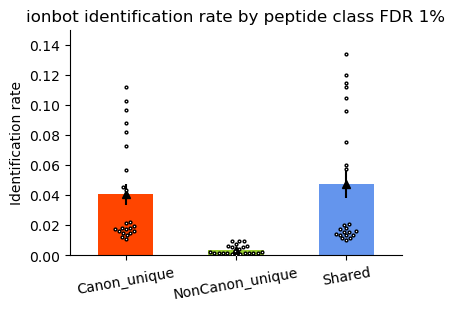

In [605]:
idrate_PEPCL_med_error={"Canon_unique":0,"NonCanon_unique":0,"Shared":0}
idrate_PEPCL_med_avarage={"Canon_unique":0,"NonCanon_unique":0,"Shared":0}
idrate_PEPCL_med_swarmplot={"Canon_unique":0,"NonCanon_unique":0,"Shared":0}
for peptide_class in idrate_PEPCL_med_error:
    medians=idrate_PEPCL_datasets[peptide_class]#not median
    idrate_PEPCL_med_error[peptide_class]=stats.sem(medians, axis=None, ddof=0)
    idrate_PEPCL_med_avarage[peptide_class]=np.mean(medians)
    idrate_PEPCL_med_swarmplot[peptide_class]=medians
dbs = ("Canon_unique", "NonCanon_unique", "Shared")
x=np.array(range(len(dbs)))
y=idrate_PEPCL_med_avarage.values()
fig, ax = plt.subplots(layout='constrained', figsize=(4, 3))
width=0.5
ax.bar(x, y, width=width, color=project_palette.values())
ax.errorbar(x, y, yerr=list(idrate_PEPCL_med_error.values()), fmt="^",color="black")
sns.swarmplot(ax=ax,x=[0]*23+[1]*23+[2]*23, y=np.array(list(idrate_PEPCL_med_swarmplot.values())).flatten(),color="white",size=2, edgecolor='black',linewidth=1)
ax.set_ylabel('Identification rate')
ax.set_title('ionbot identification rate by peptide class FDR 1%')
ax.set_xticks(x, dbs,rotation=10)
plt.ylim(0,0.15) #as in ionbot
for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
plt.savefig("ionbot_idrate_PEPCL_errorbar_bysample.svg")

In [606]:
idrate_PEPCL_datasets_df=pd.DataFrame(columns=["pipline","sample","database","value"])
for peptide_class in idrate_PEPCL_datasets:
    for i,val in enumerate(idrate_PEPCL_datasets[peptide_class]):
        idrate_PEPCL_datasets_df.loc[len(idrate_PEPCL_datasets_df)]=["ionbot",f"{dataset}_{i}",peptide_class,val]

In [607]:
peprideprophet_PEPCL_idrate_datasets_df=pd.read_pickle("peprideprophet_PEPCL_idrate_datasets_df.pkl")

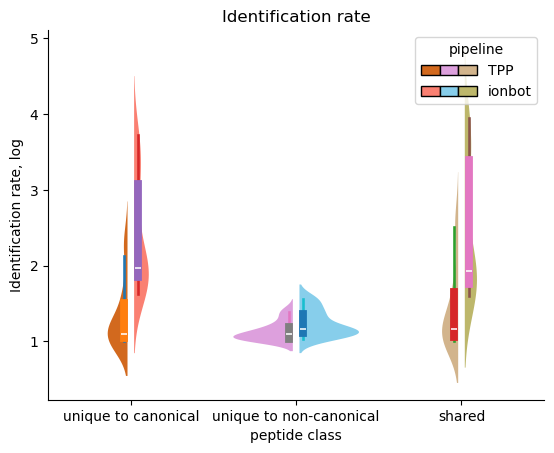

In [608]:
a=pd.concat([peprideprophet_PEPCL_idrate_datasets_df,idrate_PEPCL_datasets_df])
a=a[a.value!=0]
a["value_log"]=np.abs(np.log2(a["value"]))
a["value_percent"]=np.log2(a["value"]*100+2)
v=sns.violinplot(data=a, x="database", y="value_percent", hue="pipline",inner="box", edgecolor=None,
               split=True, gap=0.1)
#sns.swarmplot(data=a, x="database", y="value",ax=v, hue="pipline")
#v.set_yscale('log')
colors=[project_palette2["TPP_canon_unique"],project_palette2["ionbot_canon_unique"],project_palette2["TPP_noncanon_unique"],
       project_palette2["ionbot_noncanon_unique"],project_palette2["TPP_shared"],project_palette2["ionbot_shared"],]
handles=[]
for ind, violin in enumerate(v.findobj(PolyCollection)):
    violin.set_facecolor(colors[ind])
    #violin.set_edgecolor(None)
    handles.append(plt.Rectangle((0, 0), 0, 0, facecolor=colors[ind], edgecolor='black'))
v.legend(handles=[tuple(handles[::2]), tuple(handles[1::2])], labels=["TPP","ionbot"],
          title="pipeline", handlelength=4, handler_map={tuple: HandlerTuple(ndivide=None, pad=0)})
v.set_ylabel('Identification rate, log')
v.set_xlabel('peptide class')
v.set_title('Identification rate')
xticks=["unique to canonical","unique to non-canonical","shared"]
v.set_xticks(np.array(range(len(xticks))), xticks)
#plt.ylim(0,0.2)
for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
plt.savefig("idrate_PEPCL_violin_bysample.svg",format='svg')

In [1799]:
data.columns

Index(['pipline', 'sample', 'database', 'value', 'value_log', 'value_percent'], dtype='object')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


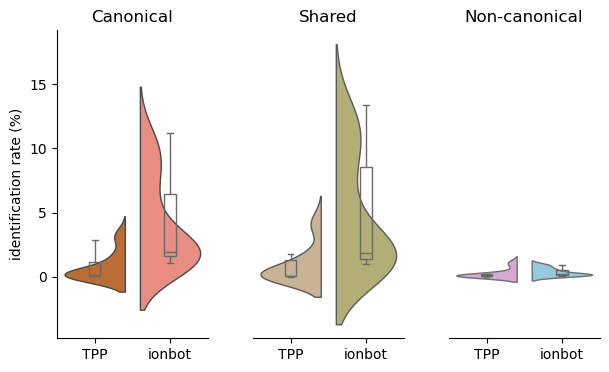

In [60]:
#Create subplots
data=pd.read_pickle("peptide_class_idrate.pkl")
data["value"]=data["value"]*100
fig, axes = plt.subplots(1, 3, figsize=(7, 4), sharey=True)
#Left plot
for i,peptide_class in enumerate(["Canon_unique","Shared","NonCanon_unique"]):
    attribute= "canon_unique" if peptide_class=="Canon_unique" else "noncanon_unique" if peptide_class=="NonCanon_unique" else "shared"
    v=sns.violinplot(data=data[data['database'] == peptide_class], 
                   x='pipline', y='value', 
                   split=True, hue='pipline', ax=axes[i],
                   inner=None,dodge=False,
                   palette={"TPP": project_palette2[f"TPP_{attribute}"], "ionbot": project_palette2[f"ionbot_{attribute}"]},
                   linewidth=1,  #markeredgecolor='white'
                  )
    
    sns.boxplot(data=data[data['database'] == peptide_class],
                x='pipline', y='value', 
                width=0.15,  # Keeps boxplot thin
                dodge=False,
                boxprops={"facecolor": "none", "edgecolor": "dimgrey", "linewidth": 1},  # Thinner box edges
                whiskerprops={"color": "dimgrey", "linewidth": 1},  # Thinner whiskers
                capprops={"color": "dimgrey", "linewidth": 1},  # Thinner caps
                medianprops={"color": "dimgrey", "linewidth": 1},  # Thinner dashed median line
                showfliers=False,  # Hide outliers
                ax=axes[i]
    )
   # axes[i].legend(loc='lower left', bbox_to_anchor=(1, 1), ncol=1, bbox_transform=fig.transFigure)
    #sns.move_legend(v, "upper left", bbox_to_anchor=(1, 0))
    attribute_txt= "Canonical" if peptide_class=="Canon_unique" else "Non-canonical" if peptide_class=="NonCanon_unique" else "Shared"
    axes[i].set_title(attribute_txt)
#Customize
for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False) 
    ax.spines['left'].set_visible(False)
    ax.set_ylabel('') 
    ax.set_xlabel('')
    ax.tick_params(left=False) 
    l=ax.legend().get_frame()
    l.set_edgecolor("white")

#Keep only the y-axis on the first plot
axes[0].spines['left'].set_visible(True)
axes[0].set_ylabel("identification rate (%)") 
axes[0].tick_params(left=True)

fig.subplots_adjust(wspace=.3)
#plt.tight_layout()
plt.savefig("F1B_IDrate_pepcl_pipeline.svg",format='svg')
plt.show() 


In [612]:
#how many psms matched peptides of these clases
pipeline="ionbot"
pepcl_n_psm={k:0 for k in ["Canon_unique","Shared","NonCanon_unique"]}
for dataset in combined_first_datasets:
    psm_df=combined_first_datasets[dataset]["openprot"]
    pep_df=combined_peptides_datasets[dataset_name]["openprot"]
    for peptide_class in ["Canon_unique","Shared","NonCanon_unique"]:
        n=len(psm_df[psm_df.database_peptide.isin(pep_df[pep_df.peptide_class==peptide_class].database_peptide.tolist())])
        pepcl_n_psm[peptide_class]+=n

In [613]:
{k:(v/np.sum(list(pepcl_n_psm.values())))*100 for k,v in pepcl_n_psm.items()}

{'Canon_unique': 38.065446439856146,
 'Shared': 58.93684004917675,
 'NonCanon_unique': 2.9977135109671047}

23
{0.17391304347826086, 0.2608695652173913, 0.8695652173913043, 0.7391304347826086, 0.391304347826087, 0.34782608695652173, 0.08695652173913043, 0.30434782608695654, 0.6086956521739131, 0.5652173913043478, 0.782608695652174, 1.0, 0.9130434782608695, 0.6956521739130435, 0.4782608695652174, 0.8260869565217391, 0.21739130434782608, 0.13043478260869565, 0.043478260869565216, 0.9565217391304348, 0.5217391304347826, 0.6521739130434783, 0.43478260869565216}
22
{0.34782608695652173, 0.2608695652173913, 0.08695652173913043, 0.391304347826087, 0.17391304347826086, 0.5652173913043478, 0.5217391304347826, 0.30434782608695654, 0.4782608695652174, 0.782608695652174, 0.6956521739130435, 0.8260869565217391, 0.043478260869565216, 0.13043478260869565, 0.21739130434782608, 0.6086956521739131, 0.9565217391304348, 0.6521739130434783, 0.43478260869565216}
23
{0.30434782608695654, 0.34782608695652173, 0.2608695652173913, 0.391304347826087, 0.8260869565217391, 0.17391304347826086, 0.9130434782608695, 0.86956

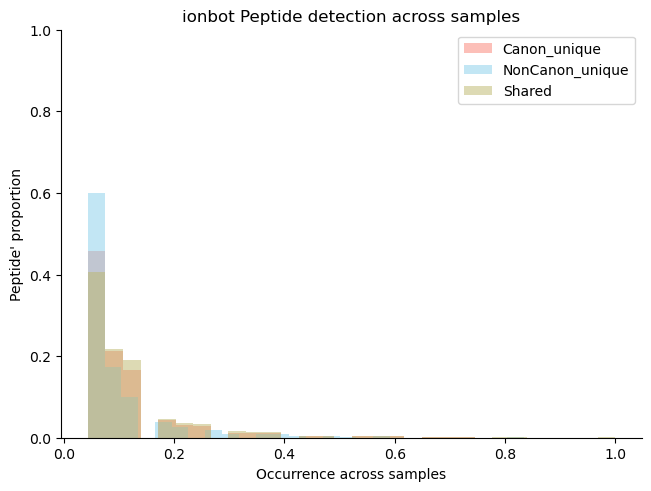

In [614]:
#gather all peptides
fig, ax = plt.subplots(layout='constrained')
for peptide_class in ("Canon_unique", "NonCanon_unique", "Shared"):
    peptides_across_samples=[]
    for dataset_name in combined_peptides_datasets:
        df=combined_peptides_datasets[dataset_name]["openprot"]
        df=df[(df["peptide_class"]==peptide_class)]
        peptides_across_samples=peptides_across_samples+list(df.drop_duplicates(["database_peptide","spectrum_file"]).database_peptide)
    
    peptides_across_samples=Counter(peptides_across_samples)
    print(np.max(list(peptides_across_samples.values())))
    peptides_across_samples=np.array(list(peptides_across_samples.values()))/23 #number of samples
    print(set(peptides_across_samples))
    ax.hist(peptides_across_samples,bins=30, weights=np.zeros_like(peptides_across_samples) + 1. / len(peptides_across_samples),
            alpha=0.5, label=peptide_class, color=project_palette2[peptide_class]);
ax.set_ylabel("Peptide' proportion")
ax.set_xlabel('Occurrence across samples')
ax.set_title('ionbot Peptide detection across samples')
ax.set_ylim(0,1)
ax.legend(loc='upper right', ncols=1)
spines = ["top","right"]
for s in spines:
    ax.spines[s].set_visible(False)

In [64]:
peptides_across_samples_df=pd.DataFrame(columns=["pipeline","class","value"])
for peptide_class in ("Canon_unique", "NonCanon_unique", "Shared"):
    peptides_across_samples=[]
    for dataset_name in combined_peptides_datasets:
        df=combined_peptides_datasets[dataset_name]["openprot"]
        df=df[(df["peptide_class"]==peptide_class)]
        peptides_across_samples=peptides_across_samples+list(df.drop_duplicates(["database_peptide","spectrum_file"]).database_peptide)
        
    peptides_across_samples=Counter(peptides_across_samples)
    peptides_across_samples=np.array(list(peptides_across_samples.values()))/23 #number of samples
    print(set(peptides_across_samples))
    for row in peptides_across_samples:
        peptides_across_samples_df.loc[len(peptides_across_samples_df)]=["ionbot",peptide_class,row]

{0.17391304347826086, 0.2608695652173913, 0.8695652173913043, 0.7391304347826086, 0.391304347826087, 0.34782608695652173, 0.08695652173913043, 0.30434782608695654, 0.6086956521739131, 0.5652173913043478, 0.782608695652174, 1.0, 0.9130434782608695, 0.6956521739130435, 0.4782608695652174, 0.8260869565217391, 0.21739130434782608, 0.13043478260869565, 0.043478260869565216, 0.9565217391304348, 0.5217391304347826, 0.6521739130434783, 0.43478260869565216}
{0.34782608695652173, 0.2608695652173913, 0.08695652173913043, 0.391304347826087, 0.17391304347826086, 0.5652173913043478, 0.5217391304347826, 0.30434782608695654, 0.4782608695652174, 0.782608695652174, 0.6956521739130435, 0.8260869565217391, 0.043478260869565216, 0.13043478260869565, 0.21739130434782608, 0.6086956521739131, 0.9565217391304348, 0.6521739130434783, 0.43478260869565216}
{0.30434782608695654, 0.34782608695652173, 0.2608695652173913, 0.391304347826087, 0.8260869565217391, 0.17391304347826086, 0.9130434782608695, 0.86956521739130

In [62]:
tpp_peptides_across_samples_df=pd.read_pickle("peptides_across_samples_df.pkl")

fig, ax = plt.subplots(layout='constrained')
a=pd.concat([tpp_peptides_across_samples_df,peptides_across_samples_df])
a["pipeline_class"]=a.pipeline+a['class']
a["value"]=np.log(a["value"])
#v=sns.kdeplot(a,x='value', hue='pipeline_class', linestyle='--');
lss = ['--']*3+[':']*3
handles = []
for peptide_class, ls in zip(set(a.pipeline_class), lss):
    sns.kdeplot(a[a["pipeline_class"]==peptide_class],x='value', hue='pipeline_class', linestyle=ls,ax=ax);
#ax.set_ylabel("Peptide' proportion")
#ax.set_xlabel('Occurrence across samples')
#ax.set_title('Peptide detection across samples')
##ax.set_ylim(0,1)
#ax.legend(loc='upper right', ncols=1)
#spines = ["top","right"]
#for s in spines:
#    ax.spines[s].set_visible(False)

In [616]:
len(tpp_peptides_across_samples_df),len(peptides_across_samples_df)

(10560, 42606)

clipped % 0.788156954215417


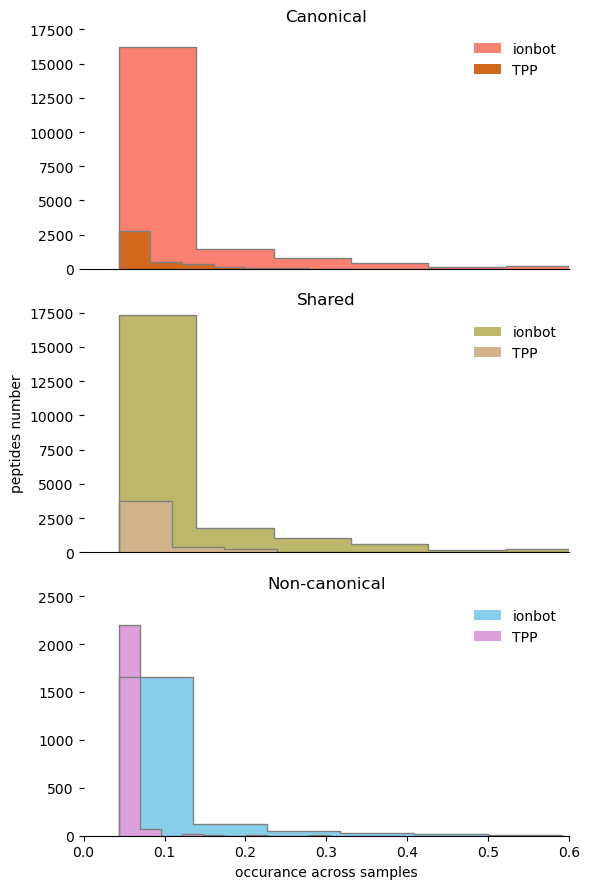

In [67]:
a=pd.concat([tpp_peptides_across_samples_df,peptides_across_samples_df])
#filter for nice graph
#a=a[a["value"]<0.4]
print("clipped %",(len(a[a["value"]>=0.6])/len(a))*100)
countries = [x for x in np.unique(a["class"])]
pipeline = ["TPP","ionbot"]
gs = (grid_spec.GridSpec(len(countries),1))
#gs.update(hspace= 0.1)
fig = plt.figure(figsize=(6,9))
i = 0
#creating empty list
ax_objs = []
for country in ["Canon_unique","Shared","NonCanon_unique"]:
    attribute= "canon_unique" if country=="Canon_unique" else "noncanon_unique" if country=="NonCanon_unique" else "shared"
    # creating new axes object and appending to ax_objs
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))
    v1=a.loc[(a["class"] == country)&(a["pipeline"] == pipeline[1]),"value"].tolist()
    ax_objs[-1].hist(v1,bins=10,#weights=np.zeros_like(v1) + 1. / len(v1),
                     histtype=u'step',edgecolor='grey', linewidth=1)
    ax_objs[-1].hist(v1,bins=10,#weights=np.zeros_like(v1) + 1. / len(v1),
                     alpha=1,color=project_palette2[f"{ pipeline[1]}_{attribute}"],
                    label=pipeline[1])

    
    v2=a.loc[(a["class"] == country)&(a["pipeline"] == pipeline[0]),"value"].tolist()    
    ax_objs[-1].hist(v2,bins=10,#weights=np.zeros_like(v2) + 1. / len(v2),
                     alpha=1,color=project_palette2[f"{ pipeline[0]}_{attribute}"],
                    label=pipeline[0])
    ax_objs[-1].hist(v2,bins=10,#weights=np.zeros_like(v2) + 1. / len(v2),
                     histtype=u'step',edgecolor='grey', linewidth=1)

    # setting uniform x and y lims
    ax_objs[-1].set_xlim(0,0.6)
    ax_objs[-1].set_ylim(0,17500)

    # make background transparent
    rect = ax_objs[-1].patch
    rect.set_alpha(0)

    # remove borders, axis ticks, and labels
    if i==1:
        ax_objs[-1].set_ylabel("peptides number", fontsize=10)
    #ax_objs[-1].set_yticks(np.arange(0, 1.1, 0.25))
    
    if i == len(countries)-1:
        ax_objs[-1].set_xlabel("occurance across samples", fontsize=10)
        #ax_objs[-1].text(-0.02,0,"peptide class",fontsize=10,ha="right")
        ax_objs[-1].set_ylim(0,2500)
    else:
        ax_objs[-1].set_xticks([])
    
    spines = ["top","right","left"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)
    attribute_txt= "Canonical" if country=="Canon_unique" else "Non-canonical" if country=="NonCanon_unique" else "Shared"
    ax_objs[-1].set_title(attribute_txt)
    frame=ax_objs[-1].legend()
    frame.get_frame().set_edgecolor("white")

    i += 1

plt.tight_layout()
#fig.subplots_adjust(hspace=1)
plt.savefig("F1C_repris_pep_pepcl_pipeline.svg",format='svg')
plt.show()

In [69]:
#how many (%) peptides per class identified in >1 sample
max_count=0
for peptide_calss in ["Canon_unique","Shared","NonCanon_unique"]:
    n=len(peptides_across_samples_df[(peptides_across_samples_df["class"]==peptide_calss)&(peptides_across_samples_df.value>(1/23))])
    m=len(peptides_across_samples_df[(peptides_across_samples_df["class"]==peptide_calss)])
    print(peptide_calss,(n/m)*100,m)
    print(peptide_class,"max smaples",peptides_across_samples_df[(peptides_across_samples_df["class"]==peptide_calss)].value.max()*23)
    max_count+=len(peptides_across_samples_df[(peptides_across_samples_df["class"]==peptide_calss)&(peptides_across_samples_df.value==1)])
print("n peptides across classes in all samples",max_count)

Canon_unique 54.122141345310006 19371
Shared max smaples 23.0
Shared 59.43679130353294 21342
Shared max smaples 23.0
NonCanon_unique 40.147913365029055 1893
Shared max smaples 22.0
n peptides across classes in all samples 13


In [70]:
#here I count same peptide in diff samples separatly
pepcl_psm_frq={"peptide_class":[],"psm_num":[]}
for peptide_class in ("Canon_unique", "NonCanon_unique", "Shared"):
    peps_dst=[]
    for dataset_name in combined_peptides_datasets:
        df=combined_peptides_datasets[dataset_name]["openprot"]
        df=df[(df["peptide_class"]==peptide_class)]
        peps_dst=peps_dst+list(df.database_peptide)
    psm_dfs=pd.concat([subdict["openprot"] for dataset,subdict in combined_first_datasets.items()])
    peps_count=Counter(psm_dfs[psm_dfs.database_peptide.isin(peps_dst)].database_peptide)
    peps_count=list(list(peps_count.values()))
    pepcl_psm_frq["peptide_class"]=pepcl_psm_frq["peptide_class"]+[peptide_class]*len(peps_count)
    pepcl_psm_frq["psm_num"]=pepcl_psm_frq["psm_num"]+[p for p in peps_count] #np.log(p)
pepcl_psm_frq=pd.DataFrame(pepcl_psm_frq)

In [71]:
pepcl_psm_frq["pipeline"]="ionbot"
pepcl_psm_frq["bin"]=np.nan
for bin,group in enumerate([[1],[2],list(range(3,5+1)),list(range(5,10+1)),list(range(10,15+1)),list(range(15,20+1))]):
    pepcl_psm_frq.loc[pepcl_psm_frq.psm_num.isin(group),"bin"]=bin

In [72]:
pepcl_psm_frq_tpp=pd.read_pickle("pepcl_psm_frq.pkl")

In [73]:
import warnings
warnings.simplefilter(action="ignore", category=pd.errors.SettingWithCopyWarning)

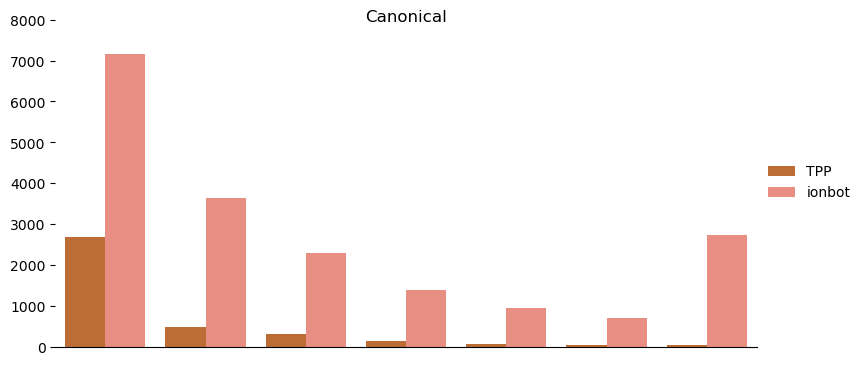

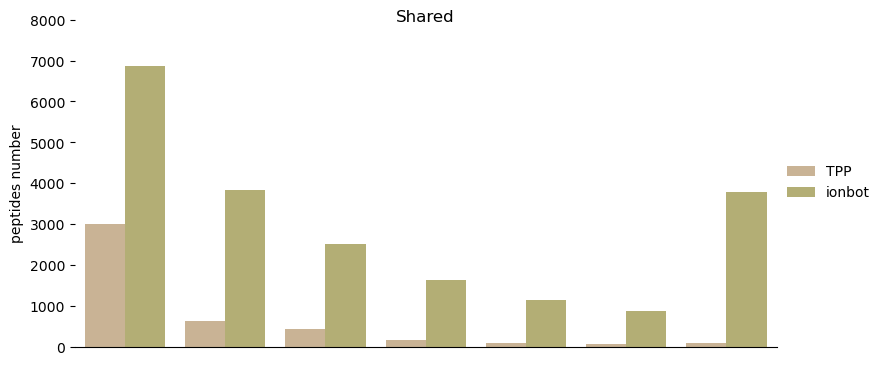

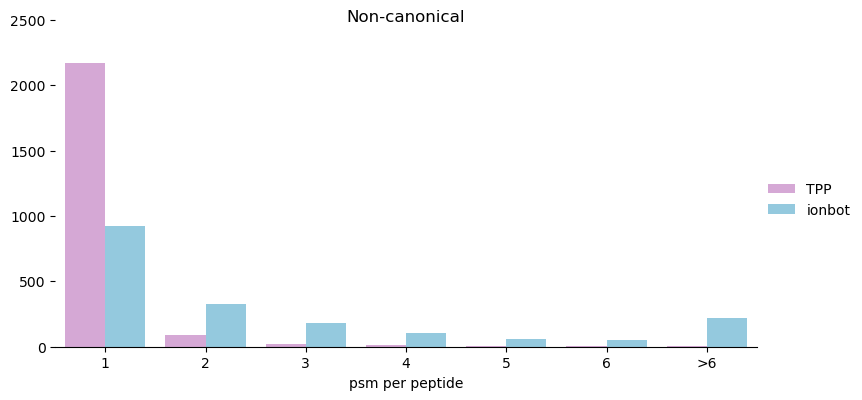

In [74]:
#normalise per peptide number in pipeline
#stuck bins of >7
#put in legend that psms were taken from all samples per peptide
a=pd.concat([pepcl_psm_frq,pepcl_psm_frq_tpp])
b=pd.DataFrame(columns=["pipeline","peptide_class","bin_size","bin"])
for (pipl,pcl,bin),group in a.groupby(["pipeline","peptide_class","psm_num"]):
    row=[pipl,pcl,len(group),bin]#/len(a[(a.pipeline==pipl)&(a.peptide_class==pcl)])
    b.loc[len(b)]=row
c=pd.DataFrame(columns=["pipeline","peptide_class","bin_size","bin"])
for (pipl,pcl),group in b.groupby(["pipeline","peptide_class"]):
    b10=group[group.bin<=6]
    b10.loc[len(b10)]=[pipl,pcl,group[group.bin>7].bin_size.sum(),7]
    c=pd.concat([c,b10]) 
for i,cl in enumerate(["Canon_unique","Shared","NonCanon_unique"]):
    attribute= "canon_unique" if cl=="Canon_unique" else "noncanon_unique" if cl=="NonCanon_unique" else "shared"
    legend_title= "Canonical" if cl=="Canon_unique" else "Non-canonical" if cl=="NonCanon_unique" else "Shared"
    g = sns.catplot(
        data=c[(c.peptide_class==cl)], kind="bar",legend='full',
        x="bin", y="bin_size", hue="pipeline", palette={"ionbot":project_palette2[f"ionbot_{attribute}"],"TPP":project_palette2[f"TPP_{attribute}"]},
        alpha=1, height=4, aspect=2,sharey=False,
    )
    g.despine(left=True)
    plt.ylim(0, 8000)
    if i==2:
        g.set_axis_labels("psm per peptide", "")
        g.ax.set_xticks(range(7),["1","2","3","4","5","6",">6"])
        plt.ylim(0, 2500)
    else:
        g.set_axis_labels("", "")
        g.ax.set_xticks([])
        
    if i==1:
        g.set_axis_labels("", "peptides number")
    g.legend.set_title("")
    #g.ax.set_title(legend_title)
    
    
    plt.title(legend_title,y=0.97)
    plt.savefig(f"F1D_psm_pepcl_{cl}_pipeline.svg",format='svg')
plt.show()

In [75]:
for peptide_class in ["Canon_unique","Shared","NonCanon_unique"]:
    m=pepcl_psm_frq[pepcl_psm_frq.peptide_class==peptide_class].psm_num.max()
    print(peptide_class,m)

Canon_unique 329
Shared 882
NonCanon_unique 598


countries = [x for x in np.unique(pepcl_psm_frq.peptide_class)]

gs = (grid_spec.GridSpec(len(countries),1))
gs.update(hspace= 0.3)
fig = plt.figure(figsize=(8,6))
i = 0
#creating empty list
ax_objs = []
for country in countries:
    # creating new axes object and appending to ax_objs
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))
    # plotting the distribution
    plot = (pepcl_psm_frq[pepcl_psm_frq.peptide_class == country]
            .psm_num.plot.kde(ax=ax_objs[-1],color="#f0f0f0", lw=0.5)
           )

    # grabbing x and y data from the kde plot
    x = plot.get_children()[0]._x
    y = plot.get_children()[0]._y

    # filling the space beneath the distribution
    ax_objs[-1].fill_between(x,y,color=project_palette2[country])

    # setting uniform x and y lims
    ax_objs[-1].set_xlim(0,pepcl_psm_frq.psm_num.max()+1)
    #ax_objs[-1].set_ylim(0,2.5)

    # make background transparent
    rect = ax_objs[-1].patch
    rect.set_alpha(0)

    # remove borders, axis ticks, and labels
    ax_objs[-1].set_yticklabels([])

    if i == len(countries)-1:
        ax_objs[-1].set_xlabel("PSM per peptide", fontsize=10)
    else:
        ax_objs[-1].set_xticklabels([])
    #ax_objs[-1].axes.get_xaxis().set_visible(False)
    ax_objs[-1].axes.get_yaxis().set_visible(False)
    
    spines = ["top","right","left","bottom"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)

    adj_country = country.replace(" ","\n")
    ax_objs[-1].text(-0.02,0,adj_country,fontsize=10,ha="right")


    i += 1

plt.tight_layout()
plt.show()

Figure 2: focus on the protein level.  Then move to protein level (protein inference) - do not distinguish by datasets; count canonical proteins from inference and non-canonical with at least 1 unique peptide detected:  

In [76]:
#use proteins infered by Enrico
#unarchive
proteins_dir="/home/xroucou_group/echange_de_fichiers/pride_reanalysis/fromUGhent_v0114_2/proteins/"
for file in glob.glob(f"{proteins_dir}*.gz"):
    with gzip.open(file, 'rb') as f_in:
        with open(file[:-3], 'wb') as f_out:
            shutil.copyfileobj(f_in, f_out)

In [7]:
#combined_proteins_ocacam=pd.DataFrame(columns=['proteins', 'database', 'psm_score', 'q-value', 'FDRGroup', 'is decoy','groupwise_qvalue'])
#n_col=len(combined_proteins_ocacam.columns)
#combined_proteins_ocacam["dataset_name"]=np.nan
#combined_proteins_ocacam["search"]=np.nan
#for dataset_name in ['PXD002057.v0.11.4', 'PXD003594.v0.11.4', 'PXD014258.v0.11.4']:
#    for database in ["canon","trembl","openprot"]:
#        file=f"{proteins_dir}{dataset_name}-{database}-protein_groups_Occam.csv"
#        if os.path.isfile(file):
#            df=pd.read_csv(file)
#            df["dataset_name"]=dataset_name
#            df["search"]=database
#            #filter decoy and contaminant
#            combined_proteins_ocacam=pd.concat([combined_proteins_ocacam,df[(df.FDRGroup.isin(['Canon','NonCanon',np.nan]))&(df.database=="T")]]) 
#            combined_proteins_ocacam.reset_index(inplace=True,drop=True)
#        else:
#            combined_proteins_ocacam.loc[len(combined_proteins_ocacam)]=[np.nan]*n_col+[dataset_name,database]

In [77]:
combined_proteins_ocacam=pd.read_csv(f"{proteins_dir}identified-protein-groups-all-datasets.csv")

In [17]:
len(combined_proteins_ocacam)

100819

In [78]:
#classify: 1 protein/group
combined_proteins_ocacam["level"]="Singleton"
combined_proteins_ocacam.loc[combined_proteins_ocacam.proteins.astype(str).str.contains(","),"level"]="Group"

In [79]:
#filter by qval
combined_proteins_ocacam=combined_proteins_ocacam[combined_proteins_ocacam.global_qvalue<0.01]

In [80]:
combined_proteins_ocacam=combined_proteins_ocacam[combined_proteins_ocacam.database!="D"]

In [81]:
len(combined_proteins_ocacam)

79649

In [82]:
combined_peptides_datasets=pickle.load(open("combined_peptides_datasets.pickle","rb"))

In [83]:
#change how openprot proteins are counted!!!!
def get_nonc_prots(pep_df):
    return list(set([p.split("((")[0] for p in pep_df[pep_df.peptide_class=="NonCanon_unique"].proteins_x]))

combined_proteins_ocacam_newop=combined_proteins_ocacam.copy(deep=True)
#filter out noncanonical proteins from combined_proteins_ocacam
for (dataset,spectrum_file),group in combined_proteins_ocacam[combined_proteins_ocacam.searchDB=="openprot"].groupby(["PXD","experiment"]):
    print(spectrum_file)
    spectrum_file_mod=spectrum_file.rstrip(".gzip").replace("-openprot","").replace("_openprot","")
    #if dataset=='PXD002057.v0.11.4': spectrum_file_mod="1"+spectrum_file_mod
    drop_op=group[(group.FDRGroup=="NonCanon")].index
    combined_proteins_ocacam_newop.drop(drop_op,axis=0,inplace=True)
    pep_df=combined_peptides_datasets[dataset]["openprot"]
    #if dataset=="PXD003594.v0.11.4": print(spectrum_file,spectrum_file_mod)
    op_ncprot=get_nonc_prots(pep_df.loc[pep_df.spectrum_file.str.contains(spectrum_file_mod)])
    tmp=pd.DataFrame({col:(op_ncprot if col=="proteins" 
                           else [dataset]*len(op_ncprot) if col=="PXD" 
                           else [spectrum_file]*len(op_ncprot) if col=="experiment"
                           else ["NonCanon"]*len(op_ncprot) if col=="FDRGroup"
                           else ["openprot"]*len(op_ncprot) if col=="searchDB"
                           else ["Singleton"]*len(op_ncprot) if col=="level"
                           else ["T"]*len(op_ncprot) if col=="database"
                           else [np.nan]*len(op_ncprot)) for col in group.columns})
    #print(len(tmp),tmp.head())
    combined_proteins_ocacam_newop=pd.concat([combined_proteins_ocacam_newop,tmp])
...
#noncanonical protes as with at least 1 unique peptide
#flat_openprot_noncprots=[]
#for dataset, dict in combined_peptides_datasets.items():
#    flat_openprot_noncprots=flat_openprot_noncprots+get_nonc_prots(dict["openprot"])
#flat_openprot_noncprots=list(set(flat_openprot_noncprots))
#len(flat_openprot_noncprots)

130327_o2_01_hu_C1_2hr-openprot
130327_o2_02_hu_P1_2hr-openprot
130327_o2_03_hu_C2_2hr-openprot
130327_o2_04_hu_P2_2hr-openprot
130327_o2_05_hu_C3_2hr-openprot
130327_o2_06_hu_P3_2hr-openprot
sample_01_openprot
sample_02_openprot
sample_03_openprot
sample_04_openprot
sample_05_openprot
sample_06_openprot
sample_07_openprot
sample_08_openprot
sample_09_openprot
sample_10_openprot
sample_11_openprot
sample_12_openprot
sample_13_openprot
sample_14_openprot
ESC-HF-Sample-BT474-openprot
ESC-HF-Sample-MCF-openprot
ESC-HF-SampleHela-openprot


Ellipsis

In [84]:
len(combined_proteins_ocacam_newop)

81416

#### A. # identified proteins with each pipeline (6 data points: SP-TPP, TR-TPP, OP-TPP, SP-ionbot, TR-ionbot, OP-ionbot).  

In [85]:
#by search proteins
for (search),group in combined_proteins_ocacam_newop.groupby(["searchDB"]):
    group_sing=group[group.level=="Singleton"]
    group_uplim=group[group.level=="Group"]
    #gproteins=group.proteins.tolist()
    prot_sing=set(group_sing.proteins.tolist())
    prot_uplim=set([p for g in group_uplim.proteins.tolist() for p in g.split(",")])
    print(search,len(prot_sing),len(prot_uplim-prot_sing))

('canon',) 4921 538
('openprot',) 2861 31498
('trembl',) 2119 18656


In [ ]:
#TPP
#singl, group
canon 6419 292
trembl 6774 803
openprot 3836 357

In [642]:
import plotly.express as px

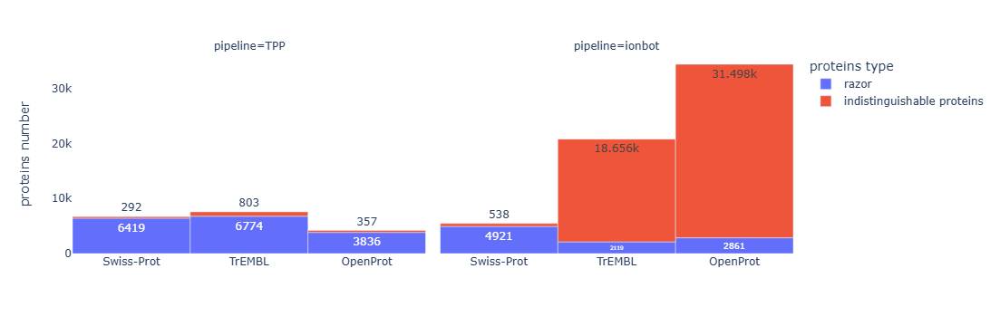

In [86]:
data=pd.DataFrame({"pipeline":["TPP"]*6+["ionbot"]*6,
 "db":['Swiss-Prot']*2+['TrEMBL']*2+['OpenProt']*2+['Swiss-Prot']*2+['TrEMBL']*2+['OpenProt']*2,
 "proteins type":["razor","indistinguishable proteins"]*6,
"var":[6419, 292]+[6774, 803]+[3836, 357]+[4921, 538 ]+[2119, 18656]+[2861, 31498],
})
fig = px.bar(data, x="db", y="var", color="proteins type", facet_col="pipeline", labels={"db":"","var":"proteins number"},
            text_auto=True)
fig.update_layout(
    plot_bgcolor="white",
    paper_bgcolor="white",
    bargap=0
)
fig.write_image("F2A_prot_db_pipeline.svg",format='svg')
fig.show()

#### B. Reproducibility of protein detection across samples with each pipeline for each database. 

In [87]:
prot_reproduce_ionbot=pd.DataFrame(columns=["pipeline","database","level","protein","frequency"]);
for database, group in combined_proteins_ocacam_newop.groupby(["searchDB"]):
    group.drop_duplicates(["proteins","experiment"],inplace=True)
    group_sig=group[group.level=="Singleton"]    
    counts_sig=group_sig.proteins.value_counts().to_dict()
    frq_sig={p:n/23 for p,n in counts_sig.items()}
    prot_sing=set(counts_sig.keys())
    #it treaky, because in different samples protein can be in group of several entries
    group_uplim=group[group.level=="Group"]
    prot_uplim_exp={file:set([p for i,row in sub.iterrows() for p in row["proteins"].split(",")]) for file,sub in group_uplim.groupby("experiment")}
    #subtract singeltons
    prot_uplim_corr={file:list(prots-set(group_sig[group_sig.experiment==file].proteins.tolist())) for file,prots in prot_uplim_exp.items()}      
    #unlist
    counts_uplim=Counter([el for l in prot_uplim_corr.values() for el in l])
    frq_uplim={p:n/23 for p,n in counts_uplim.items()}
    #print(prot_uplim_corr)
    L=len(frq_sig)+len(frq_uplim)
    tmp={"pipeline":["ionbot"]*L,"database":[database[0]]*L,"level":["razor"]*len(frq_sig)+["from group"]*len(frq_uplim),
         "protein":list(frq_sig.keys())+list(frq_uplim.keys()),"frequency":list(frq_sig.values())+list(frq_uplim.values())
        }
    prot_reproduce_ionbot=pd.concat([prot_reproduce_ionbot,pd.DataFrame(tmp)])

In [88]:
prot_reproduce_tpp=pd.read_pickle("prot_reproduce_tpp.pkl")

a=pd.concat([prot_reproduce_ionbot,prot_reproduce_tpp])
print("clipped %",(len(a[a["frequency"]>=0.7])/len(a))*100)
for i,(database, group) in enumerate(a.groupby("database")):
    fig1 = go.Figure()
    num_bins = 10
    #ionbot: do not devide by level
    #data=group[(group.level=="razor")&(group.pipeline=="ionbot")].frequency.to_numpy()
    #bin_size = (max(data) - min(data)) / num_bins
    #fig1.add_trace(go.Histogram(x=data, xbins=dict(start=min(data), end=max(data), size=bin_size),
    #                          name="razor"))
    #data=group[(group.level=="from group")&(group.pipeline=="ionbot")].frequency.to_numpy()
    #bin_size = (max(data) - min(data)) / num_bins
    #fig1.add_trace(go.Histogram(x=data, xbins=dict(start=min(data), end=max(data), size=bin_size),
    #                          name="from group"))
    data=group[(group.pipeline=="ionbot")].frequency.to_numpy()
    bin_size = (max(data) - min(data)) / num_bins
    fig1.add_trace(go.Histogram(x=data, xbins=dict(start=min(data), end=max(data), size=bin_size),
                              name="ionbot"))
    # The two histograms are drawn on top of another
    fig1.update_traces(marker=dict(color=project_palette2[f"ionbot_{database}"]))#barmode='stack'
    
    #TPPdo not devide by level
    fig2 = go.Figure()
    #data=group[(group.level=="razor")&(group.pipeline=="TPP")].frequency.to_numpy()
    #bin_size = (max(data) - min(data)) / num_bins
    #fig2.add_trace(go.Histogram(x=data, xbins=dict(start=min(data), end=max(data), size=bin_size),
    #                          name="razor"))
    #data=group[(group.level=="from group")&(group.pipeline=="TPP")].frequency.to_numpy()
    #bin_size = (max(data) - min(data)) / num_bins
    #fig2.add_trace(go.Histogram(x=data, xbins=dict(start=min(data), end=max(data), size=bin_size),
    #                          name="from group"))
    data=group[(group.pipeline=="TPP")].frequency.to_numpy()
    bin_size = (max(data) - min(data)) / num_bins
    fig2.add_trace(go.Histogram(x=data, xbins=dict(start=min(data), end=max(data), size=bin_size),
                              name="TPP"))
    
    # The two histograms are drawn on top of another
    #fig2.update_layout(barmode='stack')
    fig2.update_traces(marker=dict(color=project_palette2[f"TPP_{database}"]))

    #combine
    combined_fig = go.Figure()
    combined_fig.add_traces(fig1.data + fig2.data)  # Add traces from both figures    
    # Set layout for overlay
    attribute= "Swiss-Prot" if database=="canon" else "TrEMBL" if database=="trembl" else "OpenProt"
    if i==1:
        combined_fig.update_layout(plot_bgcolor="white",
                    paper_bgcolor="white",barmode='overlay',xaxis_range=[0,0.7],
                              title = attribute,yaxis_title="proteins number",title_x=0.5)
    if i==2:    
        combined_fig.update_layout(plot_bgcolor="white",
                    paper_bgcolor="white",barmode='overlay',xaxis_range=[0,0.7],
                              title = attribute,title_x=0.5,xaxis_title="occurrence across samples")
    else:
        combined_fig.update_layout(plot_bgcolor="white",
                        paper_bgcolor="white",barmode='overlay',xaxis_range=[0,0.7],
                                  title = attribute,title_x=0.5)
    combined_fig.write_image(f"F2B_prot_reproduce_{database}.svg",format='svg')
    combined_fig.show()

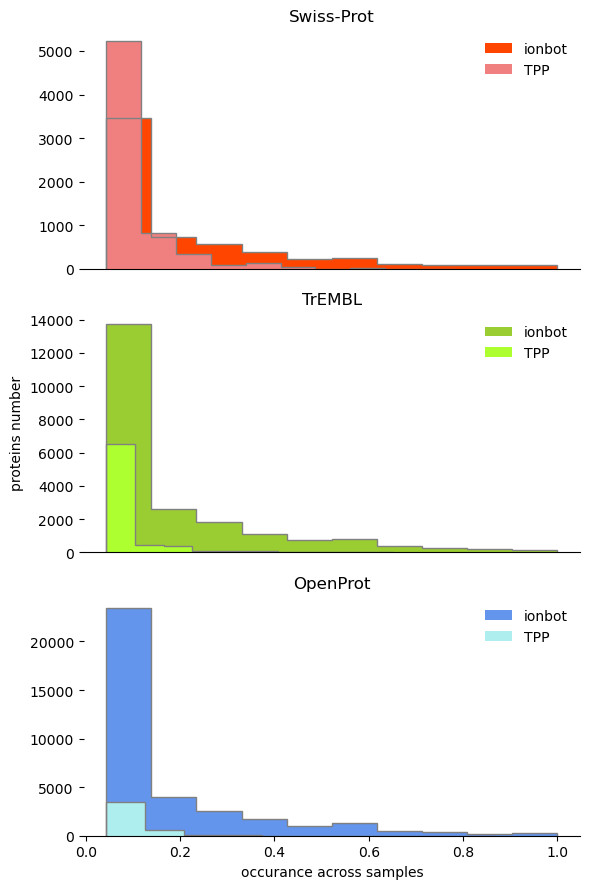

In [89]:
a=pd.concat([prot_reproduce_ionbot,prot_reproduce_tpp])

#print("clipped %",(len(a[a["frequency"]>=0.6])/len(a))*100)
#countries = [x for x in np.unique(a["class"])]
pipeline = ["TPP","ionbot"]
gs = (grid_spec.GridSpec(3,1))
#gs.update(hspace= 0.1)
fig = plt.figure(figsize=(6,9))
i = 0
#creating empty list
ax_objs = []
for i,database in enumerate(["canon","trembl","openprot"]):
    group=a.groupby("database").get_group(database)
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))
    v1=group[(group.pipeline=="ionbot")].frequency.to_numpy()
    ax_objs[-1].hist(v1,bins=10,#weights=np.zeros_like(v1) + 1. / len(v1),
                     histtype=u'step',edgecolor='grey', linewidth=1)
    ax_objs[-1].hist(v1,bins=10,#weights=np.zeros_like(v1) + 1. / len(v1),
                     alpha=1,color=project_palette2[f"{ pipeline[1]}_{database}"],
                    label=pipeline[1])

    
    v2=group[(group.pipeline=="TPP")].frequency.to_numpy()
    ax_objs[-1].hist(v2,bins=10,#weights=np.zeros_like(v2) + 1. / len(v2),
                     alpha=1,color=project_palette2[f"{ pipeline[0]}_{database}"],
                    label=pipeline[0])
    ax_objs[-1].hist(v2,bins=10,#weights=np.zeros_like(v2) + 1. / len(v2),
                     histtype=u'step',edgecolor='grey', linewidth=1)

    # make background transparent
    rect = ax_objs[-1].patch
    rect.set_alpha(0)

    # remove borders, axis ticks, and labels
    if i==1:
        ax_objs[-1].set_ylabel("proteins number", fontsize=10)
    #ax_objs[-1].set_yticks(np.arange(0, 1.1, 0.25))
    
    if i == 2:
        ax_objs[-1].set_xlabel("occurance across samples", fontsize=10)
    else:
        ax_objs[-1].set_xticks([])
    
    spines = ["top","right","left"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)
    attribute= "Swiss-Prot" if database=="canon" else "TrEMBL" if database=="trembl" else "OpenProt"
    ax_objs[-1].set_title(attribute)
    frame=ax_objs[-1].legend()
    frame.get_frame().set_edgecolor("white")

    i += 1

plt.tight_layout()
plt.savefig("F2B_prot_reproduce_.svg",format='svg')
plt.show()

#### C. # identification per protein class (non-canonical, canonical) between pipelines.  

In [90]:
for (search,protein_class),group in combined_proteins_ocacam_newop.groupby(["searchDB","FDRGroup"]):
    group_sing=group[group.level=="Singleton"]
    group_uplim=group[group.level=="Group"]
    prot_sing=set(group_sing.proteins.tolist())
    prot_uplim=set([p for g in group_uplim.proteins.tolist() for p in g.split(",")])
    print(search,protein_class,len(prot_sing),len(prot_uplim-prot_sing))

canon Canon 4921 538
openprot Canon 1359 31938
openprot NonCanon 1502 0
trembl Canon 2119 18656


In [91]:
np.sum([1475,32443]+[636,113])

34667

In [283]:
#["razor","from group"]*2
#TPP
noncanon 1217 0
canon 3631 357

['razor', 'from group', 'razor', 'from group']

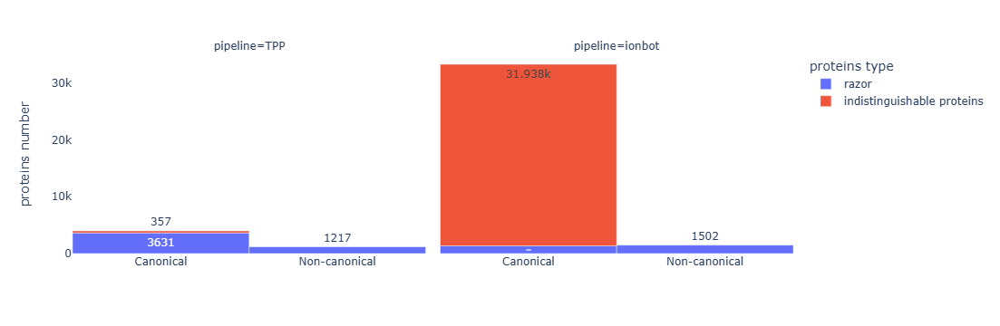

In [92]:
data=pd.DataFrame({"pipeline":["TPP"]*4+["ionbot"]*4,
 "db":['Canonical']*2+['Non-canonical']*2+['Canonical']*2+['Non-canonical']*2,
 "proteins type":["razor","indistinguishable proteins"]*4,
"var":[3631, 357]+[1217, 0]+[1359, 31938]+[1502, 0],
})
fig = px.bar(data, x="db", y="var", color="proteins type", facet_col="pipeline", labels={"db":"","var":"proteins number"},
            text_auto=True)
fig.update_layout(
    plot_bgcolor="white",
    paper_bgcolor="white",
    bargap=0
)
fig.write_image("F2C_prot_db_pipeline.svg",format='svg')
fig.show()

#### D. # Peptides per protein (cf figure bioRxiv) per protein class (for canonical proteins: 2 colors, 1 for unique peptide, 1 for common peptides) for each pipeline.  (->divide both canon and non-canon)

In [93]:
def get_frompepdf_pepcounts(pep_df,peptide_class,proteins):
    d=dict(zip(set(proteins),[0]*len(set(proteins))))
    cl_pep_df=pep_df[(pep_df.peptide_class==peptide_class)&(pep_df.proteins_x_expand.isin(set(proteins)))]
    cl_pep_df_counts=Counter(cl_pep_df.proteins_x_expand.tolist())
    d.update(cl_pep_df_counts)
    return  d
    
def get_frompsmdf_psmcounts(pep_df,psm_df,peptide_class,proteins):
    d=dict(zip(set(proteins),[0]*len(set(proteins))))
    cl_peps=pep_df[(pep_df.peptide_class==peptide_class)&(pep_df.proteins_x_expand.isin(set(proteins)))].database_peptide.tolist()
    cl_psm_df_counts=Counter(psm_df[psm_df.database_peptide.isin(cl_peps)].proteins_expand.tolist())
    del_keys=set(cl_psm_df_counts.keys())-set(proteins)
    for k in del_keys:
        del cl_psm_df_counts[k]
    d.update(cl_psm_df_counts)
    #d={k:v for k,v in d.items() if k in proteins} #exidantly sliped in proteins with same peps
    
    return d

In [94]:
peptide_df=pd.concat([combined_peptides_datasets[dataset_name]["openprot"] for dataset_name in combined_peptides_datasets])
peptide_df['proteins_x_expand'] = peptide_df.proteins_x.apply(lambda x: [p.split("((")[0] for p in x.split("||")])
peptide_df = peptide_df.explode('proteins_x_expand').reset_index(drop=True)
#peptide_df.to_pickle("protein_expended_combined_peptides.pkl")
psm_df=pd.concat([combined_first_datasets[dataset_name]["openprot"] for dataset_name in combined_first_datasets])
psm_df['proteins_expand'] = psm_df.proteins.apply(lambda x: [p.split("((")[0] for p in x.split("||")])
psm_df = psm_df.explode('proteins_expand').reset_index(drop=True)
#psm_df.to_pickle("protein_expended_combined_first.pkl")

In [95]:
peptide_df=pd.read_pickle("protein_expended_combined_peptides.pkl")
peptide_df.drop_duplicates(['database_peptide','proteins_x_expand'],inplace=True)

In [96]:
psm_df=pd.read_pickle("protein_expended_combined_first.pkl")
#psm_df.drop_duplicates(['database_peptide','proteins_expand'],inplace=True)

In [97]:
proteins_pep_df=pd.DataFrame(columns=["proteins_","protein_class","Unique","Shared"])
proteins_psm_df=pd.DataFrame(columns=["proteins_","protein_class","Unique","Shared"])

for protein_class,group in combined_proteins_ocacam_newop[combined_proteins_ocacam_newop.searchDB=="openprot"].groupby(["FDRGroup"]):
    print(protein_class)
    if protein_class[0]=="Canon": peptide_class="Canon_unique"                
    elif protein_class[0]=="NonCanon": peptide_class="NonCanon_unique"
    proteins=group[group.level=="Singleton"].proteins.tolist()+[p for g in group[group.level=="Group"].proteins.tolist() for p in g.split(",")]
    print("add prots",len(list(set(proteins))))

    cl_unique_pep_df_counts=get_frompepdf_pepcounts(peptide_df,peptide_class,proteins)
    cl_shared_pep_df_counts=get_frompepdf_pepcounts(peptide_df,"Shared",proteins)
    print("add pep counts",len(cl_shared_pep_df_counts))
    add_pr=set(proteins)
    prot_pep_df=pd.DataFrame({"proteins_":list(add_pr),"protein_class":[protein_class[0]]*len(add_pr),
                 "Unique":list(cl_unique_pep_df_counts.values()),
                 "Shared":list(cl_shared_pep_df_counts.values())})
    
    proteins_pep_df=pd.concat([proteins_pep_df,prot_pep_df])
    print(proteins_pep_df.head())
    #psm    
    cl_unique_psm_df_counts=get_frompsmdf_psmcounts(peptide_df,psm_df,peptide_class,proteins)
    cl_shared_psm_df_counts=get_frompsmdf_psmcounts(peptide_df,psm_df,"Shared",proteins)
    prot_psm_df=pd.DataFrame({"proteins_":list(add_pr),"protein_class":[protein_class[0]]*len(add_pr),
                 "Unique":list(cl_unique_psm_df_counts.values()),
                 "Shared":list(cl_shared_psm_df_counts.values())})
    proteins_psm_df=pd.concat([proteins_psm_df,prot_psm_df])
    print(proteins_psm_df.head())

('Canon',)
add prots 33297
add pep counts 33297
    proteins_ protein_class Unique Shared
0  A0A0A0MRX2         Canon      3      0
1      B7ZLK2         Canon      0      2
2  A0A096LP12         Canon      0      5
3    Q13409-2         Canon      0     13
4      E5RHG6         Canon      0     11
    proteins_ protein_class Unique Shared
0  A0A0A0MRX2         Canon      8      0
1      B7ZLK2         Canon      0      2
2  A0A096LP12         Canon      0     18
3    Q13409-2         Canon      0     48
4      E5RHG6         Canon      0     39
('NonCanon',)
add prots 1502
add pep counts 1502
    proteins_ protein_class Unique Shared
0  A0A0A0MRX2         Canon      3      0
1      B7ZLK2         Canon      0      2
2  A0A096LP12         Canon      0      5
3    Q13409-2         Canon      0     13
4      E5RHG6         Canon      0     11
    proteins_ protein_class Unique Shared
0  A0A0A0MRX2         Canon      8      0
1      B7ZLK2         Canon      0      2
2  A0A096LP12        

In [98]:
proteins_pep_df.Unique.max(),proteins_pep_df.Shared.max()

(286, 148)

In [99]:
proteins_pep_df[proteins_pep_df.Shared==148]

,proteins_,protein_class,Unique,Shared
32719,O75369-8,Canon,0,148


In [100]:
proteins_pep_df_tpp=pd.read_pickle("proteins_pep_df.pkl")

In [101]:
proteins_pep_df.protein_class.value_counts()

protein_class
Canon       33297
NonCanon     1502
Name: count, dtype: int64

0 TPP
0 Canon
1 NonCanon
1 ionbot
0 Canon
1 NonCanon


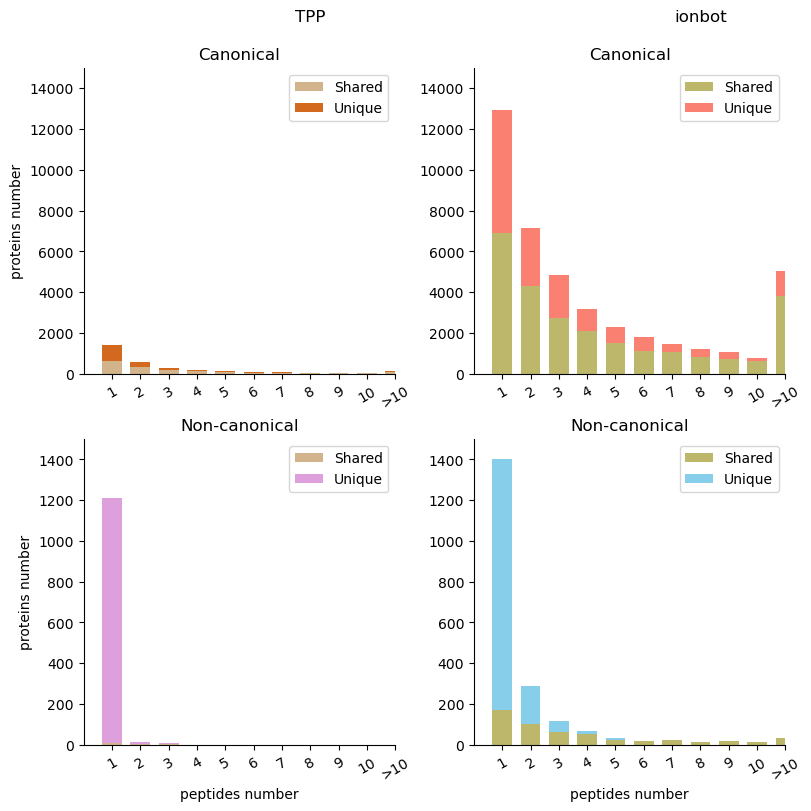

In [102]:
fig, axes = plt.subplots(2,2, layout='constrained',figsize=(8, 8))
clip_st=10
for j,(pipeline,proteins_pepdf) in enumerate(zip(["TPP","ionbot"],[proteins_pep_df_tpp,proteins_pep_df])):
    print(j,pipeline)
    for i,(protein_class,group) in enumerate(proteins_pepdf.groupby("protein_class")):
        print(i,protein_class)
        attribute1="shared" 
        attribute2="noncanon_unique" if protein_class=="NonCanon" else "canon_unique"
        attribute3= "Non-canonical" if protein_class=="NonCanon" else "Canonical"
        m=np.max([group.Unique.max(),group.Shared.max()])
        x_sh=dict(zip(list(range(m)),[0]*m)); x_un=dict(zip(list(range(m)),[0]*m))
        #n pep: n prot
        x_sh.update(Counter(group.Shared)); x_un.update(Counter(group.Unique))
        del x_sh[0] ; del x_un[0]
        if len(x_sh)>clip_st: x_sh[clip_st+1]=np.sum(np.array(list(x_sh.values()))[clip_st+1:len(x_sh)]);
        if len(x_un)>clip_st: x_un[clip_st+1]=np.sum(np.array(list(x_un.values()))[clip_st+1:len(x_un)])
        axes[i,j].bar(list(x_sh.keys()),list(x_sh.values()),color=project_palette2[f"{pipeline}_{attribute1}"],label="Shared",width=0.7);
        if len(x_un)<len(x_sh):
            b=np.array(list(x_sh.values()))[:-abs(len(x_un)-len(x_sh))]
        elif len(x_un)>len(x_sh):
            b=np.append(np.array(list(x_sh.values())),np.array([0]*abs(len(x_un)-len(x_sh))))
        else:
            b=np.array(list(x_sh.values()))
        axes[i,j].bar(list(x_un.keys()),list(x_un.values()),bottom=b,color=project_palette2[f"{pipeline}_{attribute2}"],label="Unique",width=0.7);
        axes[i,j].set_xlim(0,clip_st+1);
        if i==0: axes[i,j].set_ylim(-1,15000);
        if i==1: axes[i,j].set_ylim(-1,1500);   
        if i==0: axes[i,j].text(8, 17500, pipeline, fontsize=12, ha='center', va='center')
        if j==0: axes[i,j].set_ylabel("proteins number")
        if i==1: axes[i,j].set_xlabel("peptides number")
        axes[i,j].set_xticks(range(1,clip_st+2),[str(i) for i in range(1,clip_st+1)]+[f">{clip_st}"],rotation=30)
        axes[i,j].set_title(attribute3)
        axes[i,j].legend()
        spines = ["top","right"]
        for s in spines:
            axes[i,j].spines[s].set_visible(False)
plt.savefig("F2D_pep_perprot.svg",format='svg')
#do bin that accumulates cliped

#### E. # PSMs per protein (cf figure bioRxiv) per protein class (for canonical proteins: 2 colors, 1 for unique peptide, 1 for common peptides) for each pipeline. 

In [103]:
proteins_psm_df_tpp=pd.read_pickle("proteins_psm_df.pkl")

In [104]:
#something is weird, it looks like peptides...

0 TPP
0 Canon
1 NonCanon
1 ionbot
0 Canon
1 NonCanon


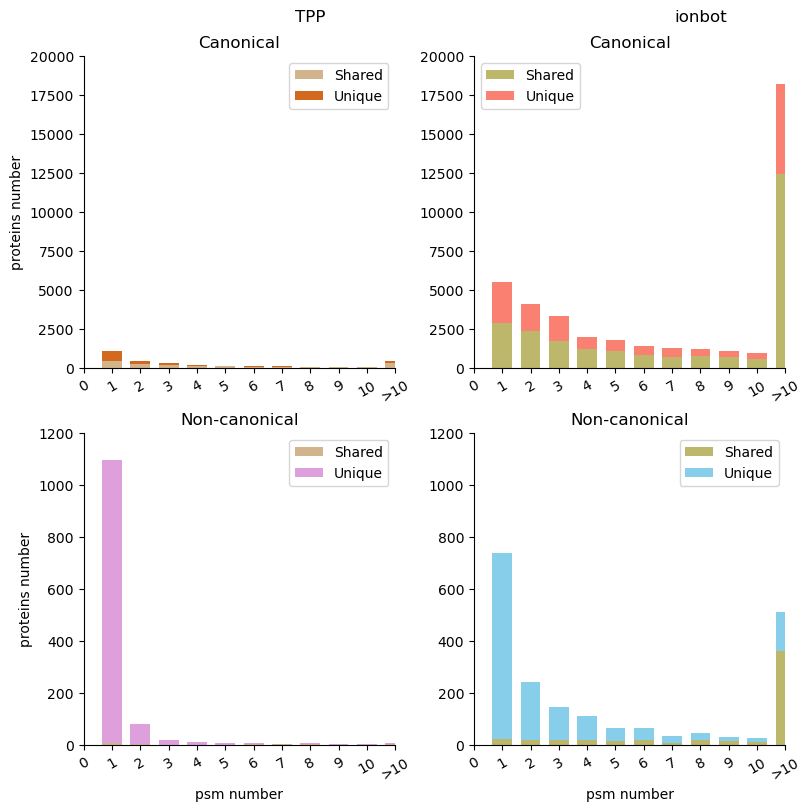

In [105]:
fig, axes = plt.subplots(2,2, layout='constrained',figsize=(8, 8))
clip_st=10
#pipeline="ionbot"
for j,(pipeline,proteins_psmdf) in enumerate(zip(["TPP","ionbot"],[proteins_psm_df_tpp,proteins_psm_df])):
    print(j,pipeline)
    for i,(protein_class,group) in enumerate(proteins_psmdf.groupby("protein_class")):
        print(i,protein_class)
        attribute1="shared" 
        attribute2="noncanon_unique" if protein_class=="NonCanon" else "canon_unique"
        attribute3= "Non-canonical" if protein_class=="NonCanon" else "Canonical"
        m=np.max([group.Unique.max(),group.Shared.max()])
        x_sh=dict(zip(list(range(m)),[0]*m)); x_un=dict(zip(list(range(m)),[0]*m))
        #n pep: n prot
        x_sh.update(Counter(group.Shared)); x_un.update(Counter(group.Unique))
        del x_sh[0] ; del x_un[0]
        if len(x_sh)>clip_st: 
            x_sh[clip_st+1]=np.sum(np.array(list(x_sh.values()))[clip_st+1:len(x_sh)]); 
            for k in list(x_sh.keys())[clip_st+2:]: del x_sh[k]
        if len(x_un)>clip_st: 
            x_un[clip_st+1]=np.sum(np.array(list(x_un.values()))[clip_st+1:len(x_un)]); 
            for k in list(x_un.keys())[clip_st+2:]: del x_un[k]
        axes[i,j].bar(list(x_sh.keys()),list(x_sh.values()),color=project_palette2[f"{pipeline}_{attribute1}"],label="Shared",width=0.7);
        if len(x_un)<len(x_sh):
            b=np.array(list(x_sh.values()))[:-abs(len(x_un)-len(x_sh))]
        elif len(x_un)>len(x_sh):
            b=np.append(np.array(list(x_sh.values())),np.array([0]*abs(len(x_un)-len(x_sh))))
        else:
            b=np.array(list(x_sh.values()))
        axes[i,j].bar(list(x_un.keys()),list(x_un.values()),bottom=b,color=project_palette2[f"{pipeline}_{attribute2}"],label="Unique",width=0.7);
        axes[i,j].set_xlim(0,clip_st+1);
        if i==0: axes[i,j].set_ylim(-1,20000);
        if i==1: axes[i,j].set_ylim(-1,1200);   
        if i==0: axes[i,j].text(8, 22500, pipeline, fontsize=12, ha='center', va='center')
        if j==0: axes[i,j].set_ylabel("proteins number")
        if i==1: axes[i,j].set_xlabel("psm number")
        axes[i,j].set_xticks(range(clip_st+2),[str(i) for i in range(clip_st+1)]+[f">{clip_st}"],rotation=30)
        axes[i,j].set_title(attribute3)
        axes[i,j].legend()
        spines = ["top","right"]
        for s in spines:
            axes[i,j].spines[s].set_visible(False)
plt.savefig("F2E_psm_perprot.svg",format='svg')
#do bin that accumulates cliped

In [ ]:
#here unique means unique to protein class, and shared between clases. But, the number of raly unique peptides is different

In [ ]:
#other way to visualise panel D and E - scterplot #peptides, #psm , where point size is # of proteins

In [106]:
import plotly.express as px

In [107]:
proteins_psm_pep_df=proteins_psm_df.merge(proteins_pep_df,on='proteins_',suffixes=("_psm","_pep"))
psm_pep_unique_n_df=pd.DataFrame(columns=["Unique_psm","Unique_pep","prots_n"])
for (psm_n,pep_n,protein_class),group in proteins_psm_pep_df.groupby(["Unique_psm","Unique_pep","protein_class_psm"]):
    if protein_class=="Canon": continue
    psm_pep_unique_n_df.loc[len(psm_pep_unique_n_df)]=[psm_n,pep_n,len(group)]#/len(proteins_psm_pep_df[proteins_psm_pep_df.protein_class_psm==protein_class]

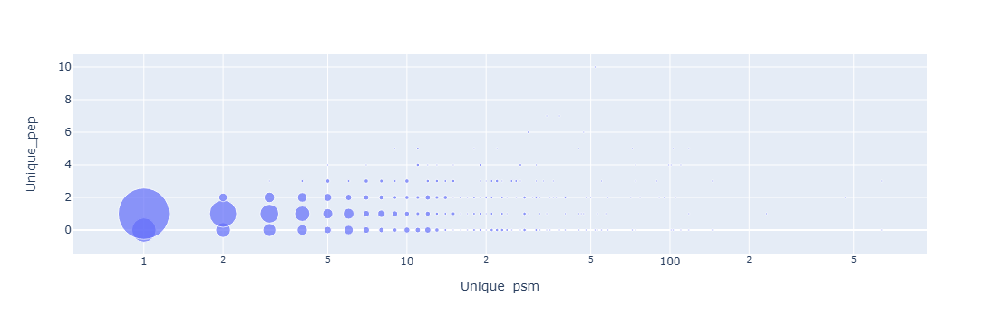

In [108]:
fig = px.scatter(psm_pep_unique_n_df, x="Unique_psm", y="Unique_pep",
	         size="prots_n",# color="continent",
                log_x=True,size_max=40)
fig.show()

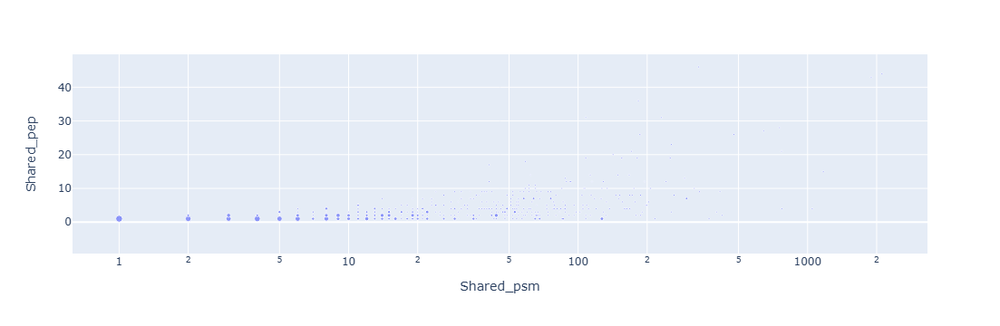

In [109]:
proteins_psm_pep_df=proteins_psm_df.merge(proteins_pep_df,on='proteins_',suffixes=("_psm","_pep"))
psm_pep_unique_n_df=pd.DataFrame(columns=["Shared_psm","Shared_pep","prots_n"])
for (psm_n,pep_n,protein_class),group in proteins_psm_pep_df.groupby(["Shared_psm","Shared_pep","protein_class_psm"]):
    if protein_class=="Canon": continue
    psm_pep_unique_n_df.loc[len(psm_pep_unique_n_df)]=[psm_n,pep_n,len(group)]
fig = px.scatter(psm_pep_unique_n_df, x="Shared_psm", y="Shared_pep",
	         size="prots_n",# color="continent",
                log_x=True,size_max=30
                )
fig.show()

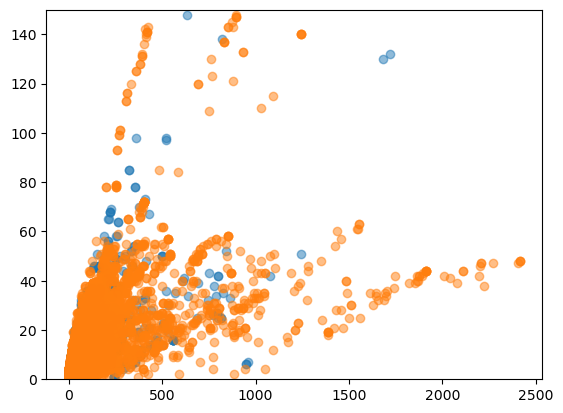

In [110]:
plt.scatter(proteins_psm_df[proteins_psm_df.protein_class=="Canon"].Unique,proteins_pep_df[proteins_pep_df.protein_class=="Canon"].Unique,alpha=0.5);
plt.scatter(proteins_psm_df[proteins_psm_df.protein_class=="Canon"].Shared,proteins_pep_df[proteins_pep_df.protein_class=="Canon"].Shared,alpha=0.5);
plt.ylim(0,150);

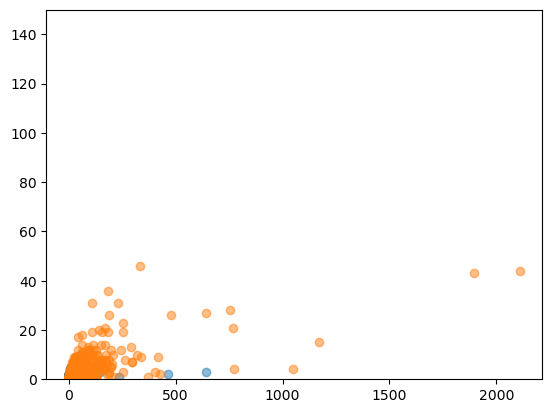

In [111]:
plt.scatter(proteins_psm_df[proteins_psm_df.protein_class=="NonCanon"].Unique,proteins_pep_df[proteins_pep_df.protein_class=="NonCanon"].Unique,alpha=0.5);
plt.scatter(proteins_psm_df[proteins_psm_df.protein_class=="NonCanon"].Shared,proteins_pep_df[proteins_pep_df.protein_class=="NonCanon"].Shared,alpha=0.5);
plt.ylim(0,150);

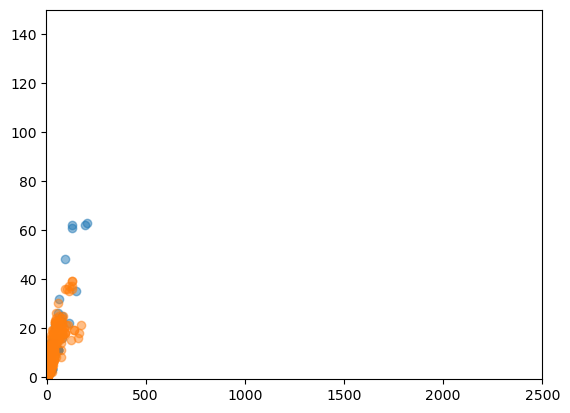

In [112]:
plt.scatter(proteins_psm_df_tpp[proteins_psm_df_tpp.protein_class=="Canon"].Unique,proteins_pep_df_tpp[proteins_pep_df_tpp.protein_class=="Canon"].Unique,alpha=0.5);
plt.scatter(proteins_psm_df_tpp[proteins_psm_df_tpp.protein_class=="Canon"].Shared,proteins_pep_df_tpp[proteins_pep_df_tpp.protein_class=="Canon"].Shared,alpha=0.5);
plt.ylim(-1,150);
plt.xlim(-1,2500);

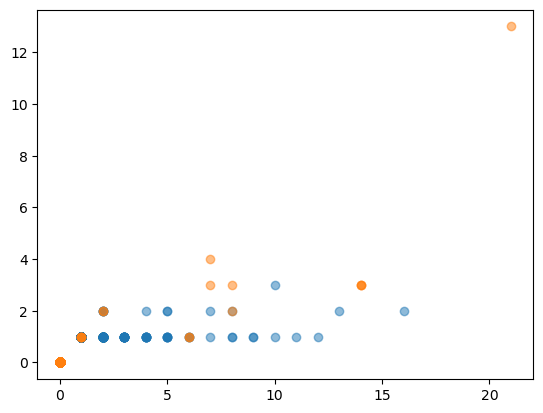

In [113]:
plt.scatter(proteins_psm_df_tpp[proteins_psm_df_tpp.protein_class=="NonCanon"].Unique,proteins_pep_df_tpp[proteins_pep_df_tpp.protein_class=="NonCanon"].Unique,alpha=0.5);
plt.scatter(proteins_psm_df_tpp[proteins_psm_df_tpp.protein_class=="NonCanon"].Shared,proteins_pep_df_tpp[proteins_pep_df_tpp.protein_class=="NonCanon"].Shared,alpha=0.5);

In [114]:
proteins_psm_pep_df_tpp=proteins_psm_df_tpp.merge(proteins_pep_df_tpp,on='proteins_',suffixes=("_psm","_pep"))
psm_pep_unique_n_df_tpp=pd.DataFrame(columns=["Unique_psm","Unique_pep","prots_n"])
for (psm_n,pep_n,protein_class),group in proteins_psm_pep_df_tpp.groupby(["Unique_psm","Unique_pep","protein_class_psm"]):
    if protein_class=="Canon": continue
    psm_pep_unique_n_df_tpp.loc[len(psm_pep_unique_n_df_tpp)]=[psm_n,pep_n,len(group)]

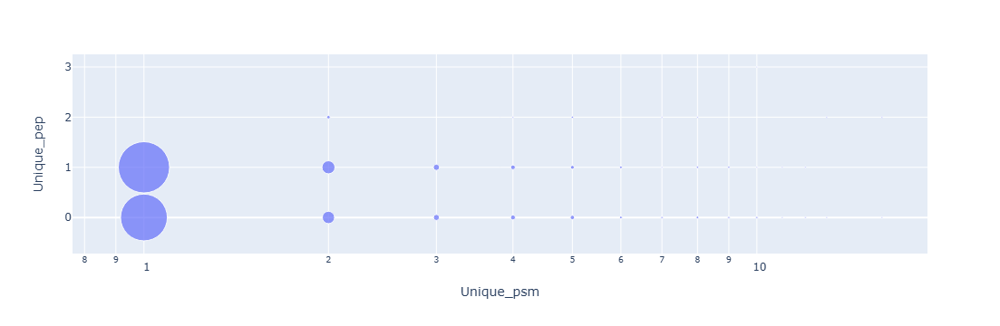

In [115]:
fig = px.scatter(psm_pep_unique_n_df_tpp, x="Unique_psm", y="Unique_pep",
	         size="prots_n",# color="continent",
                log_x=True,size_max=40)
fig.show()

#### F. Coverage...  

In [ ]:
#ridge plot?

In [116]:
all_peptide_sequences=pickle.load(open('all_peptide_sequences_OP_7302.pkl', 'rb'))
is_unique=pickle.load(open('is_unique_OP_7302.pkl', 'rb'))

In [117]:
#get positions of in silico digestion unique peptides
#leave only proteins that were identified
proteins_op=combined_proteins_ocacam_newop[combined_proteins_ocacam_newop.level=="Singleton"].proteins.tolist()+[p for g in combined_proteins_ocacam_newop[combined_proteins_ocacam_newop.level=="Group"].proteins.tolist() for p in g.split(",")]
#filterout proteins with shared peptide
peptide_df_identunique=peptide_df[(peptide_df.peptide_class.isin(["Canon_unique","NonCanon_unique"]))&(peptide_df.proteins_x_expand.isin(set(proteins_op)))]

In [118]:
peptide_df_identunique["peptide_position"]=peptide_df_identunique["proteins_x"].apply(lambda x: x.split("((")[1].split("))")[0].split("-"))

In [119]:
#correct for python indexing
peptide_df_identunique["peptide_position"]=peptide_df_identunique["peptide_position"].apply(lambda x: (int(x[0])-1,int(x[1])-2))

In [120]:
#filterout non-unique peptides
peptide_df_identunique["shared"]=peptide_df_identunique["proteins_x"].apply(lambda x: "||" in x )

In [121]:
#so few unique
peptide_df_identunique.shared.value_counts()

shared
True     71255
False     4298
Name: count, dtype: int64

In [122]:
peptide_df_identunique=peptide_df_identunique[peptide_df_identunique.shared==False]

In [123]:
all_peptide_sequences_identunique={}
all_peptide_sequences_prot=[p.split("|")[1] for p in all_peptide_sequences.keys()]
for prot_i in set(peptide_df_identunique.proteins_x_expand.tolist()):
    prot=f'op|{prot_i}|TX=9606'
    peps=all_peptide_sequences[prot]
    peps_unique=[is_unique[p]  for p in peps] #if p in peptide_df_identunique[peptide_df_identunique.proteins_x_expand==prot_i].database_peptide.tolist()
    peps_unique=np.array(peps)[peps_unique]
    all_peptide_sequences_identunique[prot_i]=peps_unique

In [132]:
all_peptide_sequences_identunique_pos={}
for prot_i,uniquepeps in all_peptide_sequences_identunique.items():
    group=pd.DataFrame({"database_peptide":list(uniquepeps),"peptide_position":[np.nan]*len(uniquepeps)})
    prot_seq=str(OPfasta[f'op|{prot_i}|TX=9606'].seq)
    uniquepeps_pos=[]
    for pep in uniquepeps:
        #print(pep)
        pos=get_pep_positions(prot_seq,pep)
        if len(pos)>1: pos=[pos[0]]
        uniquepeps_pos=uniquepeps_pos+pos
    group["peptide_position"]=uniquepeps_pos
    all_peptide_sequences_identunique_pos[prot_i]=group

In [133]:
#get the number of aninoasids coverged with unique peptides
all_peptide_sequences_identunique_pos_wident={}
for prot_i,uniquepeps_df in all_peptide_sequences_identunique_pos.items():
    ident_df=peptide_df_identunique.groupby("proteins_x_expand").get_group(prot_i)
    all_peptide_sequences_identunique_pos_wident[prot_i]=uniquepeps_df.merge(ident_df[["database_peptide","peptide_position"]],how="outer",on="database_peptide")

In [136]:
unique_peptide_aa_coverege={}
for prot_i,uniquepeps_df in all_peptide_sequences_identunique_pos_wident.items():
    #if peptide not known by in situ, add it
    
    #uniquepeps_df["peptide_position_y"]=uniquepeps_df["peptide_position_y"].apply(lambda x: x if isinstance(x,tuple) else (0,0))
    uniquepeps_df.loc[uniquepeps_df.peptide_position_x.isna(),"peptide_position_x"]= uniquepeps_df.loc[uniquepeps_df.peptide_position_x.isna(),"peptide_position_y"]

    _,theory=find_max_length_in_overlap_groups(uniquepeps_df.peptide_position_x.tolist())
    _,practice=find_max_length_in_overlap_groups(uniquepeps_df[~uniquepeps_df.peptide_position_y.isna()].peptide_position_y.tolist())#drop nan
    theory_cov=np.sum([abs(rang[0]-rang[1]) for rang in theory])
    practice_cov=np.sum([abs(rang[0]-rang[1]) for rang in practice])
    ratio=practice_cov/theory_cov
    if ratio==np.inf: ratio=1
    unique_peptide_aa_coverege[prot_i]=[ratio] #normalise by number of theoretical peptides

In [137]:
(len(uniquepeps_df[~uniquepeps_df.peptide_position_y.isna()]),len(uniquepeps_df))

(1, 2)

In [138]:
unique_peptide_aa_coverege_df=pd.DataFrame(unique_peptide_aa_coverege).T
unique_peptide_aa_coverege_df.sort_index(inplace=True)
a=peptide_df_identunique[peptide_df_identunique.proteins_x_expand.isin(unique_peptide_aa_coverege_df.index.tolist())]
a.drop_duplicates("proteins_x_expand",inplace=True,keep="first")
a.sort_values(["proteins_x_expand"],inplace=True)
unique_peptide_aa_coverege_df["peptide_class"]=a["peptide_class"].tolist()

In [139]:
unique_peptide_aa_coverege_df["pipeline"]="ionbot"

In [140]:
unique_peptide_aa_coverege_df_tpp=pd.read_pickle("unique_peptide_aa_coverege_df.pkl")

/tmp/ipykernel_820501/483381345.py:59: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



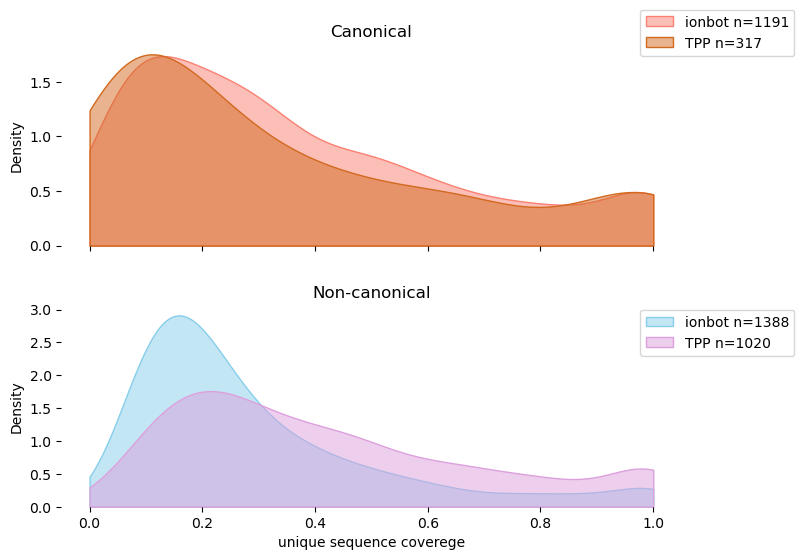

In [141]:
unique_peptide_aa_coverege_pipl=pd.concat([unique_peptide_aa_coverege_df_tpp,unique_peptide_aa_coverege_df])
gs = (grid_spec.GridSpec(2,1))
gs.update(hspace= 0.3)
fig = plt.figure(figsize=(8,6))
i = 0
#creating empty list
ax_objs = []
for attribute in ["Canonical","Non-canonical"]:
    # creating new axes object and appending to ax_objs
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))

    color= "_noncanon_unique" if attribute=="Non-canonical" else "_canon_unique"
    peptide_class="NonCanon_unique" if attribute=="Non-canonical" else "Canon_unique"
    # plotting the distribution
    data1=unique_peptide_aa_coverege_pipl.loc[(unique_peptide_aa_coverege_pipl.peptide_class==peptide_class)&(
        unique_peptide_aa_coverege_pipl.pipeline=="ionbot"),0]
    plot1 = sns.kdeplot(data1, ax=ax_objs[-1],clip=(0,1),
                        color=project_palette2[f"ionbot{color}"], lw=1,label=f"ionbot n={len(data1)}",fill=True,alpha=0.5)
    data2=unique_peptide_aa_coverege_pipl.loc[(unique_peptide_aa_coverege_pipl.peptide_class==peptide_class)&(
        unique_peptide_aa_coverege_pipl.pipeline=="TPP"),0]
    plot2 = sns.kdeplot(data2, ax=ax_objs[-1],clip=(0,1),
                        color=project_palette2[f"TPP{color}"], lw=1,label=f"TPP n={len(data2)}",fill=True,alpha=0.5)
    #plot1.set_alpha = 1
    #plot2.set_alpha = 1

    # setting uniform x and y lims
    #ax_objs[-1].set_xlim(0,pepcl_psm_frq.psm_num.max()+1)
    #ax_objs[-1].set_ylim(0,2.5)

    # make background transparent
    rect = ax_objs[-1].patch
    rect.set_alpha(0)

    # remove borders, axis ticks, and labels
    #ax_objs[-1].set_yticks([0,1.5,3],[0,1.5,3])

    if i == 1:
        ax_objs[-1].set_xlabel("unique sequence coverege", fontsize=10)
    else:
        ax_objs[-1].set_xticklabels([])
        ax_objs[-1].set_xlabel("")
    #ax_objs[-1].axes.get_xaxis().set_visible(False)
    #ax_objs[-1].axes.get_yaxis().set_visible(False)
    
    spines = ["top","right","left","bottom"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)
    
    ax_objs[-1].set_title(attribute)
    if i==0: pos=(1.05,0.95)
    if i==1: pos=(1.05,0.45)
    ax_objs[-1].legend(bbox_to_anchor=pos,bbox_transform=fig.transFigure)
    #adj_country = country.replace(" ","\n")
    #ax_objs[-1].text(-0.02,0,attribute,fontsize=10,ha="right")


    i += 1

plt.tight_layout()
plt.savefig("F2F_unique_pep_cov.svg",format='svg')
plt.show()

In [ ]:
#look at length distribution of identified with unique peptides

In [142]:
prot_wuniqpep_length_io={}
for peptide_class,group in unique_peptide_aa_coverege_df.groupby("peptide_class"):
    prot_wuniqpep_length_io[peptide_class]=[len(str(OPfasta[f'op|{prot_i}|TX=9606'].seq)) for prot_i in group.index]
prot_wuniqpep_length_tpp={}
for peptide_class,group in unique_peptide_aa_coverege_df_tpp.groupby("peptide_class"):
    prot_wuniqpep_length_tpp[peptide_class]=[len(str(OPfasta[prot_i].seq)) for prot_i in group.index]

In [143]:
len(prot_wuniqpep_length_io["Canon_unique"]),len(prot_wuniqpep_length_tpp["Canon_unique"])

(1191, 317)

In [152]:
#TPP vs ionbot - no protein length bias
print("ionbot")
a=prot_wuniqpep_length_io["Canon_unique"]
d=Counter(["<=100" if i<=100 else ">100" for i in a])
print({k:(v/np.sum(list(d.values())))*100 for k,v in d.items()})
print("TPP")
a=prot_wuniqpep_length_tpp["Canon_unique"]
d=Counter(["<=100" if i<=100 else ">100" for i in a])
print({k:(v/np.sum(list(d.values())))*100 for k,v in d.items()})

ionbot
{'>100': 92.7791771620487, '<=100': 7.220822837951301}
TPP
{'<=100': 10.410094637223976, '>100': 89.58990536277602}


In [146]:
len(prot_wuniqpep_length_io["NonCanon_unique"]),len(prot_wuniqpep_length_tpp["NonCanon_unique"])

(1388, 1020)

In [151]:
#TPP more often hits shorter non-canon proteins, thus it has better coverage
print("ionbot")
a=prot_wuniqpep_length_io["NonCanon_unique"]
d=Counter(["<=100" if i<=100 else ">100" for i in a])
print({k:(v/np.sum(list(d.values())))*100 for k,v in d.items()})
print("TPP")
a=prot_wuniqpep_length_tpp["NonCanon_unique"]
d=Counter(["<=100" if i<=100 else ">100" for i in a])
print({k:(v/np.sum(list(d.values())))*100 for k,v in d.items()})

ionbot
{'<=100': 59.798270893371765, '>100': 40.20172910662824}
TPP
{'>100': 15.294117647058824, '<=100': 84.70588235294117}


In [ ]:
#old on proteins

databases=["openprot","canon","trembl"]
dirs=["./fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-openprot/130327_o2_02_hu_P1_2hr-openprot/ionbot.first.proteins.csv",
      "./fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-canon/130327_o2_02_hu_P1_2hr.mgf.gzip/ionbot.first.proteins.csv",
     "./fromUGhent_v0114_2/PXD002057.v0.11.4/PXD002057.v0.11.4-trembl/130327_o2_02_trembl/ionbot.first.proteins.csv"]
dfs=[]
for file in dirs:
    dfs.append(pd.read_csv(file))
dfs_filtered=[df[df["protein_group_q-value"] <0.01] for df in dfs]
for df,database in zip(dfs_filtered,databases):
    print(database ,len(set( df.uniprot_id)))

def get_tpp_openprot_proteins(df_pep,df_prot):
    inffered_proteins={"Canon":0,"NonCanon":0}
    a=set(df_prot.uniprot_id.tolist())
    #filterout noncanon
    a_f=[i for i in a if not i.startswith("IP_") and not i.startswith("II_")]
    inffered_proteins["Canon"]=set(a_f)
    a=df_pep[df_pep.peptide_class=="NonCanon_unique"].proteins.tolist()
    #print(a)
    inffered_proteins["NonCanon"]=set(list([i.split("((")[0]for i in a]))
    return inffered_proteins

#filtered
combined_proteins_datasets[dataset_name]["openprot"]["protein_group_q-value"].max()
#but still, its low number of prt...

def get_prots_fromgroup(row):
    return row.split("__") if "__" in row else row
a=combined_proteins_datasets[dataset_name]["openprot"].protein_group.apply(get_prots_fromgroup).tolist()

b=[]
for i in a:
    if isinstance(i,list):
        b=b+i
    else:
        b=b+[i]
len(set(b))

len(set(combined_proteins_datasets[dataset_name]["openprot"].protein_group))

len(set(combined_proteins_datasets[dataset_name]["openprot"].uniprot_id))

#just 10 proteins are in different prot groups?
len(set(combined_proteins_datasets[dataset_name]["openprot"].uniprot_id+combined_proteins_datasets[dataset_name]["openprot"].protein_group))

bydb_proteins={"canon":[],"trembl":[]}
for db in bydb_proteins:
    for dataset_name in combined_proteins_datasets:
        bydb_proteins[db]=bydb_proteins[db]+list(set(combined_proteins_datasets[dataset_name][db].uniprot_id))
for db in bydb_proteins:
    print(db,len(set(bydb_proteins[db])))

inffered_proteins_OP={}
database="openprot"
for dataset_name in combined_proteins_datasets:
    df_pep=combined_peptides_datasets[dataset_name][database]
    df_prot=combined_proteins_datasets[dataset_name][database]
    inffered_proteins_OP[dataset_name]=get_tpp_openprot_proteins(df_pep,df_prot)

a=[]
for dataset_name in inffered_proteins_OP:
    a=a+list(inffered_proteins_OP[dataset_name]["Canon"])+list(inffered_proteins_OP[dataset_name]["NonCanon"])
print("openprot",len(set(a)))

a=[];b=[]
for dataset_name in inffered_proteins_OP:
    a=a+list(inffered_proteins_OP[dataset_name]["Canon"])
    b=b+list(inffered_proteins_OP[dataset_name]["NonCanon"])
print("openprot canon",len(set(a)))
print("openprot non-canon",len(set(b)))

#reprodusability
proteins_bydb_reprodus={}
for database in ["canon","trembl","openprot"]:
    prots=[]
    for dataset_name in combined_peptides_datasets:  
        df=combined_peptides_datasets[dataset_name][database]
        for spectrum_file in set(df.spectrum_file):
            if database=="openprot":
                df_prot=combined_proteins_datasets[dataset_name][database]
                #fix df_prot
                for spf_now,spf_right in fix_spectrum_file[dataset_name][database].items():
                    df_prot.loc[df_prot.spectrum_file==spf_now,"spectrum_file"]=spf_right
                a=get_tpp_openprot_proteins(df[df.spectrum_file==spectrum_file],df_prot[df_prot.spectrum_file==spectrum_file])
                prots=prots+list(a['Canon'])+list(a["NonCanon"])
            else:
                prots=prots+list(set(df[df.spectrum_file==spectrum_file].proteins))
    proteins_bydb_reprodus[database]=list(np.array(list(Counter(prots).values()))/23)

fig, ax = plt.subplots(layout='constrained')
for database in proteins_bydb_reprodus:
    db='Swiss-Prot' if database=="canon" else "TrEMBL" if database=='trembl' else "OpenProt"
    ax.hist(proteins_bydb_reprodus[database], weights=np.zeros_like(proteins_bydb_reprodus[database]) + 1. / len(proteins_bydb_reprodus[database]),alpha=0.5, label=db, color=project_palette[database])
ax.set_ylabel("Proteins' proportion")
ax.set_xlabel('Occurrence across samples')
ax.set_title('ionbot Protein detection across samples')
ax.set_ylim(0,1)
ax.legend(loc='upper right', ncols=1)
spines = ["top","right"]
for s in spines:
    ax.spines[s].set_visible(False)

#Peptides per protein (cf figure bioRxiv) per protein class (for canonical proteins: 2 colors, 1 for unique peptide, 1 for common peptides) for each pipeline.  

In [153]:
peptides_alldatasets_df=pd.DataFrame()
for dataset_name in combined_peptides_datasets:
    df=combined_peptides_datasets[dataset_name][database]
    peptides_alldatasets_df=pd.concat([peptides_alldatasets_df,df])

In [154]:
peptides_alldatasets_df.columns

Index(['database_peptide', 'peptide_score', 'q-value', 'PEP', 'proteins_x',
       'spectrum_file', 'proteins_y', 'peptide_class'],
      dtype='object')

In [155]:
def isprot_inlist(row):
    row=[p.split("((")[0] for p in row.split("|")]
    return any(p in proteins_cl[protein_class] for p in row)

In [156]:
byprotcl_peptides={"canon":{"Canon_unique":[],"Shared":[]},"openprot":[]}
database="openprot"
tmp_peptides_alldatasets_df=peptides_alldatasets_df.drop_duplicates(["database_peptide"])
proteins_cl={}
for protein_class in ["Canon","NonCanon"]:
    protcl=[]
    for dataset_name in inffered_proteins_OP:
        protcl=protcl+list(inffered_proteins_OP[dataset_name][protein_class])
    proteins_cl[protein_class]=set(protcl)
    print(dataset_name,protein_class)
for protein_class in ["Canon","NonCanon"]:
    print(protein_class)
    tmp_peptides_alldatasets_df[f"protein_{protein_class}"]=tmp_peptides_alldatasets_df['proteins'].apply(isprot_inlist)
#devide canon into unique and shared
byprotcl_peptides["canon"]["Canon_unique"]=set(tmp_peptides_alldatasets_df[(tmp_peptides_alldatasets_df.protein_Canon==True)&(tmp_peptides_alldatasets_df.peptide_class=="Canon_unique")].database_peptide)
byprotcl_peptides["canon"]["Shared"]=set(tmp_peptides_alldatasets_df[(tmp_peptides_alldatasets_df.protein_Canon==True)&(tmp_peptides_alldatasets_df.peptide_class=="Shared")].database_peptide)
#
byprotcl_peptides["openprot"]=set(tmp_peptides_alldatasets_df[(tmp_peptides_alldatasets_df.protein_NonCanont==True)].database_peptide)        

NameError: name 'inffered_proteins_OP' is not defined

### How many psms are unmodified/modified, how many of them are peptidoforms

In [31]:
modifications_medfrq={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_first_datasets:
    mods_med={"canon":0,"trembl":0,"openprot":0}
    for database in combined_first_datasets[dataset_name]:
        df=combined_first_datasets[dataset_name][database]
        #n=len(df[(df["database"]=="T")])
        nm=[len(df.loc[(df["database"]=="T") & (df["modifications"]=="Unmodified") & (df["spectrum_file"]==file),])/len(df.loc[(df["database"]=="T") & (df["spectrum_file"]==file),]) for file in set(df.spectrum_file)]
        mp=[len(df.loc[(df["database"]=="T") &  (df['modifications'].str.contains("_or_")) & (df["spectrum_file"]==file),])/len(df.loc[(df["database"]=="T") & (df["spectrum_file"]==file),]) for file in set(df.spectrum_file)]
        m=[(1-i-j) for i,j,file in zip(nm,mp,set(df.spectrum_file))]
        mods_med[database]=(np.median(nm),np.median(mp),np.median(m))
    modifications_medfrq[dataset_name]=mods_med

In [32]:
modifications_medfrq

{'PXD002057.v0.11.4': {'canon': (0.5473552177328739,
   0.2297735190001784,
   0.22271053012012731),
  'trembl': (0.528774393778924, 0.19018207379608038, 0.2777601669757369),
  'openprot': (0.5188774646918028, 0.18573724419527426, 0.2953852911129229)},
 'PXD003594.v0.11.4': {'canon': (0.0880065159166922,
   0.6646337491031562,
   0.24495776039283196),
  'trembl': (0.08442201108471892, 0.6648604002554299, 0.2473094274397276),
  'openprot': (0.07833602900839581, 0.649429573400808, 0.26341251272525945)},
 'PXD014258.v0.11.4': {'canon': (0.6922246220302376,
   0.09587270014917951,
   0.2051416579223505),
  'trembl': (0.6945047603140136, 0.09415421638423745, 0.20429350695055432),
  'openprot': (0.6947890818858561, 0.09238283279642523, 0.21401938851603286)}}

In [197]:
#!!!!

fig, axes = plt.subplots(1,1, figsize=(10,6))
fig.suptitle(f'Open modification search result',size=20);
ax.set_ylabel("Median frequency across samples",labelpad=30)
x=[]; y=[]; h=[]
for j,param in enumerate(["Not modified", "Modified (1 peptidoform)", "Peptidoforms"]):
    #nm can can can, tr, tr, tr, op, op, op
    x1=[db for db in modifications_medfrq['PXD002057.v0.11.4'].keys() for i in range(0,3)]
    x=x+x1
    y=y+[val[j] for dataset_name in modifications_medfrq for database,val in modifications_medfrq[dataset_name].items()]
    h=h+[param]*len(x1)
s=list(modifications_medfrq.keys())*9
#max_width=10
v=sns.violinplot(x=x, y=y,hue=h, linewidth=2, ax=axes, inner='points',fill=False); #, inner=None
colors=['blue','orange','green']*3
for i,violin in enumerate(v.collections[::2]):
    violin.set_facecolor('w')
    violin.set_edgecolor(colors[i])
axes.spines[['right', 'top']].set_visible(False)
#d=pd.DataFrame({'x':x,'y':y,'h':h,'s':s})
#box=sns.catplot(kind='box',x='x', y='y', hue='h', data=d, boxprops={'zorder': 0,'fill':False,'edgecolor':'blue'}, ax=axes, saturation=1, width=0.4,showfliers=False, notch=False, dodge=True)
#box=sns.boxplot(x='x', y='y', hue='h', data=d, boxprops={'zorder': 2,'fill':False,'edgecolor':'blue'}, ax=axes, saturation=1, width=0.4,showfliers=False, notch=False, dodge=False)

##
#box_patches = [patch for patch in box.patches if type(patch) == matplotlib.patches.PathPatch]
#num_patches = len(box_patches)
#lines_per_boxplot = len(box.lines) // num_patches
#
#for i, patch in enumerate(box_patches):
#    patch.set_edgecolor(colors[i])
#    for line in box.lines[i * lines_per_boxplot: (i + 1) * lines_per_boxplot]:
#        line.set_color(colors[i])
#box.map_dataframe(sns.stripplot, x='x', y='y', hue='h', data=d, dodge=True)
#sns.swarmplot(x=h, y=y,hue=s, dodge=True, ax=axes,marker='o')
#sns.stripplot(x=x, y=y,hue=s, dodge=True, ax=axes,jitter=True,marker='^')
#sns.stripplot(x=x, y=y,hue=s, dodge=True, ax=axes,jitter=True,marker='x')
#axes.set_xticklabels(textwrap.fill(x.get_text(), max_width) for x in axes.get_xticklabels())
#import seaborn.objects as so
#(
#    so.Plot(d, x="x", y="y", marker="s")
#    .add(so.Dot(pointsize=7, edgecolor="black"), so.Jitter(0.1),so.Dodge(0.1))
#    .on(axes)
#).theme({**sns.axes_style("ticks"), 'axes.spines.right': False, 'axes.spines.top': False}) 

### Figure 3: Importance of open modification search. 

#### A. #identified peptides only modified, only unmodified and both per peptide class ( old: # of identified peptides with at least 1 modification per peptide class. )

In [217]:
#filtered peptide level
all_peptides=pd.concat([combined_peptides_datasets[dataset]["openprot"][["database_peptide","peptide_class"]] for dataset in combined_peptides_datasets])
#take uniqly peptides
all_peptides.drop_duplicates(inplace=True)
#filtered psm level
all_pep_modf=pd.concat([combined_first_datasets[dataset]["openprot"][["database_peptide","modifications"]] for dataset in combined_peptides_datasets])
#unfiltered peptide-modification level
all_pep_modf.drop_duplicates(inplace=True)
#from psm level transfer (so filters by pep level) modifications to peptide level
all_peptides_uniqmod=all_peptides.merge(all_pep_modf,how='inner',on="database_peptide")

In [218]:
#modification frequency
all_peptides_modfrq=pd.DataFrame(columns=["database_peptide","peptide_class","modification_class"])
for peptide,group in all_peptides_uniqmod.groupby("database_peptide"):
    modification_class=0
    if len(group)==len(group[group.modifications=="Unmodified"]):
        modification_class="OnlyUnmod"
    elif len(group)==len(group[group.modifications!="Unmodified"]):
        modification_class="OnlyMod"
    else:
        modification_class="Both"
    all_peptides_modfrq.loc[len(all_peptides_modfrq)]=[peptide,group.peptide_class.iloc[0],modification_class]   

In [219]:
len(all_peptides_modfrq)==len(all_peptides)

True

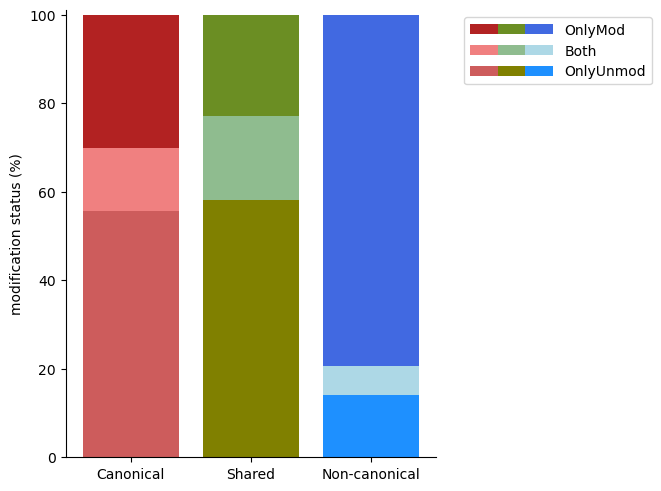

In [509]:
data=pd.DataFrame(columns=["peptide_class","modification_class","pepcl_pc"])
for (peptide_class,modification_class),group in all_peptides_modfrq.groupby(["peptide_class","modification_class"]):
    data.loc[len(data)]=[peptide_class,modification_class,
                         (len(group)/len(all_peptides_modfrq[all_peptides_modfrq.peptide_class==peptide_class]))*100]
bottom=None
x=["Canonical","Shared","Non-canonical"]
fig, ax = plt.subplots(layout='constrained')
colors=[]
for modification_class in ["OnlyUnmod","Both","OnlyMod"]:
    row=data.loc[data.modification_class==modification_class,"pepcl_pc"].tolist()
    #reorder so canon, shared, noncanon
    row=[row[0],row[2],row[1]]
    attribute= "Only modified" if modification_class=="OnlyMod" else "Only unmodified" if modification_class=="OnlyUnmod" else "Both"
    color=[project_palette2[f"ionbot_canon_unique_{modification_class}"],
                                        project_palette2[f"ionbot_shared_{modification_class}"],
                                        project_palette2[f"ionbot_noncanon_unique_{modification_class}"]]
    colors=colors+color
    ax.bar(x, row, bottom=bottom,label=attribute, color=color)
    ax.set_ylabel("modification status (%)")
    ax.set_ylim(0,101)
    if modification_class!="OnlyUnmod":
        bottom += np.array(row)
    else:
        bottom=np.array(row)
handles=[]
for ind in range(3*3):
    handles.append(plt.Rectangle((0, 0), 1, 1, facecolor=colors[ind], edgecolor=None))
handles=np.array(handles)
ax.legend(handles=[tuple(handles[[6,7,8]]),tuple(handles[[3,4,5]]), tuple(handles[[0,1,2]])], labels=["OnlyMod","Both","OnlyUnmod",],
         handlelength=6, handler_map={tuple: HandlerTuple(ndivide=None, pad=0)},
         loc="upper right",bbox_to_anchor=[1.6, 1])
spines = ["top","right"]
for s in spines:
    ax.spines[s].set_visible(False)
plt.savefig("F3A_mod_pepcl.svg",format='svg', bbox_inches = 'tight')

#### D. Frequency of the different modifications between classes (non-c, canonic, common) 

In [229]:
#take unique peptide-modification pair? (to not bias analysis with aboundant peptides)
#take 1 unique modification per peptide
all_uniq_pepmod=pd.DataFrame(columns=["database_peptide","peptide_class","modifications"])
for database_peptide, group in all_peptides_uniqmod.groupby("database_peptide"):
    uniqmods=[]
    for modlist in group.modifications.tolist():
        #print(modlist)
        if len(modlist.split("||"))==1:
            if modlist=='Unmodified':
                uniqmods=uniqmods+[modlist]
            else:
                uniqmods=uniqmods+[modlist.split("|")[1].split("(")[0] if not "_or_" in modlist else modlist.split("_or_")[0].split("|")[1].split("(")[0]]
        else: #take 1 proteoform
            uniqmods=uniqmods+[mod.split("|")[1].split("(")[0] if not "_or_" in mod else mod.split("_or_")[0].split("(")[0].split("|")[1] for mod in modlist.split("||")]
    n=len(set(uniqmods))
    a={"database_peptide":[database_peptide]*n,"peptide_class":[group.iloc[0,1]]*n,"modifications":list(set(uniqmods))}
    all_uniq_pepmod=pd.concat([all_uniq_pepmod,pd.DataFrame(a)])

In [231]:
#all_uniq_pepmod.to_pickle("all_uniq_pepmod.pkl")

In [232]:
all_uniq_pepmod.head()

,database_peptide,peptide_class,modifications
0,AAAAAAAAAAAAAAAGAGAGAK,Canon_unique,Unmodified
1,AAAAAAAAAAAAAAAGAGAGAK,Canon_unique,[30]Cation:Na[C-term]
0,AAAAAAAAAAAAAAAGLGLGPGLSPASMMR,Canon_unique,[270]Cytopiloyne[P]
1,AAAAAAAAAAAAAAAGLGLGPGLSPASMMR,Canon_unique,[35]Hydroxylation[M]
2,AAAAAAAAAAAAAAAGLGLGPGLSPASMMR,Canon_unique,[270]Cytopiloyne[R]


In [250]:
#13 because we always have 3 expected mods + add 10 unexp
pepcl_data=pd.DataFrame(columns=["modifications","count"])
grouped = all_uniq_pepmod.groupby("peptide_class")
custom_order = ["Canon_unique","Shared","NonCanon_unique"]
for i,peptide_class in enumerate(custom_order):
    group=grouped.get_group(peptide_class)
    print(peptide_class,i)
    #group.value_counts()
    data=pd.DataFrame(group[group.modifications!="Unmodified"].modifications.value_counts().head(13)/len(group[group.modifications!="Unmodified"]))
    data.reset_index(inplace=True)
    if i==0:
        pepcl_data=pd.concat([pepcl_data,data])
    else:
        pepcl_data=pepcl_data.merge(data,how="outer",on="modifications")
pepcl_data.columns=["modifications",*custom_order]
pepcl_data.set_index("modifications",inplace=True)

Canon_unique 0
Shared 1
NonCanon_unique 2


In [2597]:
#pepcl_data.to_pickle("pepcl_data_totransfer.pkl")

In [236]:

["[4]Carbamidomethyl[M]"]

156

In [252]:
#fill the NANs with values
grouped = all_uniq_pepmod.groupby("peptide_class")
for peptide_class in ["Canon_unique","Shared","NonCanon_unique"]:
    group=grouped.get_group(peptide_class)
    v=group[group.modifications.isin(pepcl_data[pepcl_data[peptide_class].isna()].index.tolist())].modifications.value_counts()
    pepcl_data.loc[pepcl_data[peptide_class].isna(),peptide_class]=[v[mod]/len(group[group.modifications!="Unmodified"]) for mod in pepcl_data[pepcl_data[peptide_class].isna()].index.tolist()]

In [280]:
max=np.max(pepcl_data.to_numpy().flatten())
print(max,np.log2(max),pepcl_data[pepcl_data==max])

0.14429289303661164 -2.7929278514223244                             Canon_unique  Shared  NonCanon_unique
modifications                                                    
[4]Carbamidomethyl[C]                NaN     NaN              NaN
[1]Acetyl[N-term]                    NaN     NaN              NaN
[35]Hydroxylation[M]                 NaN     NaN         0.144293
[7]Deamidated[Q]                     NaN     NaN              NaN
[21]Phospho[S]                       NaN     NaN              NaN
[7]Deamidated[N]                     NaN     NaN              NaN
[40]Sulfo[S]                         NaN     NaN              NaN
[4]Carbamidomethyl[N-term]           NaN     NaN              NaN
[28]Gln->pyro-Glu[Q]                 NaN     NaN              NaN
[6]Carboxymethyl[C]                  NaN     NaN              NaN
[21]Phospho[E]                       NaN     NaN              NaN
[21]Phospho[T]                       NaN     NaN              NaN
[1312]Delta:H                       

In [281]:
pepcl_data_norm=np.log2(pepcl_data.copy(deep=True)*100+1)
max=np.max(pepcl_data_norm.to_numpy().flatten())
pepcl_data_norm=pepcl_data_norm/max

In [258]:
from matplotlib.colors import LinearSegmentedColormap

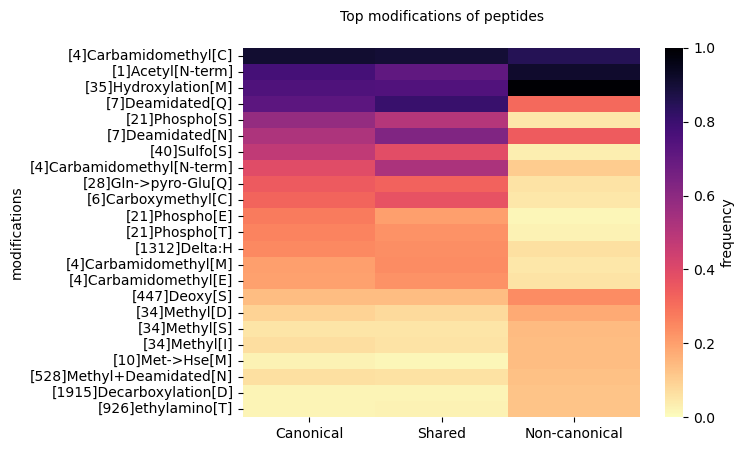

In [282]:
fig, axes = plt.subplots(1,1);
sns.heatmap(pepcl_data_norm[["Canon_unique","Shared","NonCanon_unique"]], ax=axes,cmap = "magma_r",vmin=0,cbar_kws={'label': 'frequency'})
axes.set_xticklabels(["Canonical","Shared","Non-canonical"],rotation=0);
#axes.set_xlabel("datasets");
axes.set_title('Top modifications of peptides',fontsize=10,y=1.05)
plt.savefig("F3D_topmod_pepcl.svg",format='svg', bbox_inches = 'tight')
#axes.axvline(x=3, linewidth=1, color="black")
#axes.text(-0.1, -0.1, 'UniProt', fontsize = 8)
#axes.text(3, -0.1, 'OpenProt', fontsize = 8)


In [2598]:
#13 because we always have 3 expected mods + add 10 unexp
pepcl_data_all=pd.DataFrame(columns=["modifications","count"])
grouped = all_uniq_pepmod.groupby("peptide_class")
custom_order = ["Canon_unique","Shared","NonCanon_unique"]
for i,peptide_class in enumerate(custom_order):
    group=grouped.get_group(peptide_class)
    print(peptide_class,i)
    #group.value_counts()
    data=pd.DataFrame(group[group.modifications!="Unmodified"].modifications.value_counts()/len(group[group.modifications!="Unmodified"]))
    data.reset_index(inplace=True)
    if i==0:
        pepcl_data_all=pd.concat([pepcl_data_all,data])
    else:
        pepcl_data_all=pepcl_data_all.merge(data,how="outer",on="modifications")
pepcl_data_all.columns=["modifications",*custom_order]
pepcl_data_all.set_index("modifications",inplace=True)

Canon_unique 0
Shared 1
NonCanon_unique 2


In [2600]:
pepcl_data_all.to_pickle("pepcl_data_all_totransfer.pkl")

#### C. pie chart: proteins identifie with all peptides modified by protein class (devide also by 1 and 2+ peptides) 

In [283]:
peptide_df=pd.read_pickle("protein_expended_combined_peptides.pkl")
psm_df=pd.read_pickle("protein_expended_combined_first.pkl")

In [316]:
onlymod_proteins={"Non-canonical 1 peptide":0, "Non-canonical >1":0,"Canonical 1 peptide":0,"Canonical >1":0}
for protein_class,group in combined_proteins_ocacam_newop[combined_proteins_ocacam_newop.searchDB=="openprot"].groupby(["FDRGroup"]):
    print(protein_class)
    #if protein_class[0]=="Canon": peptide_class="Canon_unique"                
    #elif protein_class[0]=="NonCanon": peptide_class="NonCanon_unique"
    proteins=group[group.level=="Singleton"].proteins.tolist()+[p for g in group[group.level=="Group"].proteins.tolist() for p in g.split(",")]
    print("add prots",len(list(set(proteins))))
    #get infered proteins with filtered peptides
    a=peptide_df[peptide_df.proteins_x_expand.isin(set(proteins))].database_peptide.tolist()
    df=psm_df.loc[(psm_df.database_peptide.isin(a))&(psm_df.proteins_expand.isin(set(proteins)))]
    #proteins that have unmodified peptides - eliminate
    proteins_allmods=set(proteins)-set(df[df.modifications=="Unmodified"].proteins)
    #filter df from proteins with Unmodified
    df=psm_df.loc[psm_df.proteins_expand.isin(set(proteins_allmods))]
    #devide on 1 and >1 proteins
    df_pepunique=df.drop_duplicates(["database_peptide","proteins_expand"],keep="first")
    df_pepunique_counts=Counter(df_pepunique.proteins_expand)
    #devide 1 or more modifications
    a=np.array(list(df_pepunique_counts.values()))
    b=np.array(list(df_pepunique_counts.keys()))
    if protein_class[0]=="NonCanon":
        noncan_onlymod_prots=b[a>1]
    attribute="Canonical" if protein_class[0]=="Canon" else "Non-canonical"
    onlymod_proteins[f"{attribute} 1 peptide"]=len(a[a==1])
    onlymod_proteins[f"{attribute} >1"]=len(a[a>1])    

('Canon',)
add prots 33297
('NonCanon',)
add prots 1502


In [285]:
onlymod_proteins

{'Non-canonical 1 peptide': 819,
 'Non-canonical >1': 683,
 'Canonical 1 peptide': 7538,
 'Canonical >1': 25484}

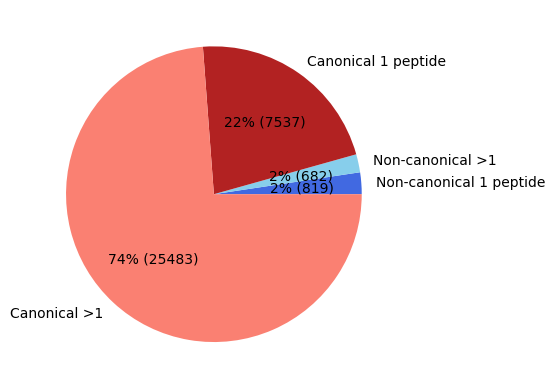

In [286]:
attributes=["ionbot_noncanon_unique_OnlyMod","ionbot_noncanon_unique","ionbot_canon_unique_OnlyMod","ionbot_canon_unique"]
plt.pie(
    onlymod_proteins.values(),
    labels=onlymod_proteins.keys(),
    colors=[project_palette2[at] for at in attributes],
    autopct=lambda p: f'{p:.0f}% ({int(p * np.sum(list(onlymod_proteins.values())) / 100)})'
);
plt.savefig("F3C_onlymod_byprotcl.svg",format='svg')

In [317]:
#in how many samples only modified multy-peptide non-canonical samples accure
a=prot_reproduce_ionbot[prot_reproduce_ionbot.protein.isin(noncan_onlymod_prots)].frequency*23
#how many of these accure in more then 3 samples
a.value_counts().sort_index().iloc[3:].sum()

235

In [318]:
modpc_proteins={"Non-canonical 1 peptide":0, "Non-canonical >1":0,"Canonical 1 peptide":0,"Canonical >1":0}
for protein_class,group in combined_proteins_ocacam_newop[combined_proteins_ocacam_newop.searchDB=="openprot"].groupby(["FDRGroup"]):
    print(protein_class)
    #if protein_class[0]=="Canon": peptide_class="Canon_unique"                
    #elif protein_class[0]=="NonCanon": peptide_class="NonCanon_unique"
    proteins=group[group.level=="Singleton"].proteins.tolist()+[p for g in group[group.level=="Group"].proteins.tolist() for p in g.split(",")]
    print("add prots",len(list(set(proteins))))
    #get infered proteins with filtered peptides
    a=peptide_df[peptide_df.proteins_x_expand.isin(set(proteins))].database_peptide.tolist()
    df=psm_df.loc[(psm_df.database_peptide.isin(a))&(psm_df.proteins_expand.isin(set(proteins)))]
    #do mod/notmod binary
    #df["modifications"].replace("Unmodified",0,inplace=True)
    df["modified"]=np.nan
    df.loc[df["modifications"]=="Unmodified","modified"]=0
    df.loc[df["modifications"]!="Unmodified","modified"]=1
    print(len(df))
    #devide on 1 and >1 proteins
    df_pepunique=df.drop_duplicates(["database_peptide","proteins_expand"],keep="first")
    print(len(df))
    df_pepunique_counts=Counter(df_pepunique.proteins_expand)
    a=np.array(list(df_pepunique_counts.values()))
    df_prot_1pep=np.array(list(df_pepunique_counts.keys()))[a==1]
    df_prot_1pep_modcount=df[df.proteins_expand.isin(df_prot_1pep)].value_counts(["proteins_expand","modified"])
    df_prot_more1pep_modcount=df[~df.proteins_expand.isin(df_prot_1pep)].value_counts(["proteins_expand","modified"])
    #break
    attribute="Canonical" if protein_class[0]=="Canon" else "Non-canonical"
    modpc_proteins[f"{attribute} 1 peptide"]=df_prot_1pep_modcount
    modpc_proteins[f"{attribute} >1"]=df_prot_more1pep_modcount

('Canon',)
add prots 33297


/tmp/ipykernel_661187/471886065.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["modified"]=np.nan


1593670
1593670
('NonCanon',)
add prots 1502
44770
44770


/tmp/ipykernel_661187/471886065.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["modified"]=np.nan


In [319]:
modpc_proteins_pc={}
for proteinmods_class, df in modpc_proteins.items():
    modpc_proteins_pc[proteinmods_class]={}
    modpc_proteins_pc[proteinmods_class]={prot:(group.xs(1.0, level="modified")[0]/group.values.sum() if 1 in group.unstack().columns.tolist() else 0) for prot, group in df.groupby("proteins_expand")}

In [441]:
for prot, group in df.groupby("proteins_expand"):
    if len(group)>1:
        break

In [323]:
#how many prots with 1 peptide
for attribute in ["Canonical","Non-canonical"]:
    a=len(modpc_proteins_pc[f"{attribute} 1 peptide"])
    b=len(modpc_proteins_pc[f"{attribute} >1"])
    print(attribute,a,(a/(a+b))*100)

Canonical 8108 24.55779016234553
Non-canonical 838 55.792276964047936


In [326]:
from scipy import stats

In [338]:
#median of modification frequency
for attribute in ["Canonical","Non-canonical"]:
    a=np.array(list(modpc_proteins_pc[f"{attribute} >1"].values()))
    b=np.median(a)#[(a>0)&(a<1)]
    print(attribute,b)

Canonical 0.2857142857142857
Non-canonical 0.5


In [342]:
for attribute in ["Canonical","Non-canonical"]:
    a=modpc_proteins_pc[f"{attribute} 1 peptide"]
    a=np.array(list(a.values()))  
    print(attribute,(len(a[a==1])/len(a))*100)

Canonical 40.2072027627035
Non-canonical 79.23627684964201


In [347]:
attribute="Canonical"
a=modpc_proteins_pc[f"{attribute} 1 peptide"]
a=np.array(list(a.values()))  
print(attribute,"Only unmod",(len(a[a==0])/len(a))*100)
print(attribute,"Only mod",(len(a[a==1])/len(a))*100)
print(attribute,"Both",(len(a[(a>0)&(a<1)])/len(a))*100)
print(attribute,"Both+Only mod",(len(a[(a>0)])/len(a))*100)

Canonical Only unmod 55.55007400098668
Canonical Only mod 40.2072027627035
Canonical Both 4.242723236309817
Canonical Both+Only mod 44.44992599901332


95.75727676369019

/tmp/ipykernel_661187/398996775.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


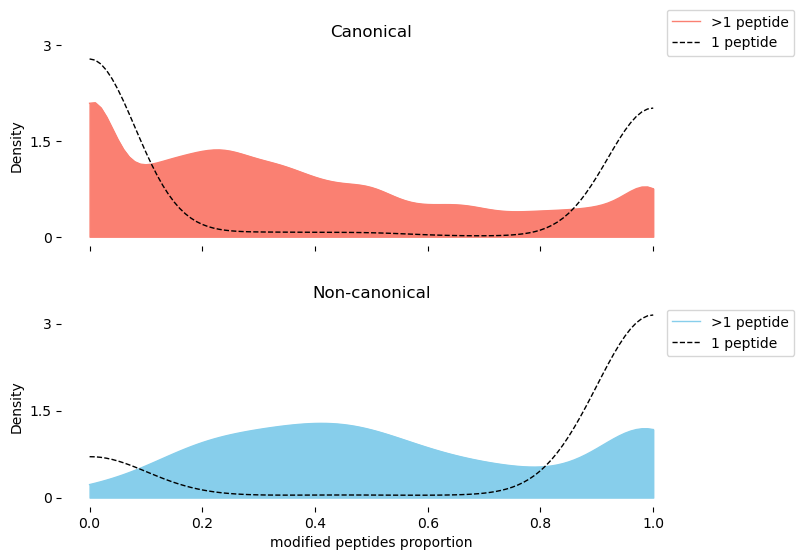

In [334]:
gs = (grid_spec.GridSpec(2,1))
gs.update(hspace= 0.3)
fig = plt.figure(figsize=(8,6))
i = 0
#creating empty list
ax_objs = []
for attribute in ["Canonical","Non-canonical"]:
    # creating new axes object and appending to ax_objs
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))

    color= "ionbot_noncanon_unique" if attribute=="Non-canonical" else "ionbot_canon_unique"
    # plotting the distribution
    data1=pd.DataFrame({"frq":modpc_proteins_pc[f"{attribute} >1"].values()})
    plot1 = (data1.frq.plot.kde(ax=ax_objs[-1],color=project_palette2[color], lw=1,ind=np.arange(0, 1.01, 0.01).tolist(),
                         label=">1 peptide")
           )
    plot2 = (pd.DataFrame({"frq":modpc_proteins_pc[f"{attribute} 1 peptide"].values()})
            .frq.plot.kde(ax=ax_objs[-1],color="black", lw=1,ind=np.arange(0, 1.01, 0.01).tolist(),
                         label="1 peptide",style="--")
           )

    # grabbing x and y data from the kde plot
    x = plot1.get_children()[0]._x
    y = plot1.get_children()[0]._y

    # filling the space beneath the distribution
    
    ax_objs[-1].fill_between(x,y,color=project_palette2[color])

    # setting uniform x and y lims
    #ax_objs[-1].set_xlim(0,pepcl_psm_frq.psm_num.max()+1)
    #ax_objs[-1].set_ylim(0,2.5)

    # make background transparent
    rect = ax_objs[-1].patch
    rect.set_alpha(0)

    # remove borders, axis ticks, and labels
    ax_objs[-1].set_yticks([0,1.5,3],[0,1.5,3])

    if i == 1:
        ax_objs[-1].set_xlabel("modified peptides proportion", fontsize=10)
    else:
        ax_objs[-1].set_xticklabels([])
    #ax_objs[-1].axes.get_xaxis().set_visible(False)
    #ax_objs[-1].axes.get_yaxis().set_visible(False)
    
    spines = ["top","right","left","bottom"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)
    
    ax_objs[-1].set_title(attribute)
    if i==0: pos=(1.05,0.95)
    if i==1: pos=(1.05,0.45)
    ax_objs[-1].legend(bbox_to_anchor=pos,bbox_transform=fig.transFigure)
    #adj_country = country.replace(" ","\n")
    #ax_objs[-1].text(-0.02,0,attribute,fontsize=10,ha="right")


    i += 1

plt.tight_layout()
plt.savefig("F3B_modpc_byprotcl.svg",format='svg')
plt.show()

In [518]:
#select only unmodified canonical proteins
for protein_class,group in combined_proteins_ocacam_newop[combined_proteins_ocacam_newop.searchDB=="openprot"].groupby(["FDRGroup"]):
    print(protein_class)
    if protein_class[0]!="Canon": continue
    proteins=group[group.level=="Singleton"].proteins.tolist()+[p for g in group[group.level=="Group"].proteins.tolist() for p in g.split(",")]
    print("add prots",len(list(set(proteins))))
    #get infered proteins with filtered peptides
    a=peptide_df[peptide_df.proteins_x_expand.isin(set(proteins))].database_peptide.tolist()
    df=psm_df.loc[(psm_df.database_peptide.isin(a))&(psm_df.proteins_expand.isin(set(proteins)))]
    #do mod/notmod binary
    #df["modifications"].replace("Unmodified",0,inplace=True)
    df["modified"]=np.nan
    df.loc[df["modifications"]=="Unmodified","modified"]=0
    df.loc[df["modifications"]!="Unmodified","modified"]=1
    df_prot_modcount=df.value_counts(["proteins_expand","modified"])
    canon_onlyunmod={prot:(group.xs(0.0, level="modified")[0] if 1 not in group.unstack().columns.tolist() else np.nan) for prot, group in df_prot_modcount.groupby("proteins_expand")}

('Canon',)
add prots 33297


/tmp/ipykernel_661187/1845928526.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



('NonCanon',)


In [527]:
#select onlyunmodified and find their gene
count_unck=0; canon_onlyunmod_genes=[]
for protein,pep_count in canon_onlyunmod.items():
    if isinstance(pep_count,float): continue
    header=OPfasta[f"op|{protein}|TX=9606"].description
    gene=[[g for g in info.lstrip("GN=").split(",") if not g.startswith("ENSG0")]  for info in header.split(" ") if info.startswith("GN=")][0]
    if len(gene)==['u', 'n', 'k', 'n', 'o', 'w', 'n']: 
        count_unck+=1
        continue #skip unknown genes
    gene=np.nan if len(gene)==0 else gene[0]
    if isinstance(gene,float): 
        count_unck+=1
        continue
    canon_onlyunmod_genes.append(gene)
    #print(protein,gene)

In [530]:
len(set(canon_onlyunmod_genes))

1809

In [531]:
#put in GSEA
#for gene in set(canon_onlyunmod_genes):
#    print(gene)

### Figure 4: it's so easy to have false positive with an incomplete db  

#### A. sankey plot to track annotation of spectra.  

In [351]:
def get_senkey_data_OPTRdiff(df,same_diff,both_unident_n=0):
    source=[3,3,3,3,8,8,8,8,4,4,4,4,5,5,5,5,6,6,6,6,7,7,7,7]
    target=[9,10,11,12,9,10,11,12,9,10,11,12,9,10,11,12,9,10,11,12,9,10,11,12]
    #database_open, only altprots, only novelisoprots, "only refisoprots, database_trembl, only trembl
    params=params=[("T",False,False,False,"T",False,same_diff), #OP canon 1
                   ("T",False,False,False,"T",True,same_diff), #OP canon 2
                   ("T",False,False,False,"D",np.nan,same_diff), #OP canon 3
                   ("T",False,False,False,np.nan,np.nan,same_diff), #OP canon 4                   
            ("T",False,False,True,"T",False,same_diff), #OP ref iso 5
                   ("T",False,False,True,"T",True,same_diff), #OP ref iso 6
                   ("T",False,False,True,"D",np.nan,same_diff), #OP ref iso 7
                   ("T",False,False,True,np.nan,np.nan,same_diff), #OP ref iso 8                   
                ("T",False,True,False,"T",False,same_diff), #OP only novelisoprots 9 #!
                   ("T",False,True,False,"T",True,same_diff), #OP only novelisoprots 10
                   ("T",False,True,False,"D",np.nan,same_diff), #OP only novelisoprots 11
                   ("T",False,True,False,np.nan,np.nan,same_diff), #OP only novelisoprots 12  .                 
                ("T",True,False,False,"T",False,same_diff), #OP only altprot 13
                   ("T",True,False,False,"T",True,same_diff), #OP only altprot 14
                   ("T",True,False,False,"D",np.nan,same_diff), #OP only altprot 15
                   ("T",True,False,False,np.nan,np.nan,same_diff), #OP only altprot 16     #!   .           
                ("D",np.nan,np.nan,np.nan,"T",False,same_diff), #OP D 17
                   ("D",np.nan,np.nan,np.nan,"T",True,same_diff), #OP D 18
                   ("D",np.nan,np.nan,np.nan,"D",np.nan,same_diff), #OP D 19
                   ("D",np.nan,np.nan,np.nan,np.nan,np.nan,same_diff), #OP D 20                   
                (np.nan,np.nan,np.nan,np.nan,"T",False,np.nan), #OP unident 21
                   (np.nan,np.nan,np.nan,np.nan,"T",True,np.nan), #OP unident 22
                   (np.nan,np.nan,np.nan,np.nan,"D",np.nan,np.nan), #OP unident 23
                   np.nan, #OP unident 24
                ]
    subdfs=[df.loc[(df["database_trembl"]==params[0][4]) & (df["only trembl"]==params[0][5]) & (df["database_open"]==params[0][0]) & (df["only altprots"]==params[0][1]) & (df["only novelisoprots"]==params[0][2]) & (df["only refisoprots"]==params[0][3]),],
df.loc[(df["database_trembl"]==params[1][4]) & (df["only trembl"]==params[1][5]) & (df["database_open"]==params[1][0]) & (df["only altprots"]==params[1][1]) & (df["only novelisoprots"]==params[1][2]) & (df["only refisoprots"]==params[1][3]),],
            df.loc[(df["database_trembl"]==params[2][4]) & (df["database_open"]==params[2][0]) & (df["only altprots"]==params[2][1]) & (df["only novelisoprots"]==params[2][2]) & (df["only refisoprots"]==params[2][3]),],
            df.loc[(df["database_trembl"]==params[3][4]) & (df["database_open"]==params[3][0]) & (df["only altprots"]==params[3][1]) & (df["only novelisoprots"]==params[3][2]) & (df["only refisoprots"]==params[3][3]),],
            
           df.loc[(df["database_trembl"]==params[4][4]) & (df["only trembl"]==params[4][5]) & (df["database_open"]==params[4][0]) & (df["only altprots"]==params[4][1]) & (df["only novelisoprots"]==params[4][2]) & (df["only refisoprots"]==params[4][3]),],
            df.loc[(df["database_trembl"]==params[5][4]) & (df["only trembl"]==params[5][5]) & (df["database_open"]==params[5][0]) & (df["only altprots"]==params[5][1]) & (df["only novelisoprots"]==params[5][2]) & (df["only refisoprots"]==params[5][3]),],
            df.loc[(df["database_trembl"]==params[6][4]) & (df["database_open"]==params[6][0]) & (df["only altprots"]==params[6][1]) & (df["only novelisoprots"]==params[6][2]) & (df["only refisoprots"]==params[6][3]),],
            df.loc[(df["database_trembl"]==params[7][4]) & (df["database_open"]==params[7][0]) & (df["only altprots"]==params[7][1]) & (df["only novelisoprots"]==params[7][2]) & (df["only refisoprots"]==params[7][3]),],
            
            df.loc[(df["database_trembl"]==params[8][4]) & (df["only trembl"]==params[8][5]) & (df["database_open"]==params[8][0]) & (df["only altprots"]==params[8][1]) & (df["only novelisoprots"]==params[8][2]) & (df["only refisoprots"]==params[8][3]),],
            df.loc[(df["database_trembl"]==params[9][4]) & (df["only trembl"]==params[9][5]) & (df["database_open"]==params[9][0]) & (df["only altprots"]==params[9][1]) & (df["only novelisoprots"]==params[9][2]) & (df["only refisoprots"]==params[9][3]),],
            df.loc[(df["database_trembl"]==params[10][4]) & (df["database_open"]==params[10][0]) & (df["only altprots"]==params[10][1]) & (df["only novelisoprots"]==params[10][2]) & (df["only refisoprots"]==params[10][3]),],
            df.loc[(df["database_trembl"]==params[11][4])& (df["database_open"]==params[11][0]) & (df["only altprots"]==params[11][1]) & (df["only novelisoprots"]==params[11][2]) & (df["only refisoprots"]==params[11][3]),],
            
            df.loc[(df["database_trembl"]==params[12][4]) & (df["only trembl"]==params[12][5]) & (df["database_open"]==params[12][0]) & (df["only altprots"]==params[12][1]) & (df["only novelisoprots"]==params[12][2]) & (df["only refisoprots"]==params[12][3]),],
            df.loc[(df["database_trembl"]==params[13][4]) & (df["only trembl"]==params[13][5]) & (df["database_open"]==params[13][0]) & (df["only altprots"]==params[13][1]) & (df["only novelisoprots"]==params[13][2]) & (df["only refisoprots"]==params[13][3]),],
            df.loc[(df["database_trembl"]==params[14][4]) & (df["database_open"]==params[14][0]) & (df["only altprots"]==params[14][1]) & (df["only novelisoprots"]==params[14][2]) & (df["only refisoprots"]==params[14][3]),],
            df.loc[(df["database_trembl"]==params[15][4]) & (df["database_open"]==params[15][0]) & (df["only altprots"]==params[15][1]) & (df["only novelisoprots"]==params[15][2]) & (df["only refisoprots"]==params[15][3]),],
            
            df.loc[(df["database_trembl"]==params[16][4]) & (df["only trembl"]==params[16][5]) & (df["database_open"]==params[16][0]),],
            df.loc[(df["database_trembl"]==params[17][4]) & (df["only trembl"]==params[17][5]) & (df["database_open"]==params[17][0]),],
            df.loc[(df["database_trembl"]==params[18][4]) & (df["database_open"]==params[18][0]),],
            df.loc[(df["database_trembl"]==params[19][4]) & (df["database_open"]==params[19][0]),],
            
            df.loc[(df["database_trembl"]==params[20][4]) & (df["only trembl"]==params[20][5]) & (df["database_open"].isna()),],
            df.loc[(df["database_trembl"]==params[21][4]) & (df["only trembl"]==params[21][5]) & (df["database_open"].isna()),],
            df.loc[(df["database_trembl"]==params[22][4]) & (df["database_open"].isna()),],            
            both_unident_n
           ]
    values=[]
    if same_diff=="both":
        for p,subdf in zip(params[:-1],subdfs[:-1]):
            values.append(len(subdf))
        values.append(both_unident_n)
        source1=source; target1=target
    else:
        for i,(p,subdf) in enumerate(zip(params[:-1],subdfs[:-1])):
            if pd.isnull(p[6]): #here if smae or diff peptide - does not metter and it is missliding to add them to graph
                ##values.append(len(subdf))
                continue
            else:
                #print(i,p,len(subdf.loc[subdf["Same_peptide_canon_open"]==p[4],]))
                print(p[6])
                print(len(subdf.loc[subdf["Same_peptide_open_trembl"]==p[6],]))
                values.append(len(subdf.loc[subdf["Same_peptide_open_trembl"]==p[6],]))
        source1=[s for i,(s,p) in enumerate(zip(source,params)) if i<len(params)-1 and not pd.isnull(p[6])]; 
        target1=[s for i,(s,p) in enumerate(zip(target,params)) if i<len(params)-1 and not pd.isnull(p[6])]; 
        #link_label1=[s for i,(s,p) in enumerate(zip(link_label,params)) if i<len(params)-1 and not np.isnan(p[4])]; 
    return source1, target1, values

In [ ]:
#annotate peps of just trembl prot
def is_onlytremblacc(row,trmbl_refisoforms=trmbl_refisoforms):
    '''to be classified as trembl prot, all prots in group should be trembl'''
    istr=[i.split("((")[-1].rstrip("))") in list(trmbl_refisoforms) for i in row["proteins"].split("||")]
    if all(istr):
        return True
    else:
        return False
for dataset_name in combined_first_datasets:
    df_tr=combined_first_datasets[dataset_name]["trembl"]
    #df_tr["only trembl"]=df_tr.apply(is_onlytremblacc, axis=1)
    combined_first_datasets[dataset_name]["trembl"]=df_tr

In [ ]:
#with open('combined_first_datasets_col_onlytrembl.pickle', 'wb') as handle:
#    pickle.dump(combined_first_datasets, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [348]:
combined_first_datasets_col_onlytrembl=pickle.load(open('combined_first_datasets_col_onlytrembl.pickle', 'rb'))

In [2057]:
combined_first_datasets_col_onlytrembl["PXD002057.v0.11.4"]["trembl"].columns

Index(['ionbot_match_id', 'spectrum_title', 'scan', 'spectrum_file',
       'precursor_mass', 'peptide_mass', 'observed_retention_time', 'charge',
       'database_peptide', 'matched_peptide', 'modifications',
       'unexpected_modification', 'database', 'psm_score', 'q-value', 'PEP',
       'proteins', 'experiment', 'leadprot', 'modified_peptide',
       'modifications_noRT', 'only trembl'],
      dtype='object')

In [2058]:
combo_optr_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_first_datasets:
    df_op=combined_first_datasets[dataset_name]["openprot"]
    #df_tr=combined_first_datasets[dataset_name]["trembl"]
    df_tr=combined_first_datasets_col_onlytrembl[dataset_name]["trembl"]
    combo=df_op.merge(df_tr, on=['spectrum_title','spectrum_file','scan'],suffixes=['_open','_trembl'],how="outer")
    combo["Same_peptide_open_trembl"] = combo.matched_peptide_open==combo.matched_peptide_trembl
    combo["Same_mod_peptide_open_trembl"] = combo.modified_peptide_open==combo.modified_peptide_trembl
    combo["Same_mods_noRT_open_trembl"] = (combo.matched_peptide_open+combo.modifications_noRT_open)==(combo.matched_peptide_trembl+combo.modifications_noRT_trembl)
    combo_optr_first_datasets[dataset_name]=combo

In [2532]:
#with open('combo_optr_first_datasets.pickle', 'wb') as handle:
#    pickle.dump(combo_optr_first_datasets, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [349]:
combo_optr_first_datasets=pickle.load(open('combo_optr_first_datasets.pickle', 'rb'))

In [352]:
sankey_optr_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in sankey_optr_first_datasets:
    df_optr=combo_optr_first_datasets[dataset_name]
    source_optr, target_optr, values_optr=get_senkey_data_OPTRdiff(df_optr,same_diff="both",both_unident_n=0)
    sankey_optr_first_datasets[dataset_name]=list(values_optr)

In [2487]:
np.array(source_optr)==4

array([False, False, False, False, False, False, False, False,  True,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False, False])

In [2524]:
labels_optr=["OpenProt canonical prot.","OpenProt novel isoform","OpenProt non-canonical prot.","OpenProt decoy","OpenProt unidentified","OpenProt reference isoform",
    "Trembl Swiss-Prot", "Tremble unreviewed","Trembl decoy","Trembl undefined"]
sel_inds=(np.array(source_optr)==4)#|(np.array(source_optr)==5)
#np.array(labels_optr)[sel_inds]
np.array(target_optr)[sel_inds] #4,9-12

array([ 9, 10, 11, 12])

In [2520]:
values1

array([4274.,   82.,    0., 5051.])

[945  21  20 971]
[1256   44   67 2698]
[2073   17   82 1382]


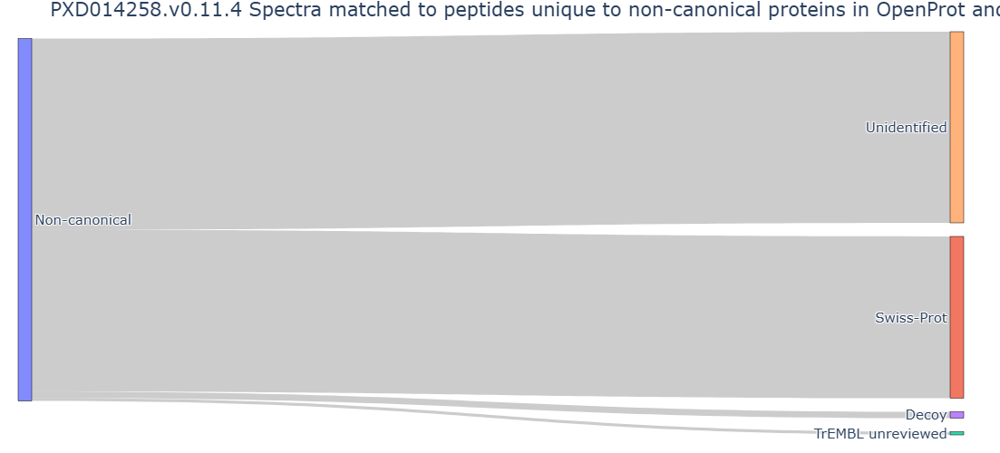

In [353]:
    #labels_optr=["OpenProt canonical prot.","OpenProt novel isoform","OpenProt non-canonical prot.","OpenProt decoy","OpenProt unidentified","OpenProt reference isoform",
    #           "Trembl Swiss-Prot", "Tremble unreviewed","Trembl decoy","Trembl undefined"]
    
    labels_optr=["Non-canonical","Swiss-Prot","TrEMBL unreviewed","Decoy","Unidentified"]
    #sel_inds=(np.array(source_optr)==4)#|(np.array(source_optr)==5)#5
    #source1=np.array(source_optr)[sel_inds]-3
    #target1=np.array(target_optr)[sel_inds]-3    
    source1=[0,0,0,0]
    target1=[1,2,3,4]
    #sum datasets    
    values1=np.zeros(len(source1))
    for dataset_name in sankey_optr_first_datasets:
        #values1=values1+np.array(sankey_optr_first_datasets[dataset_name])[sel_inds]  
        combo=combo_optr_first_datasets[dataset_name]
        #9+13
        a=combo.loc[((combo.database_trembl=="T")&
            (combo['database_open']=="T")&
             ((combo['only altprots']==True)|
             (combo['only novelisoprots']==True))&
             (combo['only refisoprots']==False)&
            (combo['only trembl']==False)),]
        #10+14
        b=combo.loc[((combo.database_trembl=="T")&
            (combo['database_open']=="T")&
             ((combo['only altprots']==True)|
             (combo['only novelisoprots']==True))&
             (combo['only refisoprots']==False)&
            (combo['only trembl']==True)),]
        #11+15
        c=combo.loc[((combo.database_trembl=="D")&
            (combo['database_open']=="T")&
             ((combo['only altprots']==True)|
             (combo['only novelisoprots']==True))&
             (combo['only refisoprots']==False) 
            ),]#&(combo['only trembl'].isna())
        #12+16
        d=combo.loc[((combo.database_trembl.isna())&
            (combo['database_open']=="T")&
             ((combo['only altprots']==True)|
             (combo['only novelisoprots']==True))&
             (combo['only refisoprots']==False)),]
        print(np.array([len(a),len(b),len(c),len(d)]))
        values1=values1+np.array([len(a),len(b),len(c),len(d)])
        
    fig = go.Figure(data=[go.Sankey(
        #textfont={"color":"rgba(0,0,0,0)", "size":1}, #disable to show the text labels
        valueformat = ".f",
        valuesuffix = " spectra fraction",
        node = {
          "pad" : 15,
          "thickness" : 15,
          "line" : {"color": "black", "width": 0.5},
          "label" :  labels_optr,
    },
        # Add links
        link = {
           # "arrowlen":15,
          "source" :  source1,
          "target" : target1,
          "value" :  values1,
    })])
    
    fig.update_layout(title_text=f"{dataset_name} Spectra matched to peptides unique to non-canonical proteins in OpenProt and TrEMBL",font_size=10,margin={"l":20, "r":40, "t":35, "b":20},font={"size":15},width=500,height=500,
    )
    fig.write_image("Fig4A_rescued_noncan_sankey.svg")
    fig.show()

In [2554]:
(np.array(values1)/np.sum(values1))*100

array([44.63241437,  0.85630744,  1.76482874, 52.74644946])

In [2489]:
list(zip(source1,target1)),values1

([(1, 6), (1, 7), (1, 8), (1, 9), (2, 6), (2, 7), (2, 8), (2, 9)],
 array([ 172.,    8.,   13.,    0., 4102.,   74.,  156.,    0.]))

In [2102]:
(np.sum(values1)/np.sum([len(d["openprot"][d["openprot"].database=="T"]) for dataset_name,d in combined_first_datasets.items()]))*100

1.879930912972912

In [2107]:
(np.sum(values1[0])/np.sum([len(d["trembl"][d["trembl"].database=="T"]) for dataset_name,d in combined_first_datasets.items()]))*100

1.7158154515413895

In [2106]:
(np.sum(values1[2])/np.sum([len(d["trembl"][d["trembl"].database=="T"]) for dataset_name,d in combined_first_datasets.items()]))*100

0.06525285481239804

In [362]:
#what is percent of canon (swiss-prot+unreviewed)->non-canon psms in targets of TrEMBL
count=0 ; t=0
for dataset_name in sankey_optr_first_datasets:
    combo=combo_optr_first_datasets[dataset_name]
    a=combo.loc[((combo.database_trembl=="T")&
        (combo['database_open']=="T")&
         ((combo['only altprots']==True)|
         (combo['only novelisoprots']==True))&
         (
             ((combo['only refisoprots']==False)&
            (combo['only trembl']==False))|
          ((combo['only refisoprots']==False)&
            (combo['only trembl']==True))
         )),]
    df=combined_first_datasets[dataset_name]["trembl"]
    t+=len(df[df.database=="T"])
    count+=len(a)
#(values1[0]+values1[1])/count
(count/t)*100

1.8220604843769608

In [363]:
#what is percent of decoy->non-canon psms in decoy of TrEMBL
count=0 ; d=0
for dataset_name in sankey_optr_first_datasets:
    combo=combo_optr_first_datasets[dataset_name]
    c=combo.loc[((combo.database_trembl=="D")&
            (combo['database_open']=="T")&
             ((combo['only altprots']==True)|
             (combo['only novelisoprots']==True))&
             (combo['only refisoprots']==False) 
            ),]
    count+=len(c)
    df=combined_first_datasets[dataset_name]["trembl"]
    d+=len(df[df.database=="D"])
    
(count/d)*100

6.555469356089992

In [368]:
#what is percent of unmatched->non-canon psms in unmatched of TrEMBL
count=0 ; unm=0
for dataset_name in sankey_optr_first_datasets:
    combo=combo_optr_first_datasets[dataset_name]
    c=combo.loc[((combo.database_trembl=="D")&
            (combo['database_open']=="T")&
             ((combo['only altprots']==True)|
             (combo['only novelisoprots']==True))&
             (combo['only refisoprots']==False) 
            ),]
    count+=len(c)
    df=combined_first_datasets[dataset_name]["trembl"]
   # d+=len(df[df.database=="D"])
    unm+=np.sum(list(mgfspectraN_datasets[dataset_name].values()))-len(df)
    
(count/unm)*100

0.02081775594445478

In [369]:
#what is percent of x->non-canon psms in targets of OpenProt
count=0 ; t=0
for dataset_name in sankey_optr_first_datasets:
    combo=combo_optr_first_datasets[dataset_name]
    a=combo.loc[((combo['database_open']=="T")&
         ((combo['only altprots']==True)|
         (combo['only novelisoprots']==True))
         ),]
    df=combined_first_datasets[dataset_name]["openprot"]
    t+=len(df[df.database=="T"])
    count+=len(a)
#(values1[0]+values1[1])/count
(count/t)*100

4.155636754992753

In [ ]:
#how to do on mpdofocations?
sankey_optr_MOD_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in sankey_optr_first_datasets:
    df_optr=combo_optr_first_datasets[dataset_name]
    source_optr, target_optr, values_optr=get_senkey_data_OPTRdiff(df_optr,same_diff="",both_unident_n=0)
    sankey_optr_MOD_first_datasets[dataset_name]=list(values_optr)

In [ ]:
    labels_optr=["OpenProt canonical prot.","OpenProt novel isoform","OpenProt non-canonical prot.","OpenProt decoy","OpenProt unidentified","OpenProt reference isoform",
               "Trembl Swiss-Prot", "Tremble unreviewed","Trembl decoy","Trembl undefined"]
    sel_inds=np.array(source_optr)==5
    source1=np.array(source_optr)[sel_inds]-3
    target1=np.array(target_optr)[sel_inds]-3    
    #sum datasets    
    values1=np.zeros(len(source1))
    for dataset_name in sankey_optr_first_datasets:
        values1=values1+np.array(sankey_optr_first_datasets[dataset_name])[sel_inds]    
    
    fig = go.Figure(data=[go.Sankey(
        #textfont={"color":"rgba(0,0,0,0)", "size":1}, #disable to show the text labels
        valueformat = ".f",
        valuesuffix = " spectra fraction",
        node = {
          "pad" : 15,
          "thickness" : 15,
          "line" : {"color": "black", "width": 0.5},
          "label" :  labels_optr,
    },
        # Add links
        link = {
           # "arrowlen":15,
          "source" :  source1,
          "target" : target1,
          "value" :  values1,
    })])
    
    fig.update_layout(
        title_text=f"{dataset_name} Spectra matched to peptides unique to non-canonical proteins in OpenProt and TrEMBL",font_size=10,
        margin={"l":20, "r":40, "t":35, "b":20},font={"size":15},width=500,height=500,
    )
    #fig.write_image("rescued_noncan_sankey.svg")
    fig.show()

#### B. distribution of q-values  
#### C. distribution PSM scores

In [2533]:

#with open('mgfspectraN_datasets_totransfer.pickle', 'wb') as handle:
#    pickle.dump(mgfspectraN_datasets, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [370]:
def get_score_ranking(df,score_col,bin_size,bins_min,bins_max,prf_canon,prf_nonc):
    break_points=np.arange(bins_min, bins_max+bin_size, bin_size)[1:]#0,1
    a=(df[f"{score_col}_{prf_canon}"]-df[f"{score_col}_{prf_nonc}"])/df[f"{score_col}_{prf_canon}"]
    a=a.sort_values()
    #print(len(a))
    #filter outliers
    data=np.array(a.values.tolist())
    #filtered = data[(data > np.percentile(data, 1.5)) & (data < np.percentile(data, 98.5))]
    filtered = data[(data > bins_min) & (data < bins_max)]
    #print(len(filtered))
    #print(np.mean(filtered))
    if len(filtered)==0:
        return [np.nan]*len(break_points)
    #filtered=data
    #normalise
    ##norm=(filtered-filtered.min())/(filtered.max()-filtered.min())
    #print(norm)
    bin_label_list=[]; missed=[]
    for idx,v in enumerate(filtered): #norm
        appended=False
        for i,b in enumerate(break_points):
            if i!=0 and v<=b and v>break_points[i-1]:
                #print(indx,v,i,b)
                bin_label_list.append(i); appended=True
                #break
            elif i==0 and v<=b:
                bin_label_list.append(i); appended=True
                #break
            elif v==1:
                bin_label_list.append(len(break_points)); append=True
                #break
        if not appended:
            missed.append(v)
    #print(missed)
    #print(bin_label_list)
    #print(Counter(bin_label_list))
    count={k:v for k,v in sorted(Counter(bin_label_list).items())}
    #bin hight, sort by bin index
    bin_hights=[count[k] if k in list(count.keys()) else 0 for k in list(range(len(break_points)))]
    #print(bin_hights)
    return bin_hights

In [371]:
#standartase bins spread for all samples
qval_bins_mins=[]; qval_bins_maxs=[]
psmscore_bins_mins=[]; psmscore_bins_maxs=[]
for dataset_name in combo_optr_first_datasets:
    mgfspectraN=mgfspectraN_datasets[dataset_name]
    for mgffile in mgfspectraN:
        #print(mgffile)
        mgffile=mgffile.replace('.RAW.mgf', '.mgf')
        df=combo_optr_first_datasets[dataset_name]
        dfalt=df.loc[(df["spectrum_file"]==mgffile) & (df["database_trembl"]=="T") & (df["database_open"]=="T") & ((df["only altprots"]==True) | (df["only novelisoprots"]==True)),]
        score_col="q-value"
        a=(dfalt[f"{score_col}_trembl"]-dfalt[f"{score_col}_open"])/dfalt[f"{score_col}_trembl"]
        a=a.sort_values()
        data=np.array(a.values.tolist())
        qval_bins_mins.append(np.min(data));qval_bins_maxs.append(np.max(data))
        score_col="psm_score"
        a=(dfalt[f"{score_col}_trembl"]-dfalt[f"{score_col}_open"])/dfalt[f"{score_col}_trembl"]
        a=a.sort_values()
        data=np.array(a.values.tolist())
        psmscore_bins_mins.append(np.min(data));psmscore_bins_maxs.append(np.max(data))

In [372]:
np.max(qval_bins_maxs)

0.9930506685432793

In [373]:
np.mean(qval_bins_mins)-2*np.std(qval_bins_mins)

-40.59763418328597

In [374]:
np.max(psmscore_bins_maxs)

0.9979045458239644

In [375]:
psmscore_bins_mins=[v for v in psmscore_bins_mins if not np.isnan(v) and not np.isinf(v)]

In [2117]:
np.mean(psmscore_bins_mins)-2*np.std(psmscore_bins_mins)

-358.84028392846494

In [2122]:
#calculate ranking for all samples in datasets, take median between samples of same datasets
q_bins_min,q_bins_max=int(np.mean(qval_bins_mins)-2*np.std(qval_bins_mins)),1
p_bins_min,p_bins_max=int(np.mean(psmscore_bins_mins)-2*np.std(psmscore_bins_mins)),1
qvalrank_tropalt_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
psmscorerank_tropalt_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combo_optr_first_datasets:
    qvalrank=[]; psmscorerank=[]
    mgfspectraN=mgfspectraN_datasets[dataset_name]
    for mgffile in mgfspectraN:
        #print(mgffile)
        mgffile=mgffile.replace('.RAW.mgf', '.mgf')
        df=combo_optr_first_datasets[dataset_name]
        dfalt=df.loc[(df["spectrum_file"]==mgffile) & (df["database_trembl"]=="T") & (df["database_open"]=="T") & ((df["only altprots"]==True) | (df["only novelisoprots"]==True)),]
        qvalrank.append(get_score_ranking(dfalt,"q-value",0.5,q_bins_min,q_bins_max,"trembl","open"))
        psmscorerank.append(get_score_ranking(dfalt,"psm_score",10,p_bins_min,p_bins_max,"trembl","open"))
    #print(np.median(np.array(qvalrank),axis=0))
    qvalrank_tropalt_first_datasets[dataset_name]=np.median(np.array(qvalrank),axis=0)
    psmscorerank_tropalt_first_datasets[dataset_name]=np.median(np.array(psmscorerank),axis=0)

In [2135]:
np.array(qvalrank)

array([[ 1,  0,  0, ..., 25, 24,  5],
       [ 0,  0,  0, ..., 75, 28, 15],
       [ 0,  0,  0, ..., 51, 12, 18],
       ...,
       [ 0,  0,  0, ..., 56, 99, 39],
       [ 0,  0,  0, ..., 38, 22,  8],
       [ 0,  0,  0, ..., 20,  9, 13]])

In [2137]:
len(qvalrank[0]),len(qvalrank)

(82, 15)

In [376]:
#try without bins
all_qval_delta=[];all_psmscore_delta=[]
for dataset_name in combo_optr_first_datasets:
    mgfspectraN=mgfspectraN_datasets[dataset_name]
    for mgffile in mgfspectraN:
        #print(mgffile)
        mgffile=mgffile.replace('.RAW.mgf', '.mgf')
        df=combo_optr_first_datasets[dataset_name]
        dfalt=df.loc[(df["spectrum_file"]==mgffile) & (df["database_trembl"]=="T") & (df["database_open"]=="T") & ((df["only altprots"]==True) | (df["only novelisoprots"]==True)),]
        score_col="q-value"
        a=(dfalt[f"{score_col}_trembl"]-dfalt[f"{score_col}_open"])/dfalt[f"{score_col}_trembl"]
        #a=a.sort_values()
        #data=np.array(a.values.tolist())
        all_qval_delta=all_qval_delta+a.values.tolist()
        #qval_bins_mins.append(np.min(data));qval_bins_maxs.append(np.max(data))
        score_col="psm_score"
        a=(dfalt[f"{score_col}_trembl"]-dfalt[f"{score_col}_open"])/dfalt[f"{score_col}_trembl"]
        #a=a.sort_values()
        #data=np.array(a.values.tolist())
        all_psmscore_delta=all_psmscore_delta+a.values.tolist()

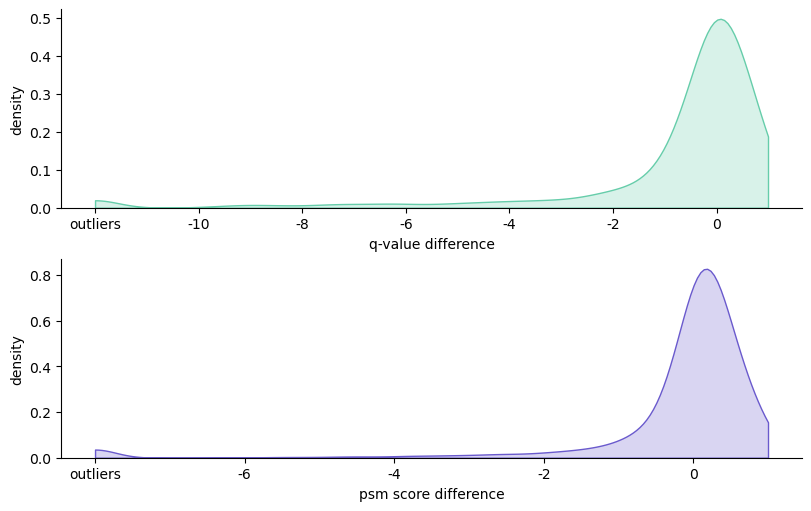

In [378]:
fig, axes = plt.subplots(2,1,layout='constrained', figsize=(8,5))
thr=10; f=1
sns.kdeplot([v if v>-thr else -(thr+2)*f for v in all_qval_delta],ax=axes[0],fill=True,color="mediumaquamarine",cut=0,bw_adjust=1);
#plt.hist(all_qval_delta)
axes[0].set_xlabel("q-value difference");
axes[0].set_xticks(list(range(-12,2,2)),["outliers"]+[str(i) for i in range(-12,2,2)][1:]);
thr=6; f=1
sns.kdeplot([v if v>-thr else -(thr+2)*f for v in all_psmscore_delta],ax=axes[1],fill=True,color="slateblue",cut=0,bw_adjust=1);
#plt.hist([v  for v in all_psmscore_delta if v!=-np.inf])
axes[1].set_xlabel("psm score difference");
axes[1].set_xticks(list(range(-8,2,2)),["outliers"]+[str(i) for i in range(-8,2,2)][1:]);
for ax in axes:
    ax.set_ylabel("density");
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
plt.savefig("F4BC_distrib_errorbar.svg")

In [381]:
#qval, min ratio, number of outliers, % of outliers
thr=10; f=1
a=[v for v in all_qval_delta if v<-thr]
print(np.min(a),len(a),(len(a)/len(all_qval_delta))*100)

-73.66742042094278 97 2.2268135904499538


In [385]:
#psmscore, min ratio, number of outliers, % of outliers
thr=6; f=1
a=[v for v in all_psmscore_delta if v<-thr and v!=-np.inf]
print(np.min(a),len(a),(len(a)/len(all_psmscore_delta))*100)

-755.7501737969949 107 2.4563820018365474


In [2126]:
q_bin_size=0.5
q_binsvals=np.arange(q_bins_min,q_bins_max+q_bin_size, q_bin_size)[1:]
qvalrank_med_error={i:0 for i in range(len(q_binsvals))}
qvalrank_med_avarage={i:0 for i in range(len(q_binsvals))}
qvalrank_med_swarmplot={i:0 for i in range(len(q_binsvals))}

for bins in range(len(q_binsvals)):
    qvalrank_medians=[l[bins] for l in qvalrank_tropalt_first_datasets.values()]
    qvalrank_med_error[bins]=stats.sem(qvalrank_medians, axis=None, ddof=0)
    qvalrank_med_avarage[bins]=np.mean(qvalrank_medians)
    qvalrank_med_swarmplot[bins]=qvalrank_medians
#
p_bin_size=10
p_binsvals=np.arange(p_bins_min,p_bins_max+p_bin_size, p_bin_size)[1:]
psmrank_med_error={i:0 for i in range(len(p_binsvals))}
psmrank_med_avarage={i:0 for i in range(len(p_binsvals))}
psmrank_med_swarmplot={i:0 for i in range(len(p_binsvals))}
for bins in range(len(p_binsvals)):
    psmrank_medians=[l[bins] for l in psmscorerank_tropalt_first_datasets.values()]
    psmrank_med_error[bins]=stats.sem(psmrank_medians, axis=None, ddof=0)
    psmrank_med_avarage[bins]=np.mean(psmrank_medians)
    psmrank_med_swarmplot[bins]=psmrank_medians

In [2133]:
psmrank_medians

[161.5, 42.5, 127.0]

In [2273]:
len(p_binsvals)

36

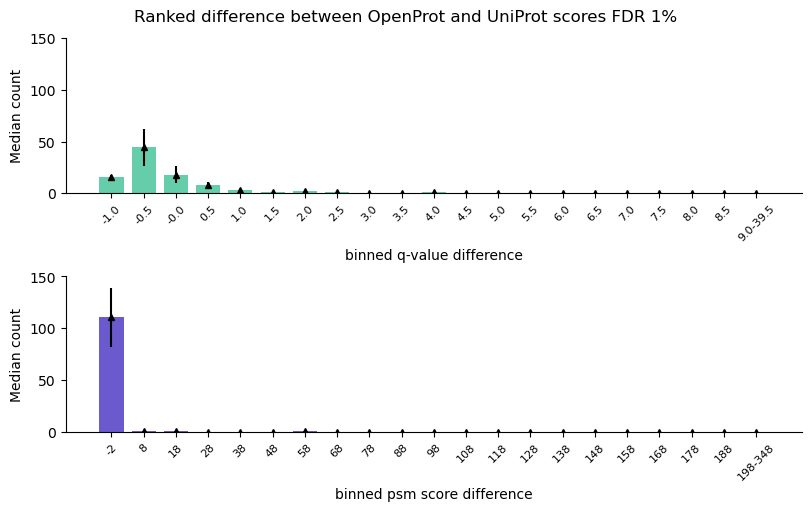

In [2276]:
dbs=np.array([round(i,3) for i in q_binsvals][::-1])*(-1)
dbs=[str(db) if i<=19 else f"{dbs[20]}-{dbs[len(dbs)-1]}" for i,db in enumerate(dbs[0:21])]
x=np.array(range(len(dbs)))
y=np.array(list(qvalrank_med_avarage.values()))[::-1]
y=[j if i<=19 else np.sum(y[20:]) for i,j in enumerate(y[0:21])]
yerr=np.array(list(qvalrank_med_error.values()))[::-1]
yerr=[j if i<=19 else np.sum(yerr[20:]) for i,j in enumerate(yerr[0:21])]
#yswarmplot=np.array(list(qvalrank_med_swarmplot.values())).flatten()
barcolor="mediumaquamarine"
fig, ax = plt.subplots(2,1,layout='constrained', figsize=(8,5))
fig.suptitle('Ranked difference between OpenProt and UniProt scores FDR 1%')
width=0.75
ax[0].bar(x, y, width=width, color=barcolor)
ax[0].errorbar(x, y, yerr=yerr, fmt="^",color="black",markersize=4)
#sns.swarmplot(ax=ax[0],x=[i for i in x for j in range(3)], y=yswarmplot,color="white",size=3, edgecolor='black',linewidth=1)
#ax[0].text(0.1, 0.9, 'q-value', fontsize=15,color=barcolor, horizontalalignment='center', verticalalignment='center', transform=ax[0].transAxes)
ax[0].set_ylabel('Median count')
ax[0].set_xticks(x, dbs,fontsize=8,rotation=45)
ax[0].set_xlabel("binned q-value difference")
ax[0].set_ylim(0,150)

ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

dbs=np.array([round(i,3) for i in p_binsvals][::-1])*(-1)
dbs=[str(db) if i<=19 else f"{dbs[20]}-{dbs[len(dbs)-1]}" for i,db in enumerate(dbs[0:21])]
x=np.array(range(len(dbs)))
y=np.array(list(psmrank_med_avarage.values()))[::-1]
y=[j if i<=19 else np.sum(y[20:]) for i,j in enumerate(y[0:21])]
yerr=np.array(list(psmrank_med_error.values()))[::-1]
yerr=[j if i<=19 else np.sum(yerr[20:]) for i,j in enumerate(yerr[0:21])]
#yswarmplot=np.array(list(psmrank_med_swarmplot.values())).flatten()
barcolor="slateblue"

ax[1].bar(x, y, width=width, color=barcolor)
ax[1].errorbar(x, y, yerr=yerr, fmt="^",color="black",markersize=4)
a=[i for i in x for j in range(3)]

#sns.swarmplot(ax=ax[1],x=[i for i in x for j in range(3)], y=yswarmplot,color="white",size=3, edgecolor='black',linewidth=1)
#ax[1].text(0.1, 0.9, 'psm score', fontsize=15,color=barcolor, horizontalalignment='center', verticalalignment='center', transform=ax[1].transAxes)
ax[1].set_ylabel('Median count')
ax[1].set_ylim(0,150)
ax[1].set_xticks(x, dbs,fontsize=8,rotation=45)
ax[1].set_xlabel("binned psm score difference")
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)

plt.savefig("F4BC_ranks_errorbar.svg")

#### D. Y intensity corr figure. 

In [386]:
#Enricos' function
def get_features_combo(first_1,first_2,working_folder, dataset_name,prf_1,prf_2):
    run1_features = pd.read_csv(os.path.join(working_folder, dataset_name, f'{dataset_name}-{prf_1}',
                                          f'{dataset_name}-{prf_1}-combined-features.csv'))
    run1_features = first_1.merge(run1_features, on=['spectrum_title','scan','spectrum_file'])
    run2_features = pd.read_csv(os.path.join(working_folder, dataset_name, f'{dataset_name}-{prf_2}',
                                             f'{dataset_name}-{prf_2}-combined-features.csv'))
    run2_features = first_2.merge(run2_features, on=['spectrum_title','scan','spectrum_file'])
    combo = run1_features.merge(run2_features, on=['spectrum_title','spectrum_file','scan'], 
                             suffixes=[f'_{prf_1}',f'_{prf_2}'])
    combo["Same_peptide"] = combo[f'matched_peptide_{prf_1}']==combo[f'matched_peptide_{prf_2}']
    combo["Same_mod_peptide"] = combo[f'modified_peptide_{prf_1}']==combo[f'modified_peptide_{prf_2}']
    combo["Same_mods_noRT"] = (combo[f'matched_peptide_{prf_1}']+combo[f'modifications_noRT_{prf_1}'])==(combo[f'matched_peptide_{prf_2}']+combo[f'modifications_noRT_{prf_2}'])
    savepath = os.path.join(working_folder, dataset_name, f"{prf_1}-x-{prf_2}.csv")
    combo.to_csv(savepath, index=False)

def higher_by_count(row):
    if row[f'by-count_trembl']==row[f'by-count_openprot']:
        return 'equal'
    elif row[f'by-count_trembl']>row[f'by-count_openprot']:
        return 'Canon'
    elif row[f'by-count_trembl']<row[f'by-count_openprot']:
        return 'Open'
def parsePTMs(ptm_string: str):
    if ptm_string=='Unmodified':
        return []
    else:
        tmp = ptm_string.split('||')
        tmp = [_.split('|')[1] for _ in tmp]
        tmp = [re.split(r'\[|\]',_)[1] for _ in tmp]
        return [int(_) for _ in tmp]

def total_ptm_mass(ptm_list: list):
    try:
        tmp = np.array([unimod[_]['mono_mass'] for _ in ptm_list])
    except:
        return -1
    return np.sum(tmp)

In [387]:
def get_upop_features(path,prf_1,prf_2):
    combo = pd.read_csv(path)
    combo = combo[combo[f"matched_peptide_{prf_1}"]==combo[f"matched_peptide_{prf_1}"]].copy(deep=True)
    combo[f'by-count-norm_{prf_1}'] = combo[f'by-count_{prf_1}'] / combo[f'matched_peptide_{prf_1}'].apply(len)
    combo[f'by-count-norm_{prf_2}']  = combo[f'by-count_{prf_2}'] / combo[f'matched_peptide_{prf_2}'].apply(len)
    combo[f'y-count-norm_{prf_1}']  = combo[f'y-count_{prf_1}'] / combo[f'matched_peptide_{prf_1}'].apply(len)
    combo[f'y-count-norm_{prf_2}']   = combo[f'y-count_{prf_2}'] / combo[f'matched_peptide_{prf_2}'].apply(len)
    combo[f'b-count-norm_{prf_1}']  = combo[f'b-count_{prf_1}'] / combo[f'matched_peptide_{prf_1}'].apply(len)
    combo[f'b-count-norm_{prf_2}']   = combo[f'b-count_{prf_2}'] / combo[f'matched_peptide_{prf_2}'].apply(len)
    combo[f'higher_by_{prf_1}'] = combo.apply(higher_by_count, axis=1)
    ## keep only one modified peptide when 2 are possible
    combo[f"modifications_{prf_1}"] = combo[f"modifications_{prf_1}"].apply(lambda x: x.split('_or_')[0])
    combo[f"modifications_{prf_2}"]  = combo[f"modifications_{prf_2}"].apply(lambda x: x.split('_or_')[0])
    ## calculate mass deviations from precursor
    combo[f'aa_mass_{prf_1}']  = combo[f'matched_peptide_{prf_1}'].apply(mass.calculate_mass)
    combo[f'ptm_mass_{prf_1}'] = combo[f'modifications_{prf_1}'].apply(parsePTMs).apply(total_ptm_mass)
    combo[f'aa_mass_{prf_2}']  = combo[f'matched_peptide_{prf_2}'].apply(mass.calculate_mass)
    combo[f'ptm_mass_{prf_2}'] = combo[f'modifications_{prf_2}'].apply(parsePTMs).apply(total_ptm_mass)
    ##### combo = combo[(combo.ptm_mass_canon>=0)&(combo.ptm_mass_open>=0)].copy(deep=True)
    combo[f'mass_{prf_1}'] = combo[f'aa_mass_{prf_1}'] + combo[f'ptm_mass_{prf_1}']
    combo[f'mass_{prf_2}']  = combo[f'aa_mass_{prf_2}']  + combo[f'ptm_mass_{prf_2}']
    combo[f'mass_delta_{prf_1}'] = combo[f'precursor_mass_{prf_1}'] - combo[f'mass_{prf_1}']
    combo[f'mass_delta_{prf_2}']  = combo[f'precursor_mass_{prf_2}']  - combo[f'mass_{prf_2}']
    ## Split Dataset into 4 groups
    
    #### Different Unmodified Peptides
    
    different_unmod = combo[(combo.Same_peptide==False)&
                            (combo[f'modifications_{prf_2}']=='Unmodified')&
                            (combo[f'modifications_{prf_1}']=='Unmodified')].copy(deep=True)
    different_unmod['Class'] = 'different_unmod'
    print('different_unmod',different_unmod.shape)
    
    #### Different Modified Peptides
    
    different_modified = combo[(~combo.Same_peptide)&(~combo.Same_mods_noRT)&(~combo.Same_mod_peptide)].copy(deep=True)
    different_modified = different_modified[(different_modified[f"modifications_{prf_2}"]!='Unmodified')|
                                            (different_modified[f"modifications_{prf_1}"]!='Unmodified')].copy(deep=True)
    different_modified['Class'] = 'different_modified'
    print('different_modified',different_modified.shape)
    
    #### Same Peptide, Different PTMs
    
    different_ptms = combo[(combo.Same_peptide)&(~combo.Same_mods_noRT)&(~combo.Same_mod_peptide)].copy(deep=True)
    different_ptms['Class'] = 'different_ptms'
    print('different_ptms',different_ptms.shape)
    
    #### Same Peptide, Same PTMs, different RTs
    
    different_rt = combo[(combo.Same_peptide)&(combo.Same_mods_noRT)&(~combo.Same_mod_peptide)].copy(deep=True)
    different_rt['Class'] = 'different_rt'
    print('different_rt', different_rt.shape)
    
    differences = pd.concat([different_unmod, different_modified, different_ptms, different_rt])

    return differences

In [388]:
#is it filterd? - looking on nrow probably yes
tropfeatures_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in tropfeatures_first_datasets:
    first_1=combined_first_datasets[dataset_name]["trembl"]
    first_2=combined_first_datasets[dataset_name]["openprot"]
    #get_features_combo(first_1,first_2,working_folder, dataset_name,prf_1="trembl",prf_2="openprot")
    path = os.path.join(working_folder,dataset_name,'trembl-x-openprot.csv')
    df=get_upop_features(path,prf_1="trembl",prf_2="openprot")
    tropfeatures_first_datasets[dataset_name]=df

different_unmod (254, 91)
different_modified (1633, 91)
different_ptms (2023, 91)
different_rt (5343, 91)
different_unmod (225, 91)
different_modified (2037, 91)
different_ptms (6336, 91)
different_rt (30823, 91)
different_unmod (1070, 91)
different_modified (3301, 91)
different_ptms (1848, 91)
different_rt (8446, 91)


In [389]:
len(tropfeatures_first_datasets[dataset_name])

14665

In [390]:
#compare intensities btween identified spectra UP (T and D) and coresponding OP noncanon (T)

intcorr_all_tropalt=pd.DataFrame()
for dataset_name in tropfeatures_first_datasets:
    df=tropfeatures_first_datasets[dataset_name]
    tmp = df.melt(id_vars=['spectrum_title','scan','spectrum_file','Class'], 
                           value_vars=['by-intensity-pattern-correlation_trembl',
                                       'by-intensity-pattern-correlation_openprot'], 
                           var_name='search', value_name='value')
    alt=combo_optr_first_datasets[dataset_name] 
    alt=alt.loc[(alt["database_open"]=="T") & ((alt["only altprots"]==True) | (alt["only novelisoprots"]==True))].spectrum_title.tolist()
    df=tropfeatures_first_datasets[dataset_name].loc[tropfeatures_first_datasets[dataset_name].spectrum_title.isin(alt)]
    intcorr_all_tropalt=pd.concat([intcorr_all_tropalt,tmp])

In [392]:
intcorr_all_tropalt.Class.value_counts()

Class
different_rt          89224
different_ptms        20414
different_modified    13942
different_unmod        3098
Name: count, dtype: int64

In [407]:
from statistics import mean, stdev
from math import sqrt

In [411]:
a=intcorr_all_tropalt.loc[(intcorr_all_tropalt.Class=="different_unmod")&(intcorr_all_tropalt.search=="by-intensity-pattern-correlation_trembl"),'value']
b=intcorr_all_tropalt.loc[(intcorr_all_tropalt.Class=="different_unmod")&(intcorr_all_tropalt.search=="by-intensity-pattern-correlation_openprot"),'value']
a_ci=stats.t.interval(0.95, len(a)-1, loc=np.mean(a), scale=stats.sem(a))
b_ci=stats.t.interval(0.95, len(b)-1, loc=np.mean(b), scale=stats.sem(b))
print(a_ci)
print(b_ci)
cohens_d = (mean(a) - mean(b)) / (sqrt((stdev(a) ** 2 + stdev(b) ** 2) / 2))
print("Cohens' D",cohens_d)

(0.7749861131418672, 0.788571666070528)
(0.7749352487883575, 0.7884617815537988)
Cohens' D 0.0005909844421235479


In [412]:
a=intcorr_all_tropalt.loc[(intcorr_all_tropalt.Class=="different_modified")&(intcorr_all_tropalt.search=="by-intensity-pattern-correlation_trembl"),'value']
b=intcorr_all_tropalt.loc[(intcorr_all_tropalt.Class=="different_modified")&(intcorr_all_tropalt.search=="by-intensity-pattern-correlation_openprot"),'value']
a_ci=stats.t.interval(0.95, len(a)-1, loc=np.mean(a), scale=stats.sem(a))
b_ci=stats.t.interval(0.95, len(b)-1, loc=np.mean(b), scale=stats.sem(b))
print(a_ci)
print(b_ci)
cohens_d = (mean(a) - mean(b)) / (sqrt((stdev(a) ** 2 + stdev(b) ** 2) / 2))
print("Cohens' D",cohens_d)

(0.7269633647109318, 0.7334156053077171)
(0.7465716113752551, 0.7530108301682822)
Cohens' D -0.14279999364404466


In [413]:
-0.14279999364404466/0.0005909844421235479

-241.63071557506706

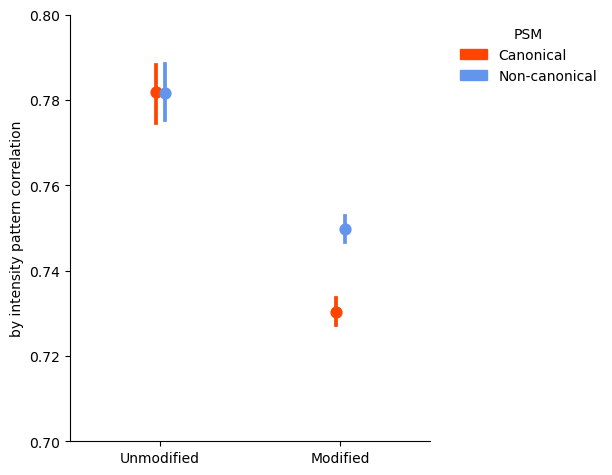

In [396]:
#sns.catplot(data=intcorr_all_tropalt, kind='box',   x='Class', y='value', hue='search', aspect=1.25, showfliers=False, notch=True,palette=["orangered","cornflowerblue"])
#plt.title('Intensity correlation across searches')
#plt.figure(figsize=(3,4))
sns.catplot(data=intcorr_all_tropalt[intcorr_all_tropalt["Class"].isin(["different_unmod","different_modified"])], 
            kind='point', x='Class', y='value', hue='search', dodge=True, aspect=0.9,palette=["orangered","cornflowerblue"],legend=False,linestyles="")
#plt.title('Intensity correlation of all rescued PSMs in TrEMBL and OpenProt')
circle1 = mpatches.Patch(color="orangered", label='Canonical')
circle2 = mpatches.Patch(color="cornflowerblue", label='Non-canonical')
frame=plt.legend(handles=[circle1, circle2], loc='upper right',title="PSM",bbox_to_anchor=(1.5,1))
frame.get_frame().set_edgecolor("white")
plt.ylim(0.7,0.8)
plt.xticks([0,1],["Unmodified","Modified"])
plt.ylabel("by intensity pattern correlation")
plt.xlabel("")
plt.savefig("F4D_intenscorr_upopalt_catplot.svg")
plt.show()

### Figure 5: novel non-canonical

### Types of modifications in UniProt and OpenProt searches in general

In [33]:
def get_exp_vs_unexp_frq_Tdb(df, top=10):
    ''' df is ionbot.first.csv q<0.01
    take first peptidoform
    '''
    db_expmods=[]; db_UNexpmods=[]
    for o,(mod,unexpmod) in enumerate(df.loc[df["database"]=="T",["modifications","unexpected_modification"]].values.tolist()):
        #print(o,mod)
        #print(o,unexpmod)
        if mod=="Unmodified": continue
        if "_or_" in mod:
            a=mod.split("_or_")[0].split("||")
        else:
            a=mod.split("||")
        a=[i.split("|")[1].split("(")[0] for i in a]
        if isinstance(unexpmod,str):
            if "_or_" in unexpmod:
                #in unexpected mods, peptidoforms are sorted by alphabet, not by expected mods
                mod1stpepform=mod.split("_or_")[0]
                for unexp_pepform in unexpmod.split("_or_"):
                    if unexp_pepform in mod1stpepform:
                        b=unexp_pepform.split("||")
            else:
                b=unexpmod.split("||")
            try:
                b=[i.split("(")[0] for i in b] #sometimes unexpected modifications are not empty but there is no mod from 1st peptidifirm
            except:
                b=[]
        else:
            b=[]        
        db_expmods=db_expmods+list(set(a).difference(set(b)))
        db_UNexpmods=db_UNexpmods+list(set(b).difference(set(a)))
    db_expmods_count={k: v for k, v in sorted(Counter(db_expmods).items(), key=lambda item: item[1], reverse=True)}
    db_UNexpmods_count={k: v for k, v in sorted(Counter(db_UNexpmods).items(), key=lambda item: item[1], reverse=True)}
    #frqs top
    db_expmods_frqstop={k:round(db_expmods_count[k]/np.sum(list(db_expmods_count.values())),4)*100 for i,(k,v) in enumerate(db_expmods_count.items()) if i<top}
    db_UNexpmods_frqstop={k:round(db_UNexpmods_count[k]/np.sum(list(db_UNexpmods_count.values())),4)*100 for i,(k,v) in enumerate(db_UNexpmods_count.items()) if i<top}
    return  db_expmods_frqstop, db_UNexpmods_frqstop

In [34]:
modifications_Typesfrq={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_first_datasets:
    mods_types={"canon":0,"trembl":0,"openprot":0}
    for database in combined_first_datasets[dataset_name]:
        df=combined_first_datasets[dataset_name][database]
        mods_types[database]=get_exp_vs_unexp_frq_Tdb(df) #1st output top10 - expected modifications, 2ed unexpected
    modifications_Typesfrq[dataset_name]=mods_types

In [42]:
exp_df=pd.DataFrame()
for dataset_name in modifications_Typesfrq:
    db1_expmods_frqs=modifications_Typesfrq[dataset_name]["canon"][0]
    db2_expmods_frqs=modifications_Typesfrq[dataset_name]["openprot"][0]
    for dict,col in zip([db1_expmods_frqs,db2_expmods_frqs],[f"{dataset_name} UniProt",f"{dataset_name} OpenProt"]):
        exp_df=pd.concat([exp_df,pd.DataFrame({col:list(dict.values())},index=list(dict.keys()))],axis=1)
unexp_df=pd.DataFrame()
for dataset_name in modifications_Typesfrq:
    db1_UNexpmods_frqs=modifications_Typesfrq[dataset_name]["canon"][1]
    db2_UNexpmods_frqs=modifications_Typesfrq[dataset_name]["openprot"][1]
    for dict,col in zip([db1_UNexpmods_frqs,db2_UNexpmods_frqs],[f"{dataset_name} UniProt",f"{dataset_name} OpenProt"]):
        unexp_df=pd.concat([unexp_df,pd.DataFrame({col:list(dict.values())},index=list(dict.keys()))],axis=1)

In [43]:
exp_df

,PXD002057.v0.11.4 UniProt,PXD002057.v0.11.4 OpenProt,PXD003594.v0.11.4 UniProt,PXD003594.v0.11.4 OpenProt,PXD014258.v0.11.4 UniProt,PXD014258.v0.11.4 OpenProt
[4]Carbamidomethyl[C],54.98,58.75,27.82,26.58,58.29,57.68
[1]Acetyl[N-term],24.00,21.00,38.68,38.11,14.27,13.57
[35]Oxidation[M],21.02,NaN,NaN,NaN,NaN,NaN
[35]Hydroxylation[M],NaN,20.25,33.51,35.31,27.44,28.75


In [44]:
#because [35]Oxidation[M]==[35]Hydroxylation[M]
cols=["PXD002057.v0.11.4 OpenProt","PXD003594.v0.11.4 UniProt","PXD003594.v0.11.4 OpenProt","PXD014258.v0.11.4 UniProt","PXD014258.v0.11.4 OpenProt"]
exp_df.loc["[35]Oxidation[M]",cols]=exp_df.loc["[35]Hydroxylation[M]",cols]
exp_df=exp_df.drop("[35]Hydroxylation[M]",axis=0)

In [45]:
exp_df

,PXD002057.v0.11.4 UniProt,PXD002057.v0.11.4 OpenProt,PXD003594.v0.11.4 UniProt,PXD003594.v0.11.4 OpenProt,PXD014258.v0.11.4 UniProt,PXD014258.v0.11.4 OpenProt
[4]Carbamidomethyl[C],54.98,58.75,27.82,26.58,58.29,57.68
[1]Acetyl[N-term],24.00,21.00,38.68,38.11,14.27,13.57
[35]Oxidation[M],21.02,20.25,33.51,35.31,27.44,28.75


In [46]:
#reorder
exp_df=exp_df[[f"{dataset_name} UniProt" for dataset_name in modifications_Typesfrq]+[f"{dataset_name} OpenProt" for dataset_name in modifications_Typesfrq]]
unexp_df=unexp_df[[f"{dataset_name} UniProt" for dataset_name in modifications_Typesfrq]+[f"{dataset_name} OpenProt" for dataset_name in modifications_Typesfrq]]

In [39]:
#heatmap on dataset - values of frequency. 2 subplots: expect and unexpect. rows- types
#is there difference between OP and UP search

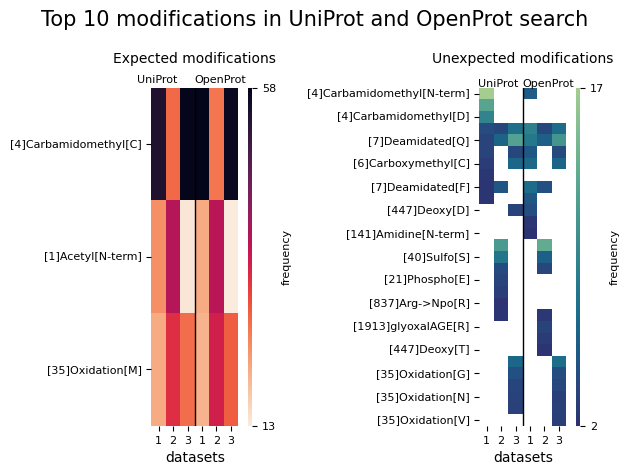

In [47]:
fig, axes = plt.subplots(1,2);
fig.suptitle('Top 10 modifications in UniProt and OpenProt search', fontsize=15)
flat_exp=np.array([df.to_numpy().flatten() for df in [exp_df]]).flatten()
vmax_exp=np.max(flat_exp); vmin_exp=np.min(flat_exp)
flat_UNexp=np.array([df.to_numpy().flatten() for df in [unexp_df]]).flatten()
flat_UNexp = flat_UNexp[~np.isnan(flat_UNexp)]
vmax_UNexp=np.max(flat_UNexp); vmin_UNexp=np.min(flat_UNexp)
sns.heatmap(exp_df, ax=axes[0], vmin=vmin_exp, vmax=vmax_exp,cmap=sns.cm.rocket_r,cbar_kws={'label': 'frequency'}, cbar=False);
#axes[0].set_xticklabels(textwrap.fill(x.get_text(), max_width) for x in axes[0].get_xticklabels());
axes[0].set_xticklabels(["1","2","3","1","2","3"],rotation=0);
axes[0].set_xlabel("datasets");
axes[0].set_title('Expected modifications',fontsize=10,y=1.05)
axes[0].axvline(x=3, linewidth=1, color="black")
axes[0].text(-1, -0.05, 'UniProt', fontsize = 8)
axes[0].text(3, -0.05, 'OpenProt', fontsize = 8)
divider = make_axes_locatable(axes[0]) 
cax = divider.append_axes("right", size="5%", pad=0.1) 
cbar = plt.colorbar(axes[0].collections[0], cax=cax)
cbar.outline.set_visible(False)
cbar.set_ticks([vmin_exp, vmax_exp])
cbar.ax.set_yticklabels([int(vmin_exp), int(vmax_exp)],size=8)
cbar.ax.set_ylabel('frequency',size=8)

sns.heatmap(unexp_df, ax=axes[1], vmin=vmin_UNexp, vmax=vmax_UNexp,cmap = sns.cm.crest_r,cbar_kws={'label': 'frequency'}, cbar=False);
#axes[1].set_xticklabels(textwrap.fill(x.get_text(), max_width) for x in axes[1].get_xticklabels());
axes[1].set_xticklabels(["1","2","3","1","2","3"],rotation=0);
axes[1].set_xlabel("datasets");
axes[1].set_title('Unexpected modifications',fontsize=10,y=1.05)
axes[1].axvline(x=3, linewidth=1, color="black")
axes[1].text(-0.1, -0.1, 'UniProt', fontsize = 8)
axes[1].text(3, -0.1, 'OpenProt', fontsize = 8)
divider = make_axes_locatable(axes[1]) 
cax = divider.append_axes("right", size="5%", pad=0.1) 
cbar = plt.colorbar(axes[1].collections[0], cax=cax)
cbar.outline.set_visible(False)
cbar.set_ticks([vmin_UNexp, vmax_UNexp])
cbar.ax.set_yticklabels([int(vmin_UNexp), int(vmax_UNexp)],size=8)
cbar.ax.set_ylabel('frequency',size=8)


axes[0].tick_params(axis="both", labelsize=8)
axes[1].tick_params(axis="both", labelsize=8)
fig.tight_layout();

#% unique peptides from noncanon prots to all unique peps (IP & II)
#number of unique peptides of non-canon pep
frqs_noncapsm=[]
for dataset_name in combined_first_datasets:
    df=combined_first_datasets[dataset_name]["openprot"]
    df=df.loc[df["database"]=="T"]
    pepset=set(df.matched_peptide)
    a=[]
    for file in set(df.spectrum_file):
        a.append(len(df.loc[((df["only altprots"]==True)|(df["only novelisoprots"]==True))&(df["spectrum_file"]==file),"matched_peptide"].drop_duplicates())/len(pepset))
    frqs_noncapsm.append(np.median(a)*100)
    ##print(dataset_name,len(df[df["only altprots"]==True])/len(df))

In [220]:
#% unique peptides from noncanon prots to all unique peps (IP & II)
#number of unique peptides of non-canon pep
frqs_noncapep=[]
for dataset_name in combined_peptides_datasets:
    df=combined_peptides_datasets[dataset_name]["openprot"]
    df=df.loc[df["decoy"]!=True]
    pepset=set(df.database_peptide)
    a=[]
    for file in set(df.spectrum_file):
        a.append(len(df.loc[((df["only altprots"]==True)|(df["only novelisoprots"]==True))&(df["spectrum_file"]==file),"database_peptide"].drop_duplicates())/len(pepset))
    frqs_noncapep.append(np.median(a)*100)

(0.0, 12.0)

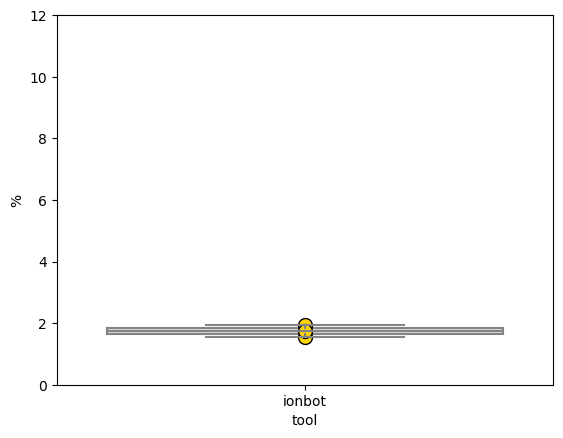

In [221]:
data=pd.DataFrame({"tool":["ionbot","ionbot","ionbot"],"%":frqs_noncapep})
fig, axs = plt.subplots(1,1)
sns.boxplot(data=data,x="tool",y="%",notch=False,color="gainsboro")
plt.scatter([0,0,0],frqs_noncapep,color="gold",s=100,edgecolors="black");
plt.ylim(0,12)
##plt.savefig("altpsmfrq_boxplot.svg")

In [77]:
from plotly_upset.plotting import plot_upset

datasets=["PXD002057.v0.11.4","PXD003594.v0.11.4","PXD014258.v0.11.4"]
dfs=[combined_first_datasets[dataset_name]["openprot"] for dataset_name in datasets]
dfsconc=pd.DataFrame()
#sets=[]
for i,df in enumerate(dfs):
    a=df.loc[((df["only altprots"]==True) | (df["only novelisoprots"]==True)),"matched_peptide"].drop_duplicates().to_frame()
    #sets.append(set(a.matched_peptide))
    a[datasets[i]]=1    
    a.set_index("matched_peptide",inplace=True)
    dfsconc=dfsconc.merge(a,how="outer",left_index=True, right_index=True)
dfsconc.fillna(0,inplace=True)

In [222]:
datasets=["PXD002057.v0.11.4","PXD003594.v0.11.4","PXD014258.v0.11.4"]
dfs=[combined_peptides_datasets[dataset_name]["openprot"] for dataset_name in datasets]
dfsconc=pd.DataFrame()
for i,df in enumerate(dfs):
    a=df.loc[((df["only altprots"]==True) | (df["only novelisoprots"]==True)),"database_peptide"].drop_duplicates().to_frame()
    a[datasets[i]]=1    
    a.set_index("database_peptide",inplace=True)
    dfsconc=dfsconc.merge(a,how="outer",left_index=True, right_index=True)
dfsconc.fillna(0,inplace=True)

In [223]:
#get sets of unique peptides noncanon prots to see ovrlap between samples
dfsconc[dfsconc.sum(axis=1)>1].shape, len(dfsconc)

((249, 3), 1876)

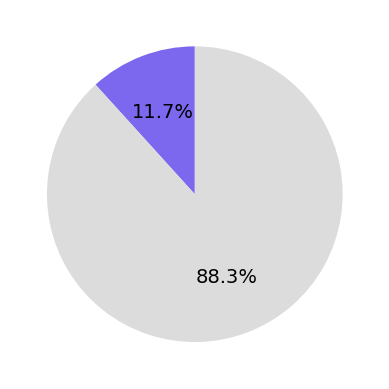

In [224]:
sizes=[len(dfsconc[dfsconc.sum(axis=1)>1]),len(dfsconc)]
labels=["",""] #in >1 dataset, 1 dataset
fig, ax = plt.subplots()
ax.pie(sizes, labels=labels, autopct='%1.1f%%',startangle=90,colors=["mediumslateblue","gainsboro"], textprops={'fontsize': 14});
#plt.savefig("noncanpeprepr_pie.svg")

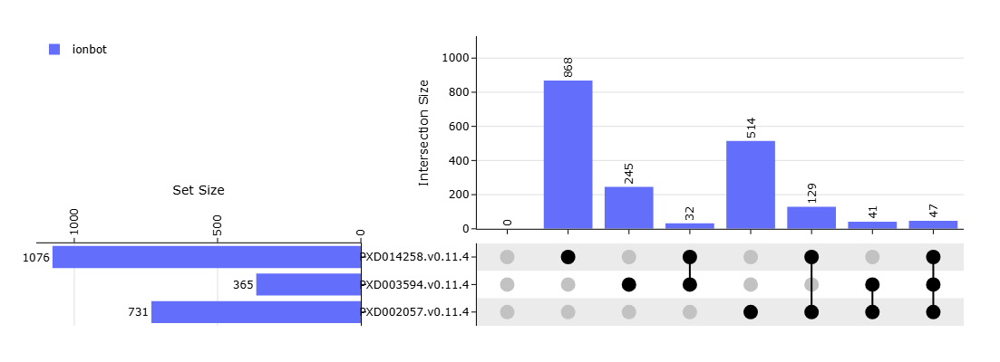

In [225]:
fig = plot_upset(
    dataframes=[dfsconc],
    legendgroups=["ionbot"],
    marker_size=16,
)
#fig.write_image("altpeptides_upset.svg")
fig.show()

### HPP guidlines protein detection 2019

Support such claims by two or more distinct uniquely-mapping, non-nested peptide sequences of
length ≥9 amino acids with the above evidence in the same paper. When 2 peptides overlap, the
total extent must be ≥18 amino acids. When weaker evidence is offered for such a claim, justify that
other peptides cannot be expected by any common digestion proteases. When 2 or more proteins
are *exactly* sequence identical (irrespective of SAAVs), peptides are considered uniquely mapping
if they map only to the group, and such proteins will have the same PE level and be co
#2 unique peps in 1 dataset or many?unted

In [83]:
from difflib import SequenceMatcher
from itertools import combinations

In [226]:
#peptide file
pep_file=combined_peptides_datasets["PXD002057.v0.11.4"]["openprot"]
#psm file
psm_file=combined_first_datasets["PXD002057.v0.11.4"]["openprot"]
#number of psm per peptide (all psm)
psm_file_count=Counter(psm_file.database_peptide)
#psm file rows with peptides absent in peptide file
psm_filteredout=psm_file[~psm_file.database_peptide.isin(list(set(psm_file.database_peptide)-set(pep_file.database_peptide)))]
#number of psm per peptide (among left-out peptides)
psm_filteredout_count=Counter(psm_filteredout.database_peptide)
#select peptides with low n of psms 
psm_file_count_low={k:v for k,v in psm_file_count.items() if v<=np.max(list(psm_filteredout_count.values()))}

In [227]:
#the number of peptides is different
print(len(psm_file_count),len(set(pep_file.database_peptide)))

12334 11655


In [228]:
np.max(combined_peptides_datasets["PXD002057.v0.11.4"]["openprot"]['q-value'])

0.00999421

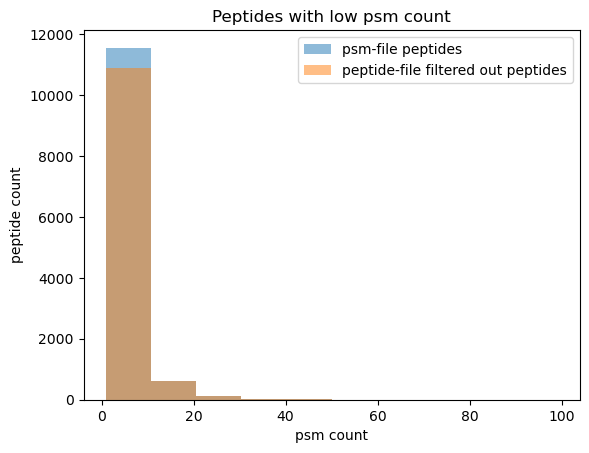

In [229]:
# Visualize the difference in the count of low-occurring peptides in peptide-file and PSM-file
plt.hist(psm_file_count_low.values(),alpha=0.5,label="psm-file peptides");
plt.hist(psm_filteredout_count.values(),alpha=0.5,label="peptide-file filtered out peptides");
plt.xlabel("psm count");
plt.ylabel("peptide count");
plt.title("Peptides with low psm count")
plt.legend(loc="upper right");

In [243]:
def get_pep_psmcount(peptide,psm_df):
    """get number of psm with given peptide, psm_df - filtered by q-value"""
    return len(psm_df[psm_df.database_peptide==pep])
def get_pep_specfile(peptide,psm_df):
    return psm_df[psm_df.database_peptide==pep].spectrum_title.values.tolist()

#def check_uniquepep(df,replicates_dict,psm_df):
    """check if the peptide is unique
    df - slice of ionbot peptide info of 1 protein/protein group
    """
    row={"peptide":[],"protein":[],"msms_count":[],"spectrum_titles":[],"replicate_coverage":[],"q_value":[]}
    
    if len(df.proteins.iloc[0].split("|"))>1:
        return [] #not unique
    else:
        row["protein"]=[df.leadprot.iloc[0]]*len(set(df.matched_peptide.values.tolist()))
    for pep, pep_group in df.groupby("matched_peptide"):
        row["peptide"]=row["peptide"]+[pep]
        row["msms_count"]=row["msms_count"]+[get_pep_psmcount(pep,psm_df)]
        row["spectrum_titles"]=row["spectrum_titles"]+["|".join(list(set(get_pep_specfile(pep,psm_df))))] #unique
        row["q_value"]=row["q_value"]+["|".join(pep_group["q-value"].astype(str).values.tolist())]
        #by replicate of same-nature dataset!
        repcov=[]
        for uniqsuffix in replicates_dict:
            #do not count fraction twice
            if isinstance(replicates_dict[uniqsuffix][0], tuple):#if fractions
                n=0
                for sample in replicates_dict[uniqsuffix]:
                    counted=True; i=0;
                    while counted and i<len(sample):
                        for sp in get_pep_specfile(pep,psm_df):
                            if sample[i] in sp:
                                n+1; counted=False #stop when 1 fraction of the same sample is counted
                        i+=1
                repcov.append(f"{uniqsuffix}:{n}")
            else:#if no fractions
                repcov.append(f"{uniqsuffix}:{sum([1 for sp in get_pep_specfile(pep,psm_df) if uniqsuffix in sp])}")
                            
        row["replicate_coverage"]=row["replicate_coverage"]+["|".join(repcov)]#[len(set(pep_group.spectrum_file.values.tolist()))]
    return row
#def check_partialoverlap(pep1,pep2):
    ovgo=True; i=1 #start with 1 because we expect peptides to overlap on position 1 with K or R
    while ovgo and i<len(pep1):
        if pep2.startswith(pep1[:i+1]) or pep2.endswith(pep1[:i+1]): #+1 - correct for python syntax
            i+=1
        else:
            ovgo=False
    if i>1:
        return True,i
    else:
        return False,i
        
#def check_HPP(df):
    '''  
    #encoding for convention with HPP guidelines
    #0 - no pass: no unique peptide OR peptide length <9 aa OR peptide fully overlaps with another longer peptide
    #1 - has 1 unique peptide >= 9 aa 
    #2 - peptide has no total or partial overlap with other peptide >=9 aa each 
    #3-longest in total overlap >=9aa #should I add up the msms_count for overlapping peptides? - yes
    #4-partial overlapping peps union >=18 aa
    #5 -is partial overlap, but <18 aa, but this pep is >=9
    '''
    df["HPP_pass"]=False
    df["msms_count_totaloverlap_sum"]=False
    for name,group in df.groupby("protein"):
        #print(group["peptide"].values[0])
        if len(group)==1 and len(group["peptide"].values[0])>=9:
            #carefull, it is true for this dataset, but it can be an overlapping peptide when accounting for several datasets
            #same for other HPP_pass=True peptides
            df.loc[group.index,"HPP_pass"]=1 
            #print(f"{name} one unique pep pass")
        elif len(group)==1 and len(group["peptide"].values[0])<9:
            df.loc[group.index,"HPP_pass"]=0
            #print(f"{name} one unique pep NO pass")
        elif len(group)>1:
            ##pass_length=[True if len(row["peptide"])>=9 else False for i,row in group.iterrows()]
            #filter out total overlap
            pep_pairs=list(combinations(group.peptide.values.tolist(), 2))
            indx_pairs=list(combinations(group.index.tolist(), 2))
            #(True True) if not total overlap and >=9 aa
            #(True, False)/(False,True) if total overlap and one longest >= 9 aa OR no overlap and one >=9 aa
            #when same index True and False in different pairs in pass_overlaplength -> False, as it total overlaps with other pep !!
            #(False, False) if <9, no total overlap 
            #(-1,-1) if total overlap and both <9 - filter out these
            pass_overlaplength=[]
            for pair_indx, (pep1, pep2) in enumerate(pep_pairs): 
                if pep1.find(pep2)==-1 and pep2.find(pep1)==-1: #no total overlap
                    pass_overlaplength.append((len(pep1)>=9,len(pep2)>=9))
                else:#total overlap
                    if len(pep1)>=9 or len(pep2)>=9: #and
                        pass_overlaplength.append(((len(pep1)>len(pep2)),(len(pep2)>len(pep1)))) #who longer
                    #elif len(pep1)>=9 or len(pep2)>=9:
                    #    pass_overlaplength.append(((len(pep1)>len(pep2) and len(pep1)>=9),(len(pep2)>len(pep1) and len(pep2)>=9)))
                    elif len(pep1)<9 and len(pep2)<9:
                        pass_overlaplength.append((-1,-1))
            #for pep always false in pass_overlaplength check on partial overlap length
            #find partial overlap and check for length; 
            pass_partovlen_pairs=[]
            #false - no partial overlap or union <18aa
            #true - partial overlap with union >=18aa
            #0 - not (False,False) or (True,True) pair
            for pair_indx, (pep1, pep2) in enumerate(pep_pairs):
                if pass_overlaplength[pair_indx]==(False,False) or pass_overlaplength[pair_indx]==(True,True): #T,T can be partial ov and len>=9 aa...!!!
                    #print(group)
                    #print(indx_pairs[pair_indx])
                    #match = SequenceMatcher(None, pep1, pep2).find_longest_match() #this method does not work as it takes by character overlap
                    ispartov,ovsize=check_partialoverlap(pep1,pep2)
                    if ispartov: #match.size>0
                        if (len(pep1)+len(pep2)-ovsize)>=18: #match.size
                            pass_partovlen_pairs.append(True)
                            #print(group)
                            #print(indx_pairs[pair_indx])
                        else:
                            pass_partovlen_pairs.append(2)
                    else:
                        pass_partovlen_pairs.append(-1)
                else:
                    pass_partovlen_pairs.append(0)
            #if name=="II_590136":
            #    print(group)
            #    print(indx_pairs)
            #    print(pass_overlaplength)
            #    print(pass_partovlen_pairs)
            #make descision
            ###indx_pass=[]
            for indx in group.index.tolist():
                indx_ovlenall=[];#partovpass=False
                for i,(indx1,indx2) in enumerate(indx_pairs):
                    if indx==indx1 or indx==indx2:
                        #if group.loc[indx,"peptide"]=="MYPGIADRMQKEITALAPSTMK":
                        #    print(pass_overlaplength[i])
                        if pass_overlaplength[i]==(-1,-1):# or pass_partovlen_pairs[i]==False:
                            #indx_pass.append(False)
                            #indx_ovlenall.append(False)
                            df.loc[indx,"HPP_pass"]=0
                        elif pass_partovlen_pairs[i]==True: #save both peps when 1 is part ov with other & union len >=18
                            #indx_pass.append(True)
                            #partovpass=True
                            df.loc[indx,"HPP_pass"]=4
                        elif pass_partovlen_pairs[i]==-1 and len(group.loc[indx,"peptide"])>=9: #no partial overlap and >=aa; if is total ov -> 3
                            df.loc[indx,"HPP_pass"]=2
                        elif pass_partovlen_pairs[i]==2 and len(group.loc[indx,"peptide"])>=9: #is partial overlap, but <18 aa, but this pep is >=9
                            df.loc[indx,"HPP_pass"]=5
                        else:
                            if indx==indx1:
                                indx_ovlenall.append(pass_overlaplength[i][0])
                            else:
                                indx_ovlenall.append(pass_overlaplength[i][1])
                #when same index True and False in different pairs in pass_overlaplength -> False, as it total overlaps with other pep !!
                #if group.loc[indx,"peptide"]=="GVLTVKDGK":
                #    print(indx_ovlenall)
                #    print(group)
                #    print(pass_overlaplength)
                #    print(indx_pairs)
                if  len(indx_ovlenall)!=0 and all(indx_ovlenall): #partovpass or
                    #indx_pass.append(True)
                    df.loc[indx,"HPP_pass"]=3
                    #for pairs where there is a total overlap and this indx is present in pair
                    df.loc[indx,"msms_count_totaloverlap_sum"]=sum([group.loc[list(indxpair),"msms_count"].sum() for indxpair,ovlenbool in zip(indx_pairs,pass_overlaplength) if (indx in indxpair) and (ovlenbool==(True,False) or ovlenbool==(False,True))])
                elif len(indx_ovlenall)!=0 and not all(indx_ovlenall):
                    #indx_pass.append(False)
                    df.loc[indx,"HPP_pass"]=0
                elif len(indx_ovlenall)==0: #the descision was made before
                    continue
            #pass_code=[2 if a else 0 for a in indx_pass]
            #print(group.index)
            #print(indx_pass)
            #print(pass_code)
            ###df.loc[group.index,"HPP_pass"]=pass_code
            #if any(indx_pass)>0:
            #    print(f"{name} n={pass_code.count(2)} code 2 pass, n={pass_code.count(0)} code 0 no pass")
    return df    

In [139]:
import re
import interval

In [288]:
prot="MSKSESPEEPEQLRKLFIGGLSFETTDESLEEPF"
tmp_all_pep_pos_sep=[]
for pep in ["MSKSESPEEPEQLRK","SKSESPEEPEQLRK"]:
    pos=get_pep_positions(prot,pep)
    tmp_all_pep_pos_sep.append(pos)
tmp_all_pep_pos=list(chain(*tmp_all_pep_pos_sep))
check_ov_any([(0, 15)],tmp_all_pep_pos)

[0]

In [295]:
tmp_all_pep_pos_sep

[[(0, 15)], [(1, 15)]]

In [296]:
x=interval.interval[(0, 15)]
y=interval.interval[(1, 15)]
len(x & y)>0 and ((x & y)!=x or (x & y)!=y)

True

In [293]:
len("SKSESPEEPEQLRK")

14

In [310]:
check_type_len_ov((0, 15),[(0, 15),(1, 15)],typeof_ov="total")

([True], [True])

In [309]:
check_type_len_ov((0, 15),[(0, 15),(1, 15)],typeof_ov="partial") #why same intervl, why none, false, why not that elif

interval([0.0, 15.0]) interval([1.0, 15.0])
0


([True], [False])

In [316]:
HPP_decision("MSKSESPEEPEQLRK",[0],[any([True]),any([True]),any([True]),any([False])])

(True, True)

In [287]:
tmp_all_pep_pos

[[(0, 15)], [(1, 15)]]

In [307]:
r=(False, None)
r[0]

False

In [129]:
def get_pep_positions(prot,pep):    
    return [(m.start(),m.start()+len(pep)-1) for m in re.finditer(pep, prot)]
def check_ov_any(pep_pos,all_pep_pos):
    """ which of the positions of pep overlap with any other pep
    pep_pos is a list
    """
    for pos in pep_pos: all_pep_pos.remove(pos)
    other_pep_pos=sorted(all_pep_pos,key=lambda x: x[1])
    pep_pos_ov=[]
    for j,pos in enumerate(pep_pos):
        #print(pos)
        x=interval.interval[*pos]
        not_ov=True; i=0
        while not_ov and i<len(other_pep_pos): 
            y=interval.interval[*other_pep_pos[i]]
            if len(x & y):
                not_ov=False
            #print(not_ov)
            i+=1
        if not not_ov: pep_pos_ov=pep_pos_ov+[j]
    return pep_pos_ov
    
def check_type_len_ov(pep_pos,all_pep_pos,typeof_ov):
    """pep_pos is a tuple
        all_pep_pos is a list of tuples, not sorted
        typeof_ov="partial" or "total"
    """
    x=interval.interval[pep_pos]
    typeof_ov_ifpass=[]; lenof_ov_ifpass=[]
    for other_pos in all_pep_pos:
        if other_pos==pep_pos: continue
        y=interval.interval[other_pos]
        ##if len(x & y)==0: return False, None
        if typeof_ov=="total":
            if len(x & y)>0 and  ((x & y)==x or (x & y)==y): #two-sided                
                max_len=np.max([pep_pos[1]-pep_pos[0],other_pos[1]-other_pos[0]])
                res=(True, max_len>=9)
            else:
                res=(False, False) #None
        if typeof_ov=="partial":
            #print(x,y)
            if  len(x & y)>0 and ((x & y)!=x or (x & y)!=y): #partial overlap will yield false
                ov_int=sorted([pep_pos,other_pos],key=lambda x: x[1])
                tot_len=ov_int[1][1]-ov_int[0][0]
                #print(0)
                res=(True, tot_len>=18)
            else: 
                #print(1)
                res=(False, False) #None
        typeof_ov_ifpass=typeof_ov_ifpass+[res[0]]
        lenof_ov_ifpass=lenof_ov_ifpass+[res[1]]
    return  typeof_ov_ifpass, lenof_ov_ifpass
        
def HPP_decision(pep,pep_pos_ov,type_len_ov_any):
    """returns if info has to be collected, and if msms counts should be merged to other pep"""
    if len(pep_pos_ov)==0:
        return len(pep)>=9, False
    else:
        if type_len_ov_any==[True,False,True,True] or type_len_ov_any==[False,None,True,True]:
            return True, False
        else:
            #if len(pep)>=9:
            #    return True, False
            #else:
            if type_len_ov_any[1]==True or type_len_ov_any[3]==True:
                return True, True #add msms count to 1 or both of overlap peps
            else:
                return False, False#"mess with code" #is it???????????????????????                 
    

In [419]:
x=interval.interval[(1,4)]
y=interval.interval[(6,8)]
if len(x&y): print (1)

In [931]:
def check_HPP(name,group,fasta_dict):
    #get protein sequence    
    key=f'op|{name.split("((")[0]}|TX=9606'
    prot_seq=str(fasta_dict[key].seq)
    peps_seq=set(group.database_peptide)
    all_pep_pos_sep=[]
    for pep in peps_seq:
        all_pep_pos_sep.append(get_pep_positions(prot_seq,pep)) #pep with several positions included
    #print(all_pep_pos_sep)
    all_pep_pos=c
    #print(all_pep_pos)
    #see if pep overlaps with any
    HPP_ifpass=[]
    for pep_posns,pep_seq in zip(all_pep_pos_sep,peps_seq):
        tmp_all_pep_pos=all_pep_pos.copy()
        pep_pos_ov=check_ov_any(pep_posns,tmp_all_pep_pos) #if pep overlaps with himself - it won't be seen
        type_len_ov=[]; type_len_ov_any=[]
        if len(pep_pos_ov)>0:
            #select  1st pep_pos that overlaps - BIAS
            pep_pos=pep_posns[pep_pos_ov[0]]
            all_pep_pos_nodub=all_pep_pos.copy()
            if len(pep_posns)>1: 
                for p in pep_posns[1:]: 
                    #print(p)
                    #print(all_pep_pos_nodub)
                    all_pep_pos_nodub.remove(p)
            #check total
            iftotal_ov, iftotal_len=check_type_len_ov(pep_pos,all_pep_pos_nodub,typeof_ov="total") #output - lists pep vs all
            ifpart_ov, ifpart_len=check_type_len_ov(pep_pos,all_pep_pos_nodub,typeof_ov="partial")
            type_len_ov=[iftotal_ov,iftotal_len,ifpart_ov,ifpart_len] #matrix, rows - requirements, cols - other peps
            type_len_ov_any=[any(iftotal_ov),any(iftotal_len),any(ifpart_ov),any(ifpart_len)] 
        #make decision
        ifpass, ifmerge_msms=HPP_decision(pep_seq,pep_pos_ov,type_len_ov_any)
        HPP_ifpass=HPP_ifpass+[[pep_seq,ifpass,ifmerge_msms,type_len_ov]]
    return HPP_ifpass
def pass_HPP_info(pep_ifpass,peptide_indx,other_pepindx_ifpass,pep_group,psm_df,replicates_dict):
    """"""
    row={"protein":[],"peptide_code":[],"overlap_with":[],"peptide":[],"msms_count":[],"spectrum_titles":[],"replicate_coverage":[],"q_value":[]}
    prot=pep_group.proteins.iloc[0].split("((")[0]
    row["protein"]=[prot]
    row["peptide_code"]=[prot+"_"+str(peptide_indx)]
    if pep_ifpass[2]:
        type_len_ov=pep_ifpass[3]
        #print(type_len_ov)
        #restore indexation with dum values for examened peptide
        for i in range(len(type_len_ov)):
            type_len_ov[i].insert(peptide_indx,None)
        other_pepindx_ifpass.insert(peptide_indx,True)
        #print(type_len_ov)
        #print(other_pepindx_ifpass)
        #combine into df
        a=pd.DataFrame(type_len_ov+[other_pepindx_ifpass]).T
        #print(a)
        mergewith_pepindxs=a[(a[4]==True)&(a[1] | a[3])].index.tolist()
        #print(mergewith_pepindxs)
        #print(mergewith_pepindxs)
        row["overlap_with"]="|".join([prot+"_"+str(i) for i in mergewith_pepindxs])
    else:
        row["overlap_with"]=[False]
    pep=pep_ifpass[0]
    row["peptide"]=[pep]    
    row["msms_count"]=[get_pep_psmcount(pep,psm_df)]
    row["spectrum_titles"]=["|".join(list(set(get_pep_specfile(pep,psm_df))))] #unique
    row["q_value"]=["|".join(pep_group["q-value"].astype(str).values.tolist())]
    #by replicate of same-nature dataset!
    repcov=[]
    for uniqsuffix in replicates_dict:
        #do not count fraction twice
        if isinstance(replicates_dict[uniqsuffix][0], tuple):#if fractions
            n=0
            for sample in replicates_dict[uniqsuffix]:
                counted=True; i=0;
                while counted and i<len(sample):
                    for sp in get_pep_specfile(pep,psm_df):
                        if sample[i] in sp:
                            n+1; counted=False #stop when 1 fraction of the same sample is counted
                    i+=1
            repcov.append(f"{uniqsuffix}:{n}")
        else:#if no fractions
            repcov.append(f"{uniqsuffix}:{sum([1 for sp in get_pep_specfile(pep,psm_df) if uniqsuffix in sp])}")
                        
    row["replicate_coverage"]=["|".join(repcov)]
    return row
#check_HPP T-> pass_HPP_info

In [932]:
#dataset-unique sufix-full
#fractions are same replicate!
replicates_datasets={
    'PXD002057.v0.11.4':{"_hu_C":['130327_o2_01_hu_C1_2hr.mgf','130327_o2_03_hu_C2_2hr.mgf','130327_o2_05_hu_C3_2hr.mgf'],
                        "_hu_P":['130327_o2_02_hu_P1_2hr.mgf','130327_o2_04_hu_P2_2hr.mgf','130327_o2_06_hu_P3_2hr.mgf']},
    'PXD003594.v0.11.4':{'b1369p080_sample':[('b1369p080_sample_01_a.mgf','b1369p080_sample_01_b.mgf'),
                                              ('b1369p080_sample_02_a.mgf', 'b1369p080_sample_02_b.mgf'),
                                             ('b1369p080_sample_03_a.mgf', 'b1369p080_sample_03_b.mgf'),
                                             ('b1369p080_sample_04_a.mgf', 'b1369p080_sample_04_b.mgf'),
                                             ('b1369p080_sample_05_a.mgf', 'b1369p080_sample_05_b.mgf'),
                                             ('b1369p080_sample_06_a.mgf', 'b1369p080_sample_06_b.mgf'),
                                             ('b1369p080_sample_07_a.mgf', 'b1369p080_sample_07_b.mgf'),
                                             ('b1369p080_sample_08_a.mgf', 'b1369p080_sample_08_b.mgf'),
                                             ('b1369p080_sample_09_a.mgf', 'b1369p080_sample_09_b.mgf'),
                                             ('b1369p080_sample_10_a.mgf', 'b1369p080_sample_10_b.mgf'),
                                             ('b1369p080_sample_11_a.mgf', 'b1369p080_sample_11_b.mgf'),
                                             ('b1369p080_sample_12_a.mgf', 'b1369p080_sample_12_b.mgf'),
                                             ('b1369p080_sample_13_a.mgf', 'b1369p080_sample_13_b.mgf'),
                                             ('b1369p080_sample_14_a.mgf', 'b1369p080_sample_14_b.mgf')]},
    
    'PXD014258.v0.11.4':{"ESC-HF-Sample-BT474":['ESC-HF-Sample-BT474_1.mgf', 'ESC-HF-Sample-BT474_2.mgf', 'ESC-HF-Sample-BT474_3.mgf', 'ESC-HF-Sample-BT474_4.mgf', 'ESC-HF-Sample-BT474_5.mgf'],
                        "ESC-HF-Sample-MCF1":['ESC-HF-Sample-MCF1.mgf', 'ESC-HF-Sample-MCF2.mgf', 'ESC-HF-Sample-MCF3.mgf', 'ESC-HF-Sample-MCF4.mgf', 'ESC-HF-Sample-MCF5.mgf'],
                        "ESC-HF-SampleHela":['ESC-HF-SampleHela1.mgf', 'ESC-HF-SampleHela2.mgf', 'ESC-HF-SampleHela3.mgf', 'ESC-HF-SampleHela4.mgf', 'ESC-HF-SampleHela5.mgf']}
}

In [933]:
def get_prot_acc(name):
    return "||".join([n.split("((")[0] for n in name.split("||")])

In [2406]:
for dataset_name in combined_peptides_datasets:
    ncprots_HPPpep=pd.DataFrame(columns=["protein","peptide_code","overlap_with","peptide","msms_count","spectrum_titles","replicate_coverage","q_value"])
    df_op=combined_peptides_datasets[dataset_name]["openprot"]
    df_op=df_op[df_op.peptide_class=="NonCanon_unique"]#df_op.loc[((df_op["only altprots"]==True) | (df_op["only novelisoprots"]==True))]
    df_op["prot_acc"]=df_op["proteins"].apply(get_prot_acc)
    psm_df=combined_first_datasets[dataset_name]["openprot"]
    for name, group in df_op.groupby("prot_acc"): #all unique peptides of this protein
        #if name=="IP_560713": print(group)
        if len(name.split("||"))>1: continue #skip peptides unique to non-canon, but shared amond several non-canon
        #filterout peptides of len<9aa
        #group.drop([i for i,row in group.iterrows() if len(row["database_peptide"]<9)],axis=0,inplace=True)
        #if len(set(group.database_peptide))>1: print(group)
        group_ifpass=check_HPP(name,group,OPfasta)
        if name=="IP_560713": print(group_ifpass)
        for peptide_indx,pep_ifpass in enumerate(group_ifpass):
            if pep_ifpass[1]:
                if name=="IP_560713": print(pep_ifpass)
                #print(peptide_indx)
                #print(pep_ifpass)
                other_pepindx_ifpass=[p[1] for i,p in enumerate(group_ifpass) if i!=peptide_indx] #if and p[1]
                #print(group_ifpass)
                #print(len(group_ifpass),len(other_pepindx_ifpass))
                #if pep is part of other pep, do not merge msms counts *yet*
                #leave as separate rows, but indicate part of which peps or part ov peps it is
                pep=pep_ifpass[0]
                pep_group=group.groupby("database_peptide").get_group(pep)
                #if name=="II_164251((3-17))((II_164251))": print(pep_group)
                row=pass_HPP_info(pep_ifpass,peptide_indx,other_pepindx_ifpass,pep_group,psm_df,replicates_datasets[dataset_name])
                if name=="IP_560713": print(row)
                ncprots_HPPpep=pd.concat([ncprots_HPPpep,pd.DataFrame(row)])
                print("decisions made",name,peptide_indx)
                #print(row)
                #print(pep_ifpass[2])
    ncprots_HPPpep.reset_index(inplace=True,drop=True)
    ncprots_HPPpep.to_csv(f"{dataset_name}_NCuniqueANDoverlappepHPP_2.txt",sep="\t",index=None)
    print("decisions made",dataset_name)

decisions made II_164251 0
decisions made II_278328 0
decisions made II_3387987 0
decisions made II_3406570 0
decisions made II_3428044 0
decisions made II_3436236 0
decisions made II_3768748 0
decisions made II_3768748 1
decisions made II_3770850 0
decisions made II_3771306 0
decisions made II_3776861 0
decisions made II_3782678 0
decisions made II_3784955 0
decisions made II_3789193 0
decisions made II_3790919 0
decisions made II_3790919 1
decisions made II_3791227 0
decisions made II_3797019 0
decisions made II_3798112 0
decisions made II_3802806 0
decisions made II_4488111 0
decisions made II_4488111 1
decisions made II_4494432 0
decisions made II_4498982 0
decisions made II_560137 0
decisions made II_567153 0
decisions made II_570495 0
decisions made II_583924 0
decisions made II_585805 0
decisions made II_586544 0
decisions made II_586544 1
decisions made II_590372 0
decisions made II_604645 0
decisions made II_608351 0
decisions made II_624374 0
decisions made II_642046 0
decisi

In [996]:
name

'IP_292304'

In [2407]:
df=pd.read_csv(f'{"PXD002057.v0.11.4"}_NCuniqueANDoverlappepHPP_2.txt',sep="\t")
len(df[df.overlap_with.isna()]),len(df)

(0, 652)

ncprotsHPP_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in ncprotsHPP_datasets:
    ncprots=pd.DataFrame(columns=["peptide","protein","msms_count","spectrum_titles","replicate_coverage"])
    ##mgfspectraN=mgfspectraN_datasets[dataset_name]    
    df_op=combined_first_datasets[dataset_name]["openprot"]
    df_op=df_op.loc[((df_op["only altprots"]==True) | (df_op["only novelisoprots"]==True)) & (df_op["database"]=="T")]
    for name, group in df_op.groupby("leadprot"):
        #print(name,len(group))
        #print(name)
        #print(group)
        row=check_uniquepep(group,replicates_datasets[dataset_name])
        #print(row)
        if len(row)>0:
            #to df and concat
            #print(dataset_name,name,len(group),len(set(group.matched_peptide.values.tolist())),len(row["peptide"]))
            #if len(group)!=len(set(group.matched_peptide.values.tolist())):
            #    print(group)
            #    print(row)
            ncprots=pd.concat([ncprots,pd.DataFrame(row)])
    #save to file
    ncprots.reset_index(inplace=True,drop=True)
    df_hpp=check_HPP(ncprots)
    df_hpp.to_csv(f"{dataset_name}_NCuniquepepHPP.txt",sep="\t")   
    ncprotsHPP_datasets[dataset_name]=df_hpp

for dn in ncprotsHPP_datasets:
    print(dn,len(ncprotsHPP_datasets[dn]))

for dn in ncprotsHPP_datasets:
    print(dn,ncprotsHPP_datasets[dn].msms_count.mean())

ncprotsHPP_datasets['PXD002057.v0.11.4'].spectrum_titles.values[0]
ncprotsHPP_datasets['PXD002057.v0.11.4'].peptide.values[0]

#df_hpp[(df_hpp.HPP_pass==False) & (df_hpp.HPP_pass!=0)]#.head(30)
df_hpp[(df_hpp.HPP_pass==3)].head(5).spectrum_titles.values[0]
#df_hpp[df_hpp.protein=="IP_292905"]

#table summarising non-canonical proteins by peptide identifications across datasets
ncprotsHPP_summary_msms=pd.DataFrame(columns=["peptide","overlap_with","protein","msms_count_PXD002057.v0.11.4","msms_count_PXD003594.v0.11.4","msms_count_PXD014258.v0.11.4"])
for dataset_name in combined_peptides_datasets:
    df=pd.read_csv(f'{dataset_name}_NCuniquepepHPP_2.txt',sep="\t")
    #HPP filter
    ##df=df[df.overlap_with==None] #HERE take into account 2 passing peptides that are 1
    for (prot,pep),group in df.groupby(["protein","peptide"]):
        #print(pep,prot)
        #break
        value=np.nan
        #if group["HPP_pass"].values[0]==3:
        #    value=group["msms_count_totaloverlap_sum"].values[0]
        #else:
        value=group["msms_count"].values[0]
        ov=True if isinstance(group["overlap_with"].iloc[0],str) else False
        if f"{pep}_{prot}" not in list(ncprotsHPP_summary_msms.peptide+"_"+ncprotsHPP_summary_msms.protein): 
            ncprotsHPP_summary_msms.loc[-1] = [pep,ov,prot,np.nan,np.nan,np.nan]
            ncprotsHPP_summary_msms.index = ncprotsHPP_summary_msms.index + 1
            ncprotsHPP_summary_msms = ncprotsHPP_summary_msms.sort_index()
        ncprotsHPP_summary_msms.loc[(ncprotsHPP_summary_msms.peptide==pep) & (ncprotsHPP_summary_msms.protein==prot),f"msms_count_{dataset_name}"]=value
ncprotsHPP_summary_msms.sort_values(["protein"],inplace=True)    

In [2408]:
#table summarising non-canonical proteins by peptide identifications across datasets
ncprotsHPP_summary_msms=pd.DataFrame(columns=["peptide","overlap_with","protein","msms_count_PXD002057.v0.11.4","msms_count_PXD003594.v0.11.4","msms_count_PXD014258.v0.11.4"])
dfs=[pd.read_csv(f'{dataset_name}_NCuniqueANDoverlappepHPP_2.txt',sep="\t") for dataset_name in combined_peptides_datasets]
for df,dataset_name in zip(dfs,combined_peptides_datasets):
    df["dataset"]=dataset_name
dfs=pd.concat(dfs)
for (prot,pep),group in dfs.groupby(["protein","peptide"]):
    #if prot=="IP_560713": print(group)
    ov=True if any(group["overlap_with"].iloc[i]!='False' for i in range(len(group))) else False
    #if prot=="IP_560713": print(ov)
    for dataset_name,dataset_group in  group.groupby(["dataset"]):
        value=dataset_group["msms_count"].values[0]
        if f"{pep}_{prot}" not in list(ncprotsHPP_summary_msms.peptide+"_"+ncprotsHPP_summary_msms.protein): 
            ncprotsHPP_summary_msms.loc[-1] = [pep,ov,prot,np.nan,np.nan,np.nan]
            ncprotsHPP_summary_msms.index = ncprotsHPP_summary_msms.index + 1
            ncprotsHPP_summary_msms = ncprotsHPP_summary_msms.sort_index()
        ncprotsHPP_summary_msms.loc[(ncprotsHPP_summary_msms.peptide==pep) & (ncprotsHPP_summary_msms.protein==prot),f"msms_count_{dataset_name[0]}"]=value
ncprotsHPP_summary_msms.sort_values(["protein"],inplace=True)    

In [2409]:
ncprotsHPP_summary_msms[ncprotsHPP_summary_msms.protein=="IP_560713"]

,peptide,overlap_with,protein,msms_count_PXD002057.v0.11.4,msms_count_PXD003594.v0.11.4,msms_count_PXD014258.v0.11.4
1101,VIHDNFGIVEGLMTIVHAITATQK,False,IP_560713,2.0,2.0,2.0
1103,IVGSAFCTTNCLAPLAK,False,IP_560713,1.0,NaN,2.0
1102,LTGMAFCVPTAVSVVDLTCR,False,IP_560713,2.0,NaN,2.0


In [1001]:
def get_interdatasets_pepov(group):
    name=group.protein.iloc[0]
    if True in group.overlap_with.tolist() and len(group[group.overlap_with==True])<len(group):
        print("check ",name)
        nov_peps_seq=group[group.overlap_with==False].peptide.tolist()
        #print(nov_peps_seq)
        #are those really non-overlapping?
        key=f'op|{name.split("((")[0]}|TX=9606'
        prot_seq=str(OPfasta[key].seq)
        peps_seq=set(group.peptide)
        all_pep_pos_sep=[]
        for pep in peps_seq:
            all_pep_pos_sep.append(get_pep_positions(prot_seq,pep))
        all_pep_pos=list(chain(*all_pep_pos_sep))
        #print(all_pep_pos_sep)
        #see if pep overlaps with any
        nov_pep_pos_ov=[]
        for pep_posns,pep_seq in zip(all_pep_pos_sep,peps_seq):
            if pep_seq in nov_peps_seq:
                #print(pep_seq),print(pep_posns)
                tmp_all_pep_pos=all_pep_pos.copy()
                nov_pep_pos_ov.append(check_ov_any(pep_posns,tmp_all_pep_pos))
        #print(group[["peptide","overlap_with"]])
        #print(nov_pep_pos_ov)
        nov_ov_decision=[len(i)>0 for i in nov_pep_pos_ov]
        group.loc[(group.peptide.isin(nov_peps_seq)),"overlap_with"]=nov_ov_decision
    return group

In [2410]:
#suspect peptides that do overlap but were detected in different datasets
ncprotsHPP_summary_msms_inter=ncprotsHPP_summary_msms.groupby("protein").apply(get_interdatasets_pepov)

check  IP_4488849
check  IP_556624
check  IP_557834
check  IP_558777
check  IP_559481
check  IP_564698
check  IP_581916
check  IP_591791
check  IP_591792
check  IP_592011
check  IP_592084
check  IP_597129
check  IP_601561
check  IP_602007
check  IP_602534
check  IP_603079
check  IP_612089
check  IP_612790
check  IP_612847
check  IP_621691
check  IP_624641
check  IP_636335
check  IP_638815
check  IP_638914
check  IP_658206
check  IP_665305
check  IP_667663
check  IP_667709
check  IP_670462
check  IP_671104
check  IP_671259
check  IP_672475
check  IP_672618
check  IP_755869
check  IP_763499
check  IP_773965
check  IP_774306
check  IP_789305
check  IP_790880


In [2411]:
ncprotsHPP_summary_msms_inter.reset_index(drop=True,inplace=True)

In [2412]:
msms_cols=[f"msms_count_{dataset_name}" for dataset_name in combined_peptides_datasets]
ncprotsHPP_summary_msms_inter[msms_cols]=ncprotsHPP_summary_msms_inter[msms_cols].fillna(0)

In [2413]:
ncprotsHPP_summary_msms_inter.to_csv(f"summary_msms_NCuniqueANDoverlap_pepHPP_2.txt",sep="\t")  

In [2414]:
len(ncprotsHPP_summary_msms_inter)

1526

In [2415]:
#DELET NESTED PEPS, no msms count merge
ncprotsHPP_summary_msms_inter_delnested=pd.DataFrame(columns=["peptide","overlap_with","protein","msms_count_PXD002057.v0.11.4","msms_count_PXD003594.v0.11.4","msms_count_PXD014258.v0.11.4"])
for name,group in ncprotsHPP_summary_msms_inter.groupby(["protein"]):
    #if name[0]=="IP_560713": print(group)
    if True in group.overlap_with.tolist():
        #print(group)
        overlapping_peptides=group[group.overlap_with==True].peptide.tolist()
        #get positions
        key=f'op|{name[0].split("((")[0]}|TX=9606'
        prot_seq=str(OPfasta[key].seq)
        ov_pep_pos_sep=[]
        for pep in overlapping_peptides:
            ov_pep_pos_sep.append(get_pep_positions(prot_seq,pep))
        #select 1st
        ov_pep_pos=[s[0] for s in ov_pep_pos_sep]
        ov_pep_pos_str=[".".join([str(i) for i in range(*ov_pos)]) for ov_pos in ov_pep_pos]
        #is ov full?
        ov_pep_pos_nested=[]
        for i,ov_pos in enumerate(ov_pep_pos):
            ov_pep_pos_nested.append(any([".".join([str(i) for i in range(*ov_pos)]) in s  for j,s in enumerate(ov_pep_pos_str) if i!=j ]))
        nested=np.array(overlapping_peptides)[ov_pep_pos_nested]
        non_nested=set(overlapping_peptides)-set(nested.tolist())
        group_new=group[(group.overlap_with==False)|(group.peptide.isin(non_nested))]
        #print(group_new)
    else:
        group_new=group
    #if name[0]=="IP_560713": print(group_new)
    ncprotsHPP_summary_msms_inter_delnested=pd.concat([ncprotsHPP_summary_msms_inter_delnested,group_new])
    ncprotsHPP_summary_msms_inter_delnested.reset_index(inplace=True,drop=True)

                      peptide  overlap_with    protein  \
422  VIHDNFGIVEGLMTIVHAITATQK         False  IP_560713   
423         IVGSAFCTTNCLAPLAK         False  IP_560713   
424      LTGMAFCVPTAVSVVDLTCR         False  IP_560713   

     msms_count_PXD002057.v0.11.4  msms_count_PXD003594.v0.11.4  \
422                           2.0                           2.0   
423                           1.0                           0.0   
424                           2.0                           0.0   

     msms_count_PXD014258.v0.11.4  
422                           2.0  
423                           2.0  
424                           2.0  
                      peptide  overlap_with    protein  \
422  VIHDNFGIVEGLMTIVHAITATQK         False  IP_560713   
423         IVGSAFCTTNCLAPLAK         False  IP_560713   
424      LTGMAFCVPTAVSVVDLTCR         False  IP_560713   

     msms_count_PXD002057.v0.11.4  msms_count_PXD003594.v0.11.4  \
422                           2.0                     

In [2416]:
ncprotsHPP_summary_msms_inter_delnested.to_csv(f"summary_msms_NCuniqueNOnested_pepHPP_2.txt",sep="\t")  

In [2417]:
len(ncprotsHPP_summary_msms_inter_delnested)

1332

In [2418]:
#short peptide? 1
count=[1  for pep in ncprotsHPP_summary_msms_inter_delnested.peptide if len(pep)<9]
np.sum(count)

1

In [2419]:
a=[pep  for pep in ncprotsHPP_summary_msms_inter_delnested.peptide if len(pep)<9]
ncprotsHPP_summary_msms_inter_delnested[ncprotsHPP_summary_msms_inter_delnested.peptide.isin(a)]

,peptide,overlap_with,protein,msms_count_PXD002057.v0.11.4,msms_count_PXD003594.v0.11.4,msms_count_PXD014258.v0.11.4
1295,EKIEMELR,True,IP_788332,1.0,0.0,3.0


In [2420]:
#needed
ncprotsHPP_summary_msms_inter_delnested[ncprotsHPP_summary_msms_inter_delnested.protein=="IP_788332"]

,peptide,overlap_with,protein,msms_count_PXD002057.v0.11.4,msms_count_PXD003594.v0.11.4,msms_count_PXD014258.v0.11.4
1295,EKIEMELR,True,IP_788332,1.0,0.0,3.0
1296,IEMELRDISNDVLSLLEK,True,IP_788332,2.0,0.0,1.0
1297,KGIVGQSQQAYQEAFEISKK,True,IP_788332,2.0,1.0,0.0
1298,YLAEVAAGDGKK,True,IP_788332,0.0,4.0,0.0


In [1014]:
#MAY BE I SHOULD NOT ACTUALY MERGE PEPTIDES. DONT USE LOWER GENERATED FILE
#NO- DO MERGE OVERLAPS, BUT WHEN THE UNION LEGTH IS LESS THEN 18 - from Marie

In [135]:
def find_max_length_in_overlap_groups(intervals):
    #https://stackoverflow.com/questions/77116236/find-longest-interval-between-overlapping-intervals-in-python
    #store the indices
    indices={val:ind for ind, val in enumerate(intervals)}
    aux = sorted(intervals, key=lambda x: x[0])
    #print(aux)
    new_group = [aux[0]]
    output = []
    for interval in aux[1:]:
        if interval[0] > new_group[-1][-1]:
            output.append(new_group)
            new_group = [interval]
        else:
            new_group.append(interval)
    output.append(new_group)
    #print(output)
    elementindx_intervals=[[indices[i] for i in intervals] for intervals in output]
    longest_intervals=[(np.min([interval[0] for interval in intervals]),np.max([interval[1] for interval in intervals])) for intervals in output]
    #print(longest_intervals)
    #print(elementindx_intervals)
    #sort the output according to indices in input to preserve order
    return elementindx_intervals, longest_intervals

In [1016]:
#infere consensus sequence and merge msms for overlapping peps
msms_cols=[f"msms_count_{dataset_name}" for dataset_name in combined_peptides_datasets]
ncprotsHPP_summary_msms_inter_mergeoverlap=pd.DataFrame(columns=["peptide","overlap_with","protein","msms_count_PXD002057.v0.11.4","msms_count_PXD003594.v0.11.4","msms_count_PXD014258.v0.11.4"])
#input ncprotsHPP_summary_msms_inter_delnested if we try to filter.
for name,group in ncprotsHPP_summary_msms_inter_inter.groupby(["protein"]):
    if True in group.overlap_with.tolist():
        #print(group)
        overlapping_peptides=group[group.overlap_with==True].peptide.tolist()
        #get positions
        key=f'op|{name[0].split("((")[0]}|TX=9606'
        prot_seq=str(OPfasta[key].seq)
        ov_pep_pos_sep=[]
        for pep in overlapping_peptides:
            ov_pep_pos_sep.append(get_pep_positions(prot_seq,pep))
        #select 1st
        ov_pep_pos=[s[0] for s in ov_pep_pos_sep]
        print(ov_pep_pos)
        ov_indx,ov_pos=find_max_length_in_overlap_groups(ov_pep_pos)
        #merge only if uniqion length is <18 - from Marie
        ov_msms_counts=[group.loc[group.peptide.isin(np.array(overlapping_peptides)[ovindx]),msms_cols].sum(axis=0).tolist() 
                        if abs(ov_pos[i][1]-ov_pos[i][0])<18 
                        else group.loc[group.peptide.isin(np.array(overlapping_peptides)[i]),msms_cols].tolist() 
                        for i,ovindx in enumerate(ov_indx)]
        
        ov_max_seq=[[prot_seq[max_interval[0]:max_interval[1]]] if abs(ov_pos[i][1]-ov_pos[i][0])<18 
                    else overlapping_peptides[i] 
                    for i,max_interval in enumerate(ov_pos)]
        rows=[[seq[0],True,name[0],*msms] for seq,msms in zip(ov_max_seq,ov_msms_counts)] 
        group_new=group[group.overlap_with==False]
        group_new.reset_index(inplace=True,drop=True)
        for row in rows:
            group_new.loc[len(group_new),:]=row
    else:
        group_new=group
    ncprotsHPP_summary_msms_inter_mergeoverlap=pd.concat([ncprotsHPP_summary_msms_inter_mergeoverlap,group_new])
    ncprotsHPP_summary_msms_inter_mergeoverlap.reset_index(inplace=True,drop=True)
        #print(group_new)
        #print(rows)
        #print(ov_msms_counts)
        #print(ov_max_seq)
        #break

[(27, 56), (14, 39)]
[(0, 22), (1, 22)]
[(0, 18), (1, 18)]
[(0, 16), (1, 16)]
[(0, 21), (0, 7)]
[(1, 10), (0, 10)]
[(0, 26), (1, 26)]
[(1, 20), (0, 20)]
[(0, 24), (4, 24)]
[(1, 25), (0, 25)]
[(13, 25), (12, 25)]


/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

[(57, 70), (54, 70)]
[(95, 119), (97, 119)]
[(58, 85), (65, 85), (64, 85)]
[(0, 12), (1, 12)]
[(1, 9), (0, 9)]
[(0, 24), (6, 24)]
[(1, 23), (0, 23)]
[(196, 211), (185, 196), (197, 211)]
[(30, 46), (30, 45)]
[(10, 29), (9, 29)]
[(85, 101), (85, 100)]
[(63, 85), (61, 85)]
[(157, 178), (156, 178)]
[(13, 30), (5, 30)]
[(65, 83), (57, 83)]
[(102, 115), (102, 124)]
[(1, 10), (0, 10)]
[(0, 9), (1, 9)]
[(2, 18), (0, 18)]


/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

[(1, 27), (0, 27)]
[(1, 25), (2, 25)]
[(68, 79), (68, 91)]
[(33, 42), (31, 42)]
[(0, 16), (1, 16)]
[(101, 129), (112, 129), (102, 129)]
[(31, 40), (31, 50)]
[(78, 105), (88, 105)]
[(7, 29), (5, 29), (48, 75), (46, 75), (0, 29)]
[(34, 42), (33, 39), (33, 42)]
[(118, 144), (117, 138), (117, 144), (118, 138)]
[(4, 28), (4, 23)]
[(23, 41), (64, 76), (29, 41), (60, 76)]
[(10, 20), (0, 20), (1, 20)]
[(0, 18), (1, 18)]
[(1, 23), (0, 23)]
[(1, 10), (0, 10)]
[(1, 23), (0, 23)]
[(10, 28), (2, 28)]
[(56, 69), (49, 69), (41, 69)]
[(81, 102), (78, 102)]
[(0, 11), (1, 11)]
[(0, 18), (1, 18)]
[(55, 76), (54, 76), (61, 76)]


/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

[(15, 38), (15, 37), (14, 37), (19, 37), (19, 38)]
[(13, 40), (14, 40)]
[(181, 199), (181, 198)]
[(61, 78), (52, 78), (44, 60)]
[(47, 73), (55, 73)]
[(0, 28), (1, 28)]
[(5, 29), (7, 29)]
[(3, 13), (1, 14), (0, 14), (3, 14)]
[(121, 134), (121, 130)]
[(79, 86), (75, 86)]
[(0, 15), (7, 15), (0, 13)]
[(120, 147), (133, 147)]
[(92, 107), (88, 100)]
[(26, 47), (27, 47)]
[(30, 54), (31, 54)]
[(102, 117), (103, 117)]
[(42, 58), (42, 56)]
[(5, 19), (4, 19)]
[(4, 18), (8, 18)]
[(4, 19), (0, 19), (0, 21), (1, 19)]
[(32, 44), (27, 44), (24, 44)]
[(3, 19), (5, 19)]
[(3, 13), (0, 13)]


/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

[(21, 39), (21, 37)]
[(1, 15), (0, 15)]
[(131, 143), (133, 143)]
[(1, 19), (0, 19)]
[(10, 22), (14, 22)]
[(0, 10), (2, 10), (1, 10)]
[(24, 48), (26, 48)]
[(11, 28), (11, 26)]
[(103, 128), (102, 117)]
[(179, 191), (180, 191)]
[(1, 19), (117, 136), (0, 19), (6, 19), (106, 135)]
[(9, 36), (16, 36)]
[(56, 70), (56, 71)]
[(83, 102), (91, 102), (81, 90), (102, 111)]
[(63, 77), (63, 83)]
[(95, 119), (95, 120)]
[(54, 62), (54, 71)]
[(39, 68), (42, 68), (40, 68)]
[(1, 9), (0, 9)]
[(41, 52), (42, 52)]
[(11, 27), (0, 27)]
[(39, 48), (37, 48)]


/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

[(4, 23), (1, 23), (0, 23)]
[(134, 158), (146, 158), (136, 158)]
[(27, 40), (25, 40)]
[(4, 24), (7, 24), (2, 24)]
[(0, 26), (1, 26), (0, 14)]
[(31, 57), (44, 57)]
[(105, 121), (106, 121)]
[(16, 32), (10, 32)]
[(97, 110), (90, 110)]
[(0, 29), (19, 29)]
[(1, 19), (0, 19)]
[(7, 18), (1, 18)]
[(3, 15), (0, 15)]
[(100, 111), (100, 110), (147, 165), (145, 165), (99, 111)]
[(59, 72), (63, 72)]
[(127, 140), (78, 85), (70, 85), (185, 200), (70, 84)]
[(1, 27), (0, 27)]
[(41, 51), (40, 51), (42, 51)]
[(34, 41), (31, 41)]
[(47, 56), (46, 56)]
[(37, 58), (37, 51)]
[(54, 62), (54, 71)]
[(39, 60), (46, 60)]


/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

[(1, 28), (1, 29)]
[(19, 30), (16, 30)]
[(15, 36), (16, 36)]
[(18, 37), (15, 37), (19, 37)]
[(1, 17), (0, 17)]
[(3, 32), (5, 32)]
[(52, 79), (58, 79)]
[(22, 51), (64, 80), (64, 81), (22, 37)]
[(56, 69), (56, 70)]
[(66, 83), (66, 79)]
[(7, 36), (10, 36)]
[(28, 45), (32, 45)]
[(30, 54), (31, 54)]
[(321, 345), (320, 345)]
[(14, 33), (22, 33)]
[(44, 64), (19, 41), (38, 64), (42, 64)]
[(1, 11), (0, 11)]
[(11, 26), (11, 28)]
[(1, 27), (0, 27)]
[(36, 46), (36, 47)]
[(7, 21), (7, 22)]


/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

[(61, 72), (61, 69), (138, 158), (146, 158), (126, 137), (126, 136), (137, 158), (138, 145)]
[(0, 21), (1, 21)]
[(63, 82), (69, 82), (63, 81)]
[(0, 13), (1, 13)]
[(107, 120), (100, 120), (92, 120)]
[(11, 19), (11, 20)]
[(32, 42), (19, 42)]
[(83, 90), (139, 156), (139, 157), (85, 102), (138, 157), (127, 138), (91, 102)]
[(18, 30), (14, 30)]
[(61, 78), (52, 78), (62, 78)]
[(190, 210), (191, 210)]
[(228, 242), (233, 242)]


/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_843797/4225143962.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

In [951]:
ncprotsHPP_summary_msms_inter_mergeoverlap.to_csv(f"summary_msms_NCuniquepepHPP_2.txt",sep="\t")  

#non-canon prot peptide is present in at least 2 datasets
a=ncprotsHPP_summary_msms.dropna(thresh=4)
print("in >1 dataset",len(a))
print("in >2 datasets",len(ncprotsHPP_summary_msms.dropna(thresh=5))) #do same for per protein
#a.head(20) # I could do a correlation plot, where size of dot is psm count and hue is replicate coverege

In [681]:
from digestion_review import Digestion as DigestionR

In [705]:
#calculate thoretical number of unique peptides per ncprot according to HPP
#refernce francis code from review - check for overlapping peptides!! how many miscleavages
####----do not account for overlapping peptides, as they anyway chould be 9 aa long-ignore

# Extract all protein sequences
all_protein_sequences = {id_: str(seq.seq) for id_, seq in OPfasta.items()} # if id_.splot("|")[1].startswith("IP_") or id_.splot("|")[1].startswith("II_")

# Digest all proteins in OpenProt and find which peptides are unique in this set
dig = DigestionR(all_protein_sequences, min_length=7, max_length=25, max_miscleavages=2) #fully tryptic peptides
dig.cleave_proteins()
dig.check_peptide_uniqueness()

all_peptide_sequences = dig.peptides   # Dict of peptide sequences for all proteins
is_unique = dig.is_unique   # Dict of peptides (keys) and boolean (values)

In [706]:
#with open('all_peptide_sequences_OP_HPP.pkl', 'wb') as f:
#    pickle.dump(all_peptide_sequences, f)
#with open('is_unique_OP_HPP.pkl', 'wb') as f:
#    pickle.dump(is_unique, f)

In [713]:
all_peptide_sequences=pickle.load(open('all_peptide_sequences_OP_HPP.pkl', 'rb'))
is_unique=pickle.load(open('is_unique_OP_HPP.pkl', 'rb'))

In [2421]:
ncprot_insilico_uniquepeps={}
for id_,peptides in all_peptide_sequences.items():
    if id_.split("|")[1].startswith("IP_") or id_.split("|")[1].startswith("II_"):
        ncprot_insilico_uniquepeps[id_.split("|")[1]]=[pep for pep in peptides if is_unique[pep]]   

In [2422]:
#work only with proteins I am interested in 
ncprot_interest=set(ncprotsHPP_summary_msms_inter_delnested.protein)
len(ncprot_interest)

1185

In [2423]:
#here check on HPP requirments. Peptide >=9 aa and overlap 18>=18 aa
ncprot_ifpass={}
for prot, peptides in ncprot_insilico_uniquepeps.items():
    if prot not in ncprot_interest: continue
    group=pd.DataFrame({"database_peptide":peptides})
    if len(group)>0:
        group_ifpass=check_HPP(prot,group,OPfasta)
        ncprot_ifpass[prot]=group_ifpass
    else:
        ncprot_ifpass[prot]=[]

In [2424]:
#with open('insilicodigest_ncprot_ifpass_HPP.pkl', 'wb') as f:
    pickle.dump(ncprot_ifpass, f)

In [2425]:
#transform into df
#filter out full overlap and non-overlap with <9 aa | do not filter full overlap, but indicate
ncprot_ifpass_filt=pd.DataFrame(index=[0],columns=["protein","peptide","overlap_with","nested"])
for j,prot in enumerate(ncprot_ifpass):
    if prot not in ncprot_interest: continue
    if len(ncprot_ifpass[prot])==0:continue
    if prot in {'IP_603079', 'IP_710744'}: continue #see below
    #print(prot)
    peps=[p[0] for p in ncprot_ifpass[prot]]
    for i,pep_list in enumerate(ncprot_ifpass[prot]):  
        if pep_list[1]==True:
            peps.pop(i)
            if len(pep_list[3])==0:
                ncprot_ifpass_filt.loc[len(ncprot_ifpass_filt)]=[prot,pep_list[0],pep_list[2],False]
            elif all(len(pep_list[0])>len(p) for p in np.array(peps)[pep_list[3][0]]): #total overlap -out           
                ncprot_ifpass_filt.loc[len(ncprot_ifpass_filt)]=[prot,pep_list[0],pep_list[2],None]
            else:
                ncprot_ifpass_filt.loc[len(ncprot_ifpass_filt)]=[prot,pep_list[0],pep_list[2],True]
        peps=[p[0] for p in ncprot_ifpass[prot]]

In [1050]:
a=[]
for j,prot in enumerate(ncprot_ifpass):
    if prot not in ncprot_interest: continue
    if len(ncprot_ifpass[prot])==0:continue
    #print(prot)
    peps=[p[0] for p in ncprot_ifpass[prot]]
    for i,pep_list in enumerate(ncprot_ifpass[prot]):
        if len(pep_list[3])==0:continue
        if len(pep_list[3][0])!=len(peps)-1:
            a.append(prot)
set(a)#weird - do manualy

{'IP_603079', 'IP_710744'}

In [1051]:
len(ncprot_ifpass['IP_603079'])

51

In [1052]:
len(ncprot_ifpass['IP_710744'])

43

In [1053]:
diff=ncprot_interest-set(ncprot_ifpass_filt.protein)

In [1054]:
len(diff)

24

In [2426]:
diff=ncprot_interest-set(ncprot_ifpass_filt.protein)
print(len(diff))
#exclusion_list=[]
for prot in diff:
    a=ncprotsHPP_summary_msms_inter_delnested[ncprotsHPP_summary_msms_inter_delnested.protein==prot]
    #print(prot,a.peptide.tolist())
    for pep in a.peptide:
        ovps=[p for p in all_peptide_sequences[f'op|{prot}|TX=9606'] if pep in p]
        if len(ovps)==0:continue
        closepep=sorted(ovps)[0]#take smallest
        if is_unique[closepep]:
            print(prot,a.peptide.tolist(),closepep)
        else:
            exclusion_list.append(prot+pep)
#all missed peptides lack just M at start
#as no protein containing closest to identifide peptides that is unique, then consider them as non-unique?
#remove from results if only present closest pep
for ex in exclusion_list:
    dd=ncprotsHPP_summary_msms_inter_delnested[(ncprotsHPP_summary_msms_inter_delnested.protein+ncprotsHPP_summary_msms_inter_delnested.peptide)==ex].index
    print(dd)
    ncprotsHPP_summary_msms_inter_delnested.drop(dd,axis=0,inplace=True)

#iclude all peptides from difference in proteins
#for prot in diff:
#    print("add",prot)
#    for pep in all_peptide_sequences[f'op|{prot}|TX=9606']:
#        ncprot_ifpass_filt.loc[len(ncprot_ifpass_filt)]=[prot,pep,None,None]

24
IP_710744 ['SLSDYNIQKESTLHLVLR'] EDGRSLSDYNIQKESTLHLVLR
IP_603079 ['VEMTEFEDIKSGYR', 'LNEEASEEILKVEQK'] VEMTEFEDIKSGYR
IP_603079 ['VEMTEFEDIKSGYR', 'LNEEASEEILKVEQK'] LNEEASEEILKVEQK
Index([113], dtype='int64')
Index([139], dtype='int64')
Index([77], dtype='int64')
Index([53], dtype='int64')
Index([57], dtype='int64')
Index([20], dtype='int64')
Index([51], dtype='int64')


In [2427]:
#run once
ncprot_ifpass_filt.loc[len(ncprot_ifpass_filt)]=["IP_710744",'SLSDYNIQKESTLHLVLR',True,False]
ncprot_ifpass_filt.loc[len(ncprot_ifpass_filt)]=["IP_603079",'LNEEASEEILKVEQK',True,False]
ncprot_ifpass_filt.loc[len(ncprot_ifpass_filt)]=["IP_603079",'VEMTEFEDIKSGYR',True,False]
ncprot_ifpass_filt.drop_duplicates(["protein","peptide"],inplace=True,keep="first")

In [2428]:
ncprotsHPP_summary_msms_inter_delnested.to_csv(f"summary_msms_NCHPP_2final.txt",sep="\t")  

In [2429]:
#compare throtetical pep to what I have
for prot,group in ncprot_ifpass_filt.groupby(["protein"]):
    print(prot)
    a=group.peptide
    b=ncprotsHPP_summary_msms_inter_delnested[ncprotsHPP_summary_msms_inter_delnested.protein==prot].peptide
    print(group)
    print(a)
    print(b)
    break #why different?

('II_105505',)
       protein                 peptide overlap_with nested
166  II_105505               MQPPPSLTK         True   True
167  II_105505         ADRGLGPPLLTLRPR         True   None
168  II_105505            MQPPPSLTKADR         True   True
169  II_105505  MQPPPSLTKADRGLGPPLLTLR         True   None
170  II_105505            GLGPPLLTLRPR         True   True
171  II_105505           ADRGLGPPLLTLR         True   True
172  II_105505              GLGPPLLTLR         True   True
166                 MQPPPSLTK
167           ADRGLGPPLLTLRPR
168              MQPPPSLTKADR
169    MQPPPSLTKADRGLGPPLLTLR
170              GLGPPLLTLRPR
171             ADRGLGPPLLTLR
172                GLGPPLLTLR
Name: peptide, dtype: object
Series([], Name: peptide, dtype: object)


In [2430]:
#table summarising non-canonical proteins by *protein* identifications across datasets
#caution, partialy overlapping peptides are all included 
ncprotsHPP_summary_uniqpep=pd.DataFrame(columns=["protein","uniqpep_count_PXD002057.v0.11.4","uniqpep_count_PXD003594.v0.11.4","uniqpep_count_PXD014258.v0.11.4","uniqpep_count_theoretical","ofthem_short_nested"])
for prot, group in ncprotsHPP_summary_msms_inter_delnested.groupby("protein"):
    theoretical=len(ncprot_ifpass_filt[ncprot_ifpass_filt.protein==prot])
    nested=len(ncprot_ifpass_filt[(ncprot_ifpass_filt.protein==prot)&(ncprot_ifpass_filt.nested==True)])
    n1=len(group[group["msms_count_PXD002057.v0.11.4"]>0])
    n2=len(group[group["msms_count_PXD003594.v0.11.4"]>0])
    n3=len(group[group["msms_count_PXD014258.v0.11.4"]>0])
    ncprotsHPP_summary_uniqpep.loc[-1] = [prot,n1,n2,n3,theoretical,nested]
    ncprotsHPP_summary_uniqpep.index = ncprotsHPP_summary_uniqpep.index + 1
    ncprotsHPP_summary_uniqpep = ncprotsHPP_summary_uniqpep.sort_index()
ncprotsHPP_summary_uniqpep.sort_values(["protein"],inplace=True) 
ncprotsHPP_summary_uniqpep.reset_index(drop=True,inplace=True)

In [2431]:
ncprotsHPP_summary_uniqpep.to_csv(f"summary_peptide_NCuniquepepHPP_2.txt",sep="\t") 

In [2432]:
ncprotsHPP_summary_uniqpep[ncprotsHPP_summary_uniqpep.protein=="IP_560713"]

,protein,uniqpep_count_PXD002057.v0.11.4,uniqpep_count_PXD003594.v0.11.4,uniqpep_count_PXD014258.v0.11.4,uniqpep_count_theoretical,ofthem_short_nested
375,IP_560713,3,1,3,17,8


In [2433]:
#check on PSM. some peptides are filtered out with peptide q-value!!! its good
a=combined_first_datasets["PXD002057.v0.11.4"]["openprot"]
set(a[a.proteins.str.contains("IP_560713")].database_peptide)# mb LISWYDNEFGYSNR overlaps with peps in other datasets?

{'IVGSAFCTTNCLAPLAK',
 'LISWYDNEFGYSNR',
 'LTGMAFCVPTAVSVVDLTCR',
 'VIHDNFGIVEGLMTIVHAITATQK',
 'VIPELNGK'}

In [2434]:
a=combined_first_datasets["PXD003594.v0.11.4"]["openprot"]
set(a[a.proteins.str.contains("IP_560713")].database_peptide) #VVKQASEGPLK...-overlaps full within other dataset

{'LISWYDNEFGYSNR',
 'QASEGPLK',
 'VIHDNFGIVEGLMTIVHAITATQK',
 'VIPELNGK',
 'VVKQASEGPLK'}

In [2435]:
a=combined_first_datasets["PXD014258.v0.11.4"]["openprot"]
set(a[a.proteins.str.contains("IP_560713")].database_peptide) #TVDGPSGKLWR...

{'IVGSAFCTTNCLAPLAK',
 'KVVKQASEGPLK',
 'LISWYDNEFGYSNR',
 'LTGMAFCVPTAVSVVDLTCR',
 'QASEGPLK',
 'TVDGPSGKLWR',
 'VIHDNFGIVEGLMTIVHAITATQK',
 'VIPELNGK',
 'VVKQASEGPLK'}

In [2436]:
ncprotsHPP_summary_msms_inter_delnested.overlap_with.value_counts()# I doubt that all are overlapping

overlap_with
False    1148
True      177
Name: count, dtype: int64

In [2437]:
ncprotsHPP_summary_msms_inter_delnested[ncprotsHPP_summary_msms_inter_delnested['protein']=="IP_560713"]

,peptide,overlap_with,protein,msms_count_PXD002057.v0.11.4,msms_count_PXD003594.v0.11.4,msms_count_PXD014258.v0.11.4
396,VIHDNFGIVEGLMTIVHAITATQK,False,IP_560713,2.0,2.0,2.0
397,IVGSAFCTTNCLAPLAK,False,IP_560713,1.0,0.0,2.0
398,LTGMAFCVPTAVSVVDLTCR,False,IP_560713,2.0,0.0,2.0


In [2438]:
ncprotsHPP_summary_msms_inter[ncprotsHPP_summary_msms_inter['protein']=="IP_560713"]

,peptide,overlap_with,protein,msms_count_PXD002057.v0.11.4,msms_count_PXD003594.v0.11.4,msms_count_PXD014258.v0.11.4
422,VIHDNFGIVEGLMTIVHAITATQK,False,IP_560713,2.0,2.0,2.0
423,IVGSAFCTTNCLAPLAK,False,IP_560713,1.0,0.0,2.0
424,LTGMAFCVPTAVSVVDLTCR,False,IP_560713,2.0,0.0,2.0


In [2439]:
ncprotsHPP_summary_msms[ncprotsHPP_summary_msms['protein']=="IP_560713"]

,peptide,overlap_with,protein,msms_count_PXD002057.v0.11.4,msms_count_PXD003594.v0.11.4,msms_count_PXD014258.v0.11.4
1101,VIHDNFGIVEGLMTIVHAITATQK,False,IP_560713,2.0,2.0,2.0
1103,IVGSAFCTTNCLAPLAK,False,IP_560713,1.0,NaN,2.0
1102,LTGMAFCVPTAVSVVDLTCR,False,IP_560713,2.0,NaN,2.0


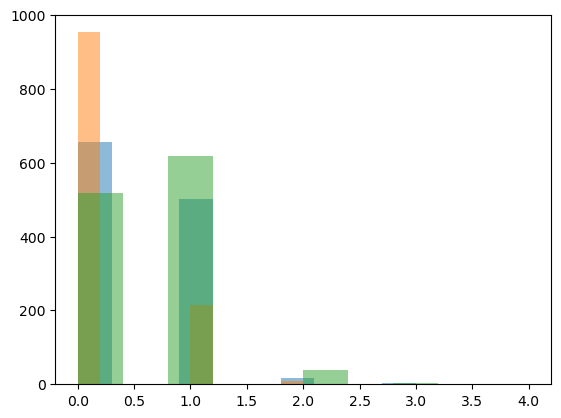

In [2440]:
#distribution of identifications
plt.hist(ncprotsHPP_summary_uniqpep["uniqpep_count_PXD002057.v0.11.4"],alpha=0.5);
plt.hist(ncprotsHPP_summary_uniqpep["uniqpep_count_PXD003594.v0.11.4"],alpha=0.5);
plt.hist(ncprotsHPP_summary_uniqpep["uniqpep_count_PXD014258.v0.11.4"],alpha=0.5);

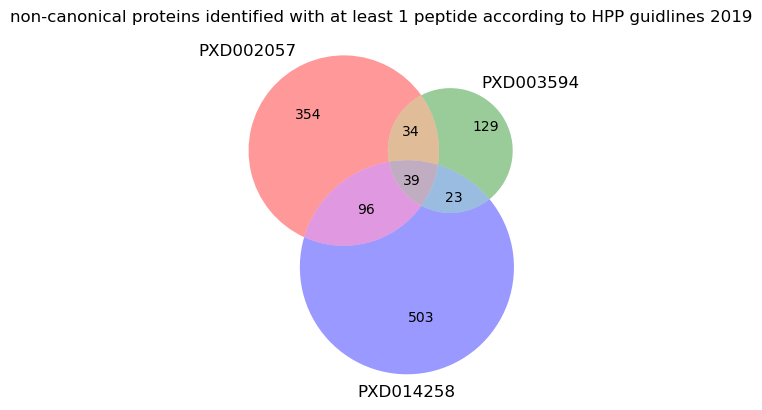

In [2441]:
a=set(ncprotsHPP_summary_uniqpep[ncprotsHPP_summary_uniqpep["uniqpep_count_PXD002057.v0.11.4"]>0].protein)
b=set(ncprotsHPP_summary_uniqpep[ncprotsHPP_summary_uniqpep["uniqpep_count_PXD003594.v0.11.4"]>0].protein)
c=set(ncprotsHPP_summary_uniqpep[ncprotsHPP_summary_uniqpep["uniqpep_count_PXD014258.v0.11.4"]>0].protein)
venn3([a,b, c],set_labels=["PXD002057","PXD003594","PXD014258"])
plt.title("non-canonical proteins identified with at least 1 peptide according to HPP guidlines 2019");

In [2442]:
ncprotsHPP_summary_uniqpep["uniqpep_count_PXD002057.v0.11.4"].max()

3

In [ ]:
#which we take for spectra analysis? 

In [2443]:
#intersection of all samples
a=set(ncprotsHPP_summary_uniqpep[ncprotsHPP_summary_uniqpep["uniqpep_count_PXD002057.v0.11.4"]>0].protein)
b=set(ncprotsHPP_summary_uniqpep[ncprotsHPP_summary_uniqpep["uniqpep_count_PXD003594.v0.11.4"]>0].protein)
c=set(ncprotsHPP_summary_uniqpep[ncprotsHPP_summary_uniqpep["uniqpep_count_PXD014258.v0.11.4"]>0].protein)
common_ncprots=set(a)&set(b)&set(c)

In [2444]:
#how many spectra to examen?
ncprotsHPP_summary_msms_inter_delnested.loc[ncprotsHPP_summary_msms_inter_delnested.protein.isin(common_ncprots),["msms_count_PXD002057.v0.11.4","msms_count_PXD003594.v0.11.4","msms_count_PXD014258.v0.11.4"]].sum(axis=0).sum()

1460.0

In [1127]:
#ncprotsHPP_summary_uniqpep[ncprotsHPP_summary_uniqpep.protein.isin(common_ncprots)]

In [ ]:
#### describe Noncanon proteins with MS score and Ensembl

In [2445]:
#see "Ensemble biotype..." tab for code reference
def get_noncanonHPP_gene_biotype_loc_msscore(df,ENS,OPens,OPdf):
    op_alt_biotype=[];op_alt_loc=[];op_alt_genename=[]
    OPnoncan_MSscore=[]    
    for protind,prot in enumerate(df["protein"].values.tolist()):
        print(protind,prot)
        try:
            OPnoncan_MSscore.append(OPdf.loc[OPdf["protein accession numbers"]==prot,"MS score"].values[0])
        except IndexError:
            if True in set(list(OPdf["protein accession (others)"].str.contains(prot).dropna())):
                OPnoncan_MSscore.append(OPdf.loc[OPdf["protein accession (others)"].str.contains(prot).dropna(),"MS score"].values[0])
            else:
                OPnoncan_MSscore.append(np.nan)
        #gene name, biotype, loc - here use OP with ensemble trx accessions
        try:
            trx=OPens.loc[OPens["protein accession numbers"]==prot,"transcript accession"].values[0]
            op_alt_biotype.append(ENS.loc[ENS["Transcript stable ID"]==trx[0:15],'Gene type'].values[0])
            op_alt_loc.append(OPens.loc[OPens["protein accession numbers"]==prot,"localization"].values[0])
            op_alt_genename.append(OPens.loc[OPens["protein accession numbers"]==prot,'gene symbol'].values[0])
        except:
            #print(prot)
            a=[]
            for i in OPens["protein accession (others)"]:
                if not isinstance(i,str):
                    a.append(False)
                else:
                    if prot in i:
                        a.append(True)
                    else:
                        a.append(False)
            if any(a):
                trx=OPens.loc[a,"transcript accession"].values[0]
                prots=OPens.loc[a,"protein accession (others)"].values[0]
                if trx[0:15] in ENS["Transcript stable ID"].values.tolist():
                    op_alt_biotype.append(ENS.loc[ENS["Transcript stable ID"]==trx[0:15],'Gene type'].values[0])
                    op_alt_loc.append(OPens.loc[OPens["protein accession (others)"]==prots,"localization"].values[0])
                    op_alt_genename.append(OPens.loc[OPens["protein accession (others)"]==prots,'gene symbol'].values[0])
                else:
                    for trx in OPens.loc[a,"transcript accession"].values:
                        if trx[0:15] in ENS["Transcript stable ID"].values.tolist():
                            op_alt_biotype.append(ENS.loc[ENS["Transcript stable ID"]==trx[0:15],'Gene type'].values[0])
                            op_alt_loc.append(OPens.loc[OPens["protein accession (others)"]==prots,"localization"].values[0])
                            op_alt_genename.append(OPens.loc[OPens["protein accession (others)"]==prots,'gene symbol'].values[0])
                            break
            else:
                op_alt_biotype.append(np.nan)
                op_alt_loc.append(np.nan)
                op_alt_genename.append(np.nan)
    return op_alt_genename,op_alt_biotype, op_alt_loc, OPnoncan_MSscore

In [2446]:
#here use OP 2.0 as possibly some proteins are not annotated in OP 1.6
#load tsv
OPtsv2="./ionbot_openprot/human-openprot-2_0-refprots+altprots+isoforms-uniprot2022_06_01.tsv"
OPtsv2_df=pd.read_csv(OPtsv2,sep="\t",header=None)
#this version has no column names. comparing to OP16 it does not have N19 (Orthology Across 10 Species # : Species Names)
OPtsv2_df.columns=list(OPtsv16_df.columns)[0:19]+list(OPtsv16_df.columns)[20:]
#leave just Ensembl accessions
OP2ens_df=OPtsv2_df[OPtsv2_df['transcript accession'].astype("str").apply(lambda x: "ENST" in x)]
#create a column with stable trx accession
OP2ens_df["trx_stab"]=OP2ens_df['transcript accession'].str[0:15]

/tmp/ipykernel_843797/798839250.py:4: DtypeWarning:

Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.



In [2447]:
#use Ensemble of OP 2 compatible - 106

In [2448]:
#use OP 16 for MS score and OP 2 for gene annotation
op_alt_genename_HPP,op_alt_biotype_HPP, op_alt_loc_HPP, OPnoncan_MSscore_HPP=get_noncanonHPP_gene_biotype_loc_msscore(ncprotsHPP_summary_uniqpep,ENS106,OP2ens_df,OPtsv16_df)

0 II_105505
1 II_164251
2 II_278328
3 II_3387987
4 II_3406570
5 II_3417621
6 II_3428044
7 II_3436236
8 II_3752754
9 II_3764492
10 II_3768735
11 II_3768748
12 II_3770850
13 II_3771306
14 II_3776861
15 II_3782671
16 II_3782678
17 II_3782838
18 II_3784955
19 II_3790919
20 II_3791227
21 II_3791831
22 II_3792715
23 II_3797019
24 II_3798112
25 II_3802806
26 II_4488111
27 II_4490362
28 II_4494432
29 II_4496768
30 II_4497341
31 II_4498982
32 II_560137
33 II_566378
34 II_567153
35 II_567908
36 II_570495
37 II_574003
38 II_575324
39 II_576524
40 II_576620
41 II_583924
42 II_585801
43 II_585805
44 II_586544
45 II_590136
46 II_590222
47 II_590372
48 II_595842
49 II_604645
50 II_604723
51 II_605320
52 II_609524
53 II_611217
54 II_624374
55 II_629105
56 II_630908
57 II_633634
58 II_642046
59 II_642095
60 II_644212
61 II_647919
62 II_655645
63 II_657946
64 II_658785
65 II_660408
66 II_661265
67 II_663130
68 II_664016
69 II_664519
70 II_664884
71 II_669591
72 II_677316
73 II_677973
74 II_678089
75 II_

In [2455]:
ncprotHPP_annotation=pd.DataFrame({"gene_name":op_alt_genename_HPP,"biotype":op_alt_biotype_HPP,"localization":op_alt_loc_HPP,"MS_score":OPnoncan_MSscore_HPP})

In [2458]:
#ncprotHPP_annotation.to_csv("ncprotHPP_annotation.csv",sep="\t")

In [2300]:
len(ncprotHPP_annotation)==len(ncprotsHPP_summary_uniqpep)

True

In [2301]:
set(ncprotHPP_annotation.biotype)

{'TEC',
 'lncRNA',
 'misc_RNA',
 'processed_pseudogene',
 'protein_coding',
 'transcribed_processed_pseudogene',
 'transcribed_unitary_pseudogene',
 'transcribed_unprocessed_pseudogene',
 'unprocessed_pseudogene'}

In [2302]:
#simplify biotype annotation
ncprotHPP_annotation.biotype.replace(to_replace="processed_pseudogene", value="pseudogene",inplace=True)
ncprotHPP_annotation.biotype.replace(to_replace="transcribed_processed_pseudogene", value="pseudogene",inplace=True)
ncprotHPP_annotation.biotype.replace(to_replace="transcribed_unitary_pseudogene", value="pseudogene",inplace=True)
ncprotHPP_annotation.biotype.replace(to_replace="transcribed_unprocessed_pseudogene", value="pseudogene",inplace=True)
ncprotHPP_annotation.biotype.replace(to_replace="unprocessed_pseudogene", value="pseudogene",inplace=True)
###a.biotype.replace(to_replace="TEC", value="protein_coding",inplace=True)

In [2303]:
set(ncprotHPP_annotation.biotype)

{'TEC', 'lncRNA', 'misc_RNA', 'protein_coding', 'pseudogene'}

In [2304]:
ncprotsHPP_summary_uniqpep_annot=pd.concat([ncprotsHPP_summary_uniqpep,ncprotHPP_annotation],axis=1,ignore_index=False)

In [2449]:
ncprotsHPP_summary_uniqpep_annot[ncprotsHPP_summary_uniqpep_annot["protein"]=="IP_560713"]

,Unnamed: 0,protein,uniqpep_count_PXD002057.v0.11.4,uniqpep_count_PXD003594.v0.11.4,uniqpep_count_PXD014258.v0.11.4,uniqpep_count_theoretical,ofthem_short_nested,gene_name,biotype,localization,MS_score,unique_pep_count_datasets
375,375,IP_560713,3,1,3,17,8,GAPDHP1,pseudogene,-,100.0,3.0


In [2450]:
#gene_name
ncprotsHPP_summary_uniqpep_annot[ncprotsHPP_summary_uniqpep_annot["gene_name"]=="GAPDHP1"]

,Unnamed: 0,protein,uniqpep_count_PXD002057.v0.11.4,uniqpep_count_PXD003594.v0.11.4,uniqpep_count_PXD014258.v0.11.4,uniqpep_count_theoretical,ofthem_short_nested,gene_name,biotype,localization,MS_score,unique_pep_count_datasets
375,375,IP_560713,3,1,3,17,8,GAPDHP1,pseudogene,-,100.0,3.0
376,376,IP_560714,0,1,0,8,4,GAPDHP1,pseudogene,-,0.0,1.0


In [2451]:
#ncprotsHPP_summary_uniqpep_annot.to_csv(f"summary_peptide_NCuniquepepHPP_2.txt",sep="\t")  

In [2452]:
#add column how many unique peps across 3 samples were identified
ncprotsHPP_summary_uniqpep_annot["unique_pep_count_datasets"]=np.nan
for prot, group in ncprotsHPP_summary_msms_inter_delnested.groupby("protein"):
    pep_n=len(group)
    ncprotsHPP_summary_uniqpep_annot.loc[ncprotsHPP_summary_uniqpep_annot.protein==prot,"unique_pep_count_datasets"]=pep_n
#ncprotsHPP_summary_uniqpep_annot.to_csv(f"summary_peptide_NCuniquepepHPP_2.txt",sep="\t")  

In [ ]:
ncprotsHPP_summary_uniqpep_annot=pd.read_csv(f"summary_peptide_NCuniquepepHPP_2.txt",sep="\t")  

In [2453]:
len(ncprotsHPP_summary_uniqpep_annot)

1178

In [2309]:
#some stats: prots in >=2 datasets
ncprotsHPP_2datas=ncprotsHPP_summary_uniqpep_annot.loc[ncprotsHPP_summary_uniqpep_annot.iloc[:,[1,2,3]].replace(0,np.nan).dropna(thresh=2).index,]

In [2310]:
len(ncprotsHPP_2datas)

192

In [2311]:
#how many prots identified with max N pep=theoretical N pep
Counter(list(ncprotsHPP_2datas.iloc[:,[1,2,3]].max(axis=1)==ncprotsHPP_2datas.iloc[:,4]))
#21 prot was identified with all theoreticaly posible peptides in atleast 1 dataset and occurs in 2+ datasets

Counter({False: 187, True: 5})

In [2312]:
#how many prot was identified with >=0.5 theoretical peptides in 1 dataset
Counter(list(ncprotsHPP_2datas.iloc[:,[1,2,3]].max(axis=1)/ncprotsHPP_2datas.iloc[:,4]>=0.5))

Counter({False: 180, True: 12})

In [2313]:
#how many prots were iden with max 1 pep
Counter(list(ncprotsHPP_2datas.iloc[:,[1,2,3]].max(axis=1)==1))

Counter({True: 147, False: 45})

In [2314]:
#how many prots theoreticaly identified with 1 pep
Counter(list(ncprotsHPP_2datas.iloc[:,4]==1))

Counter({False: 188, True: 4})

In [2319]:
#how many prots had weak identifications by OP
Counter(list(ncprotsHPP_2datas.iloc[:,9]<=2))

Counter({False: 145, True: 47})

In [2320]:
#how many prots were not identified before with OP
Counter(list(ncprotsHPP_2datas.iloc[:,9]==0))

Counter({False: 170, True: 22})

#### A. Comparison with existing evidence (MS score from OP). 

In [2536]:
#get MS score of all nc prots identified with at least 1 unique pipeline

#flat_openprot_noncprots_genename_HPP,flat_openprot_noncprots_biotype_HPP, flat_openprot_noncprots_loc_HPP, flat_openprot_noncprots_MSscore_HPP=get_noncanonHPP_gene_biotype_loc_msscore(
#    pd.DataFrame({"protein":flat_openprot_noncprots}),
#    ENS106,OP2ens_df,OPtsv16_df)
flat_openprot_noncprots_annotation=pd.DataFrame({"protein":flat_openprot_noncprots,
                                                "gene_name":flat_openprot_noncprots_genename_HPP,
                                                 "biotype":flat_openprot_noncprots_biotype_HPP,
                                                 "localization":flat_openprot_noncprots_loc_HPP,
                                                 "MS_score":flat_openprot_noncprots_MSscore_HPP})

flat_openprot_noncprots_annotation.biotype.replace(to_replace="processed_pseudogene", value="pseudogene",inplace=True)
flat_openprot_noncprots_annotation.biotype.replace(to_replace="transcribed_processed_pseudogene", value="pseudogene",inplace=True)
flat_openprot_noncprots_annotation.biotype.replace(to_replace="transcribed_unitary_pseudogene", value="pseudogene",inplace=True)
flat_openprot_noncprots_annotation.biotype.replace(to_replace="transcribed_unprocessed_pseudogene", value="pseudogene",inplace=True)
flat_openprot_noncprots_annotation.biotype.replace(to_replace="unprocessed_pseudogene", value="pseudogene",inplace=True)

In [2546]:
len(flat_openprot_noncprots)

1502

In [2538]:
#flat_openprot_noncprots_annotation.to_pickle("flat_openprot_noncprots_annotation.pkl")

In [2547]:
nc_all_msscore=pd.DataFrame(columns=["score","prot_n"])
flat_openprot_noncprots_annotation.MS_score=flat_openprot_noncprots_annotation.MS_score.replace(np.nan,0)
for score,group in flat_openprot_noncprots_annotation.groupby("MS_score"):
    nc_all_msscore.loc[len(nc_all_msscore)]=[score,len(group)]
nc_all_msscore_sum=nc_all_msscore.head(3)
nc_all_msscore_sum.loc[len(nc_all_msscore_sum)]=["3-10",nc_all_msscore.iloc[3:11,1].sum()]
nc_all_msscore_sum.loc[len(nc_all_msscore_sum)]=["11-100",nc_all_msscore.iloc[11:46,1].sum()]
nc_all_msscore_sum.loc[len(nc_all_msscore_sum)]=[">100",nc_all_msscore.iloc[46:len(nc_all_msscore),1].sum()]

In [2548]:
nc_all_msscore_sum.prot_n.sum()

1502.0

In [2380]:
#we dont have to have >=2 peps if we dont claim a novel identification?
# I think we do....
nc_msscore=pd.DataFrame(columns=["score","prot_n"])
ncprotsHPP_summary_uniqpep_annot.MS_score=ncprotsHPP_summary_uniqpep_annot.MS_score.replace(np.nan,0)
for score,group in ncprotsHPP_summary_uniqpep_annot[ncprotsHPP_summary_uniqpep_annot.unique_pep_count_datasets>=2].groupby("MS_score"):
    if score==0:
        p0=set(group.protein)
    nc_msscore.loc[len(nc_msscore)]=[score,len(group)]

In [2381]:
len(ncprotsHPP_summary_uniqpep_annot[(ncprotsHPP_summary_uniqpep_annot.protein.isin(p0))&
                                (ncprotsHPP_summary_uniqpep_annot.unique_pep_count_datasets>=2)])

7

In [2389]:
ncprotsHPP_summary_uniqpep_annot[
                                (ncprotsHPP_summary_uniqpep_annot.unique_pep_count_datasets>=2)].unique_pep_count_datasets.sum()

261.0

In [2382]:
a=set(ncprotsHPP_summary_uniqpep[ncprotsHPP_summary_uniqpep["uniqpep_count_PXD002057.v0.11.4"]>0].protein)
b=set(ncprotsHPP_summary_uniqpep[ncprotsHPP_summary_uniqpep["uniqpep_count_PXD003594.v0.11.4"]>0].protein)
c=set(ncprotsHPP_summary_uniqpep[ncprotsHPP_summary_uniqpep["uniqpep_count_PXD014258.v0.11.4"]>0].protein)
#at least in two datasets
len((a&b&p0)|(a&c&p0)|(b&c&p0))

7

In [2383]:
nc_msscore_sum=nc_msscore.head(3)
nc_msscore_sum.loc[len(nc_msscore_sum)]=["3-10",nc_msscore.iloc[3:11,1].sum()]
nc_msscore_sum.loc[len(nc_msscore_sum)]=["11-100",nc_msscore.iloc[11:46,1].sum()]
nc_msscore_sum.loc[len(nc_msscore_sum)]=[">100",nc_msscore.iloc[46:len(nc_msscore),1].sum()]

In [2386]:
nc_msscore_sum.prot_n.sum()

114.0

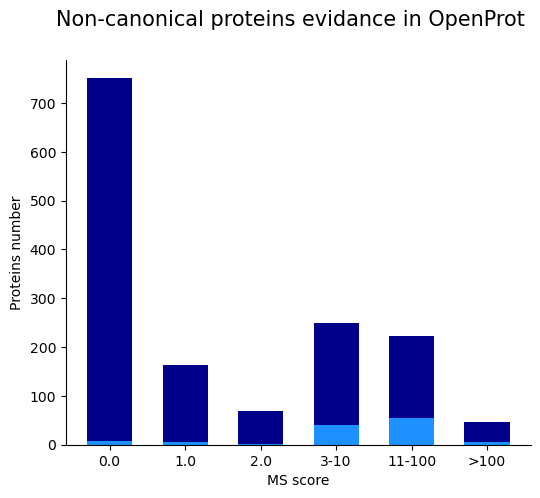

In [2549]:
fig,ax=plt.subplots(1,figsize=(6,5))
fig.suptitle('Non-canonical proteins evidance in OpenProt', fontsize=15)
ax.bar(range(len(nc_all_msscore_sum)),nc_all_msscore_sum.prot_n, color ='darkblue', width = 0.6, label="ionbot identifications")
ax.bar(range(len(nc_msscore_sum)),nc_msscore_sum.prot_n, color ='dodgerblue', width = 0.6, label="proteins, eligible to be claimed novel")
ax.set_xticks(range(len(nc_msscore_sum)),nc_msscore_sum.score)
ax.set_xlabel("MS score")
ax.set_ylabel("Proteins number")
#for rect,v in zip(bar3,altmsscore_bar[:3]):
#    height = rect.get_height()
#    ax.text(rect.get_x() + rect.get_width() / 2.0, height, f'{v:.0f}', ha='center', va='bottom')
for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
plt.savefig("F5A_altmsscore_bar.svg",format="svg")

In [ ]:
#variants

In [ ]:
#in rerun stoped here 15-12-24

### Modifications of PSMs unique to canonical vs non-canonical

In [148]:
modifications_OPtarget_Typesfrq={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_first_datasets:
    mods_types={"canon":0,"non-canon":0}
    a=combined_first_datasets[dataset_name]["openprot"]
    df_canon=a.loc[(a["database"]=="T")&(a["only altprots"]==False)&(a["only novelisoprots"]==False)&(a["only refisoprots"]==False)]
    df_Noncanon=combined_first_datasets[dataset_name]["openprot"].loc[(a["database"]=="T")&((df["only altprots"]==True) | (df["only novelisoprots"]==True))&(a["only refisoprots"]==False)]
    mods_types["canon"]=get_exp_vs_unexp_frq_Tdb(df_canon)
    mods_types["non-canon"]=get_exp_vs_unexp_frq_Tdb(df_Noncanon)
    modifications_OPtarget_Typesfrq[dataset_name]=mods_types

In [149]:
exp_op_df=pd.DataFrame()
for dataset_name in modifications_OPtarget_Typesfrq:
    db1_expmods_frqs=modifications_OPtarget_Typesfrq[dataset_name]["canon"][0]
    db2_expmods_frqs=modifications_OPtarget_Typesfrq[dataset_name]["non-canon"][0]
    for dict,col in zip([db1_expmods_frqs,db2_expmods_frqs],[f"{dataset_name} canonical",f"{dataset_name} non-canonical"]):
        exp_op_df=pd.concat([exp_df,pd.DataFrame({col:list(dict.values())},index=list(dict.keys()))],axis=1)
unexp_op_df=pd.DataFrame()
for dataset_name in modifications_OPtarget_Typesfrq:
    db1_UNexpmods_frqs=modifications_OPtarget_Typesfrq[dataset_name]["canon"][1]
    db2_UNexpmods_frqs=modifications_OPtarget_Typesfrq[dataset_name]["non-canon"][1]
    for dict,col in zip([db1_UNexpmods_frqs,db2_UNexpmods_frqs],[f"{dataset_name} canonical",f"{dataset_name} non-canonical"]):
        unexp_op_df=pd.concat([unexp_df,pd.DataFrame({col:list(dict.values())},index=list(dict.keys()))],axis=1)

In [150]:
exp_op_df

,PXD002057.v0.11.4 UniProt,PXD003594.v0.11.4 UniProt,PXD014258.v0.11.4 UniProt,PXD002057.v0.11.4 OpenProt,PXD003594.v0.11.4 OpenProt,PXD014258.v0.11.4 OpenProt,PXD014258.v0.11.4 non-canonical
[4]Carbamidomethyl[C],54.98,27.82,58.29,58.75,26.58,57.68,31.19
[1]Acetyl[N-term],24.00,38.68,14.27,21.00,38.11,13.57,17.32
[35]Oxidation[M],21.02,33.51,27.44,20.25,35.31,28.75,NaN
[35]Hydroxylation[M],NaN,NaN,NaN,NaN,NaN,NaN,51.49


In [151]:
#because [35]Oxidation[M]==[35]Hydroxylation[M]
exp_op_df.loc["[35]Oxidation[M]","PXD014258.v0.11.4 non-canonical"]=exp_op_df.loc["[35]Hydroxylation[M]","PXD014258.v0.11.4 non-canonical"]
exp_op_df=exp_op_df.drop("[35]Hydroxylation[M]",axis=0)

In [152]:
#reorder
exp_op_df=exp_op_df[[f"{dataset_name} UniProt" for dataset_name in modifications_OPtarget_Typesfrq]+[f"{dataset_name} OpenProt" for dataset_name in modifications_OPtarget_Typesfrq]]
unexp_op_df=unexp_op_df[[f"{dataset_name} UniProt" for dataset_name in modifications_OPtarget_Typesfrq]+[f"{dataset_name} OpenProt" for dataset_name in modifications_OPtarget_Typesfrq]]

In [154]:
unexp_op_df #what about several last empty values? #!!!

,PXD002057.v0.11.4 UniProt,PXD003594.v0.11.4 UniProt,PXD014258.v0.11.4 UniProt,PXD002057.v0.11.4 OpenProt,PXD003594.v0.11.4 OpenProt,PXD014258.v0.11.4 OpenProt
[4]Carbamidomethyl[N-term],17.91,NaN,NaN,5.81,NaN,NaN
[4]Carbamidomethyl[E],13.17,NaN,NaN,NaN,NaN,NaN
[4]Carbamidomethyl[D],9.75,NaN,NaN,NaN,NaN,NaN
[7]Deamidated[N],4.30,3.86,7.74,9.40,3.76,7.35
[7]Deamidated[Q],3.69,6.56,12.90,8.55,6.26,11.61
[1]Acetyl[S],3.69,NaN,3.85,5.47,NaN,4.21
[6]Carboxymethyl[C],3.16,NaN,6.88,7.01,NaN,6.75
[4]Carbamidomethyl[Y],2.55,NaN,NaN,NaN,NaN,NaN
[7]Deamidated[F],2.46,5.21,NaN,7.35,4.80,NaN
[1312]Delta:H,2.37,NaN,NaN,5.30,NaN,NaN


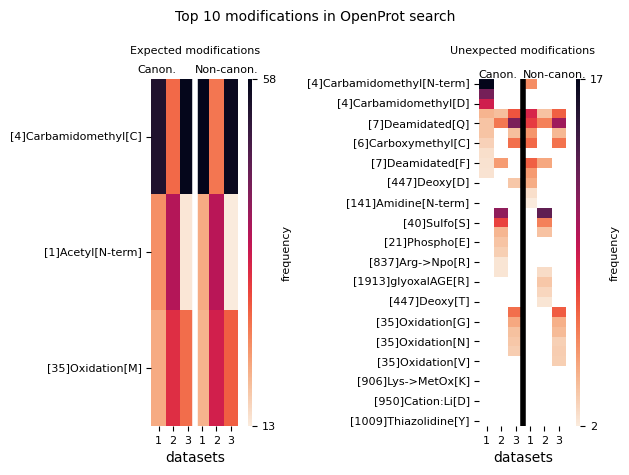

In [153]:
fig, axes = plt.subplots(1,2);
fig.suptitle('Top 10 modifications in OpenProt search', fontsize=10)
flat_exp=np.array([df.to_numpy().flatten() for df in [exp_op_df]]).flatten()
vmax_exp=np.max(flat_exp); vmin_exp=np.min(flat_exp)
flat_UNexp=np.array([df.to_numpy().flatten() for df in [unexp_op_df]]).flatten()
flat_UNexp = flat_UNexp[~np.isnan(flat_UNexp)]
vmax_UNexp=np.max(flat_UNexp); vmin_UNexp=np.min(flat_UNexp)
sns.heatmap(exp_op_df, ax=axes[0], vmin=vmin_exp, vmax=vmax_exp,cmap=sns.cm.rocket_r,cbar_kws={'label': 'frequency'}, cbar=False);
#axes[0].set_xticklabels(textwrap.fill(x.get_text(), max_width) for x in axes[0].get_xticklabels());
axes[0].set_xticklabels(["1","2","3","1","2","3"],rotation=0);
axes[0].set_xlabel("datasets");
axes[0].set_title('Expected modifications',fontsize=8,y=1.05)
axes[0].axvline(x=3, linewidth=4, color="white")
axes[0].text(-1, -0.05, 'Canon.', fontsize = 8)
axes[0].text(3, -0.05, 'Non-canon.', fontsize = 8)
divider = make_axes_locatable(axes[0]) 
cax = divider.append_axes("right", size="5%", pad=0.1) 
cbar = plt.colorbar(axes[0].collections[0], cax=cax)
cbar.outline.set_visible(False)
cbar.set_ticks([vmin_exp, vmax_exp])
cbar.ax.set_yticklabels([int(vmin_exp), int(vmax_exp)],size=8)
cbar.ax.set_ylabel('frequency',size=8)

sns.heatmap(unexp_op_df, ax=axes[1], vmin=vmin_UNexp, vmax=vmax_UNexp,cmap = sns.cm.rocket_r,cbar_kws={'label': 'frequency'}, cbar=False); #sns.cm.crest_r
#axes[1].set_xticklabels(textwrap.fill(x.get_text(), max_width) for x in axes[1].get_xticklabels());
axes[1].set_xticklabels(["1","2","3","1","2","3"],rotation=0);
axes[1].set_xlabel("datasets");
axes[1].set_title('Unexpected modifications',fontsize=8,y=1.05)
axes[1].axvline(x=3, linewidth=4, color="black")
axes[1].text(-0.1, -0.1, 'Canon.', fontsize = 8)
axes[1].text(3, -0.1, 'Non-canon.', fontsize = 8)
divider = make_axes_locatable(axes[1]) 
cax = divider.append_axes("right", size="5%", pad=0.1) 
cbar = plt.colorbar(axes[1].collections[0], cax=cax)
cbar.outline.set_visible(False)
cbar.set_ticks([vmin_UNexp, vmax_UNexp])
cbar.ax.set_yticklabels([int(vmin_UNexp), int(vmax_UNexp)],size=8)
cbar.ax.set_ylabel('frequency',size=8)


axes[0].tick_params(axis="both", labelsize=8)
axes[1].tick_params(axis="both", labelsize=8)
fig.tight_layout();
#plt.savefig("opmods_heatmap.svg")

In [ ]:
#analyse common and uncomon mods in OP canon and alt

In [155]:
#https://pmc.ncbi.nlm.nih.gov/articles/PMC10591476/
common_modifications=["[1]Acetyl[S]","[1]Acetyl[K]",
                     "[2020]Xlink:Disulfide[C]",
                     "[41]Hex[K]","[41]Hex[R]",
                     "[2022]Ser/Thr-KDO[S]","[2022]Ser/Thr-KDO[T]",
                     "[55]Glutathione[C]",
                     "[35]Oxidation[D]","[35]Oxidation[K]","[35]Oxidation[N]","[35]Oxidation[P]","[35]Oxidation[F]",
                      "[35]Oxidation[Y]","[35]Oxidation[R]","[35]Oxidation[M]","[35]Oxidation[C]","[35]Oxidation[H]",
                      "[35]Oxidation[W]","[35]Oxidation[G]","[35]Oxidation[U]","[35]Oxidation[E]","[35]Oxidation[I]",
                      "[35]Oxidation[L]","[35]Oxidation[Q]","[35]Oxidation[S]","[35]Oxidation[T]","[35]Oxidation[V]",
                     "[34]Methyl[K]",
                     "[275]Nitrosyl[C]",
                     "[747]Malonyl[K]",
                     "[121]GG[K]",
                     "[21]Phospho[Y]","[21]Phospho[S]","[21]Phospho[T]","[21]Phospho[H]","[21]Phospho[D]",
                     "[1292]GGQ[K]"]
expected_ionbot_mods=["[35]Oxidation[M]","[4]Carbamidomethyl[C]","[1]Acetyl[N-term]	"]

In [156]:
#get fraction of common and uncommon mods among unexpected modifications PSMs in canon and non-canon PSMs
modifications_OPCommon_frq={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_first_datasets:
    mods_types={"canon":0,"non-canon":0}
    df=combined_first_datasets[dataset_name]["openprot"]
    #1 peptidoform per psm
    op_alt_unexpmods=[mods.split("||") if not "_or_" in mods else mods.split("_or_")[0].split("||") for mods in df.loc[((df["only altprots"]==True) | (df["only novelisoprots"]==True)) & (df["database"]=="T"),"modifications"].values.tolist()]
    op_alt_unexpmods=[i.split("|")[1].split("(")[0] if "(" in i else i.split("|")[1] for l in op_alt_unexpmods for i in l if i!="Unmodified"]
    op_alt_unexpmods=[i for i in op_alt_unexpmods if i not in expected_ionbot_mods]
    #count common
    op_alt_unexpcommon=[m for m in op_alt_unexpmods if m in common_modifications]
    #canon
    op_canon_unexpmods=[mods.split("||") if not "_or_" in mods else mods.split("_or_")[0].split("||") for mods in df.loc[((df["only altprots"]==True) | (df["only novelisoprots"]==True)) & (df['only refisoprots']==False) & (df["database"]=="T"),"modifications"].values.tolist()]
    op_canon_unexpmods=[i.split("|")[1].split("(")[0] if "(" in i else i.split("|")[1] for l in op_canon_unexpmods for i in l if i!="Unmodified" and i not in expected_ionbot_mods]
    op_canon_unexpmods=[i for i in op_canon_unexpmods if i not in expected_ionbot_mods]
    op_canon_unexpcommon=[m for m in op_canon_unexpmods if m in common_modifications]
    
    mods_types["non-canon"]=len(op_alt_unexpcommon)/len(op_alt_unexpmods)
    mods_types["canon"]=len(op_canon_unexpcommon)/len(op_canon_unexpmods)
    modifications_OPCommon_frq[dataset_name]=mods_types

In [157]:
#weirdly small number. Another way to calculate?
modifications_OPCommon_frq #for presentation, highlight the common modifications on a heatmap

{'PXD002057.v0.11.4': {'canon': 0.009636443276390714,
  'non-canon': 0.009636443276390714},
 'PXD003594.v0.11.4': {'canon': 0.011041009463722398,
  'non-canon': 0.011041009463722398},
 'PXD014258.v0.11.4': {'canon': 0.02006898714330511,
  'non-canon': 0.02006898714330511}}

### How many proteins with ­>=1 modified peptide (>1 PSM)

In [158]:
#change: I should look at proteins with some threshold on minimum number of PSM per peptide
#skip proteins with 1 psm (should I filter out protein groups? - in this case n will be very low in op...)
def get_prot_modified_frqs(df):
    db_modprots=0; db_UNmodprots=0
    for name, group in df.loc[df["database"]=="T"].groupby("leadprot"):
        if len(group)==1: continue
        group.drop_duplicates("matched_peptide",inplace=True)
        if not all( m=="Unmodified" for m in group["modifications"].values.tolist()): #not only unmodified
            db_modprots+=1
        else:
            db_UNmodprots+=1
    return round((db_modprots/(db_modprots+db_UNmodprots)),4)

In [159]:
prot_modified_frq={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_first_datasets:
    mods_types={"canon canon":[],"openprot canon":[],"openprot non-canon":[]}
    mgfspectraN=mgfspectraN_datasets[dataset_name]
    for mgffile in mgfspectraN:
        mgffile=mgffile.replace('.RAW.mgf', '.mgf')
        df_up=combined_first_datasets[dataset_name]["canon"]
        df_up=df_up[df_up["spectrum_file"]==mgffile]
        df_op=combined_first_datasets[dataset_name]["openprot"]
        df_op=df_op[df_op["spectrum_file"]==mgffile]
        mods_types["canon canon"]=mods_types["canon canon"]+[get_prot_modified_frqs(df_up)]
        mods_types["openprot canon"]=mods_types["openprot canon"]+[get_prot_modified_frqs(df_op.loc[(df_op['only altprots']==False) & (df_op['only novelisoprots']==False) & (df_op['only refisoprots']==False),])]
        mods_types["openprot non-canon"]=mods_types["openprot non-canon"]+[get_prot_modified_frqs(df_op.loc[(df_op["only altprots"]==True) | (df_op["only novelisoprots"]==True)])]
    prot_modified_frq[dataset_name]=mods_types

In [160]:
proteins_palette={"Canonical":"orangered","Non-canonical":"cornflowerblue","Reference isoforms":"yellowgreen","Novel isoforms":"gold"}

In [161]:
protmod_med_avarage

NameError: name 'protmod_med_avarage' is not defined

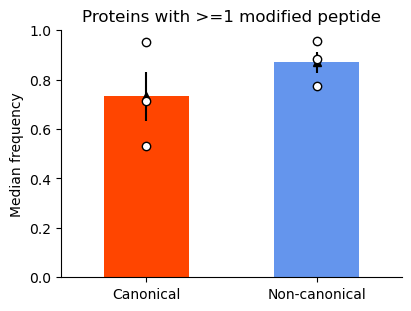

In [162]:
protmod_med_error={'openprot canon':0,'openprot non-canon':0}
protmod_med_avarage={'openprot canon':0,'openprot non-canon':0}
protmod_med_swarmplot={'openprot canon':0,'openprot non-canon':0}
for subset in ['openprot canon','openprot non-canon']:
    medians=[]
    for dataset_name in ['PXD003594.v0.11.4','PXD002057.v0.11.4','PXD014258.v0.11.4']:
        a=round(np.median(prot_modified_frq[dataset_name][subset]),3)
        medians.append(a)
    protmod_med_error[subset]=stats.sem(medians, axis=None, ddof=0)
    protmod_med_avarage[subset]=np.mean(medians)
    protmod_med_swarmplot[subset]=medians

dbs = ("Canonical", "Non-canonical")
x=np.array(range(len(dbs)))
y=protmod_med_avarage.values()
yerr=list(protmod_med_error.values())
yswarmplot=np.array(list(protmod_med_swarmplot.values())).flatten()
barcolor=[proteins_palette["Canonical"],proteins_palette["Non-canonical"]]
fig, ax = plt.subplots(layout='constrained', figsize=(4, 3))
width=0.5
ax.bar(x, y, width=width, color=barcolor)
ax.errorbar(x, y, yerr=yerr, fmt="^",color="black")
sns.swarmplot(ax=ax,x=[0]*3+[1]*3, y=yswarmplot,color="white",size=6, edgecolor='black',linewidth=1)
ax.set_ylabel('Median frequency')
ax.set_title('Proteins with >=1 modified peptide')
ax.set_xticks(x, dbs)
for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
#plt.savefig("protmode_errorbar.svg")

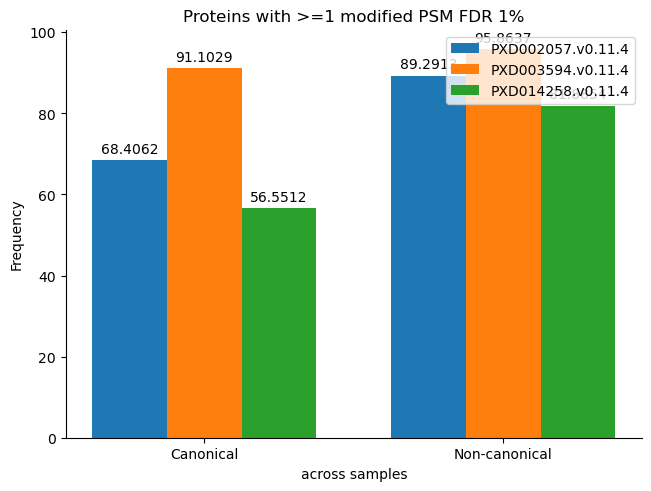

In [465]:
#by dataset - not UPD
dbs = ("Canonical", "Non-canonical")
protmod_plot={dataset_name:(prot_modified_frq[dataset_name]["openprot canon"],prot_modified_frq[dataset_name]["openprot non-canon"]) for dataset_name in prot_modified_frq}
#for dataset_name in ['PXD003594.v0.11.4','PXD002057.v0.11.4','PXD014258.v0.11.4']:
#    aa=[]
#    for database in combined_first_datasets[dataset_name]:
#        a=round(np.median(list(idrate_datasets[dataset_name][database].values())),3)
#        aa.append(a)
#    idrate_med[dataset_name]=tuple(aa)

x = np.arange(len(dbs))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout='constrained')
for dataset_name, frqs in protmod_plot.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, frqs, width, label=dataset_name)
    ax.bar_label(rects, padding=3)
    multiplier += 1

ax.set_ylabel('Frequency')
ax.set_title('Proteins with >=1 modified PSM FDR 1%')
ax.set_xlabel("across samples")
ax.set_xticks(x + width, dbs)
ax.legend(loc='upper right', ncols=1)

for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
plt.show()

## b.	What is lost? Study the type of PSMs that switch between canonical and noncanonical (#PSMs versus score, are these the strongest or weakest hits? Are these modified or unmodified?)

In [163]:
#merge OpenProt and UniProt searches
combo_upop_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_first_datasets:
    df_up=combined_first_datasets[dataset_name]["canon"]
    df_op=combined_first_datasets[dataset_name]["openprot"]
    combo=df_up.merge(df_op, on=['spectrum_title','spectrum_file','scan'],suffixes=['_canon','_open'],how="outer")
    combo["Same_peptide_canon_open"] = combo.matched_peptide_canon==combo.matched_peptide_open
    combo["Same_mod_peptide_canon_open"] = combo.modified_peptide_canon==combo.modified_peptide_open
    combo["Same_mods_noRT_canon_open"] = (combo.matched_peptide_canon+combo.modifications_noRT_canon)==(combo.matched_peptide_open+combo.modifications_noRT_open)
    combo_upop_first_datasets[dataset_name]=combo

In [ ]:
#HERE ADD ((df["only altprots"]==True) | (df["only novelisoprots"]==True)) TO NONCANON if needed to show II_ and IP_ togather

In [168]:
#annotate peps of just trembl prot
def is_onlytremblacc(row,trmbl_refisoforms=trmbl_refisoforms):
    '''to be classified as trembl prot, all prots in group should be trembl'''
    istr=[i.split("((")[-1].rstrip("))") in list(trmbl_refisoforms) for i in row["proteins"].split("||")]
    if all(istr):
        return True
    else:
        return False
for dataset_name in combined_first_datasets:
    df_tr=combined_first_datasets[dataset_name]["trembl"]
    df_tr["only trembl"]=df_tr.apply(is_onlytremblacc, axis=1)
    combined_first_datasets[dataset_name]["trembl"]

In [174]:
#with open('combined_first_datasets_col_onlytrembl.pickle', 'wb') as handle:
#    pickle.dump(combined_first_datasets, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [169]:
#merge UniProt and Tremble searches
combo_uptr_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_first_datasets:
    df_up=combined_first_datasets[dataset_name]["canon"]
    df_tr=combined_first_datasets[dataset_name]["trembl"]
    combo=df_up.merge(df_tr, on=['spectrum_title','spectrum_file','scan'],suffixes=['_canon','_trembl'],how="outer")
    combo["Same_peptide_canon_trembl"] = combo.matched_peptide_canon==combo.matched_peptide_trembl
    combo["Same_mod_peptide_canon_trembl"] = combo.modified_peptide_canon==combo.modified_peptide_trembl
    combo["Same_mods_noRT_canon_trembl"] = (combo.matched_peptide_canon+combo.modifications_noRT_canon)==(combo.matched_peptide_trembl+combo.modifications_noRT_trembl)
    combo_uptr_first_datasets[dataset_name]=combo

In [171]:
combo_optr_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_first_datasets:
    df_op=combined_first_datasets[dataset_name]["openprot"]
    df_tr=combined_first_datasets[dataset_name]["trembl"]
    combo=df_op.merge(df_tr, on=['spectrum_title','spectrum_file','scan'],suffixes=['_open','_trembl'],how="outer")
    combo["Same_peptide_open_trembl"] = combo.matched_peptide_open==combo.matched_peptide_trembl
    combo["Same_mod_peptide_open_trembl"] = combo.modified_peptide_open==combo.modified_peptide_trembl
    combo["Same_mods_noRT_open_trembl"] = (combo.matched_peptide_open+combo.modifications_noRT_open)==(combo.matched_peptide_trembl+combo.modifications_noRT_trembl)
    combo_optr_first_datasets[dataset_name]=combo

In [ ]:
#!!!!

In [189]:
def get_senkey_data_UPTRdiff(df,same_diff,both_unident_n=0):
    '''
    df in UP and TR combo
    UP=SW (uniprot-swiss-prot)
    TR target number starts from last+1 targer number for OP in get_senkey_data_UPOPdiff()
    '''
    #source: 0 UP canon, 1 UP decoy, 2 UP unident
    source=[0,0,0,0,1,2,1,2,1,2,1,2]
    #target: 9 TR SP canon , 10 TR TR canon, 11 TR decoy, 12 TR unident
    target=[9,10,11,12,9,9,10,10,11,11,12,12]
    params=[("T","T",False,same_diff),
           ("T","T",True,same_diff),
           ("T","D",np.nan,same_diff),
           ("D","T",False,same_diff),
           (np.nan,"T",False,same_diff),
           ("D","T",True,same_diff),
           (np.nan,"T",True,same_diff),
           ("D","D",np.nan,same_diff),
           (np.nan,"D",np.nan,same_diff),
           ("D",np.nan,np.nan,same_diff),
           np.nan]
    subdfs=[df.loc[(df["database_canon"]==params[0][0]) & (df["database_trembl"]==params[0][1]) & (df["only trembl"]==params[0][2])],
            df.loc[(df["database_canon"]==params[1][0]) & (df["database_trembl"]==params[1][1]) & (df["only trembl"]==params[1][2])],
            df.loc[(df["database_canon"]==params[2][0]) & (df["database_trembl"]==params[2][1]) & (df["only trembl"]==params[2][2])],
            df.loc[(df["database_canon"]==params[3][0]) & (df["database_trembl"]==params[3][1]) & (df["only trembl"]==params[3][2])],
            df.loc[(df["database_canon"]==params[4][0]) & (df["database_trembl"]==params[4][1]) & (df["only trembl"]==params[4][2])],
            df.loc[(df["database_canon"]==params[5][0]) & (df["database_trembl"]==params[5][1]) & (df["only trembl"]==params[5][2])],
            df.loc[(df["database_canon"]==params[6][0]) & (df["database_trembl"]==params[6][1]) & (df["only trembl"]==params[6][2])],
            df.loc[(df["database_canon"]==params[7][0]) & (df["database_trembl"]==params[7][1]) & (df["only trembl"]==params[7][2])],
            df.loc[(df["database_canon"]==params[8][0]) & (df["database_trembl"]==params[8][1]) & (df["only trembl"]==params[8][2])],
        df.loc[(df["database_canon"]==params[9][0]) & (df["database_trembl"]==params[9][1]) & (df["only trembl"]==params[9][2])],
            both_unident_n]
    values=[]
    if same_diff=="both":
        for p,subdf in zip(params[:-1],subdfs[:-1]):
            values.append(len(subdf))
        values.append(both_unident_n)
        source1=source; target1=target
    else:
        for i,(p,subdf) in enumerate(zip(params[:-1],subdfs[:-1])):
            if np.isnan(p[3]): #here if smae or diff peptide - does not metter and it is missliding to add them to graph
                ##values.append(len(subdf))
                continue
            else:
                #print(i,p,len(subdf.loc[subdf["Same_peptide_canon_open"]==p[4],]))
                values.append(len(subdf.loc[subdf["Same_peptide_open_trembl"]==p[3],]))
        source1=[s for i,(s,p) in enumerate(zip(source,params)) if i<len(params)-1 and not np.isnan(p[3])]; 
        target1=[s for i,(s,p) in enumerate(zip(target,params)) if i<len(params)-1 and not np.isnan(p[3])]; 
        link_label1=[s for i,(s,p) in enumerate(zip(link_label,params)) if i<len(params)-1 and not np.isnan(p[3])]; 
    return source1, target1, values

In [234]:
def get_senkey_data_UPOPdiff(df,same_diff,both_unident_n=0):
    '''df is UP and OP combo
    both_unident_n - overlap in not ident spectra, put 0 if dont want to display
    same_diff - True for same peptide, False for different peptides, "both" for all
    '''
    source=[0,0,0,0,0,0,1,2,1,2,1,2,1,2,1,2,1,2]
    target=[3,8,4,5,6,7,3,3,8,8,4,4,5,5,6,6,7,7]
    #parameters follow source-target pairs
    params=[("T","T",False,False,False,same_diff,), #UP canon - OP canon
            ("T","T",False,False,True,same_diff), #UP canon - OP ref iso
                ("T","T",False,True,False,same_diff), #UP canon - OP only novelisoprots
                ("T","T",True,False,False,same_diff), #UP canon - OP only altprot
                ("T","D",np.nan,np.nan,False,same_diff), #UP canon - OP D
                ("T",np.nan,np.nan,np.nan,False,np.nan), #UP canon - OP unident
                ("D","T",False,False,False,same_diff), #OP canon - UP D
                (np.nan,"T",False,False,False,np.nan), #OP canon - UP unident
            ("D","T",False,False,True,same_diff), #OP ref iso - UP D
            (np.nan,"T",False,False,True,np.nan), #OP ref iso - UP unident
                ("D","T",False,True,False,same_diff), #OP only novelisoprots - UP D
                (np.nan,"T",False,True,False,np.nan), #OP only novelisoprots - UP unident
                ("D","T",True,False,False,same_diff), #OP only altprots - UP D
                (np.nan,"T",True,False,False,np.nan), #OP only altprots - UP unident
                ("D","D",np.nan,np.nan,np.nan,same_diff), #OP D - UP D
                (np.nan,"D",np.nan,np.nan,np.nan,np.nan), #OP D - UP unident
                ("D",np.nan,np.nan,np.nan,np.nan,np.nan), #OP unident - UP D
                np.nan, #OP unident - UP unident
                ]
    #if alt or iso True, then adjust subdf (or better make true in df)
    subdfs=[df.loc[(df["database_canon"]==params[0][0]) & (df["database_open"]==params[0][1]) & (df["only altprots"]==params[0][2]) & (df["only novelisoprots"]==params[0][3]) & (df["only refisoprots"]==params[0][4]),],
           df.loc[(df["database_canon"]==params[1][0]) & (df["database_open"]==params[1][1]) & (df["only altprots"]==params[1][2]) & (df["only novelisoprots"]==params[1][3]) & (df["only refisoprots"]==params[1][4]),],
            df.loc[(df["database_canon"]==params[2][0]) & (df["database_open"]==params[2][1]) & (df["only altprots"]==params[2][2]) & (df["only novelisoprots"]==params[2][3]) & (df["only refisoprots"]==params[2][4]),],
            df.loc[(df["database_canon"]==params[3][0]) & (df["database_open"]==params[3][1]) & (df["only altprots"]==params[3][2]) & (df["only novelisoprots"]==params[3][3]) & (df["only refisoprots"]==params[3][4]),],
            df.loc[(df["database_canon"]==params[4][0]) & (df["database_open"]==params[4][1]) & (df["only refisoprots"]==params[4][5]),],
            df.loc[(df["database_canon"]==params[5][0]) & (df["database_open"].isna()),],
            df.loc[(df["database_canon"]==params[6][0]) & (df["database_open"]==params[6][1]) & (df["only altprots"]==params[6][2]) & (df["only novelisoprots"]==params[6][3]) & (df["only refisoprots"]==params[6][4]),],
            df.loc[(df["database_canon"].isna()) & (df["database_open"]==params[7][1]) & (df["only altprots"]==params[7][2]) & (df["only novelisoprots"]==params[7][3]) & (df["only refisoprots"]==params[7][4]),],
            df.loc[(df["database_canon"]==params[8][0]) & (df["database_open"]==params[8][1]) & (df["only altprots"]==params[8][2]) & (df["only novelisoprots"]==params[8][3]) & (df["only refisoprots"]==params[8][4]),],
            df.loc[(df["database_canon"].isna()) & (df["database_open"]==params[9][1]) & (df["only altprots"]==params[9][2]) & (df["only novelisoprots"]==params[9][3]) & (df["only refisoprots"]==params[9][4]),],
            df.loc[(df["database_canon"]==params[10][0]) & (df["database_open"]==params[10][1]) & (df["only altprots"]==params[10][2]) & (df["only novelisoprots"]==params[10][3]) & (df["only refisoprots"]==params[10][4]),],
            df.loc[(df["database_canon"].isna()) & (df["database_open"]==params[11][1]) & (df["only altprots"]==params[11][2]) & (df["only novelisoprots"]==params[11][3]) & (df["only refisoprots"]==params[11][4]),],
            df.loc[(df["database_canon"]==params[12][0]) & (df["database_open"]==params[12][1]) & (df["only altprots"]==params[12][2]) & (df["only novelisoprots"]==params[12][3]) & (df["only refisoprots"]==params[12][4]),],
            df.loc[(df["database_canon"].isna()) & (df["database_open"]==params[13][1]) & (df["only altprots"]==params[13][2]) & (df["only novelisoprots"]==params[13][3]) & (df["only refisoprots"]==params[13][4]),],
            df.loc[(df["database_canon"]==params[14][0]) & (df["database_open"]==params[14][1]),],
            df.loc[(df["database_canon"].isna()) & (df["database_open"]==params[15][1]),],
            df.loc[(df["database_canon"]==params[15][0]) & (df["database_open"].isna()),],
            both_unident_n
           ]
    values=[]
    if same_diff=="both":
        for p,subdf in zip(params[:-1],subdfs[:-1]):
            values.append(len(subdf))
        values.append(both_unident_n)
        source1=source; target1=target
    else:
        for i,(p,subdf) in enumerate(zip(params[:-1],subdfs[:-1])):
            if np.isnan(p[4]): #here if smae or diff peptide - does not metter and it is missliding to add them to graph
                ##values.append(len(subdf))
                continue
            else:
                #print(i,p,len(subdf.loc[subdf["Same_peptide_canon_open"]==p[4],]))
                values.append(len(subdf.loc[subdf["Same_peptide_canon_open"]==p[4],]))
        source1=[s for i,(s,p) in enumerate(zip(source,params)) if i<len(params)-1 and not np.isnan(p[4])]; 
        target1=[s for i,(s,p) in enumerate(zip(target,params)) if i<len(params)-1 and not np.isnan(p[4])]; 
        link_label1=[s for i,(s,p) in enumerate(zip(link_label,params)) if i<len(params)-1 and not np.isnan(p[4])]; 
    return source1, target1, values

In [239]:
sankey_all_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in sankey_all_first_datasets:
    df_upop=combo_upop_first_datasets[dataset_name]
    df_optr=combo_optr_first_datasets[dataset_name]
    df_uptr=combo_uptr_first_datasets[dataset_name]

    source_upop, target_upop, values_upop=get_senkey_data_UPOPdiff(df_upop,same_diff="both",both_unident_n=0)
    source_optr, target_optr, values_optr=get_senkey_data_OPTRdiff(df_optr,same_diff="both",both_unident_n=0)
    source_uptr, target_uptr, values_uptr=get_senkey_data_UPTRdiff(df_uptr,same_diff="both",both_unident_n=0)
    values_upop_norm=np.array(values_upop)/len(df_upop)
    values_optr_norm=np.array(values_optr)/len(df_optr)
    values_uptr_norm=np.array(values_uptr)/len(df_uptr)

    sankey_all_first_datasets[dataset_name]=list(values_upop)+list(values_optr)#+list(values_uptr_norm) list(values_optr)#
source_all= source_upop+source_optr#+source_uptr source_optr#
target_all=target_upop+target_optr#+target_uptr target_optr#
link_label_all=["" for i in range(len(source_all))]

In [240]:
labels_all=["UniProt canonical prot.","UniProt decoy","UniProt unidentified",
"OpenProt canonical prot.","OpenProt novel isoform","OpenProt non-canonical prot.","OpenProt decoy","OpenProt unidentified","OpenProt reference isoform",
           "Trembl Swiss-Prot", "Tremble unreviewed","Trembl decoy","Trembl undefined"]

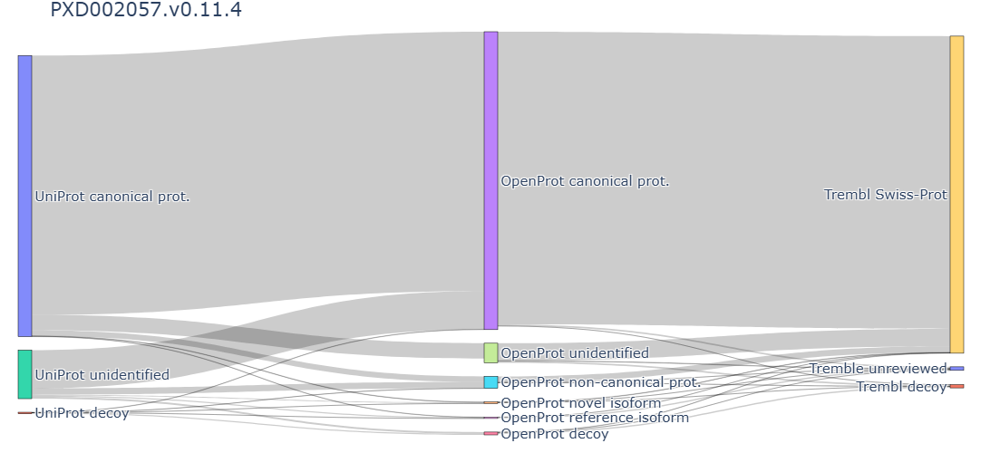

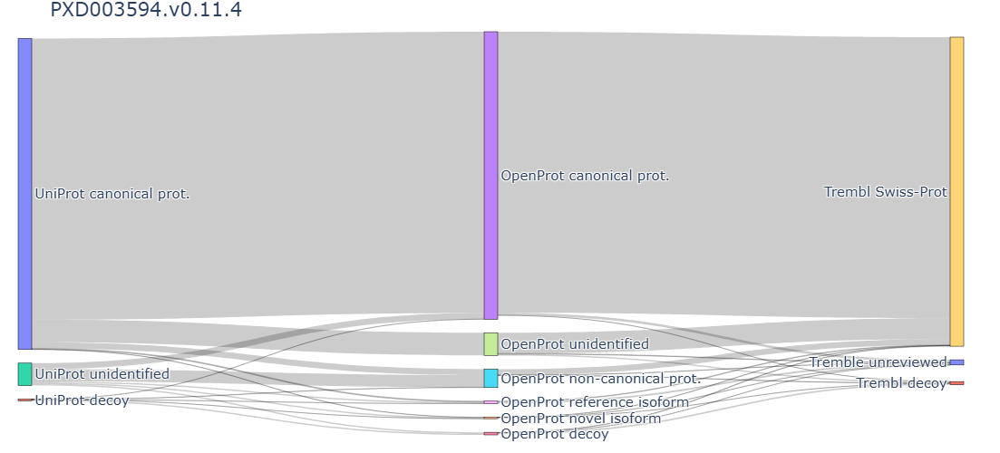

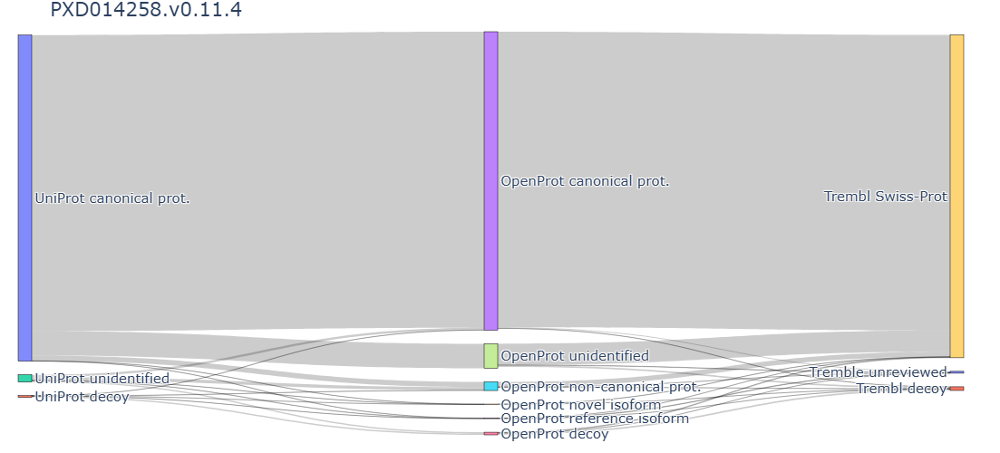

In [261]:
for dataset_name in sankey_all_first_datasets:
    #look at all categories
    #node_colors=["orangered","purple","khaki","yellowgreen","paleturquoise","cornflowerblue","mediumpurple","slategrey"]
    #link_colors=["grey","grey","grey","mistyrose","grey","grey","grey","grey","grey","grey","grey","grey","plum","lightyellow","grey","grey","grey","grey"]
    fig = go.Figure(data=[go.Sankey(
        #textfont={"color":"rgba(0,0,0,0)", "size":1}, #disable to show the text labels
        valueformat = ".f",
        valuesuffix = " spectra fraction",
        node = {
          "pad" : 15,
          "thickness" : 15,
          "line" : {"color": "black", "width": 0.5},
          "label" :  labels_all,
          #"color" :  node_colors
    },
        # Add links
        link = {
           # "arrowlen":15,
          "source" :  source_all,
          "target" : target_all,
          "value" :  sankey_all_first_datasets[dataset_name],
          "label" :  link_label_all,
         # "color" :  link_colors#_rgba
    })])
    
    fig.update_layout(
        title_text=f"{dataset_name}",font_size=10,
        margin={"l":20, "r":40, "t":35, "b":20},font={"size":15},width=1000,height=500,
    )
    #fig.write_image("c.svg")
    fig.show() #something is wrong in order for 3-way sankey

sankey_upop_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combo_upop_first_datasets:
    sankey_values=[]
    mgfspectraN=mgfspectraN_datasets[dataset_name]
    for mgffile in mgfspectraN:
        mgffile=mgffile.replace('.RAW.mgf', '.mgf')
        df=combo_upop_first_datasets[dataset_name]
        df=df.loc[df["spectrum_file"]==mgffile]
        _, _, values=get_senkey_data_UPOPdiff(df,same_diff="both",both_unident_n=0)
        values_norm=np.array(values)/len(df)
        sankey_values.append(values_norm)
    sankey_upop_first_datasets[dataset_name]=np.median(np.array(sankey_values),axis=0)
    #get source1, target1, link_label1 once, as they are the same for each sample | both_unident_n sould be precomputed for all samples, if needed
source, target, _=get_senkey_data_UPOPdiff(df,same_diff="both",both_unident_n=0)
link_label=["" for i in range(len(source))]
labels=["UniProt canonical prot.","UniProt decoy","UniProt unidentified",
       "OpenProt canonical prot.","OpenProt novel isoform","OpenProt non-canonical prot.","OpenProt decoy","OpenProt unidentified","OpenProt reference isoform"]

sankey_upop_plot=np.mean(np.array(list(sankey_upop_first_datasets.values())),axis=0)
sankey_upop_plot

#for putting on the graph
for i,j in enumerate(sankey_upop_plot):
    if i in sel_inds:
        print(j*100)

In [257]:
sankey_optr_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in sankey_optr_first_datasets:
    df_optr=combo_optr_first_datasets[dataset_name]
    source_optr, target_optr, values_optr=get_senkey_data_OPTRdiff(df_optr,same_diff="both",both_unident_n=0)
    sankey_optr_first_datasets[dataset_name]=list(values_optr)

In [258]:
labels_optr=["OpenProt canonical prot.","OpenProt novel isoform","OpenProt non-canonical prot.","OpenProt decoy","OpenProt unidentified","OpenProt reference isoform",
           "Trembl Swiss-Prot", "Tremble unreviewed","Trembl decoy","Trembl undefined"]

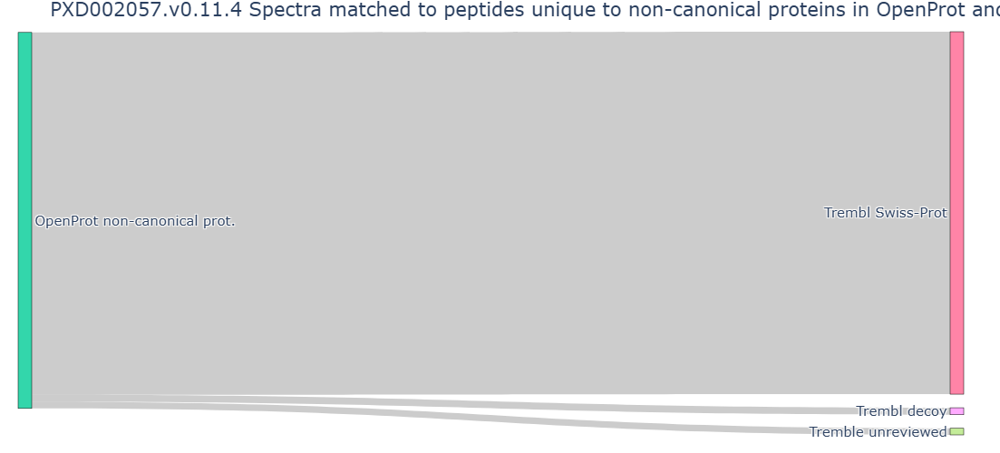

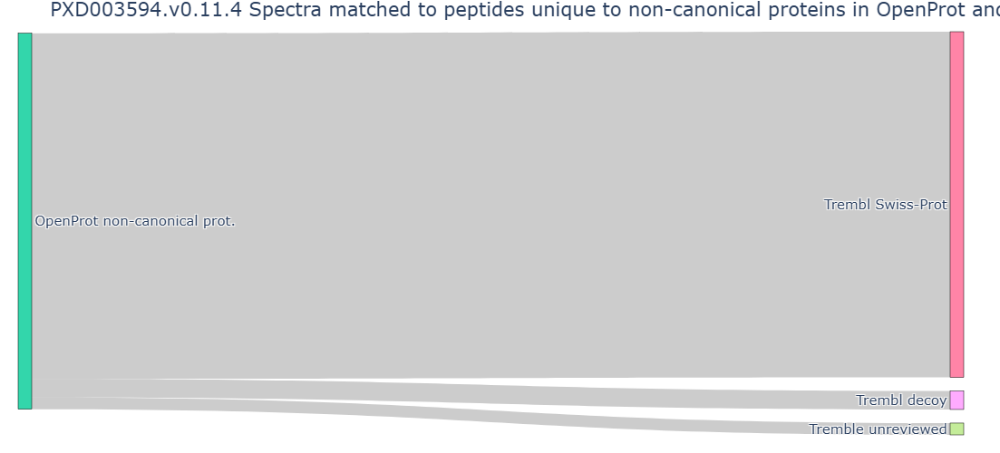

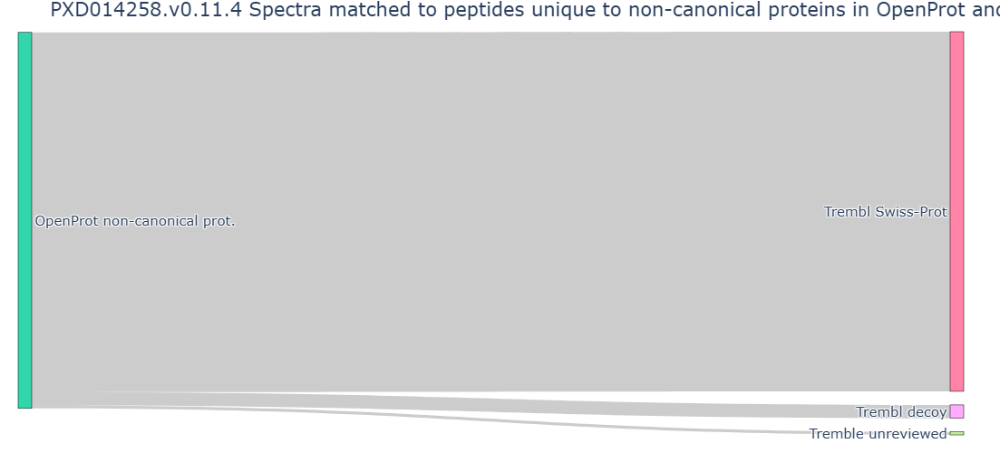

In [259]:
labels_optr=["OpenProt canonical prot.","OpenProt novel isoform","OpenProt non-canonical prot.","OpenProt decoy","OpenProt unidentified","OpenProt reference isoform",
           "Trembl Swiss-Prot", "Tremble unreviewed","Trembl decoy","Trembl undefined"]
for dataset_name in sankey_optr_first_datasets:
    sel_inds=np.array(source_optr)==5
    source1=np.array(source_optr)[sel_inds]-3
    target1=np.array(target_optr)[sel_inds]-3
    values1=np.array(sankey_optr_first_datasets[dataset_name])[sel_inds]
    fig = go.Figure(data=[go.Sankey(
        #textfont={"color":"rgba(0,0,0,0)", "size":1}, #disable to show the text labels
        valueformat = ".f",
        valuesuffix = " spectra fraction",
        node = {
          "pad" : 15,
          "thickness" : 15,
          "line" : {"color": "black", "width": 0.5},
          "label" :  labels_optr,
    },
        # Add links
        link = {
           # "arrowlen":15,
          "source" :  source1,
          "target" : target1,
          "value" :  values1,
    })])
    
    fig.update_layout(
        title_text=f"{dataset_name} Spectra matched to peptides unique to non-canonical proteins in OpenProt and TrEMBL",font_size=10,
        margin={"l":20, "r":40, "t":35, "b":20},font={"size":15},width=500,height=500,
    )
    #fig.write_image("rescued_noncan_sankey.svg")
    fig.show()

#look at all categories
node_colors=["orangered","purple","khaki","yellowgreen","paleturquoise","cornflowerblue","mediumpurple","slategrey"]
link_colors=["grey","grey","grey","mistyrose","grey","grey","grey","grey","grey","grey","grey","grey","plum","lightyellow","grey","grey","grey","grey"]
fig = go.Figure(data=[go.Sankey(
    #textfont={"color":"rgba(0,0,0,0)", "size":1}, #disable to show the text labels
    valueformat = ".f",
    valuesuffix = " spectra fraction",
    node = {
      "pad" : 15,
      "thickness" : 15,
      "line" : {"color": "black", "width": 0.5},
      "label" :  labels,
      "color" :  node_colors
},
    # Add links
    link = {
       # "arrowlen":15,
      "source" :  source,
      "target" : target,
      "value" :  values,
      "label" :  link_label,
      "color" :  link_colors#_rgba
})])

fig.update_layout(
    title_text="Spectra matched to peptides unique to non-canonical proteins in OpenProt and UniProt",font_size=10,
    margin={"l":20, "r":40, "t":35, "b":20},font={"size":15},width=1000,height=500,
)
#fig.write_image("rescued_noncan_sankey.svg")
fig.show()

In [ ]:
#rerun stoped here 16-12-24

In [ ]:
#what are the spectra that go from uniprot canonical to OP undefined? put this percent on senkey plot for talk

In [240]:
#get persent for:
print(f"avarage % of PSMs of non-canon prots{np.median(frqs)}%")
print(f"of thouse canon in UP {round(np.median(switch_canon),2)}")
print(f"of thouse unidetified in UP {round(np.median(switch_unident),2)}")
print(f"of thouse decoy in UP {round(np.median(switch_decoy),2)}")
print(f"avarage % of PSMs switched to non-canon prots from canon in UP {round(np.median(switchPSM_frqs),2)}")

avarage % of PSMs of non-canon prots0.214322892746701%
of thouse canon in UP 47.62
of thouse unidetified in UP 51.51
of thouse decoy in UP 1.57
avarage % of PSMs switched to non-canon prots from canon in UP 2.16


In [238]:
frqs=[]; adsnum=[]; sptitlenoncan={}
for dataset_name in combined_first_datasets:
    sptitlenoncan[dataset_name]={}
    df=combined_first_datasets[dataset_name]["openprot"]
    df=df.loc[df["database"]=="T"]
    a=[];adsnum_a=[]
    for file in set(df.spectrum_file):
        sptitlenoncan[dataset_name][file]=set(df.loc[((df["only altprots"]==True) | (df["only novelisoprots"]==True))&(df["spectrum_file"]==file),"spectrum_title"])
        a.append(len(df.loc[((df["only altprots"]==True) | (df["only novelisoprots"]==True))&(df["spectrum_file"]==file),"spectrum_title"])/len(df))
        adsnum_a.append(len(df.loc[((df["only altprots"]==True) | (df["only novelisoprots"]==True))&(df["spectrum_file"]==file),"spectrum_title"]))
    frqs.append(np.median(a)*100)
    adsnum.append(np.median(adsnum_a))

for i,dataset_name in enumerate(combined_first_datasets):
    print(dataset_name,frqs[i], adsnum[i])

frqs_canon=[]; adsnum_canon=[]; #sptitlenoncan_canon={}
for dataset_name in combined_first_datasets:
    #sptitlenoncan[dataset_name]={}
    df=combined_first_datasets[dataset_name]["openprot"]
    df=df.loc[df["database"]=="T"]
    a=[];adsnum_a=[]
    for file in set(df.spectrum_file):
        #sptitlenoncan[dataset_name][file]=set(df.loc[(df["only altprots"]==True)&(df["spectrum_file"]==file),"spectrum_title"])
        a.append(len(df.loc[(df["only refisoprots"]==False)&(df["only novelisoprots"]==False)&(df["only altprots"]==False)&(df["spectrum_file"]==file),"spectrum_title"])/len(df))
        adsnum_a.append(len(df.loc[(df["only refisoprots"]==False)&(df["only novelisoprots"]==False)&(df["only altprots"]==False)&(df["spectrum_file"]==file),"spectrum_title"]))
    frqs_canon.append(np.median(a)*100)
    adsnum_canon.append(np.median(adsnum_a))
for i,dataset_name in enumerate(combined_first_datasets):
    print(dataset_name,frqs_canon[i], adsnum_canon[i])

a=combined_first_datasets[dataset_name]["openprot"]
len(a.loc[a["database"]=="D"])/len(a)

In [239]:
switchPSM_frqs=[]; switch_canon=[]; switch_decoy=[]; switch_unident=[]
for dataset_name in combined_first_datasets:
    df=combined_first_datasets[dataset_name]["canon"]
    switch_c=[]; switch_d=[]; switch_rest=[] #unident
    switchPSM_frqs_a=[]
    #df=df.loc[df["database"]=="T"]
    for file in set(df.spectrum_file):
        if file in sptitlenoncan[dataset_name].keys():
            b=len(sptitlenoncan[dataset_name][file])
            c=len(df[(df.spectrum_title.isin(list(sptitlenoncan[dataset_name][file])))&(df["database"]=="T")&(df["spectrum_file"]==file)])
            switch_c.append(c/b)
            d=len(df[(df.spectrum_title.isin(list(sptitlenoncan[dataset_name][file])))&(df["database"]=="D")&(df["spectrum_file"]==file)])
            switch_d.append(d/b)
            switch_rest.append((b-c-d)/b)
            switchPSM_frqs_a.append(c/len(df[(df["spectrum_file"]==file)]))
        else:
            switch_c.append(np.nan);switch_d.append(np.nan);switch_rest.append(np.nan)
            switchPSM_frqs_a.append(np.nan)
    switchPSM_frqs.append(np.median(switchPSM_frqs_a)*100)
    switch_canon.append(np.median(switch_c)*100); switch_decoy.append(np.median(switch_d)*100); switch_unident.append(np.median(switch_rest)*100)

### Compare scores of UniProt vs OpenProt PSMs identified in both and uniquely, target

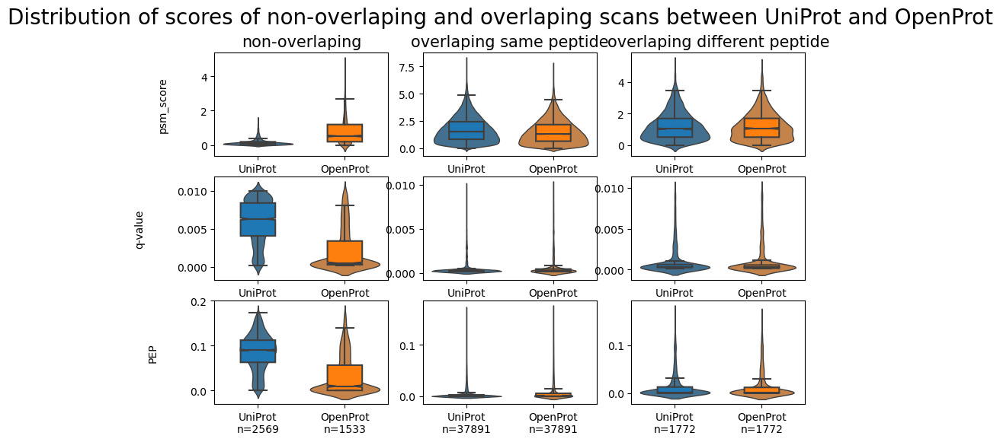

In [604]:
#not UPD!
UPtvsOPt=combo_qfilt.loc[(combo_qfilt["database_canon"]=="T") | (combo_qfilt["database_open"]=="T")]
fig, axes = plt.subplots(3, 3, figsize=(10,6))
fig.suptitle(f'Distribution of scores of non-overlaping and overlaping target PSMs between UniProt and OpenProt',size=20);
for ax, col in zip(axes[0],["non-overlaping","overlaping same peptide","overlaping different peptide"]):
        ax.set_title(col,size=15)
for ax, row in zip(axes[:,0], ["psm_score","q-value","PEP"]):
        ax.set_ylabel(row,labelpad=30)
for j,param in enumerate(["psm_score","q-value","PEP"]):
    max_width=10
    UPtvsOPtuniqUP=UPtvsOPt.loc[(combo_qfilt["database_canon"]=="T") & (combo_qfilt["database_open"].isna())]
    UPtvsOPtuniqOP=UPtvsOPt.loc[(combo_qfilt["database_canon"].isna()) & (combo_qfilt["database_open"]=="T")]
    sns.violinplot(x=[f"UniProt n={len(UPtvsOPtuniqUP)}"]*len(UPtvsOPtuniqUP)+[f"OpenProt n={len(UPtvsOPtuniqOP)}"]*len(UPtvsOPtuniqOP), y=UPtvsOPtuniqUP[f"{param}_canon"].values.tolist()+UPtvsOPtuniqOP[f"{param}_open"].values.tolist(), linewidth=1,ax=axes[j,0], inner=None,saturation=0.5);
    sns.boxplot(x=[f"UniProt n={len(UPtvsOPtuniqUP)}"]*len(UPtvsOPtuniqUP)+[f"OpenProt n={len(UPtvsOPtuniqOP)}"]*len(UPtvsOPtuniqOP), y=UPtvsOPtuniqUP[f"{param}_canon"].values.tolist()+UPtvsOPtuniqOP[f"{param}_open"].values.tolist(), boxprops={'zorder': 2}, ax=axes[j,0], saturation=1, width=0.4,showfliers=False, notch=True)
    axes[j,0].set_xticklabels(textwrap.fill(x.get_text(), max_width) for x in axes[j,0].get_xticklabels())
    
    UPtvsOPtboth_same=combo_qfilt.loc[(combo_qfilt["database_canon"]=="T") & (combo_qfilt["database_open"]=="T") & (combo_qfilt["Same_peptide_canon_open"]==True)]
    sns.violinplot(x=[f"UniProt n={len(UPtvsOPtboth_same)}"]*len(UPtvsOPtboth_same)+[f"OpenProt n={len(UPtvsOPtboth_same)}"]*len(UPtvsOPtboth_same), y=UPtvsOPtboth_same[f"{param}_canon"].values.tolist()+UPtvsOPtboth_same[f"{param}_open"].values.tolist(), linewidth=1,ax=axes[j,1], inner=None,saturation=0.5);
    sns.boxplot(x=[f"UniProt n={len(UPtvsOPtboth_same)}"]*len(UPtvsOPtboth_same)+[f"OpenProt n={len(UPtvsOPtboth_same)}"]*len(UPtvsOPtboth_same), y=UPtvsOPtboth_same[f"{param}_canon"].values.tolist()+UPtvsOPtboth_same[f"{param}_open"].values.tolist(), boxprops={'zorder': 2}, ax=axes[j,1], saturation=1, width=0.4,showfliers=False, notch=True)
    axes[j,1].set_xticklabels(textwrap.fill(x.get_text(), max_width) for x in axes[j,1].get_xticklabels())
    
    UPtvsOPtboth_diff=combo_qfilt.loc[(combo_qfilt["database_canon"]=="T") & (combo_qfilt["database_open"]=="T") & (combo_qfilt["Same_peptide_canon_open"]==False)]
    sns.violinplot(x=[f"UniProt n={len(UPtvsOPtboth_diff)}"]*len(UPtvsOPtboth_diff)+[f"OpenProt n={len(UPtvsOPtboth_diff)}"]*len(UPtvsOPtboth_diff), y=UPtvsOPtboth_diff[f"{param}_canon"].values.tolist()+UPtvsOPtboth_diff[f"{param}_open"].values.tolist(), linewidth=1,ax=axes[j,2], inner=None,saturation=0.5);
    sns.boxplot(x=[f"UniProt n={len(UPtvsOPtboth_diff)}"]*len(UPtvsOPtboth_diff)+[f"OpenProt n={len(UPtvsOPtboth_diff)}"]*len(UPtvsOPtboth_diff), y=UPtvsOPtboth_diff[f"{param}_canon"].values.tolist()+UPtvsOPtboth_diff[f"{param}_open"].values.tolist(), boxprops={'zorder': 2}, ax=axes[j,2], saturation=1, width=0.4,showfliers=False, notch=True)
    axes[j,2].set_xticklabels(textwrap.fill(x.get_text(), max_width) for x in axes[j,2].get_xticklabels());

### Scores for PSMs canonical in UniProt and unique to non-canonical in OpenProt 

In [ ]:
#sankey plot by modification: OP unmod - UP mod - not UPD

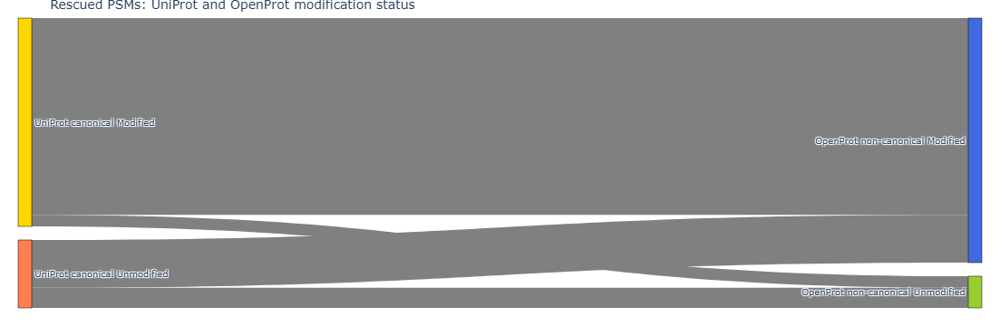

In [746]:
#not UPD
labels=["UniProt canonical Unmodified","UniProt canonical Modified",
     "OpenProt non-canonical Unmodified","OpenProt non-canonical Modified"]
source=[0,0,1,1]
target=[2,3,2,3]
link_label=["" for i in range(len(source))]
node_colors=["coral","gold","yellowgreen","royalblue"]
values=[len(Upcanon_OPalt[(Upcanon_OPalt["modifications_canon"]=="Unmodified") & (Upcanon_OPalt["modifications_open"]=="Unmodified")]),
       len(Upcanon_OPalt[(Upcanon_OPalt["modifications_canon"]=="Unmodified") & (Upcanon_OPalt["modifications_open"]!="Unmodified")]),
           len(Upcanon_OPalt[(Upcanon_OPalt["modifications_canon"]!="Unmodified") & (Upcanon_OPalt["modifications_open"]=="Unmodified")]),
               len(Upcanon_OPalt[(Upcanon_OPalt["modifications_canon"]!="Unmodified") & (Upcanon_OPalt["modifications_open"]!="Unmodified")])]
opacity = 0.4
fig = go.Figure(data=[go.Sankey(
    valueformat = ".0f",
    valuesuffix = " spectra",
    # Define nodes
    node = dict(
      pad = 15,
      thickness = 15,
      line = dict(color = "black", width = 0.5),
      label =  labels,
      color =  node_colors
    ),
    # Add links
    link = dict(
      source =  source,
      target = target,
      value =  values,
      label =  link_label,
      color =  "grey"
))])

#fig.update_layout(title_text="Energy forecast for 2050<br>Source: Department of Energy & Climate Change, Tom Counsell via <a href='https://bost.ocks.org/mike/sankey/'>Mike Bostock</a>",
#                  font_size=10)
fig.update_layout(
    title_text="Rescued PSMs: UniProt and OpenProt modification status",font_size=10,
    margin=dict(l=20, r=20, t=20, b=20),
)
fig.show()

### How many rescued PSMs have small difference between UniProt and OpenProt match

def get_aadiff_rescued(df):
    '''This function calculates how many different amino acids are 
    between UniProt and OpenProt same spectra assigned to non-canonical protein in OpenProt search.
    The output is stored in df column "pep diff". it counts up to 10 aa difference, 11- is notation of >10
    
    df - combo of UP and OP where OP is only altprot (q filtered)
    '''
    df["pep diff"]=np.nan
    for i,row in df.iterrows():
        if all(row.isna()): continue
        dat_pep_UP,dat_pep_OP=row[["matched_peptide_canon","matched_peptide_open"]].values.tolist()
        #print(i,dat_pep_UP,dat_pep_OP)
        m=regex.findall(dat_pep_UP, dat_pep_OP)
        if len(m)!=0:
            df.loc[i,"pep diff"]=1
        else:
            j=1
            while len(m)==0 and j<11:
                j+=1
                m=regex.findall(f"({dat_pep_UP}){{s<={j}}}", dat_pep_OP)            
            df.loc[i,"pep diff"]=j
    return df

#2 values: N of psm with up to 2 aa diff unmodified or 1 of them is modified, other
aa2mod1_upopalt_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combo_upop_first_datasets:
    cat=[]
    mgfspectraN=mgfspectraN_datasets[dataset_name]
    for mgffile in mgfspectraN:
        #print(mgffile)
        mgffile=mgffile.replace('.RAW.mgf', '.mgf')
        df=combo_upop_first_datasets[dataset_name]
        dfalt=df.loc[(df["spectrum_file"]==mgffile) & (df["database_canon"]=="T") & (df["database_open"]=="T") & (df["only altprots"]==True),]
        a=get_aadiff_rescued(dfalt)
        b=len(a.loc[(a["pep diff"]<=2) & (((a["modifications_canon"]=="Unmodified") & (a["modifications_open"]=="Unmodified")) | ((a["modifications_canon"]!="Unmodified") | (a["modifications_open"]!="Unmodified")))])
        cat.append([b,len(dfalt)-b])
    aa2mod1_upopalt_first_datasets[dataset_name]=np.median(np.array(cat),axis=0)

sizes=np.mean(list(aa2mod1_upopalt_first_datasets.values()),axis=0)
labels=["<=2 amino acid difference, at least one PSM is unmodified",""]
fig, ax = plt.subplots()
ax.pie(sizes, labels=labels, autopct='%1.1f%%',startangle=-90,colors=["cornflowerblue","powderblue"], textprops={'fontsize': 14});
#plt.savefig("aa2mod1_pie.svg")

### Intensity correlation of rescued PSMs in UniProt and OpenProt match

### How many PSMs corespond to unique peptide of non-canonical proteins

In [258]:
def get_npsm_perpep_noncanon(df):
    '''df is q filtered op first'''
    op_alt_psmperpep=[]
    for name, group in df[((df["only altprots"]==True) | (df["only novelisoprots"]==True)) & (df["database"]=="T")].groupby("matched_peptide"):
        op_alt_psmperpep.append(len(group))
    return op_alt_psmperpep

In [259]:
op_alt_psmperpep_first_datasets={"PXD002057.v0.11.4":0,"PXD003594.v0.11.4":0,"PXD014258.v0.11.4":0}
for dataset_name in combined_first_datasets:
    df=combined_first_datasets[dataset_name]["openprot"]
    #df=df[((df["only altprots"]==True) | (df["only novelisoprots"]==True)) & (df["database"]=="T")]
    op_alt_psmperpep_first_datasets[dataset_name]=get_npsm_perpep_noncanon(df)

In [260]:
a=combined_first_datasets["PXD003594.v0.11.4"]["openprot"]
a=a[((a["only altprots"]==True) | (a["only novelisoprots"]==True)) & (a["database"]=="T")]
for name, group in a.groupby("matched_peptide"):
    if len(group)>100:
        print(name,group.leadprot.iloc[0])

GSGPVYISGQHLVSVEEDAESEDEEEEDVK IP_704362
MQSVDEEEEDVKLLSISGK IP_592088
SVEMHHEALSEVLPGDNVGFNVK IP_612790


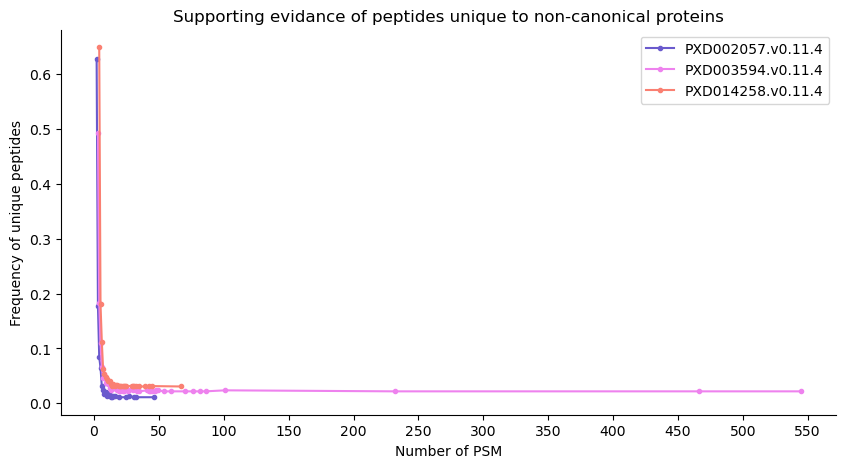

In [261]:
c=["slateblue","violet","salmon"]
plt.figure(figsize=(10,5))
for i,(dataset_name,op_alt_psmperpep) in enumerate(op_alt_psmperpep_first_datasets.items()):
    a=Counter(op_alt_psmperpep)
    a={k: v/np.sum(list(a.values())) for k, v in sorted(a.items(), key=lambda item: item[0], reverse=False)}
    plt.plot(np.array(list(a.keys()))+1*(i+1), np.array(list(a.values()))+0.01*(i+1), '-o', markersize=3,label=dataset_name,color=c[i])
plt.xticks(range(0,600,50),fontsize=10);
#plt.xlim(0,75)
plt.xlabel("Number of PSM");
plt.ylabel("Frequency of unique peptides");
plt.title("Supporting evidance of peptides unique to non-canonical proteins");
for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
#plt.savefig("psmperpep_upopalt_lineplot.svg")
plt.legend();

### MS score for uniquely identified non-canonical proteins (not in protein group)

In [2288]:
OPtsv16="./human-openprot-r1_6-refprots+altprots+isoforms-+uniprot2019_03_01.tsv"
OPtsv16_df=pd.read_csv(OPtsv16,sep="\t")
#leave just Ensembl accessions
OP16ens_df=OPtsv16_df[OPtsv16_df['transcript accession'].astype("str").apply(lambda x: "ENST" in x)]
#create a column with stable trx accession
OP16ens_df["trx_stab"]=OP16ens_df['transcript accession'].str[0:15]

/tmp/ipykernel_843797/1458480390.py:2: DtypeWarning:

Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.



In [129]:
def get_noncanon_prots_msscore(df,OPdf):
    OPnoncan_MSscore=[]
    for prot in set(df["leadprot"].values.tolist()):
        try:
            OPnoncan_MSscore.append(OPdf.loc[OPdf["protein accession numbers"]==prot,"MS score"].values[0])
        except IndexError:
            if True in set(list(OPdf["protein accession (others)"].str.contains(prot).dropna())):
                OPnoncan_MSscore.append(OPdf.loc[OPdf["protein accession (others)"].str.contains(prot).dropna(),"MS score"].values[0])
            else:
                OPnoncan_MSscore.append(np.nan)
    OPnoncan_altprot_MSscore_count=[]#{"0":0,"1-2": 0, "3+": 0,"na":0}
    for i in OPnoncan_MSscore:
        if i==0:
            OPnoncan_altprot_MSscore_count.append(0)
            #OPnoncan_altprot_MSscore_count["0"]=OPnoncan_altprot_MSscore_count["0"]+1
        elif i>0 and i<=2:
            OPnoncan_altprot_MSscore_count.append(2)
            #OPnoncan_altprot_MSscore_count["1-2"]=OPnoncan_altprot_MSscore_count["1-2"]+1
        elif i>2:
            OPnoncan_altprot_MSscore_count.append(3)
            #OPnoncan_altprot_MSscore_count["3+"]=OPnoncan_altprot_MSscore_count["3+"]+1
        else:
            OPnoncan_altprot_MSscore_count.append(np.nan)
            #OPnoncan_altprot_MSscore_count["na"]=OPnoncan_altprot_MSscore_count["na"]+1
    return OPnoncan_altprot_MSscore_count

In [262]:
#add filter for >1 psm
#here is sould be only proteins, no protein groups
dfs=pd.DataFrame()
for dataset_name in combined_first_datasets:
    df=combined_first_datasets[dataset_name]["openprot"]
    df=df.loc[(df["database"]=="T") & ((df["only altprots"]==True) | (df["only novelisoprots"]==True))]
    df = df.iloc[[i for i,k in enumerate(df['proteins'].values.tolist()) if "||" in k],]
    #add filter for >1 psm
    df = df.groupby('leadprot').filter(lambda x: len(x) > 1)
    dfs=pd.concat([dfs,df])
altmsscore=get_noncanon_prots_msscore(dfs,OP16ens_df)

In [263]:
altmsscore_bar=Counter(altmsscore)
altmsscore_bar=[altmsscore_bar[k] for k in [0,2,3,np.nan]]

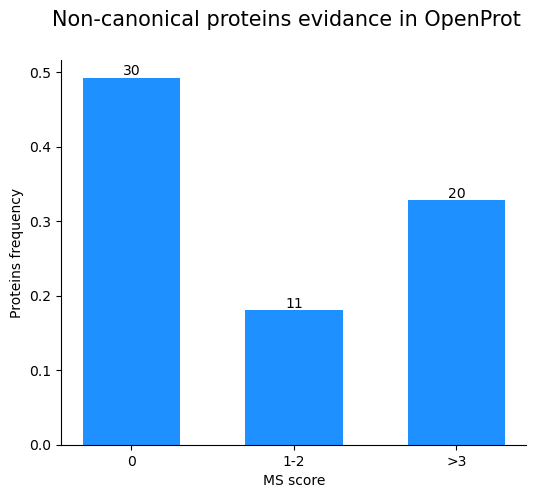

In [264]:
fig,ax=plt.subplots(1,figsize=(6,5))
fig.suptitle('Non-canonical proteins evidance in OpenProt', fontsize=15)
bar3=ax.bar(["0","1-2", ">3"],[i/np.sum(altmsscore_bar[:3]) for i in altmsscore_bar[:3]], color ='dodgerblue', width = 0.6)
ax.set_xlabel("MS score")
ax.set_ylabel("Proteins frequency")
for rect,v in zip(bar3,altmsscore_bar[:3]):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2.0, height, f'{v:.0f}', ha='center', va='bottom')
for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
#plt.savefig("altmsscore_bar.svg")

### Ensemble biotype and OpenProt localisation of uniquely identified non-canonical proteins

In [2291]:
#biotype Ens 106 , localisation
ENS106_file="mart106_export.txt"
#with gzip.open(f"{ENS106_file}.gz", 'rb') as f_in:
#    with open(ENS106_fil>e, 'wb') as f_out:
#        shutil.copyfileobj(f_in, f_out)

In [2292]:
ENS106=pd.read_csv(ENS106_file,sep="\t")

In [141]:
ENS106.columns

Index(['Gene stable ID', 'Transcript stable ID', 'Gene description',
       'Gene name', 'Gene type', 'Transcript type'],
      dtype='object')

In [142]:
#be aware, not all alts are predicted from ensembl
#so here use op filtered on ensembl
def get_noncanon_biotype_loc(df,ENS,OPens):
    op_alt_biotype=[];op_alt_loc=[]
    for prot in set(df["leadprot"].values.tolist()):
        #print(prot)
        try:
            trx=OPens.loc[OPens["protein accession numbers"]==prot,"transcript accession"].values[0]
            op_alt_biotype.append(ENS.loc[ENS["Transcript stable ID"]==trx[0:15],'Gene type'].values[0])
            op_alt_loc.append(OPens.loc[OPens["protein accession numbers"]==prot,"localization"].values[0])
        except:
            print(prot)
            a=[]
            for i in OPens["protein accession (others)"]:
                if not isinstance(i,str):
                    a.append(False)
                else:
                    if prot in i:
                        a.append(True)
                    else:
                        a.append(False)
            if any(a):
                trx=OPens.loc[a,"transcript accession"].values[0]
                prots=OPens.loc[a,"protein accession (others)"].values[0]
                if trx[0:15] in ENS["Transcript stable ID"].values.tolist():
                    op_alt_biotype.append(ENS.loc[ENS["Transcript stable ID"]==trx[0:15],'Gene type'].values[0])
                    op_alt_loc.append(OPens.loc[OPens["protein accession (others)"]==prots,"localization"].values[0])
                else:
                    for trx in OPens.loc[a,"transcript accession"].values:
                        if trx[0:15] in ENS["Transcript stable ID"].values.tolist():
                            op_alt_biotype.append(ENS.loc[ENS["Transcript stable ID"]==trx[0:15],'Gene type'].values[0])
                            op_alt_loc.append(OPens.loc[OPens["protein accession (others)"]==prots,"localization"].values[0])
                            break
            else:
                op_alt_biotype.append(np.nan)
                op_alt_loc.append(np.nan)
    return op_alt_biotype, op_alt_loc

In [265]:
dfs=pd.DataFrame()
for dataset_name in combined_first_datasets:
    df=combined_first_datasets[dataset_name]["openprot"]
    df=df.loc[(df["database"]=="T") & ((df["only altprots"]==True) | (df["only novelisoprots"]==True))]
    df = df.iloc[[i for i,k in enumerate(df['proteins'].values.tolist()) if "||" in k],]
    #add filter for >1 psm
    df = df.groupby('leadprot').filter(lambda x: len(x) > 1)
    dfs=pd.concat([dfs,df])
altbiotype,altloc=get_noncanon_biotype_loc(dfs,ENS106,OP16ens_df)

II_3765263
IP_610387
II_305021
IP_147672


In [266]:
a=pd.DataFrame({"MS":altmsscore,"biotype":altbiotype,"loc":altloc})

In [267]:
a.biotype.replace(to_replace="processed_pseudogene", value="pseudogene",inplace=True)
a.biotype.replace(to_replace="transcribed_processed_pseudogene", value="pseudogene",inplace=True)
a.biotype.replace(to_replace="transcribed_unitary_pseudogene", value="pseudogene",inplace=True)
a.biotype.replace(to_replace="transcribed_unprocessed_pseudogene", value="pseudogene",inplace=True)
a.biotype.replace(to_replace="unprocessed_pseudogene", value="pseudogene",inplace=True)
a.biotype.replace(to_replace="TEC", value="protein_coding",inplace=True)

In [268]:
a.dropna(subset=["MS"],inplace=True)

In [147]:
set(a.biotype)

{'lncRNA', 'protein_coding', 'pseudogene'}

In [149]:
len(a),np.sum(altmsscore_bar[:3]) #probably the hight was lost because of many devisions?

(61, 61)

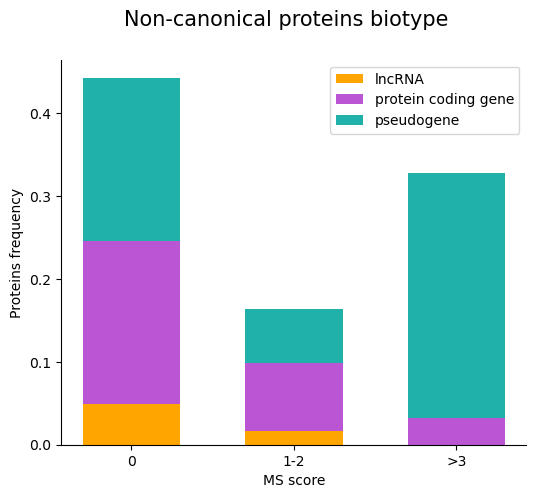

In [269]:
fig,ax=plt.subplots(1,figsize=(6,5))
fig.suptitle('Non-canonical proteins biotype', fontsize=15)
x = ['0', '1-2', '>3']
t="lncRNA"
lncrna = [len(a.loc[(a["MS"]==0) & (a["biotype"]==t)])/len(a), len(a.loc[(a["MS"]==2) & (a["biotype"]==t)])/len(a), len(a.loc[(a["MS"]==3) & (a["biotype"]==t)])/len(a)]
t='protein_coding'
protcod = [len(a.loc[(a["MS"]==0) & (a["biotype"]==t)])/len(a), len(a.loc[(a["MS"]==2) & (a["biotype"]==t)])/len(a), len(a.loc[(a["MS"]==3) & (a["biotype"]==t)])/len(a)]
t='pseudogene'
psdg = [len(a.loc[(a["MS"]==0) & (a["biotype"]==t)])/len(a), len(a.loc[(a["MS"]==2) & (a["biotype"]==t)])/len(a), len(a.loc[(a["MS"]==3) & (a["biotype"]==t)])/len(a)]

# plot bars in stack manner
ax.bar(x, lncrna, color='orange',width=0.6,label="lncRNA")
ax.bar(x, protcod, bottom=lncrna, color='mediumorchid',width=0.6,label="protein coding gene")
ax.bar(x, psdg, bottom=protcod, color='lightseagreen',width=0.6, label="pseudogene")

ax.set_xlabel("MS score")
ax.set_ylabel("Proteins frequency")
ax.legend()
for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
#plt.savefig("altbiotype_bar.svg")

In [151]:
set(a["loc"])

{'-', "3'UTR", 'CDS'}

In [270]:
#fraction of psdg in non-cad regions
t="-"
[len(a.loc[(a["MS"]==0) & (a["loc"]==t) & (a["biotype"]=="pseudogene")])/len(a), len(a.loc[(a["MS"]==2) & (a["loc"]==t)  & (a["biotype"]=="pseudogene")])/len(a), len(a.loc[(a["MS"]==3) & (a["loc"]==t)  & (a["biotype"]=="pseudogene")])/len(a)]

[0.19672131147540983, 0.06557377049180328, 0.29508196721311475]

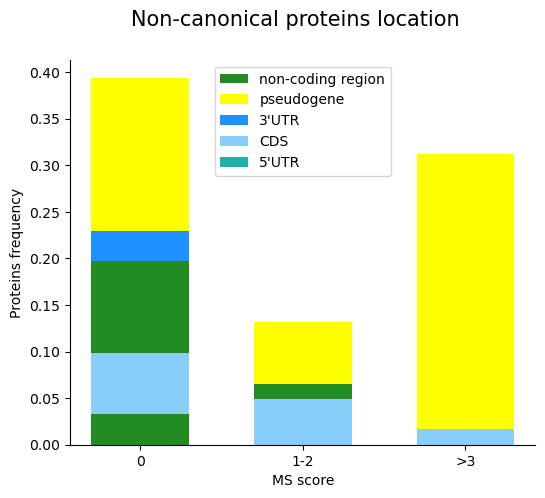

In [271]:
fig,ax=plt.subplots(1,figsize=(6,5))
fig.suptitle('Non-canonical proteins location', fontsize=15)
x = ['0', '1-2', '>3']
t="-"
noncod = [len(a.loc[(a["MS"]==0) & (a["loc"]==t)  & (a["biotype"]!="pseudogene")])/len(a), len(a.loc[(a["MS"]==2) & (a["loc"]==t)   & (a["biotype"]!="pseudogene")])/len(a), len(a.loc[(a["MS"]==3) & (a["loc"]==t)   & (a["biotype"]!="pseudogene")])/len(a)]
psdgloc = [len(a.loc[(a["MS"]==0) & (a["loc"]==t)  & (a["biotype"]=="pseudogene")])/len(a), len(a.loc[(a["MS"]==2) & (a["loc"]==t)   & (a["biotype"]=="pseudogene")])/len(a), len(a.loc[(a["MS"]==3) & (a["loc"]==t)   & (a["biotype"]=="pseudogene")])/len(a)]
t="3'UTR"
utr3 = [len(a.loc[(a["MS"]==0) & (a["loc"]==t)])/len(a), len(a.loc[(a["MS"]==2) & (a["loc"]==t)])/len(a), len(a.loc[(a["MS"]==3) & (a["loc"]==t)])/len(a)]
t='CDS'
cds = [len(a.loc[(a["MS"]==0) & (a["loc"]==t)])/len(a), len(a.loc[(a["MS"]==2) & (a["loc"]==t)])/len(a), len(a.loc[(a["MS"]==3) & (a["loc"]==t)])/len(a)]
t="5'UTR"
utr5 = [len(a.loc[(a["MS"]==0) & (a["loc"]==t)])/len(a), len(a.loc[(a["MS"]==2) & (a["loc"]==t)])/len(a), len(a.loc[(a["MS"]==3) & (a["loc"]==t)])/len(a)]

# plot bars in stack manner
ax.bar(x, noncod, color='forestgreen',width=0.6,label="non-coding region")
ax.bar(x, psdgloc, bottom=noncod, color='yellow',width=0.6,label="pseudogene")
ax.bar(x, utr3, bottom=psdgloc, color='dodgerblue',width=0.6,label="3'UTR")
ax.bar(x, cds, bottom=utr3, color='lightskyblue',width=0.6, label="CDS")
ax.bar(x, utr5, bottom=cds, color='lightseagreen',width=0.6, label="5'UTR")

ax.set_xlabel("MS score")
ax.set_ylabel("Proteins frequency")
ax.legend()
for i,spine in enumerate(plt.gca().spines.values()):
    if i==1 or i==3:
        spine.set_visible(False)
#plt.savefig("altlocation_bar.svg")